In [4]:
import os
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
from ms2query.utils import load_pickled_file

# General file locations
data_folder = "C:/Users/jonge094/PycharmProjects/PhD_MS2Query/ms2query/data"
benchmarking_results_folder = os.path.join(data_folder, "libraries_and_models/gnps_15_12_2021/benchmarking")
library_folder = os.path.join(data_folder, "libraries_and_models/gnps_15_12_2021/")

In [5]:
# Load in general files:
tanimoto_scores_file_name = os.path.join(library_folder, "in_between_files/GNPS_15_12_2021_pos_tanimoto_scores.pickle")
sqlite_file_location = os.path.join(library_folder, "library_gnps_15_12/library_GNPS_15_12_2021.sqlite")

test_spectra_250 = load_pickled_file(os.path.join(library_folder,
                                                   "in_between_files/GNPS_15_12_2021_pos_test_250_inchikeys.pickle"))

# Load in predictions:
df_results_ms2query = pd.read_csv(os.path.join(benchmarking_results_folder, "GNPS_15_12_2021_pos_test_250_inchikeys.csv"))

# convert to list with tuple format and add spectrum objects
results_ms2query_250 = [(x[0], x[1], test_spectra_250[x[2]-1]) for x in df_results_ms2query[["spectrum_ids", "ms2query_model_prediction", "query_spectrum_nr"]].to_numpy()]


In [6]:
from ms2query.query_from_sqlite_database import get_metadata_from_sqlite
from tqdm.notebook import tqdm
 

def select_best_match_and_calculate_tanimoto_score(tanimoto_scores_file, best_matches, sqlite_file_location):
    """Returns a list with a tuple(best_match_spectrum_id, best_match_score, tanimoto_score)
    
    best_matches:
        List with tuples, first value is the highest scoring spectum_id and second value is the score (e.g. ms2ds, cos, or ms2query), third value are the test spectra
    """
    best_match_and_tanimoto = []
    tanimoto_scores = load_pickled_file(tanimoto_scores_file)
    for best_match_spectrum_id, predicted_score, test_spectrum in tqdm(best_matches):
        test_spectrum_inchikey = test_spectrum.get("inchikey")[:14]
        best_match_inchikey = get_metadata_from_sqlite(sqlite_file_location, [best_match_spectrum_id], "spectrumid")[best_match_spectrum_id]["inchikey"][:14]
        tanimoto_score = tanimoto_scores.loc[best_match_inchikey, test_spectrum_inchikey]
        
        best_match_and_tanimoto.append((best_match_spectrum_id, predicted_score, tanimoto_score, test_spectrum))
    return best_match_and_tanimoto

In [7]:
results_ms2query_250 = select_best_match_and_calculate_tanimoto_score(tanimoto_scores_file_name, results_ms2query_250, sqlite_file_location)

  0%|          | 0/2984 [00:00<?, ?it/s]

In [9]:
from rdkit import Chem
from rdkit.Chem import Draw
from matplotlib import pyplot as plt

def plot_molecule(smiles_string):
    molecule = Chem.MolFromSmiles(smiles_string)
    fig = Draw.MolToMPL(molecule)
    plt.axis('off')
    plt.show()
    
def plot_illustrative_mass_spectrum(spectrum, x_min, x_max):
    x = spectrum.peaks.mz
    y = spectrum.peaks.intensities
    fig, ax = plt.subplots()
    ax.bar(x, y)
    fig.patch.set_visible(False)
    ax.spines["top"].set_visible(False)
    ax.spines["left"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
    ax.set_xlim(x_min, x_max)
    ax.set_ylim(0,1.05)
    plt.show()


tanimoto: 0.9922630560928434
MS2Query: 0.7171
CC1OC(CN(C(C(NC(C(NC(C(NC(/C(NC(C(NC(C(NC(C1NC(C(NC(CC(CCCCCCCCCC)=O)=O)CS(O)(=O)=O)=O)=O)CO)=O)CN)=O)=C/C)=O)C(C)C)=O)CO)=O)CCCCN)=O)C)=O


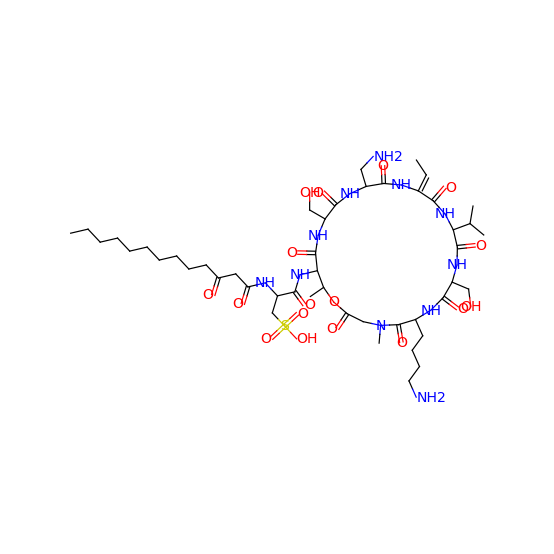

CCCCCC(C)CCCCCCCCC(=O)CC(=O)NC(CS(=O)(=O)O)C(=O)NC1C(OC(=O)CN(C(=O)C(NC(=O)C(NC(=O)C(NC(=O)/C(=C/C)/NC(=O)C(NC(=O)C(NC1=O)CO)CN)C(C)C)CO)CCCCN)C)C


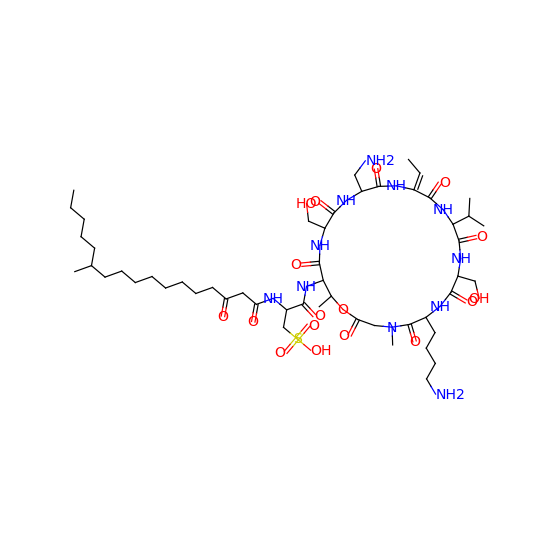

tanimoto: 0.9351687388987566
MS2Query: 0.8891
COc1ccc(cc1OC)c2oc3c(OC)c(OC)c(OC)c(O)c3c(=O)c2OC


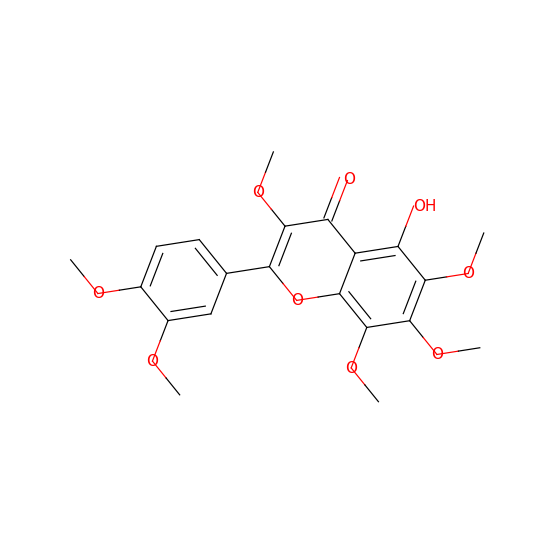

O=C1C2=C(O)C(OC)=C(OC)C=C2OC(C3=CC(OC)=C(OC)C(OC)=C3)=C1OC


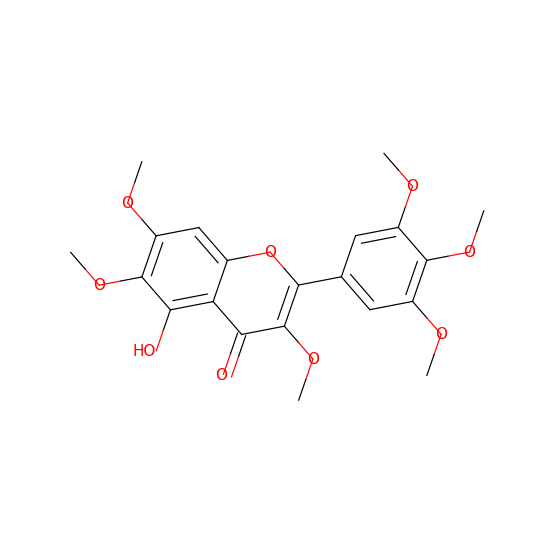

tanimoto: 0.9899091826437941
MS2Query: 0.8487
[H][C@]12[C@]3([H])C=C(CO)C[C@]4([H])C(C(C)=C[C@@]4([H])[C@@]3(O)[C@H](C)[C@@H](OC(/C=C\C=C\C=C\CCC)=O)[C@@]1(OC(C(C)C)=O)C2(C)C)=O


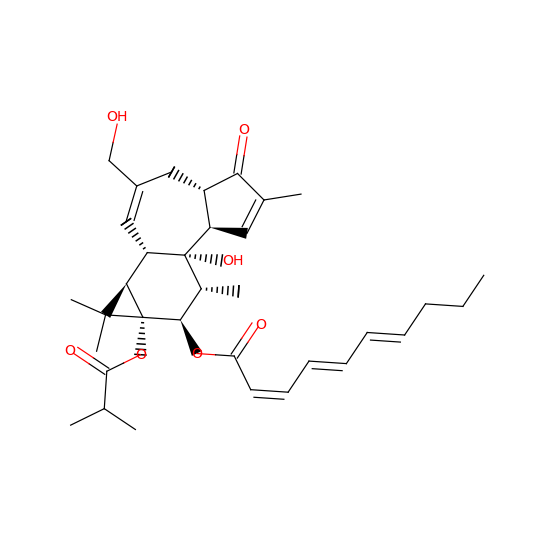

[H][C@]12[C@]3([H])C=C(CO)C[C@]4([H])C(C(C)=C[C@@]4([H])[C@@]3(O)[C@H](C)[C@@H](OC(/C=C\C=C\C/C=C\CC)=O)[C@@]1(OC(C(C)C)=O)C2(C)C)=O


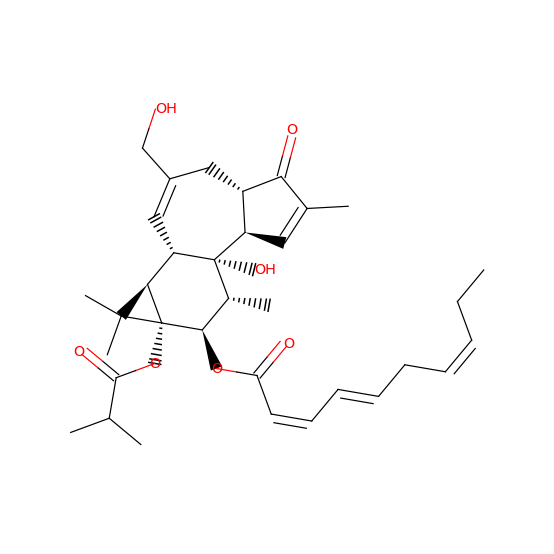

tanimoto: 0.9180651530108588
MS2Query: 0.8808
COc1c(O)cc2oc(-c3ccc(O)cc3)c(OC)c(=O)c2c1O


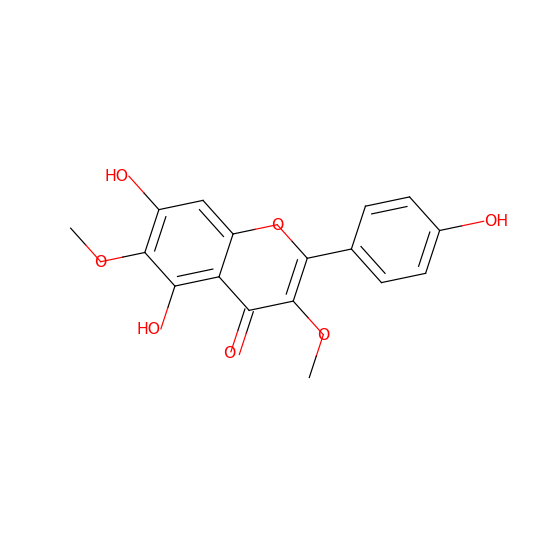

OC1=C(OC)C=CC(C2=C(OC)C(C3=C(O)C=C(O)C=C3O2)=O)=C1


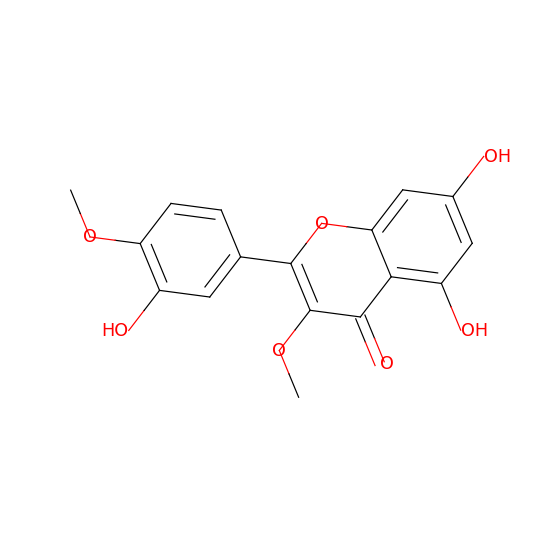

tanimoto: 0.9813486370157819
MS2Query: 0.801
CCCCCCCCCCCC(CC(=O)NC(CC(C)C)C(=O)N[C@H]1[C@@H](OC(=O)C(NC(=O)C(NC(=O)[C@@H](NC(=O)[C@H](NC1=O)CO)[C@H](C)O)CC(C)C)CC(C)C)C)O


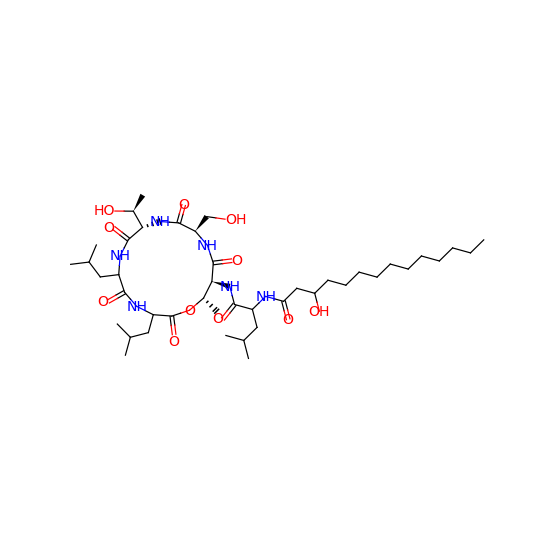

CCCCCC/C=C\CCCCCC(CC(=O)NC(CC(C)C)C(=O)N[C@H]1[C@@H](OC(=O)C(NC(=O)C(NC(=O)[C@@H](NC(=O)[C@H](NC1=O)CO)[C@H](C)O)CC(C)C)CC(C)C)C)O


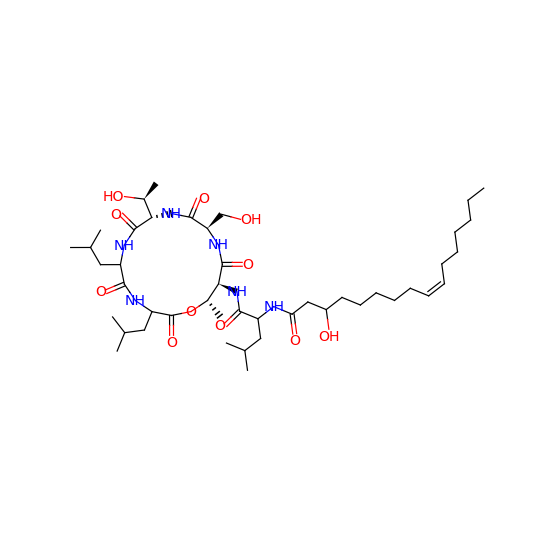

tanimoto: 0.9698996655518395
MS2Query: 0.8551
CC(C)C[C@H](NC(=O)N1CC(=O)Nc2ccccc12)C(=O)N[C@@H](Cc3c[nH]c4ccccc34)C(=O)O


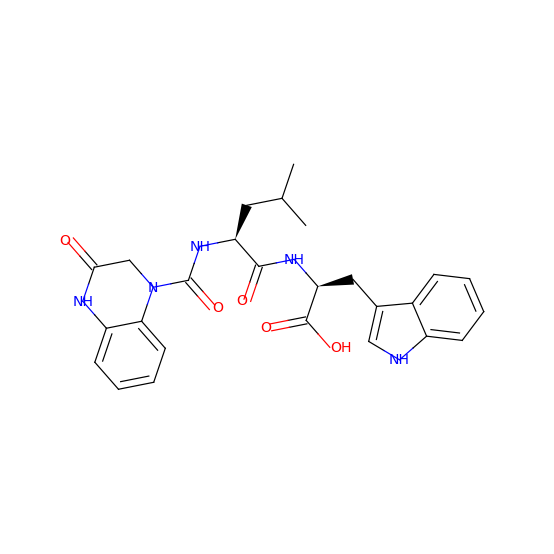

CCC(C)[C@H](NC(=O)N1CC(=O)Nc2ccccc12)C(=O)N[C@@H](Cc3c[nH]c4ccccc34)C(=O)O


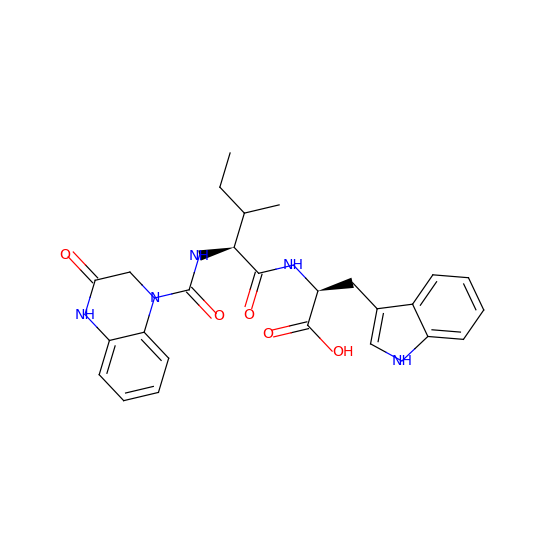

tanimoto: 0.9342465753424658
MS2Query: 0.8525
O=C(CCC(=O)N1C[C@@H]2CC(C1)c3cccc(=O)n3C2)NCCc4ccccc4


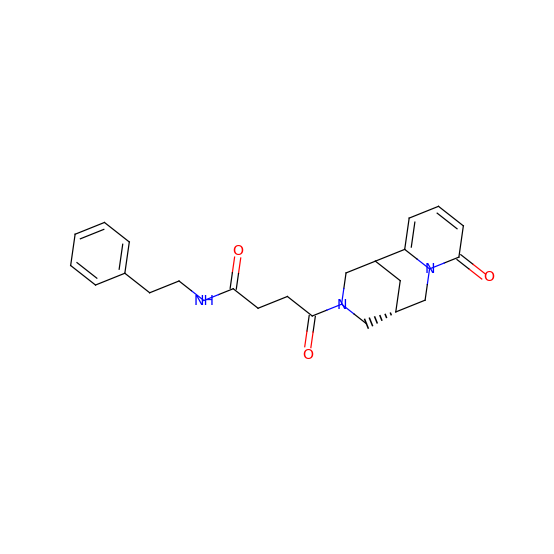

C[C@H](NC(=O)CCC(=O)N1C[C@H]2C[C@H](C1)c3cccc(=O)n3C2)c4ccccc4


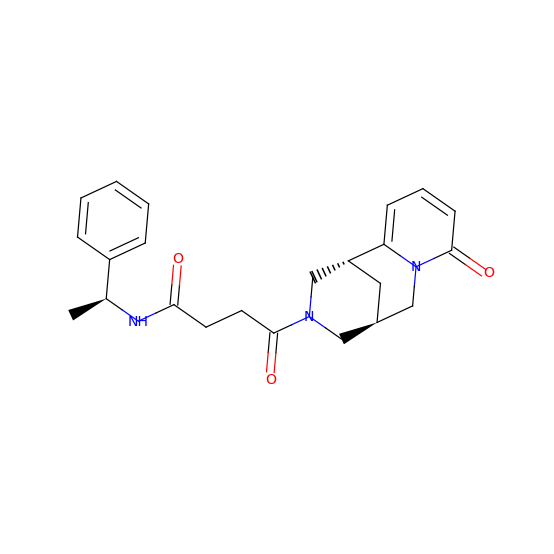

tanimoto: 0.9698996655518395
MS2Query: 0.8551
CC(C)C[C@H](NC(=O)N1CC(=O)Nc2ccccc12)C(=O)N[C@@H](Cc3c[nH]c4ccccc34)C(=O)O


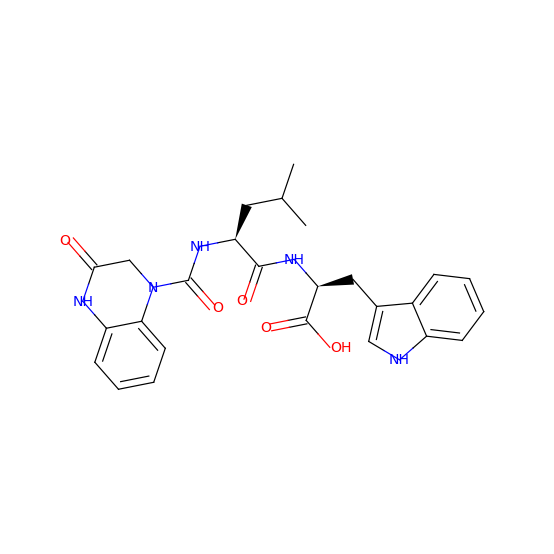

CCC(C)[C@H](NC(=O)N1CC(=O)Nc2ccccc12)C(=O)N[C@H](Cc3c[nH]c4ccccc34)C(=O)O


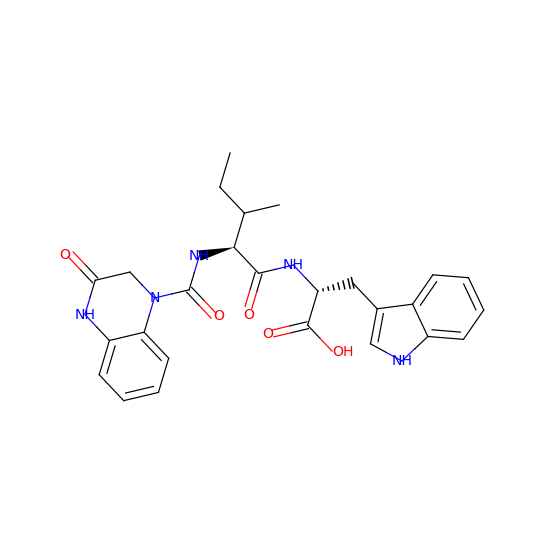

tanimoto: 0.9316517493897477
MS2Query: 0.8234
CCOc1ccc(NC(=O)[C@@H]2CCC(=O)N2C3OC(=O)c4ccccc34)cc1


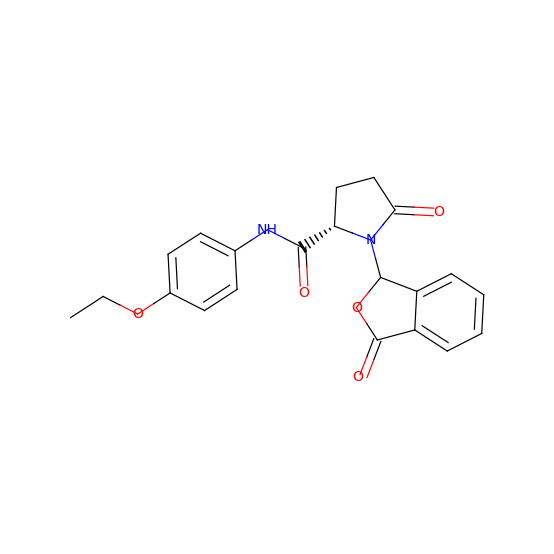

O=C(Nc1ccc2OCOc2c1)[C@@H]3CCC(=O)N3C4OC(=O)c5ccccc45


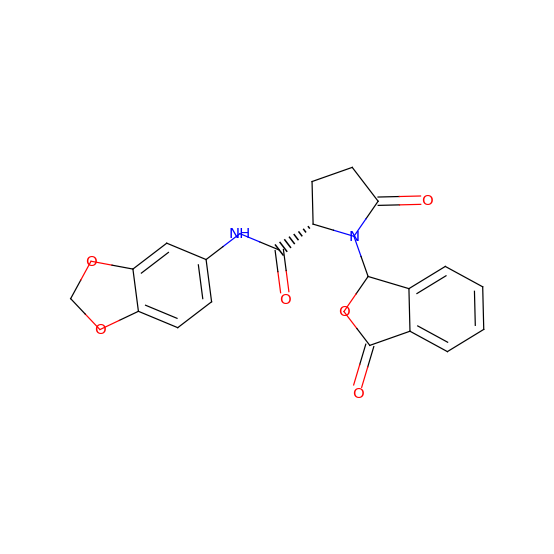

tanimoto: 0.9079457364341085
MS2Query: 0.8469
CC(Oc1ccc2c(C)cc(=O)oc2c1C)C(=O)N3CC[C@@]4(O)CCCC[C@H]4C3


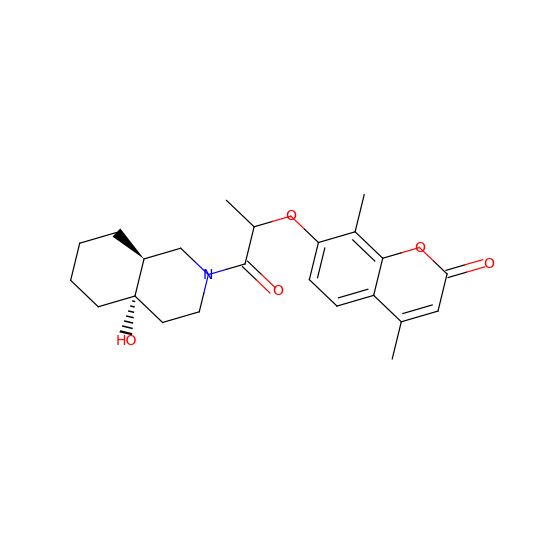

CCc1cc(=O)oc2c(C)c(OCC(=O)N3CC[C@@]4(O)CCCC[C@H]4C3)ccc12


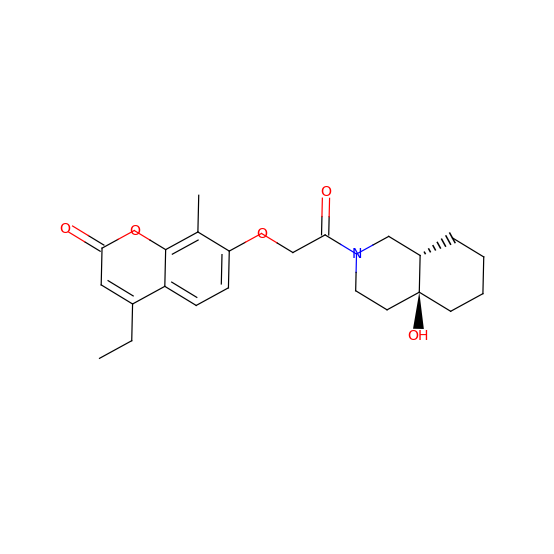

tanimoto: 0.9158415841584159
MS2Query: 0.8473
COc1cccc(NC(=O)COc2cc(O)c3C(=O)CC(C)(C)Oc3c2)c1


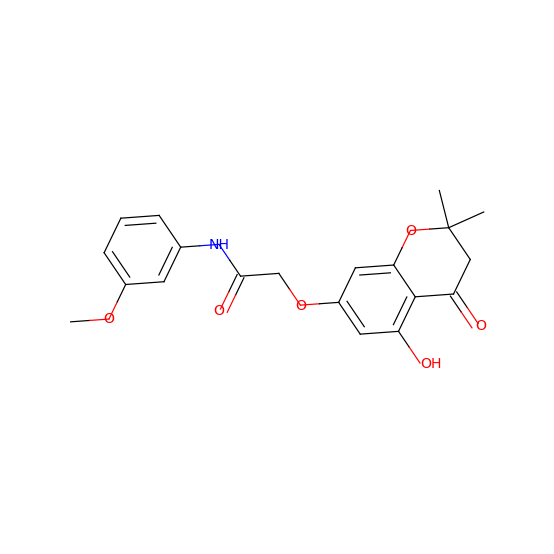

COc1ccc(NC(=O)COc2cc(O)c3C(=O)CC(C)(C)Oc3c2)cc1


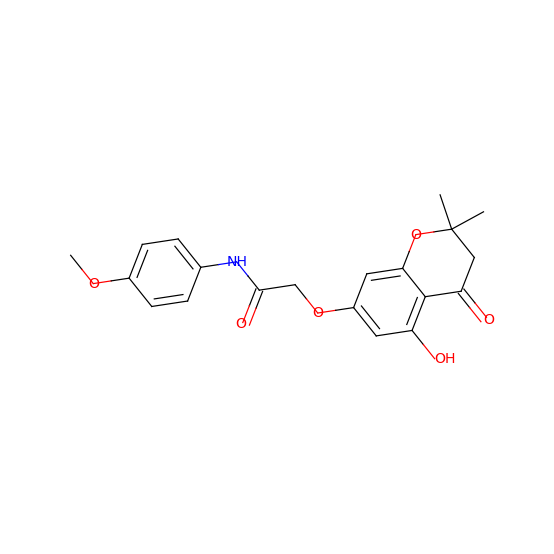

tanimoto: 0.9724669603524229
MS2Query: 0.7171
CSCC[C@H](NS(=O)(=O)c1ccc(C)cc1)C(=O)N2CCC(CC2)C(=O)N[C@@H](Cc3ccccc3)C(=O)O


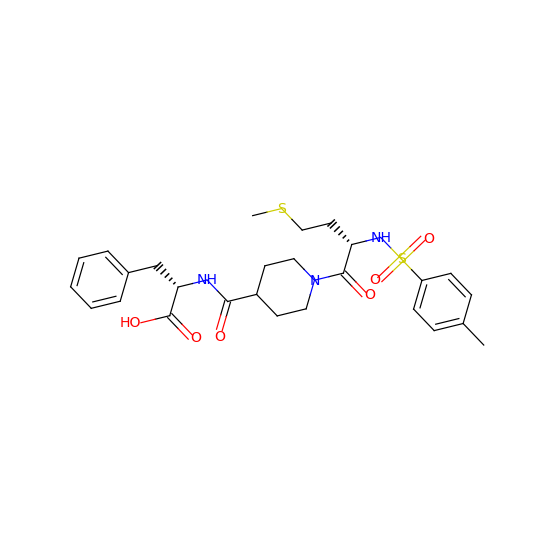

CSCC[C@H](NS(=O)(=O)c1ccc(C)cc1)C(=O)N2CCC(CC2)C(=O)N[C@@H](Cc3ccc(O)cc3)C(=O)O


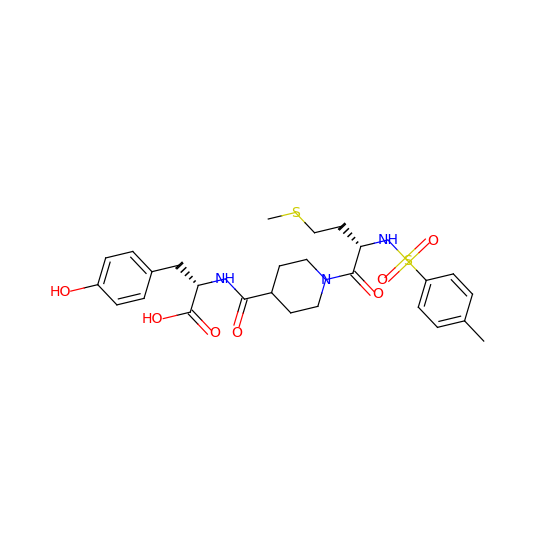

tanimoto: 0.9941099476439791
MS2Query: 0.8837
C[C@H](N1C(=O)N2CCc3c([nH]c4ccccc34)[C@@]2(C)C1=O)C(=O)NCc5ccc(C)cc5


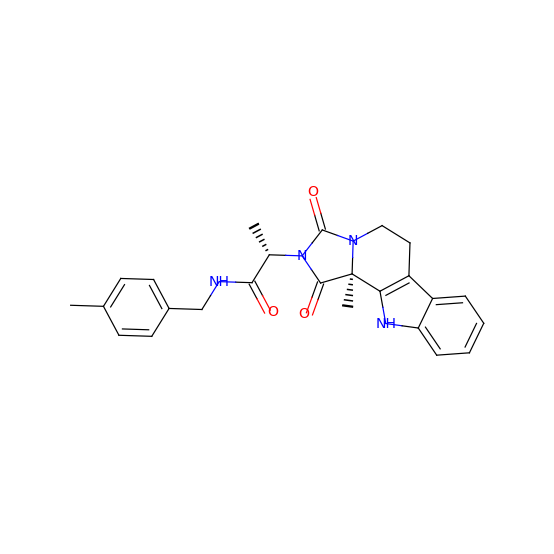

CC(NC(=O)[C@H](C)N1C(=O)N2CCc3c([nH]c4ccccc34)[C@@]2(C)C1=O)c5ccccc5


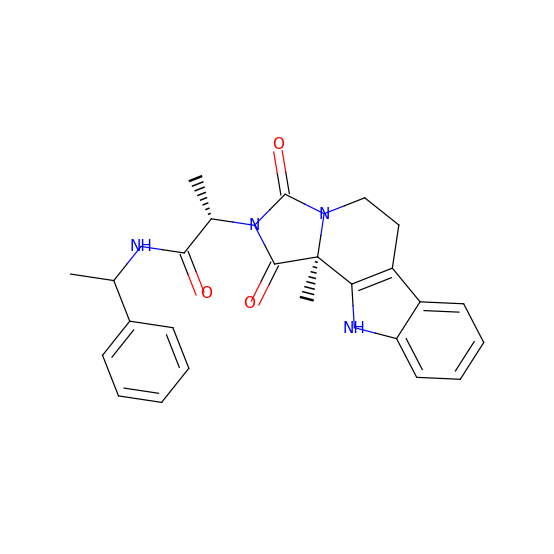

tanimoto: 0.9692307692307692
MS2Query: 0.9262
C[C@@H]1O[C@@H](OC[C@H]2O[C@@H](OC3=C(OC4=CC(O)=CC(O)=C4C3=O)C5=CC(O)=C(O)C=C5)[C@H](O[C@@H]6O[C@@H](C)[C@H](O)[C@@H](O)[C@H]6O)[C@@H](O)[C@H]2O)[C@H](O)[C@H](O)[C@H]1O


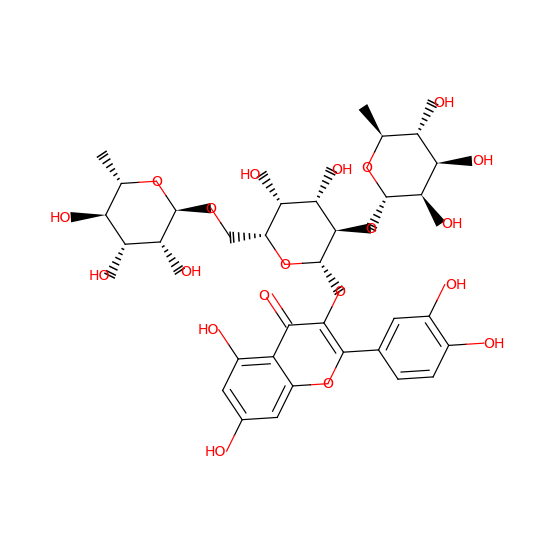

C[C@@H]1O[C@@H](OC[C@H]2O[C@@H](OC3=C(OC4=C(C3=O)C(O)=CC(O)=C4)C5=CC(O)=C(O)C=C5)[C@H](O)[C@@H](O)[C@@H]2O)[C@H](O[C@@H]6OC[C@](O)(CO)[C@H]6O)[C@H](O)[C@H]1O


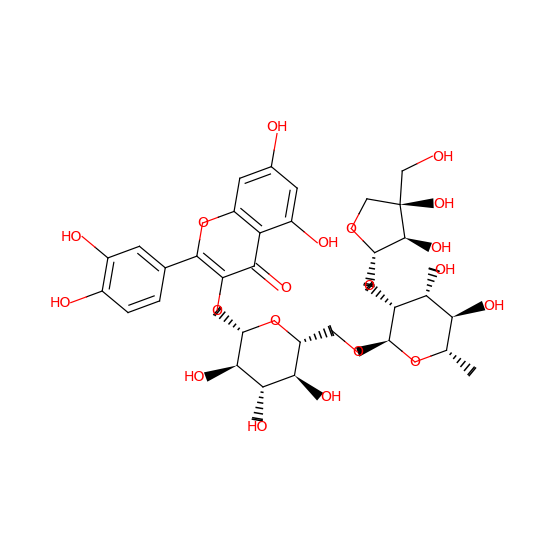

tanimoto: 0.96484375
MS2Query: 0.8703
COC1=CC(\C=C\C2=CC=C(O)C=C2)=CC(OC)=C1


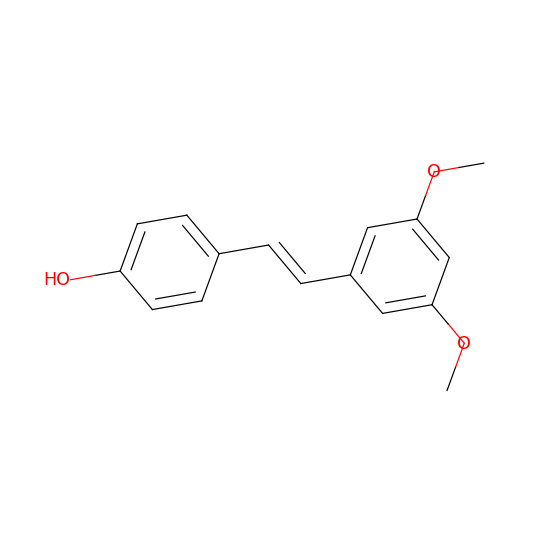

COC1=CC=C(\C=C\C2=CC(OC)=CC(O)=C2)C=C1


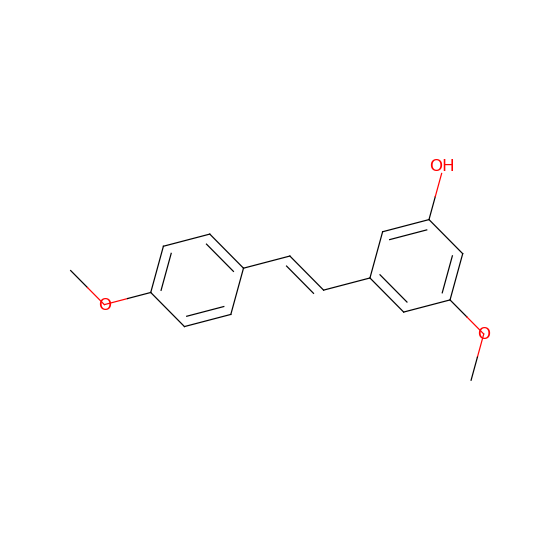

tanimoto: 0.9434447300771208
MS2Query: 0.9235
CC1OC(OC2C(O)C(COC(=O)\C=C\C3=CC(O)=C(O)C=C3)OC(OCCC4=CC=C(O)C(O)=C4)C2O)C(OC5OC(CO)C(O)C(O)C5O)C(O)C1O


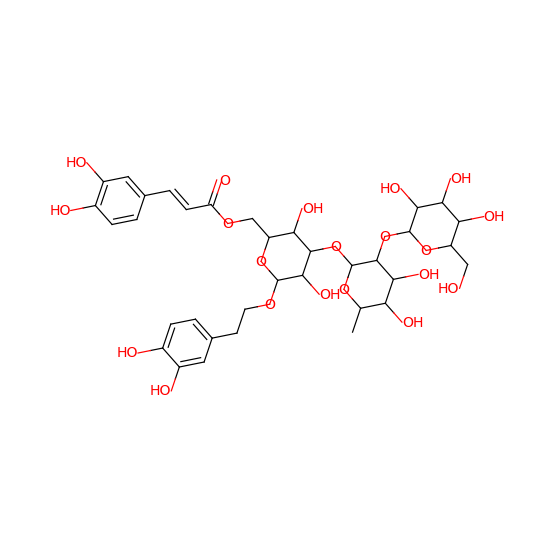

C[C@@H]1O[C@@H](O[C@@H]2[C@@H](O)[C@H](OCCC3=CC=C(O)C(O)=C3)O[C@H](CO[C@@H]4O[C@H](CO)[C@@H](O)[C@H](O)[C@H]4O)[C@H]2OC(=O)\C=C\C5=CC(O)=C(O)C=C5)[C@H](O)[C@H](O)[C@H]1O


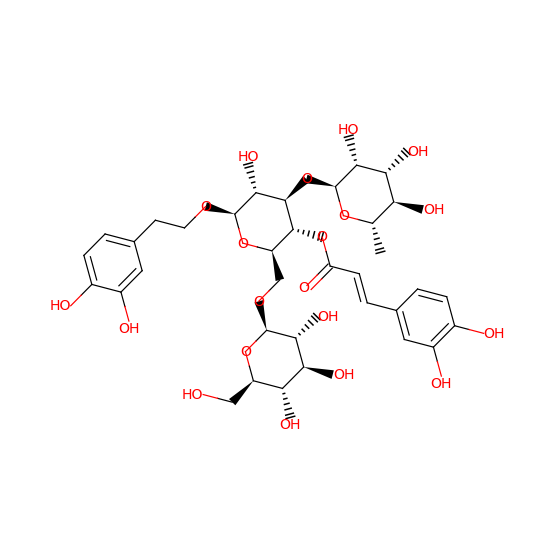

tanimoto: 0.9781491002570694
MS2Query: 0.9309
C[C@@H]1O[C@@H](O[C@@H]2[C@@H](O)[C@H](OCCC3=CC=C(O)C(O)=C3)O[C@H](CO)[C@H]2OC(=O)\C=C\C4=CC(O)=C(O)C=C4)[C@H](O[C@@H]5O[C@H](CO)[C@@H](O)[C@H](O)[C@H]5O)[C@H](O)[C@H]1O


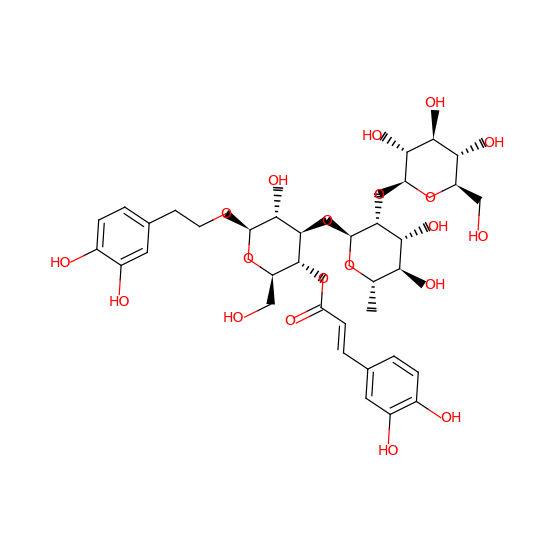

C[C@@H]1O[C@@H](O[C@@H]2[C@@H](O)[C@H](OCCC3=CC=C(O)C(O)=C3)O[C@H](CO[C@@H]4O[C@H](CO)[C@@H](O)[C@H](O)[C@H]4O)[C@H]2OC(=O)\C=C\C5=CC(O)=C(O)C=C5)[C@H](O)[C@H](O)[C@H]1O


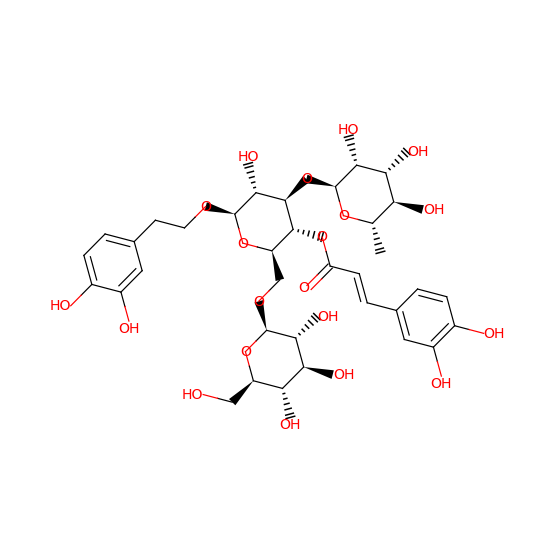

tanimoto: 0.977
MS2Query: 0.8029
O=C1C(=COC2=CC(OC3OC(CO)C(OC)C(O)C3O)=CC=C12)C=4C=CC(O)=CC4


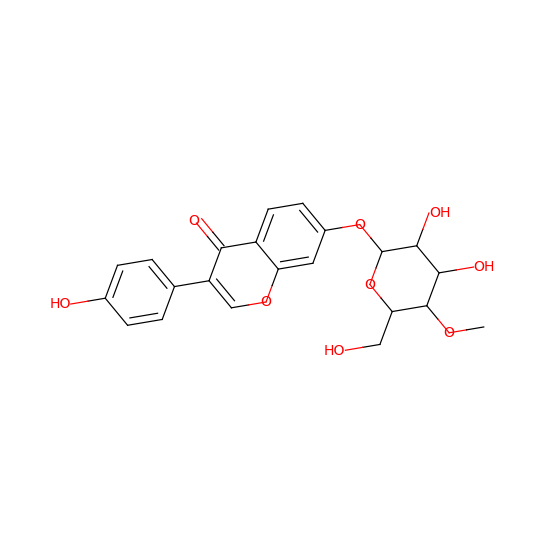

COC1=CC=C(C=C1)C2=COC3=C(C=CC(O[C@@H]4O[C@H](CO)[C@@H](O)[C@H](O)[C@H]4O)=C3)C2=O


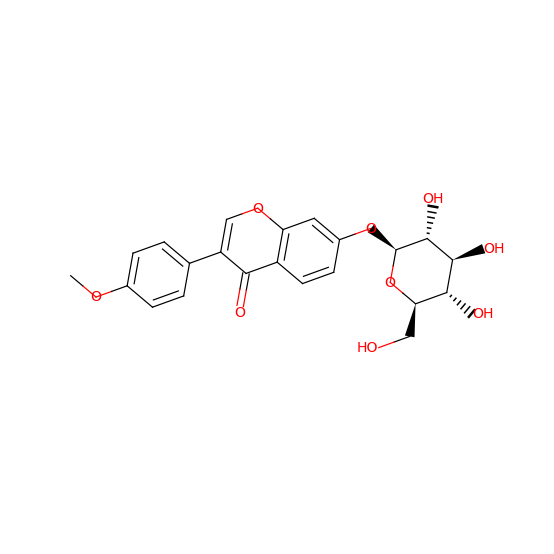

tanimoto: 0.935672514619883
MS2Query: 0.8308
CC1OC(O[C@@H]2[C@@H](O)[C@@H](O[C@H](C)[C@@H]2OC3OC(C)C(OC4OCC(O)C(O)C4O)C(O)C3O)OC(=O)[C@]56CCC(C)(C)C[C@H]5C/7=C/CC8[C@@]9(C)CC[C@H](O[C@@H]%10O[C@@H]([C@@H](O)[C@H](O[C@@H]%11OC[C@@H](O)[C@H](O)[C@H]%11O)[C@H]%10O[C@@H]%12O[C@H](CO)[C@H](O)[C@H](O)[C@H]%12O)C(O)=O)[C@@](C)(C=O)C9CC[C@@]8(C)[C@]7(C)C[C@H]6O)C(O)C(O)C1O


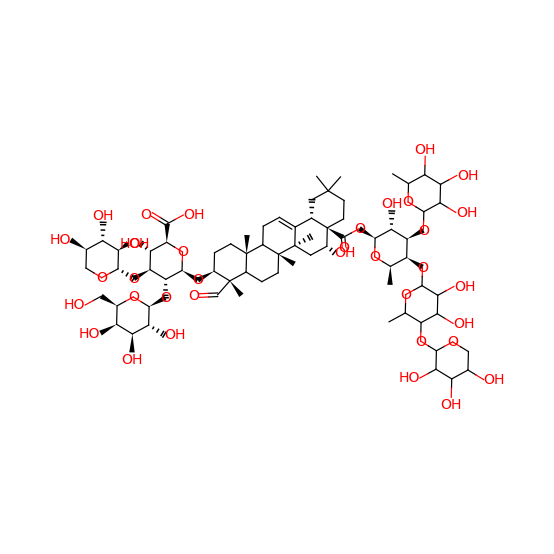

C[C@H]1O[C@@H](OC(=O)C23CCC4(C)\C(=C/CC5C6(C)CC(O)C(O[C@@H]7O[C@@H]([C@@H](O)[C@H](O)[C@H]7O)C(O)=O)C(C)(C6CCC45C)C(O)=O)C2CC(C)(C)CC3O)[C@H](O[C@@H]8O[C@@H](C)[C@H](O)[C@H](O[C@@H]9OC[C@](O)(CO)[C@H]9O[C@@H]%10O[C@H](CO)[C@@H](O)[C@H](O)[C@H]%10O)[C@H]8O)[C@@H](O)[C@@H]1O


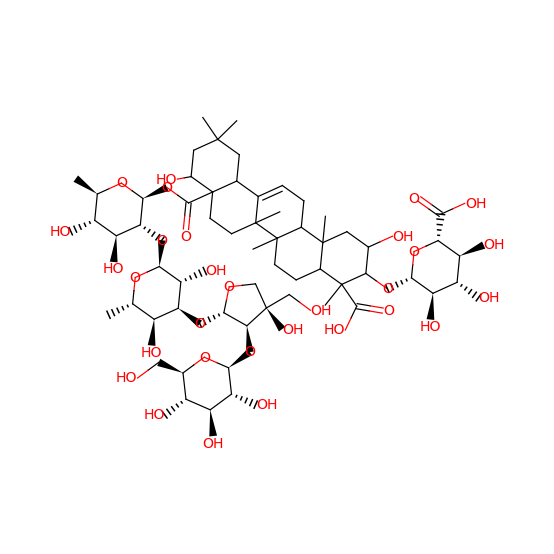

tanimoto: 0.9938962360122076
MS2Query: 0.7794
C[C@@H]1O[C@@H](O[C@H]2[C@@H]3\C=C/O[C@@H](O[C@@H]4O[C@H](CO)[C@@H](O)[C@H](O)[C@H]4O)[C@@H]3[C@@]5(CO)O[C@@H]25)[C@H](OC(C)=O)[C@H](OC(=O)\C=C\C6=CC=CC=C6)[C@H]1OC(C)=O


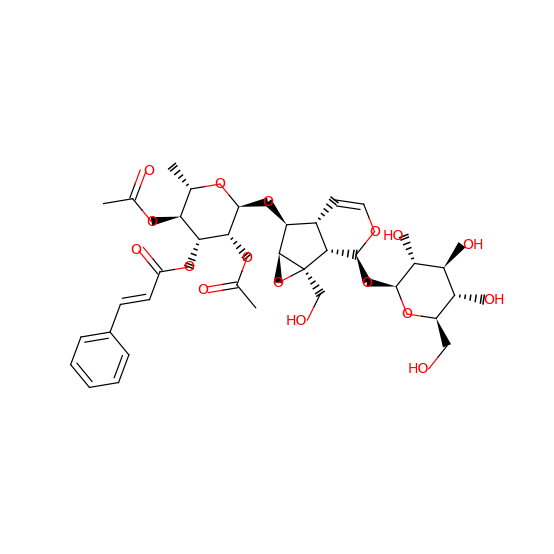

C[C@@H]1O[C@@H](O[C@H]2[C@@H]3\C=C/O[C@@H](O[C@@H]4O[C@H](CO)[C@@H](O)[C@H](O)[C@H]4O)[C@@H]3[C@@]5(CO)O[C@@H]25)[C@H](OC(=O)\C=C\C6=CC=CC=C6)[C@H](O)[C@H]1O


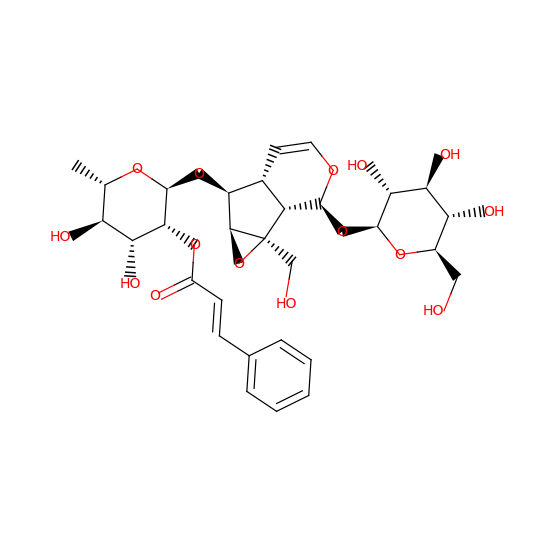

tanimoto: 0.9751243781094527
MS2Query: 0.9199
C[C@@H]1O[C@@H](O[C@@H]2[C@@H](O)[C@@H](O)CO[C@H]2O[C@@H]3[C@@H](O)[C@H](O)[C@H](O[C@H]3O[C@H]4CC[C@@]5(C)C(CC[C@]6(C)C5C\C=C7\[C@@H]8CC(C)(C)C[C@@H](O)[C@]8(C)CC[C@@]67C)[C@@]4(C)CO)C(O)=O)[C@H](O)[C@H](O)[C@H]1O


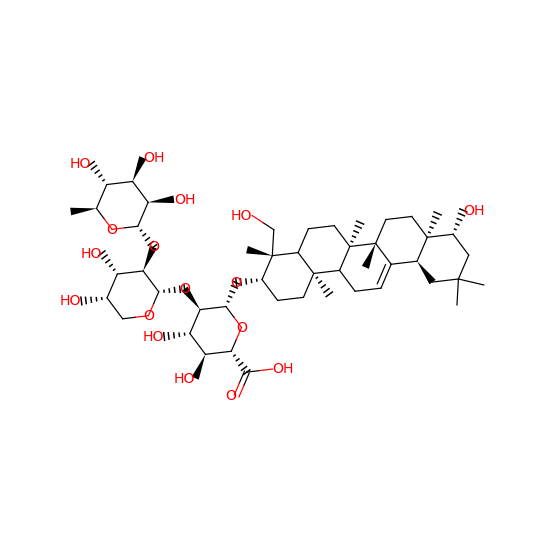

C[C@@H]1O[C@@H](O[C@@H]2[C@@H](O)[C@H](O)CO[C@H]2O[C@@H]3[C@@H](O)[C@H](O)[C@H](O[C@H]3O[C@H]4CC[C@@]5(CO)C(CC[C@]6(C)C5C\C=C/7C8CC(C)(C)C[C@@H](O)[C@]8(C)CC[C@@]67C)C4(C)C)C(O)=O)[C@H](O)[C@H](O)[C@H]1O


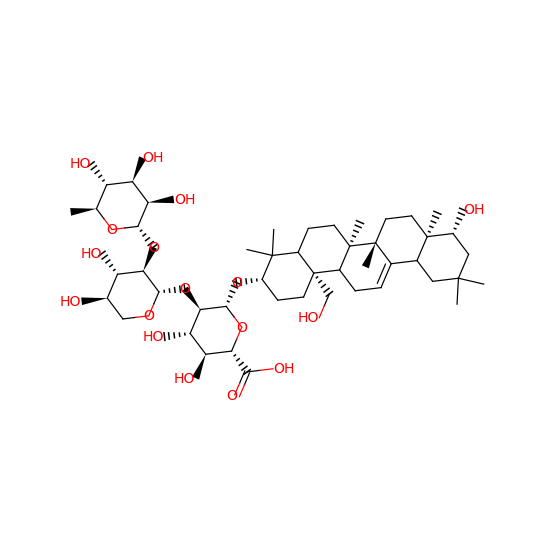

tanimoto: 0.9751243781094527
MS2Query: 0.9239
O=C(O)C8OC(OC5CCC4(C)(C(CCC2(C)(C4(CC=C1C3CC(C)(C)CC(O)C3(C)(CCC12(C)))))C5(C)(CO)))C(OC7OC(CO)C(O)C(O)C7(OC6OCC(O)C(O)C6(O)))C(O)C8(O)


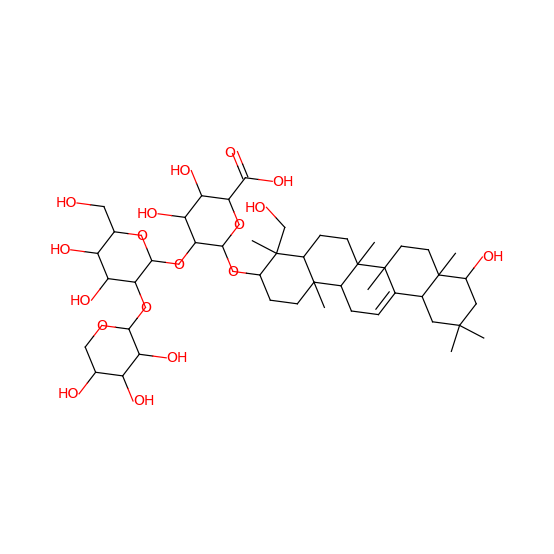

C[C@@H]1O[C@@H](O[C@@H]2[C@@H](O)[C@H](O)CO[C@H]2O[C@@H]3[C@@H](O)[C@H](O)[C@H](O[C@H]3O[C@H]4CC[C@@]5(CO)C(CC[C@]6(C)C5C\C=C/7C8CC(C)(C)C[C@@H](O)[C@]8(C)CC[C@@]67C)C4(C)C)C(O)=O)[C@H](O)[C@H](O)[C@H]1O


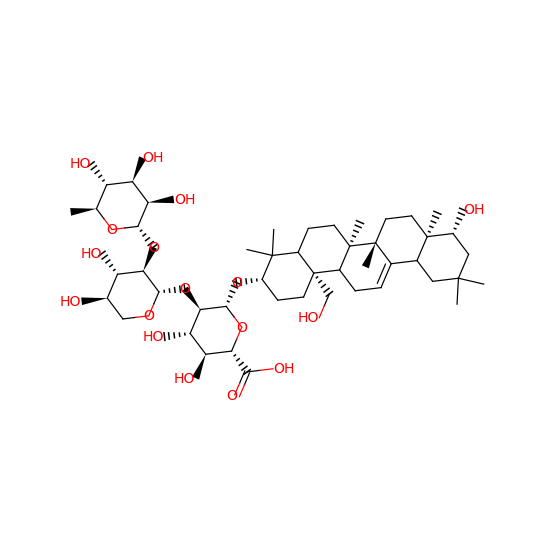

tanimoto: 0.9692307692307692
MS2Query: 0.9243
O=C4C(OC3OC(COC1OC(C)C(O)C(O)C1(O))C(O)C(O)C3(OC2OCC(O)C(O)C2(O)))=C(OC=5C=C(O)C=C(O)C4=5)C6=CC=C(O)C(O)=C6


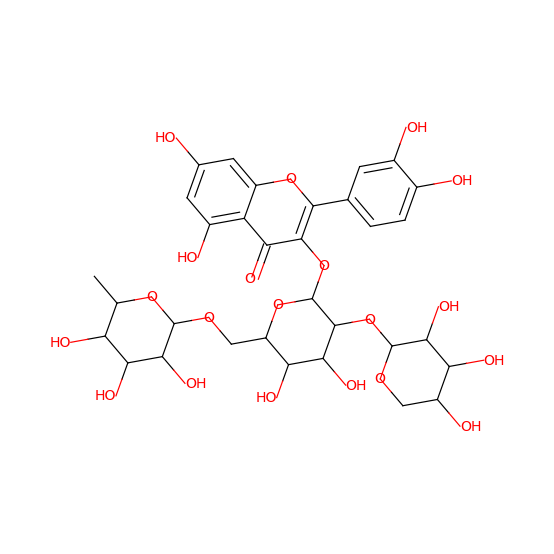

C[C@@H]1O[C@@H](OC[C@H]2O[C@@H](OC3=C(OC4=C(C3=O)C(O)=CC(O)=C4)C5=CC(O)=C(O)C=C5)[C@H](O)[C@@H](O)[C@@H]2O)[C@H](O[C@@H]6OC[C@](O)(CO)[C@H]6O)[C@H](O)[C@H]1O


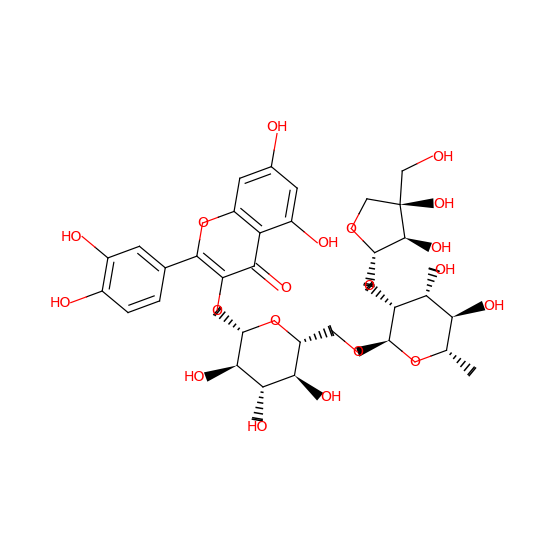

tanimoto: 0.9693950177935943
MS2Query: 0.6074
CC(=O)O[C@H]1[C@@H](OC(=O)C=C(C)C)C(C)(C)OC2=CC=C3C=CC(=O)OC3=C12


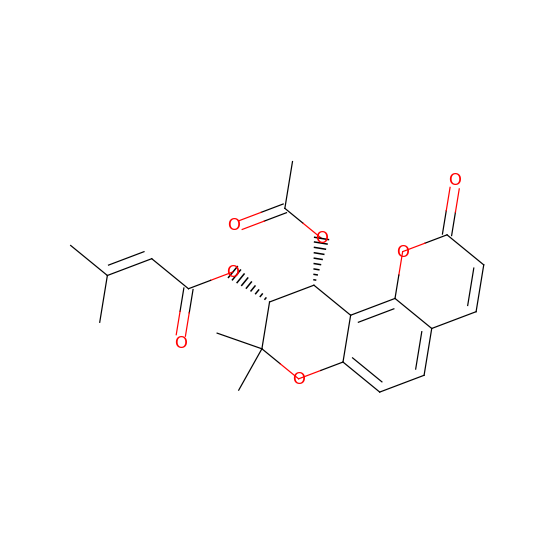

CC(C)CC(=O)OC1C(OC(=O)C=C(C)C)C2=C3OC(=O)C=CC3=CC=C2OC1(C)C


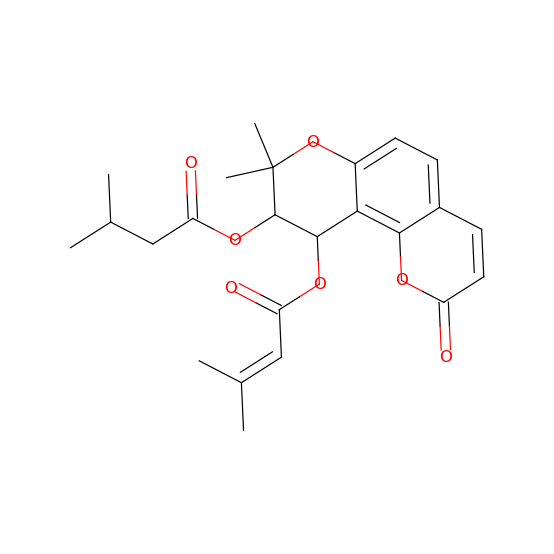

tanimoto: 0.9714489650249821
MS2Query: 0.6074
CC(C)CC(=O)O[C@H]1[C@@H](OC(=O)CC(C)C)C(C)(C)OC2=CC=C3C=CC(=O)OC3=C12


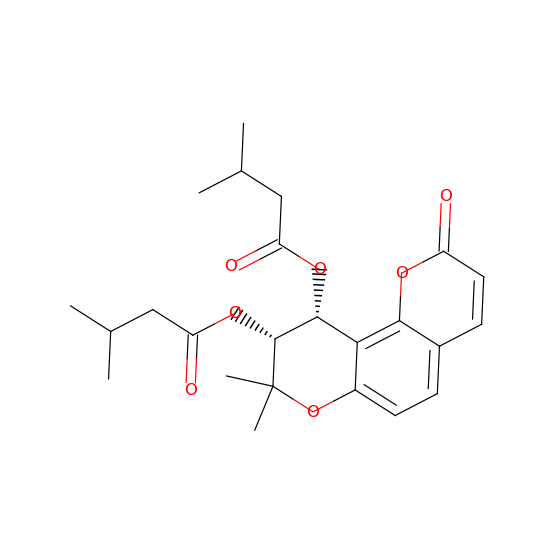

CC(C)CC(=O)OC1C(OC(=O)C=C(C)C)C2=C3OC(=O)C=CC3=CC=C2OC1(C)C


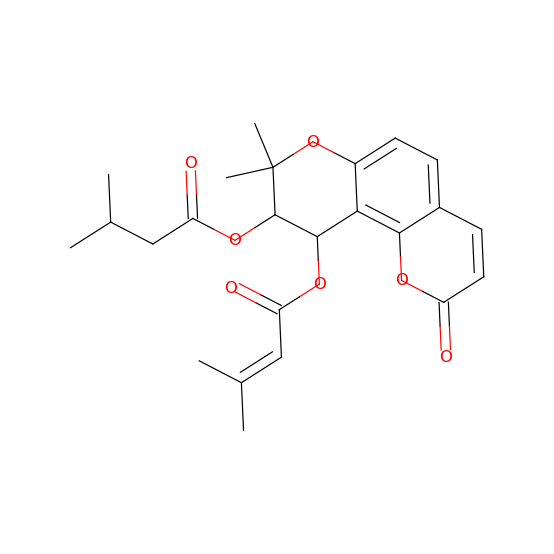

tanimoto: 0.9603174603174603
MS2Query: 0.7833
CC/C=C\C=C\C(C/C=C\C/C=C\C/C=C\C/C=C\CCC(=O)O)O


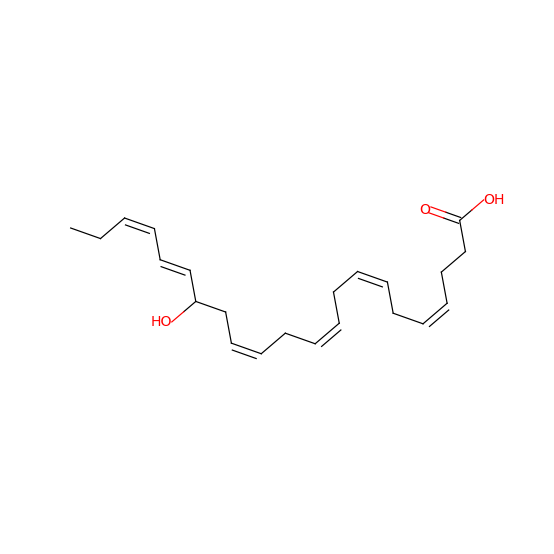

CC/C=C\CC(/C=C/C=C\C/C=C\C/C=C\C/C=C\CCC(=O)O)O


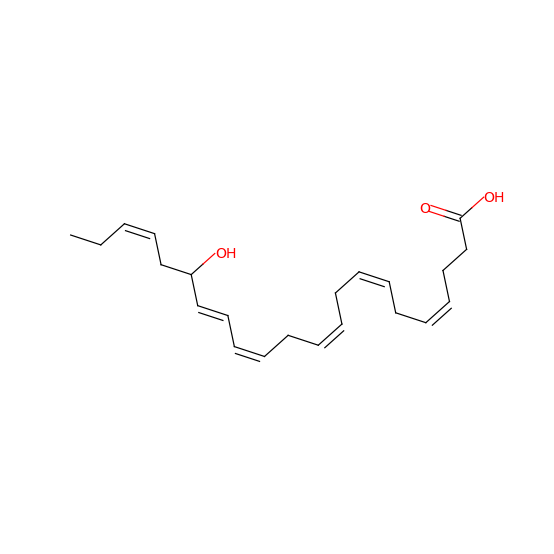

tanimoto: 0.9180651530108588
MS2Query: 0.8341
COc1c(O)cc2oc(-c3ccc(O)cc3)c(OC)c(=O)c2c1O


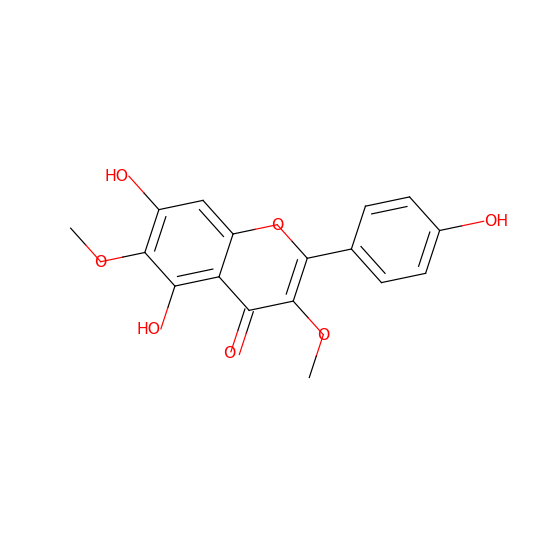

COC1=C(C=C(C=C1)C2=C(C(=O)C3=C(C=C(C=C3O2)O)O)OC)O


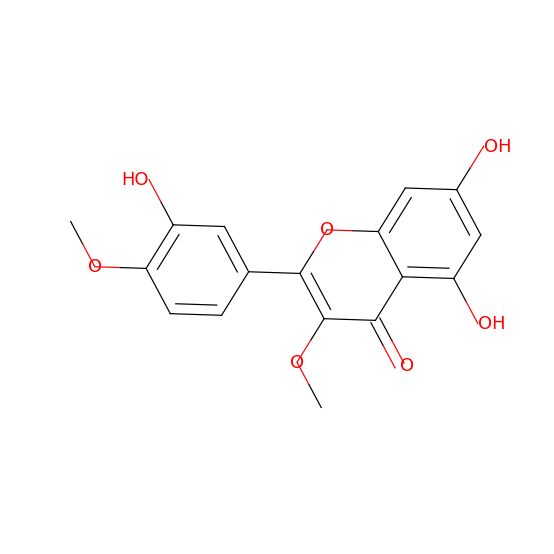

tanimoto: 0.9215686274509803
MS2Query: 0.8487
[H][C@]12C[C@H](O)CC[C@]1(C)[C@@H]3[C@@]([C@H](CC[C@@H]4[C@@H](CCC(O)=O)C)[C@]4(C)[C@@H](O)C3)([H])[C@@H](O)[C@@H]2O


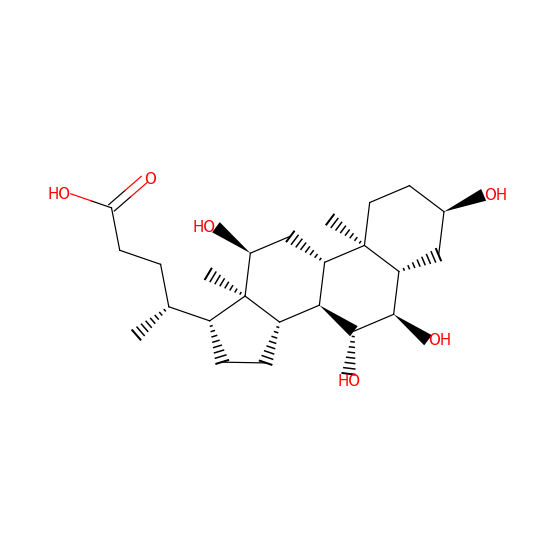

[H][C@@]1([C@H](O)C[C@H]2[C@]3(C)C[C@H](O)[C@@H](O)C2)[C@@H]3C[C@H](O)[C@@]4(C)[C@H]1CC[C@@H]4[C@@H](CCC(O)=O)C


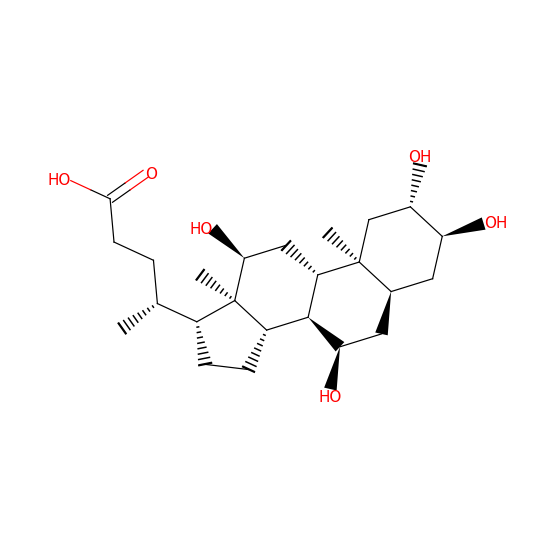

tanimoto: 0.9954022988505747
MS2Query: 0.927
CCCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCC/C=C/C/C=C/C/C=C/CCCCC


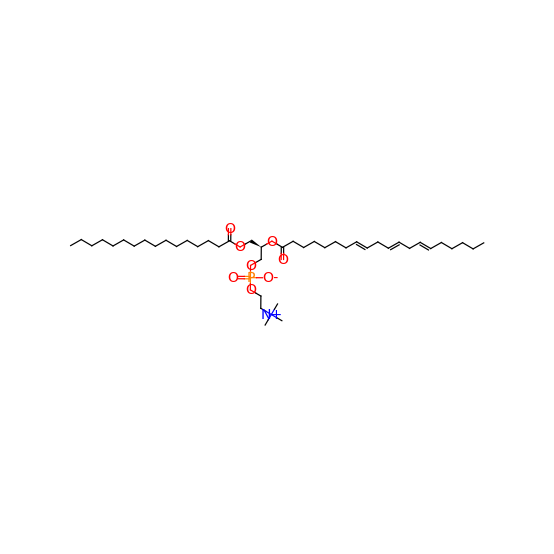

CCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\C/C=C\CCCCC


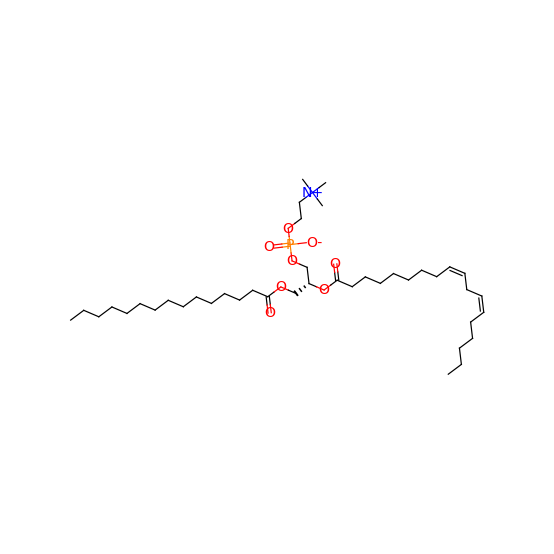

tanimoto: 0.9908466819221968
MS2Query: 0.927
CCCCCCCC/C=C\CCCCCCCC(=O)O[C@H](COC(=O)CCCC/C=C\C/C=C\C/C=C\CCCCC)COP(=O)([O-])OCC[N+](C)(C)C


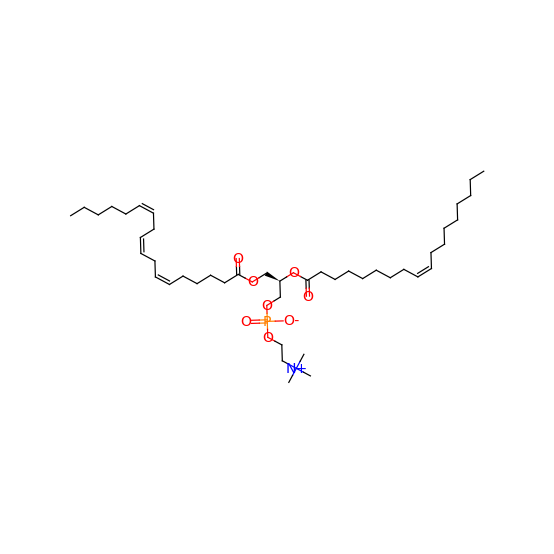

CCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\C/C=C\CCCCC


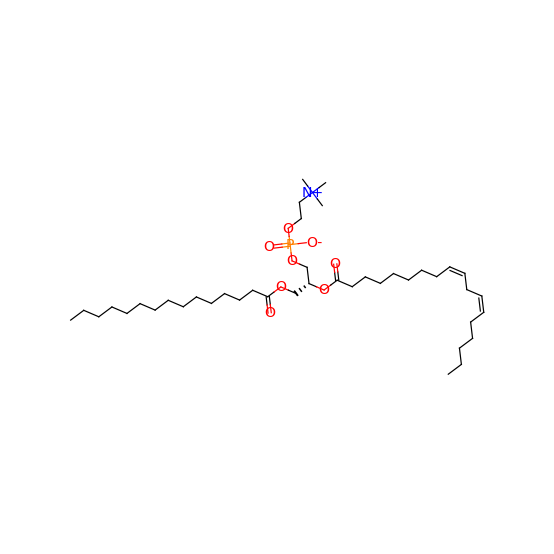

tanimoto: 0.9495614035087719
MS2Query: 0.927
CCCCC/C=C\C/C=C\C/C=C\CCCCCCC(=O)O[C@H](COC(=O)CC/C=C\C/C=C\C/C=C\C/C=C\C/C=C\C/C=C\CC)COP(=O)([O-])OCC[N+](C)(C)C


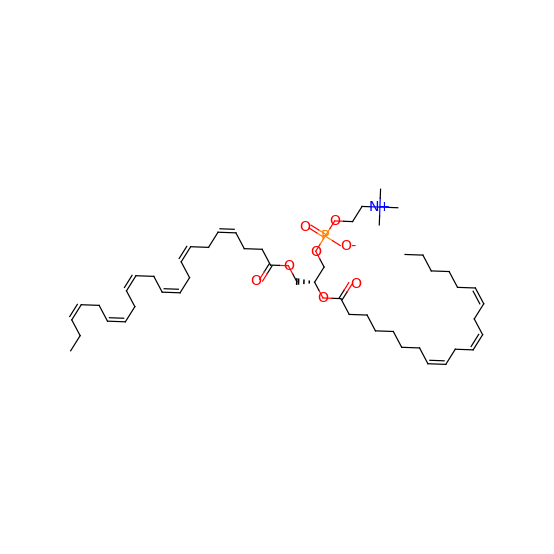

CCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\C/C=C\CCCCC


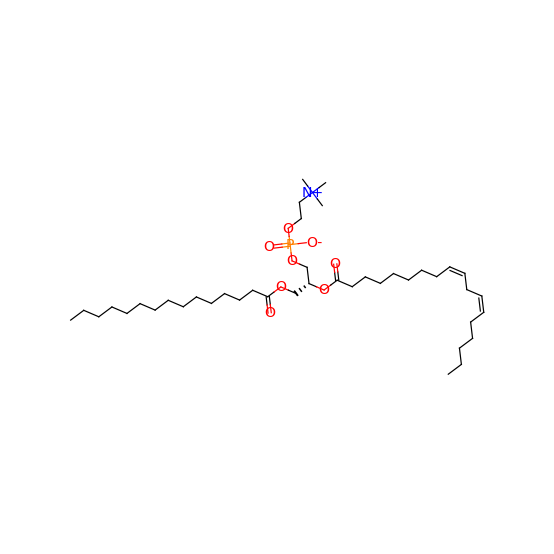

tanimoto: 0.9954022988505747
MS2Query: 0.927
CCCCCC/C=C\CCCCCCCC(=O)O[C@H](COC(=O)CCCCCC/C=C\C/C=C\C/C=C\C/C=C\CC)COP(=O)([O-])OCC[N+](C)(C)C


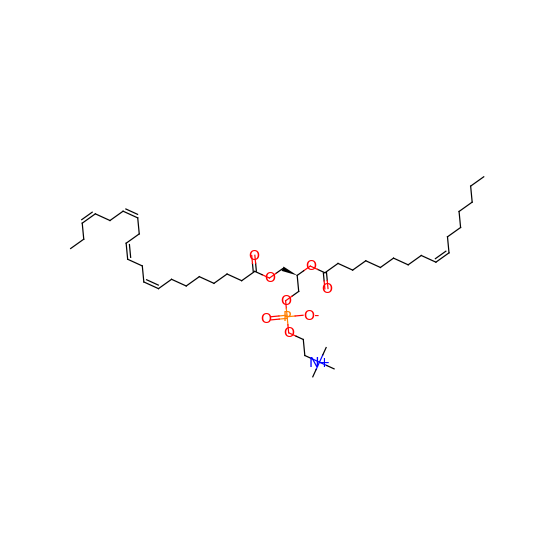

CCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\C/C=C\CCCCC


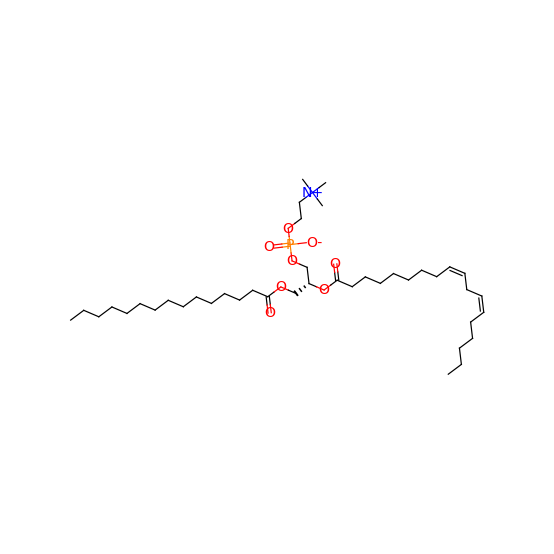

tanimoto: 0.9752252252252253
MS2Query: 0.927
CCCCC/C=C\C/C=C\CCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCC/C=C\C/C=C\C/C=C\C/C=C\CCCCC


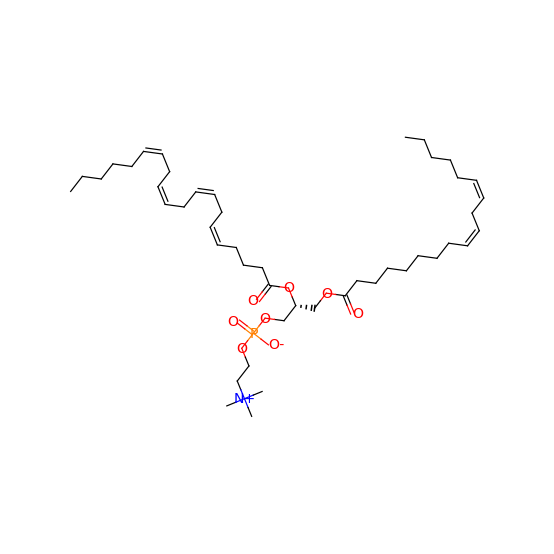

CCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\C/C=C\CCCCC


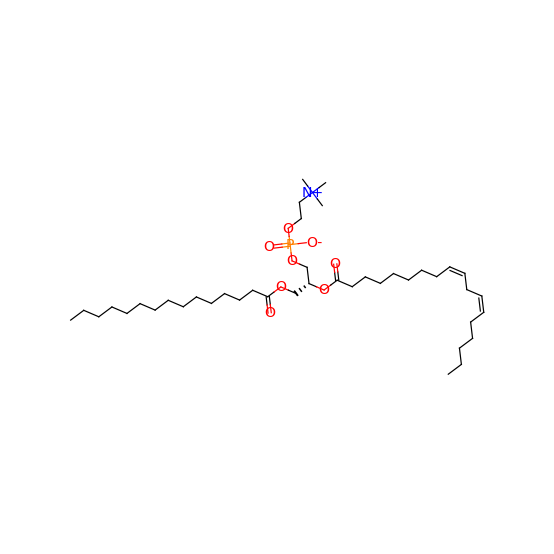

tanimoto: 0.9752252252252253
MS2Query: 0.927
CCCCC/C=C\C/C=C\CCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCC/C=C\C/C=C\C/C=C\C/C=C\CCCCC


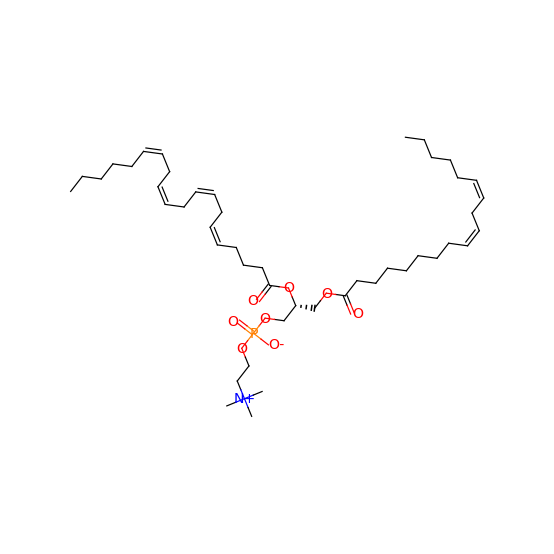

CCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\C/C=C\CCCCC


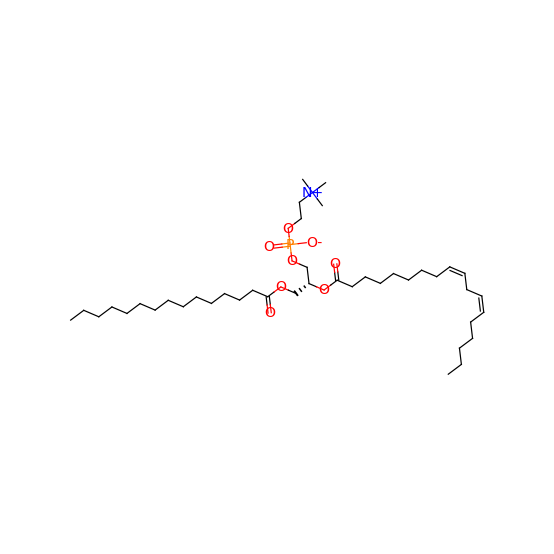

tanimoto: 0.9722863741339491
MS2Query: 0.927
CCCCCCCCC/C=C\CCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\CCCCCCC


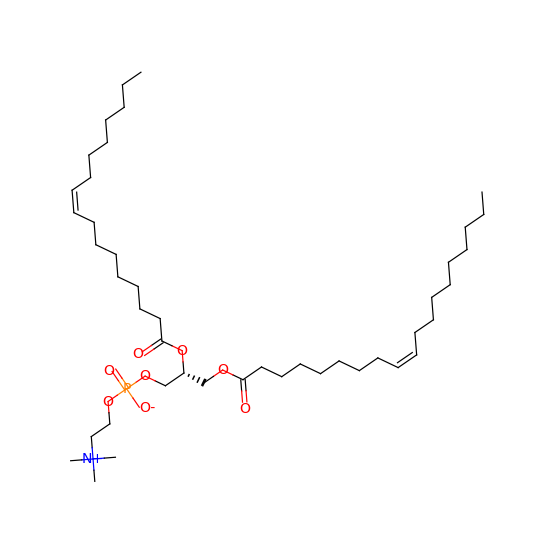

CCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\C/C=C\CCCCC


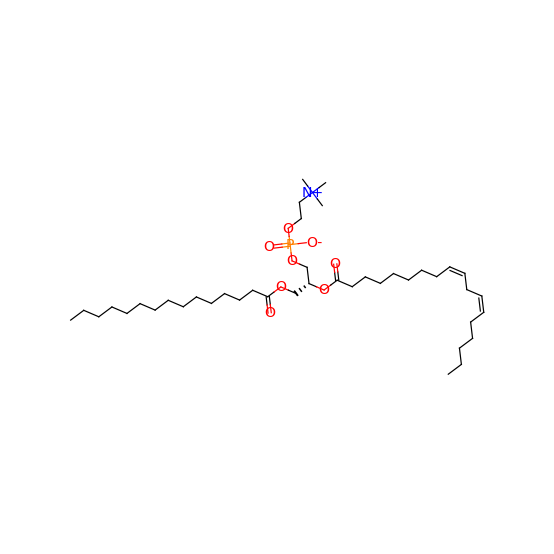

tanimoto: 0.9707207207207207
MS2Query: 0.927
CCCCCCCCCCCCCCCCCC(=O)O[C@H](COC(=O)CCC/C=C\C/C=C\C/C=C\C/C=C\CCCCC)COP(=O)([O-])OCC[N+](C)(C)C


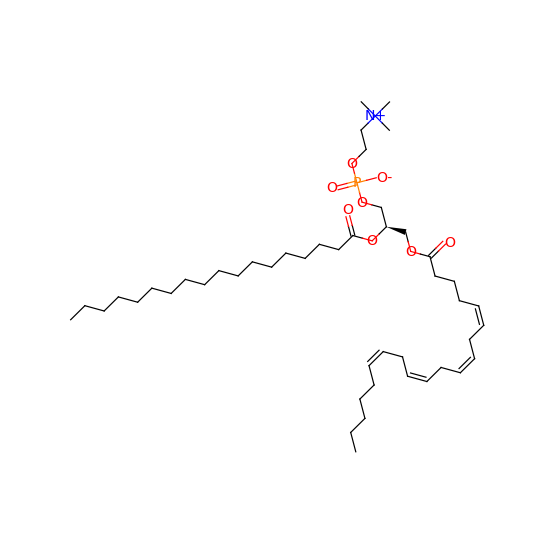

CCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\C/C=C\CCCCC


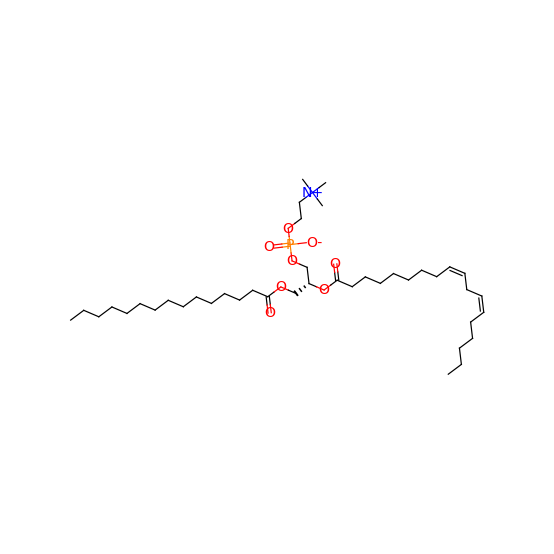

tanimoto: 0.9707207207207207
MS2Query: 0.927
CCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCC/C=C\C/C=C\C/C=C\C/C=C\CCCCC


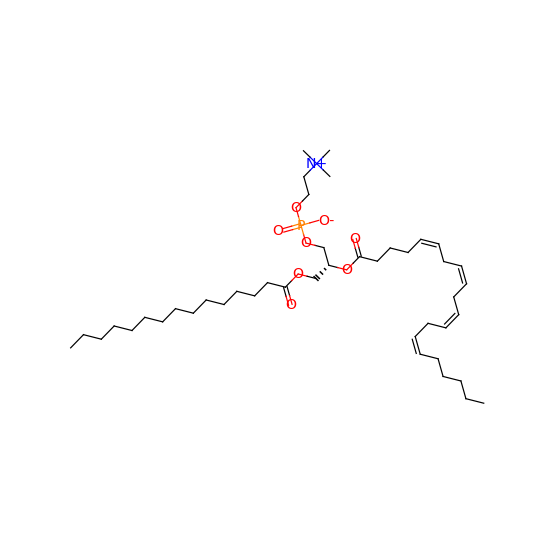

CCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\C/C=C\CCCCC


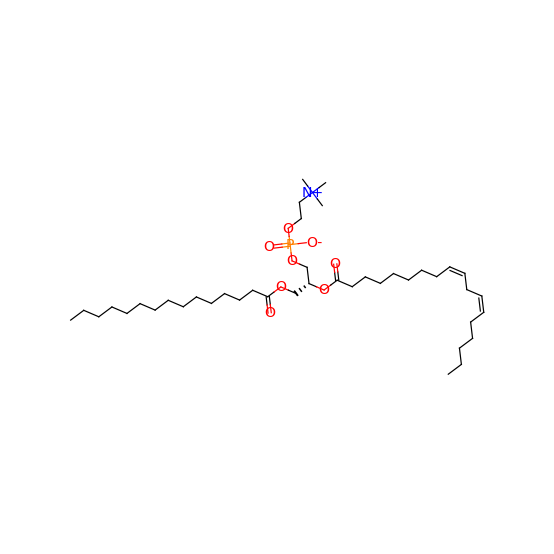

tanimoto: 0.9722863741339491
MS2Query: 0.927
CCCCCCCC/C=C\CCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\CCCCCCCC


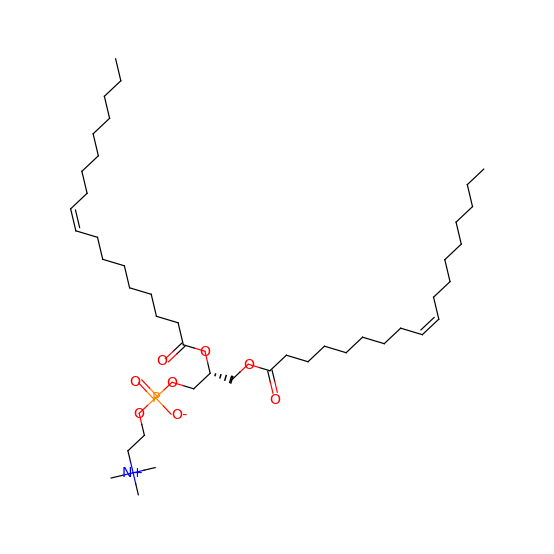

CCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\C/C=C\CCCCC


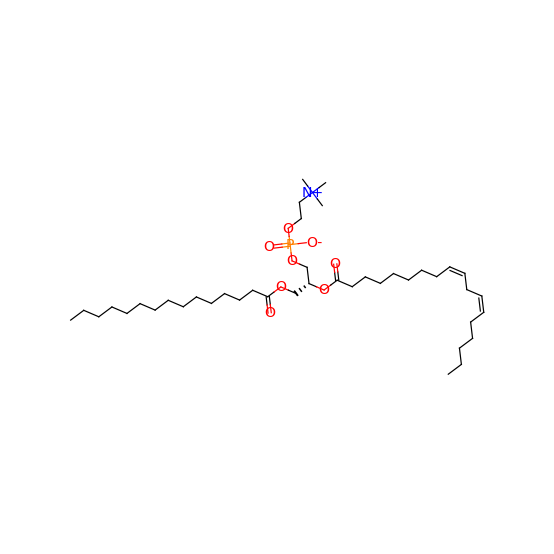

tanimoto: 0.9722863741339491
MS2Query: 0.927
CCCCCCCC/C=C\CCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\CCCCCCCC


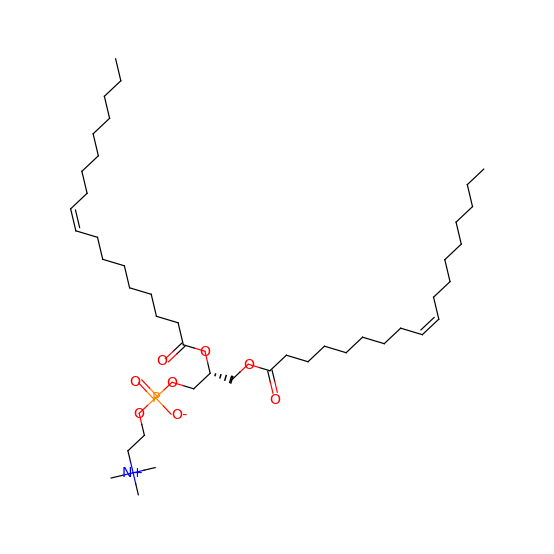

CCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\C/C=C\CCCCC


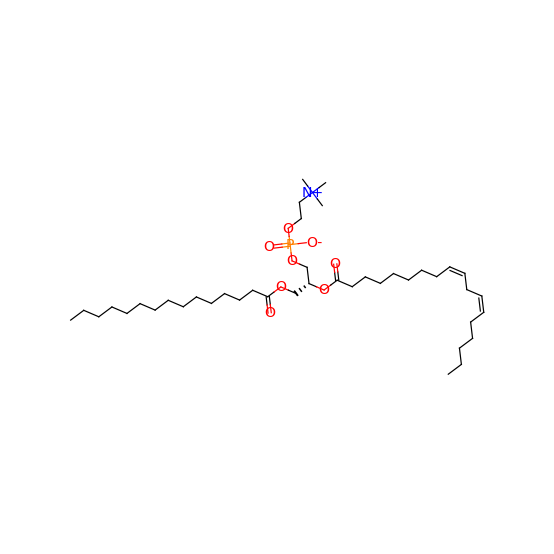

tanimoto: 0.9954022988505747
MS2Query: 0.927
CCCCCC/C=C\CCCCCCCC(=O)O[C@H](COC(=O)CCCCCC/C=C\C/C=C\C/C=C\C/C=C\CC)COP(=O)([O-])OCC[N+](C)(C)C


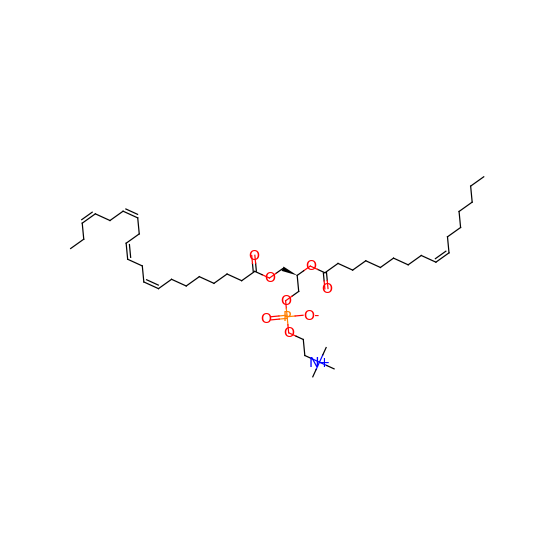

CCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\C/C=C\CCCCC


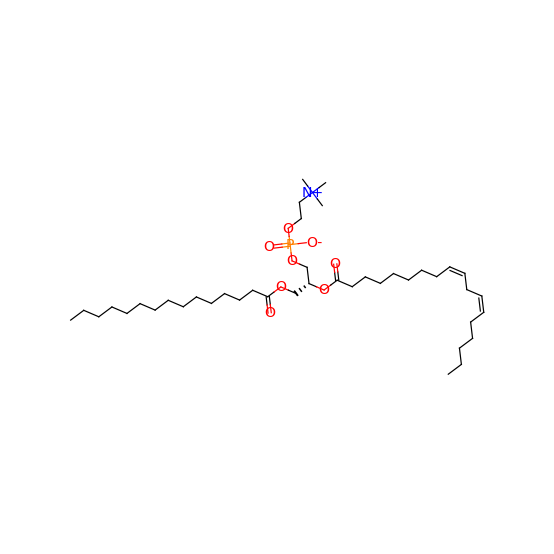

tanimoto: 0.972972972972973
MS2Query: 0.927
CC/C=C\C/C=C\C/C=C\C/C=C\C/C=C\CCCCCC(=O)O[C@H](COC(=O)CCC/C=C\C/C=C\C/C=C\C/C=C\C/C=C\CC)COP(=O)([O-])OCC[N+](C)(C)C


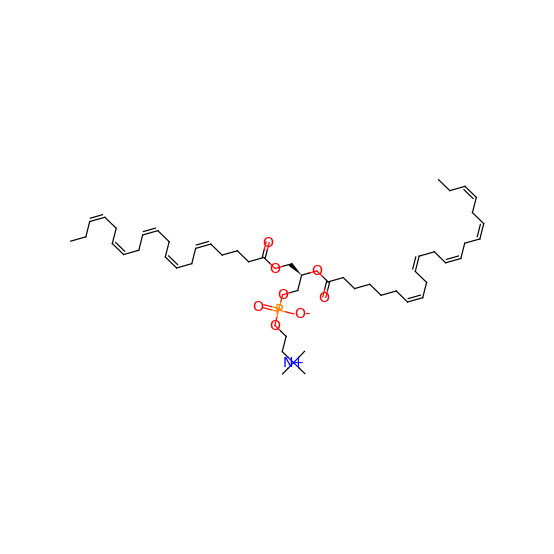

CCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\C/C=C\CCCCC


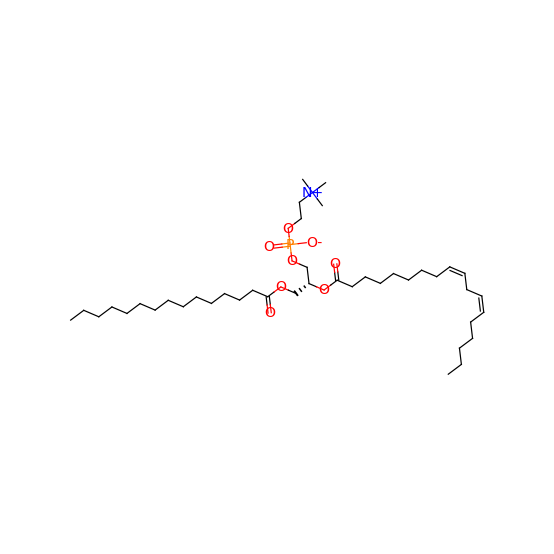

tanimoto: 0.9707207207207207
MS2Query: 0.927
CCCCCCCCCCCCCCCCCC(=O)O[C@H](COC(=O)CCC/C=C\C/C=C\C/C=C\C/C=C\CCCCC)COP(=O)([O-])OCC[N+](C)(C)C


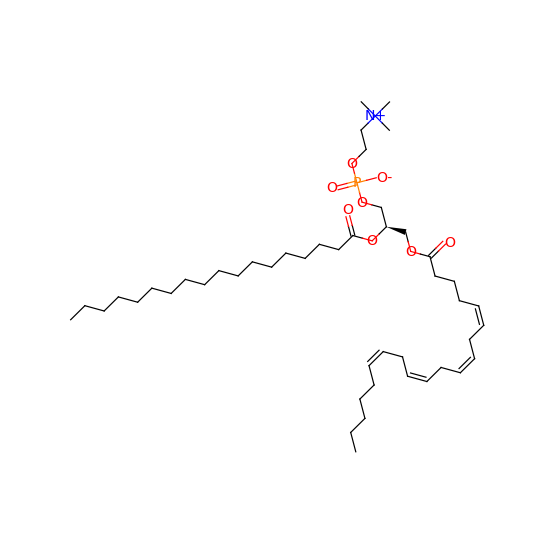

CCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\C/C=C\CCCCC


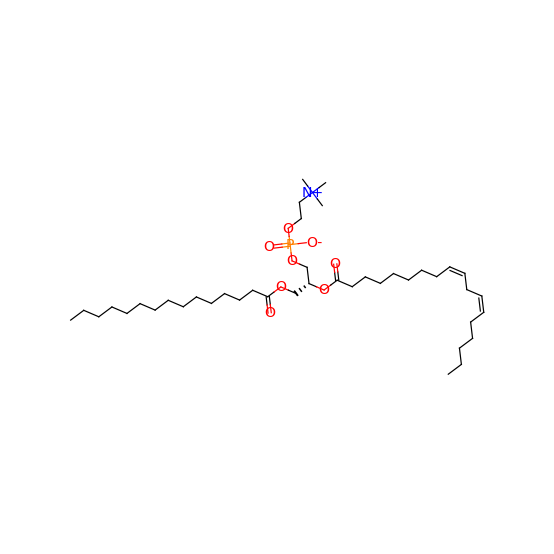

tanimoto: 0.9707207207207207
MS2Query: 0.927
CCCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCC/C=C\C/C=C\C/C=C\C/C=C\CCCCC


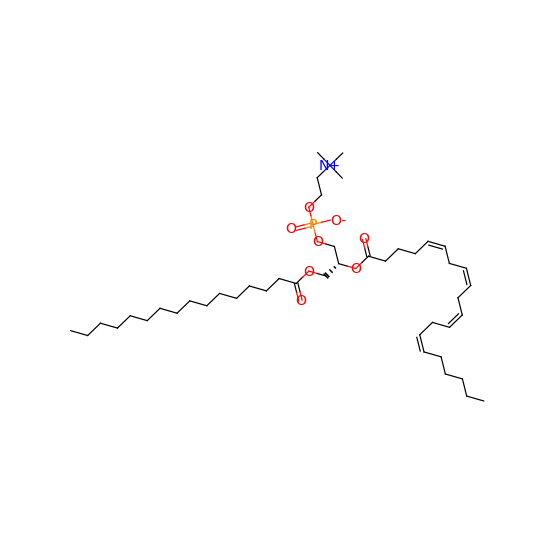

CCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\C/C=C\CCCCC


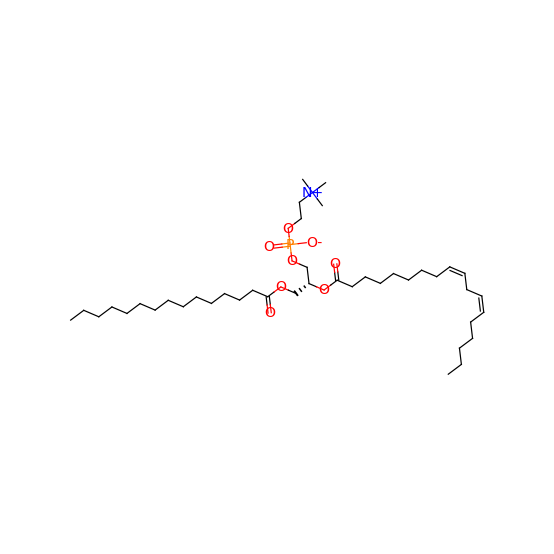

tanimoto: 0.9908466819221968
MS2Query: 0.927
CCCCCCCC/C=C\CCCCCCCC(=O)O[C@H](COC(=O)CCCC/C=C\C/C=C\C/C=C\CCCCC)COP(=O)([O-])OCC[N+](C)(C)C


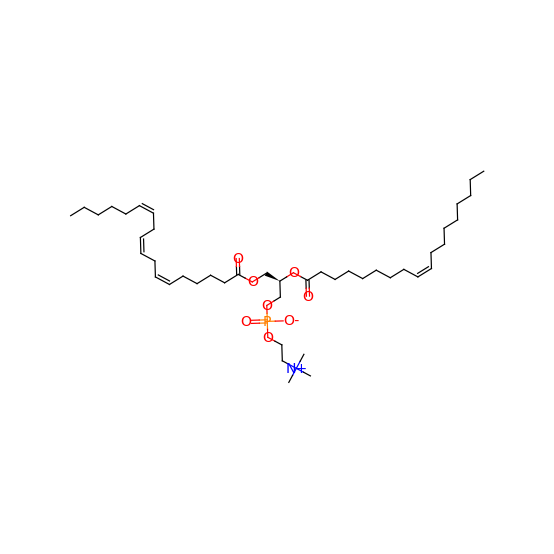

CCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\C/C=C\CCCCC


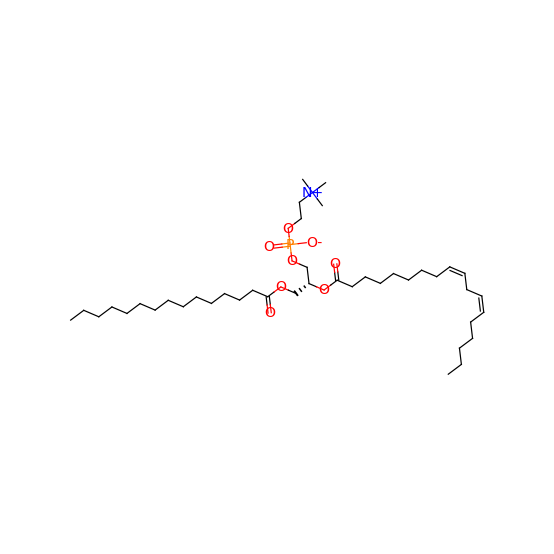

tanimoto: 0.9954022988505747
MS2Query: 0.927
CCCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCC/C=C/C/C=C/C/C=C/CCCCC


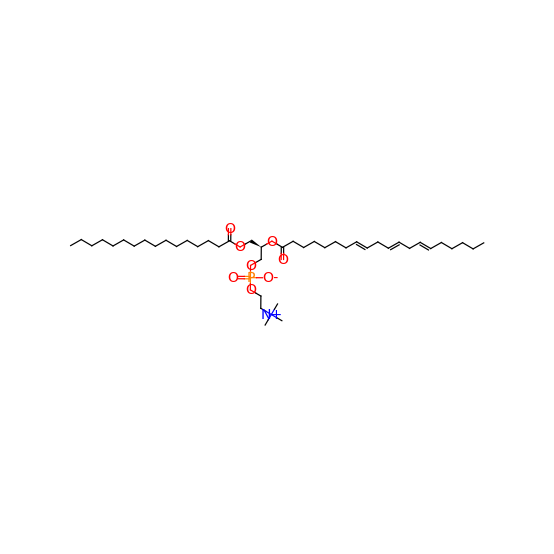

CCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\C/C=C\CCCCC


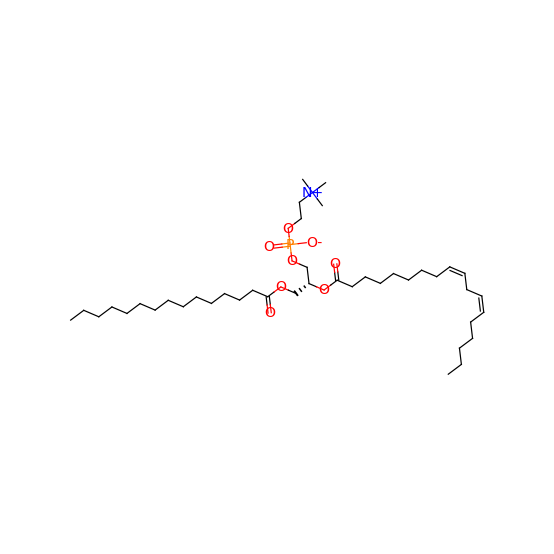

tanimoto: 0.9908466819221968
MS2Query: 0.927
CCCCCCCC/C=C\CCCCCCCC(=O)O[C@H](COC(=O)CCCC/C=C\C/C=C\C/C=C\CCCCC)COP(=O)([O-])OCC[N+](C)(C)C


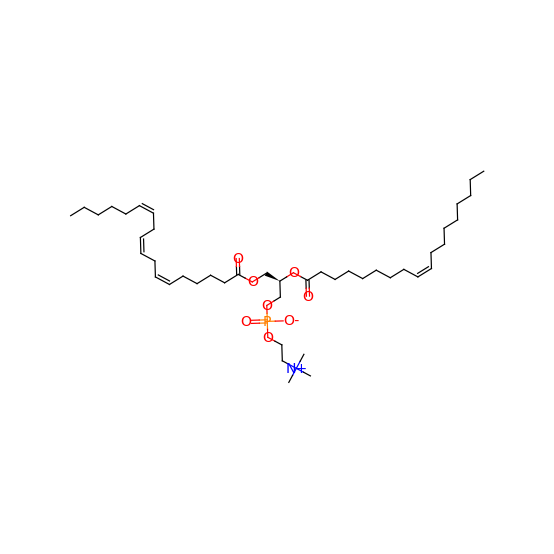

CCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\C/C=C\CCCCC


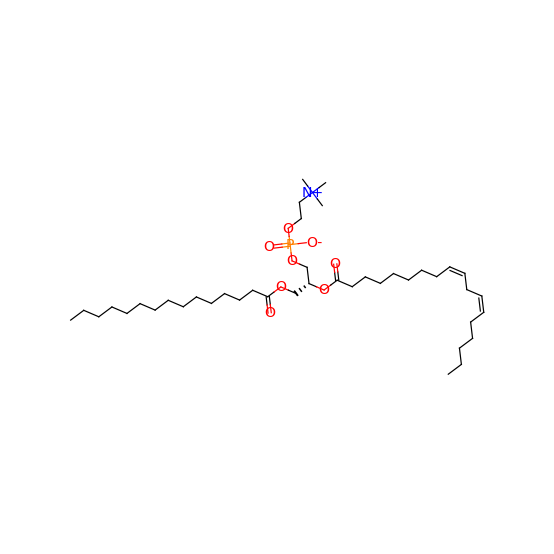

tanimoto: 0.9954022988505747
MS2Query: 0.927
CCCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCC/C=C/C/C=C/C/C=C/CCCCC


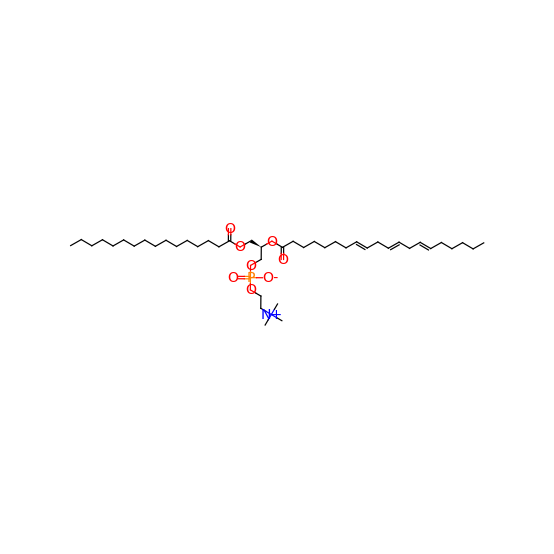

CCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\C/C=C\CCCCC


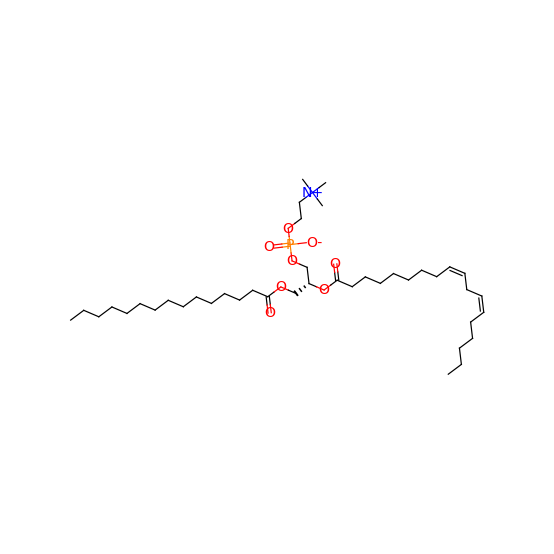

tanimoto: 0.9908466819221968
MS2Query: 0.927
CCCCCCCC/C=C\CCCCCCCC(=O)O[C@H](COC(=O)CCCC/C=C\C/C=C\C/C=C\CCCCC)COP(=O)([O-])OCC[N+](C)(C)C


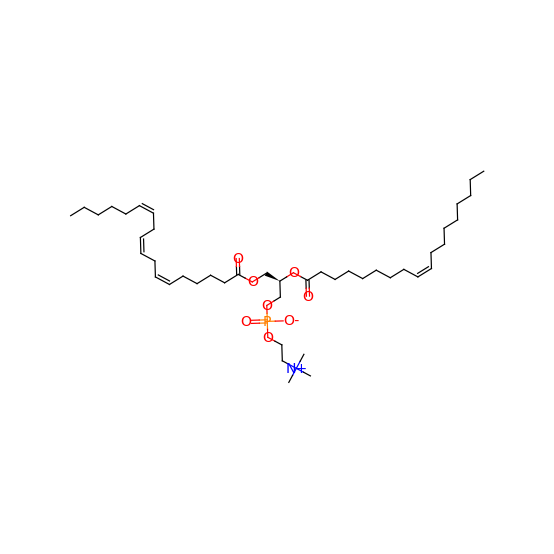

CCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\C/C=C\CCCCC


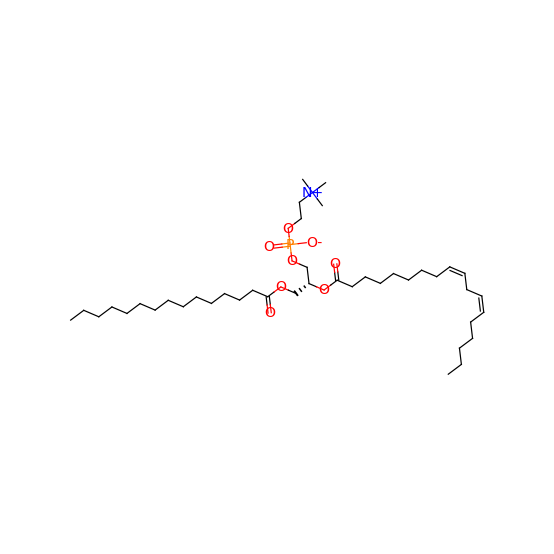

tanimoto: 0.9707207207207207
MS2Query: 0.927
CCCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCC/C=C\C/C=C\C/C=C\C/C=C\CCCCC


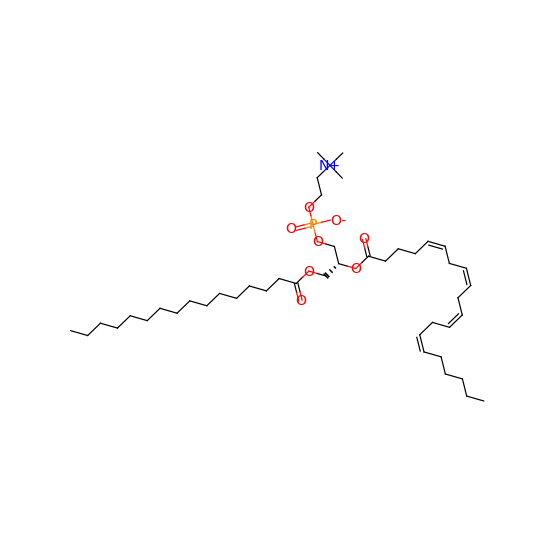

CCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\C/C=C\CCCCC


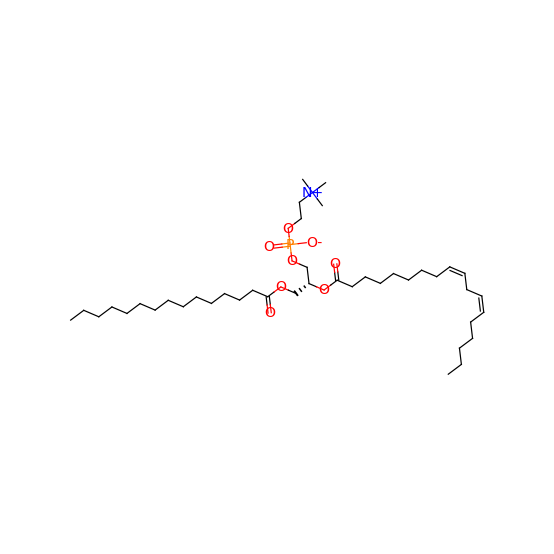

tanimoto: 0.9954022988505747
MS2Query: 0.927
CCCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCC/C=C/C/C=C/C/C=C/CCCCC


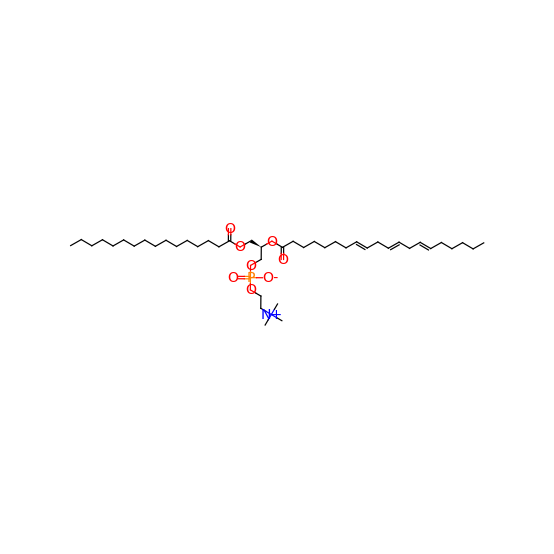

CCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\C/C=C\CCCCC


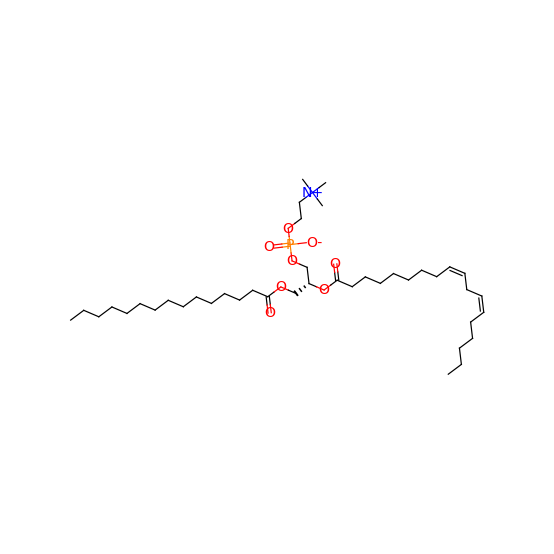

tanimoto: 0.9707207207207207
MS2Query: 0.927
CCCCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCC/C=C\C/C=C\C/C=C\C/C=C\CCCCC


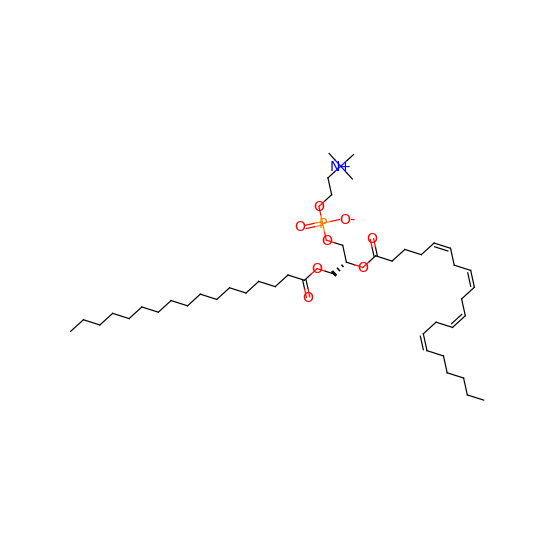

CCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\C/C=C\CCCCC


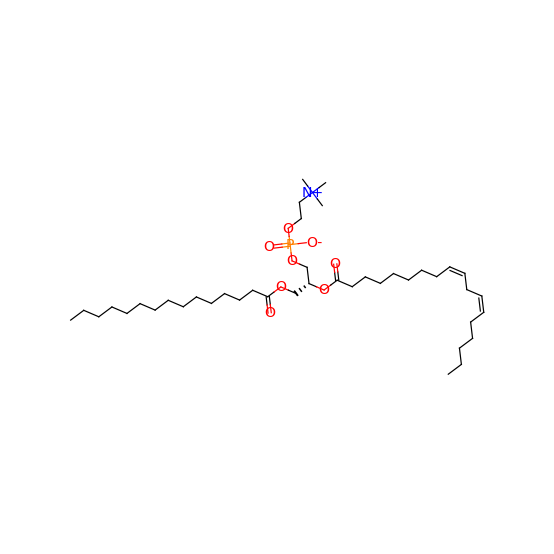

tanimoto: 0.9752252252252253
MS2Query: 0.927
CCCCC/C=C\C/C=C\CCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCC/C=C\C/C=C\C/C=C\C/C=C\CCCCC


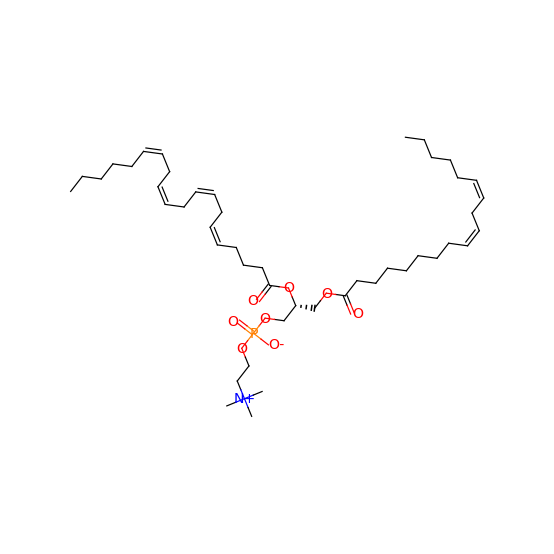

CCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\C/C=C\CCCCC


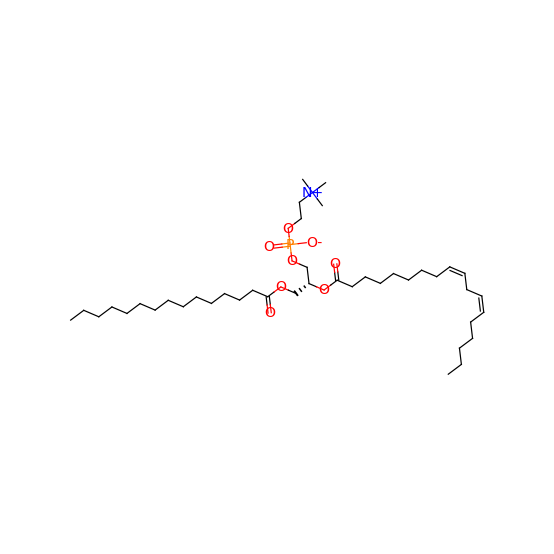

tanimoto: 0.9707207207207207
MS2Query: 0.927
CCCCCCCCCCCCCCCCCC(=O)O[C@H](COC(=O)CCC/C=C\C/C=C\C/C=C\C/C=C\CCCCC)COP(=O)([O-])OCC[N+](C)(C)C


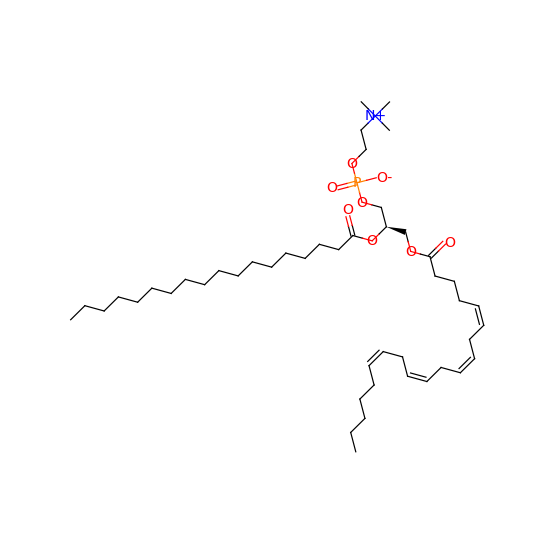

CCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\C/C=C\CCCCC


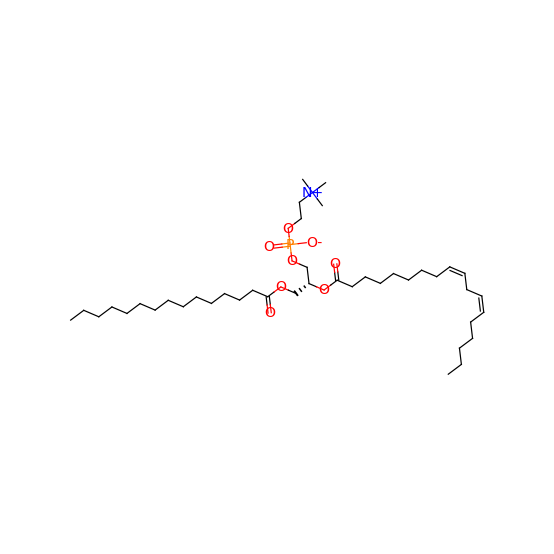

tanimoto: 0.9752252252252253
MS2Query: 0.927
CCCCC/C=C\C/C=C\CCCCCCCCCC(=O)O[C@H](COC(=O)CCC/C=C\C/C=C\C/C=C\C/C=C\C/C=C\CC)COP(=O)([O-])OCC[N+](C)(C)C


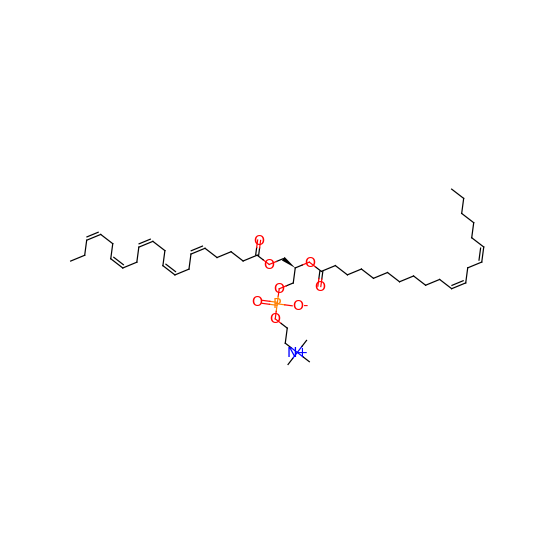

CCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\C/C=C\CCCCC


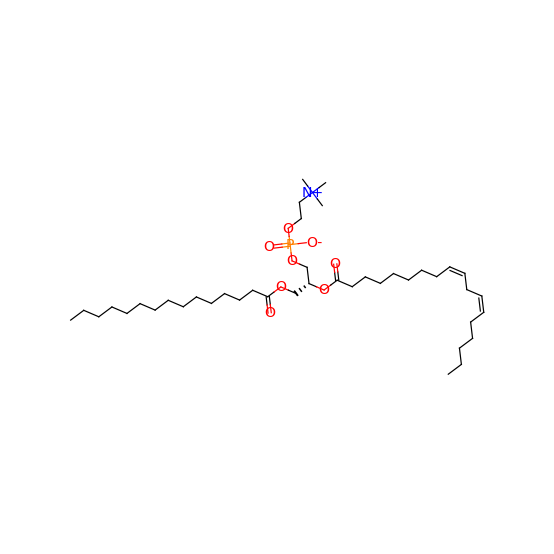

tanimoto: 0.9722863741339491
MS2Query: 0.927
CCCCCCCCC/C=C\CCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\CCCCCCC


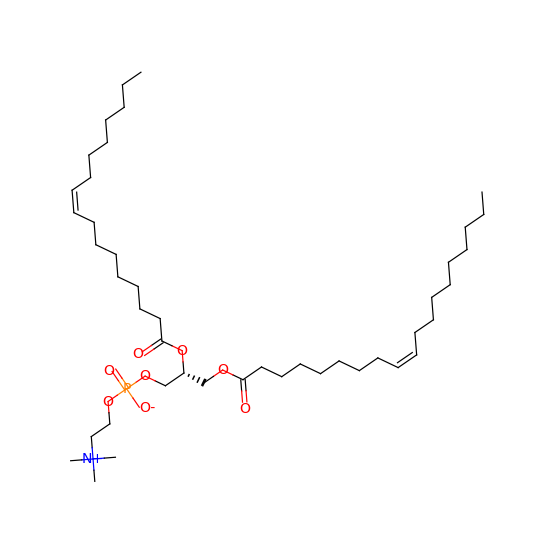

CCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\C/C=C\CCCCC


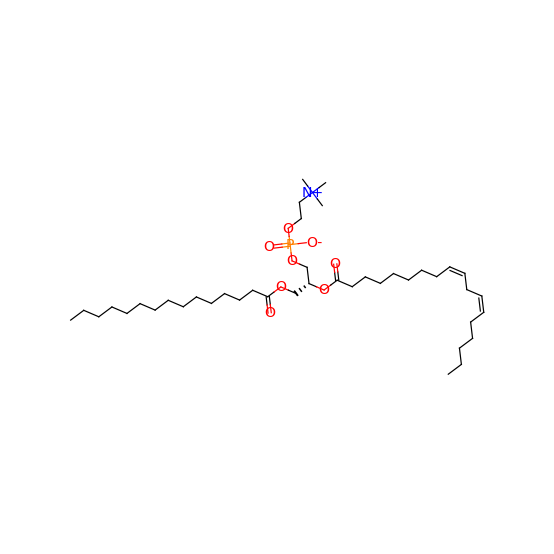

tanimoto: 0.966824644549763
MS2Query: 0.6972
CCCCCCCCCCCCCCCC/C=C\OC[C@H](COP(=O)(O)OCCN)OC(=O)CCCCCCC/C=C\CCCCCCCC


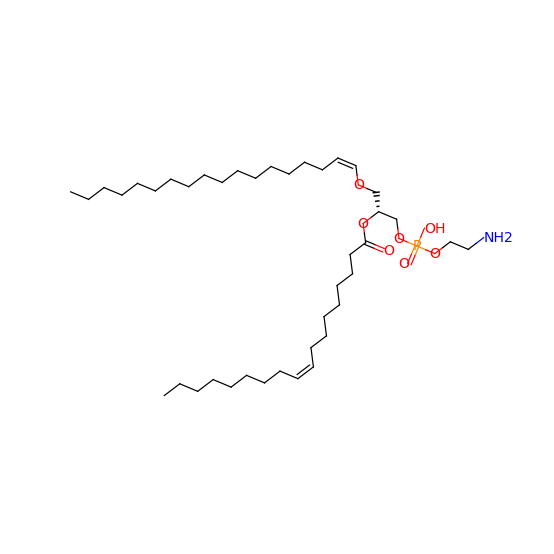

CCCCCCCCCCCCCC/C=C\OC[C@H](COP(=O)(O)OCCN)OC(=O)CCCCCC/C=C\C/C=C\C/C=C\CCCCC


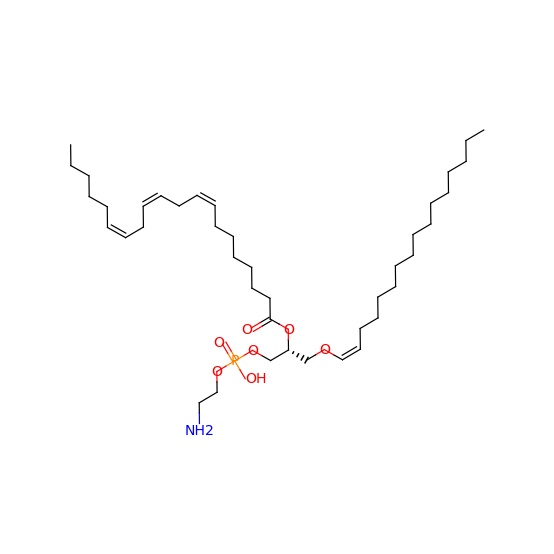

tanimoto: 0.966824644549763
MS2Query: 0.6337
CCCCCCCCCCCCCC/C=C\OC[C@H](COP(=O)(O)OCCN)OC(=O)CCCCCCC/C=C\CCCCCCCC


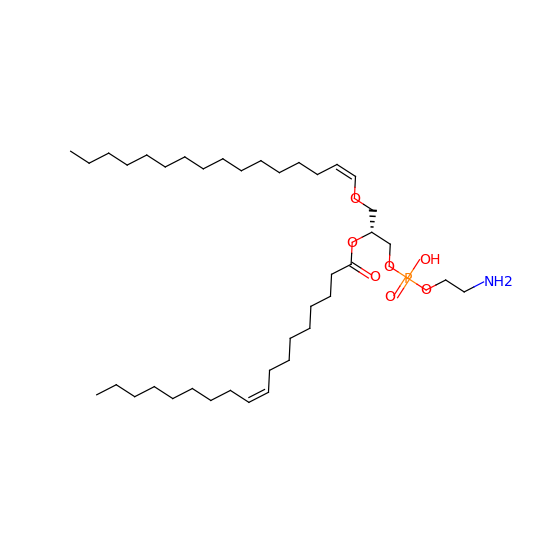

CCCCCCCCCCCCCC/C=C\OC[C@H](COP(=O)(O)OCCN)OC(=O)CCCCCC/C=C\C/C=C\C/C=C\CCCCC


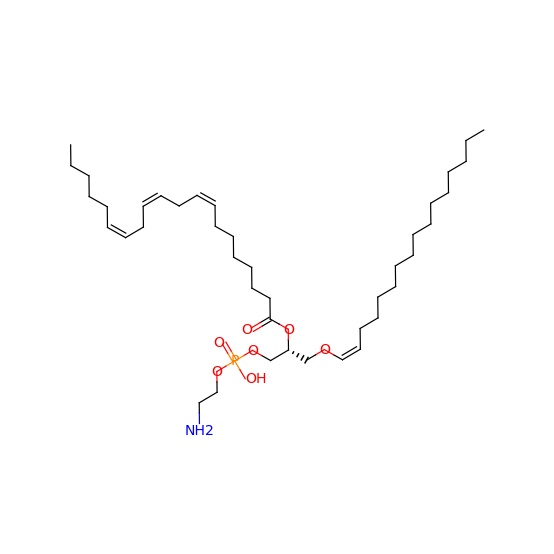

tanimoto: 0.9954022988505747
MS2Query: 0.927
CCCCCC/C=C\CCCCCCCC(=O)O[C@H](COC(=O)CCCCCC/C=C\C/C=C\C/C=C\C/C=C\CC)COP(=O)([O-])OCC[N+](C)(C)C


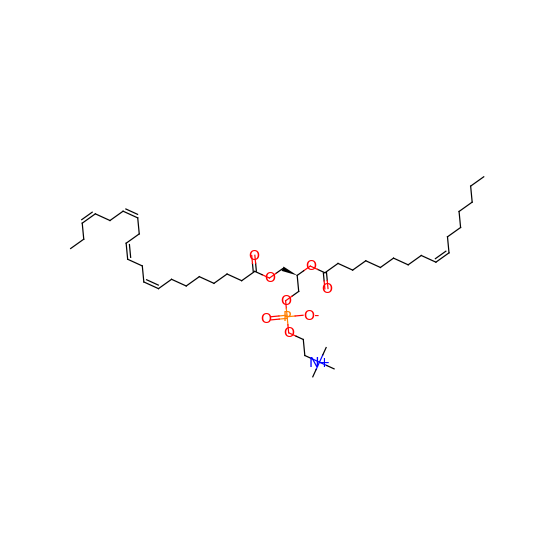

CCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\C/C=C\CCCCC


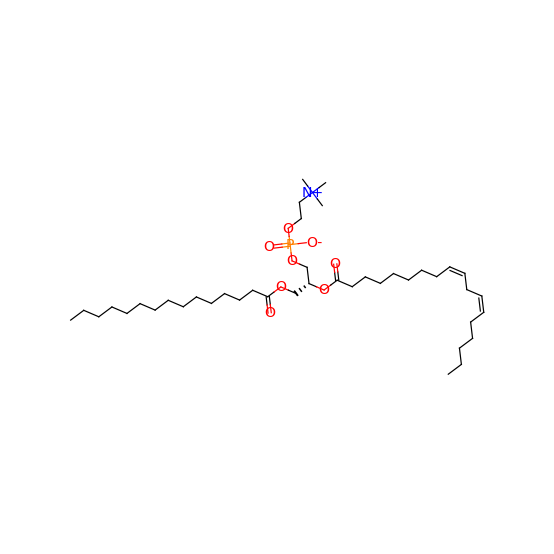

tanimoto: 0.9954022988505747
MS2Query: 0.927
CCCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCC/C=C/C/C=C/C/C=C/CCCCC


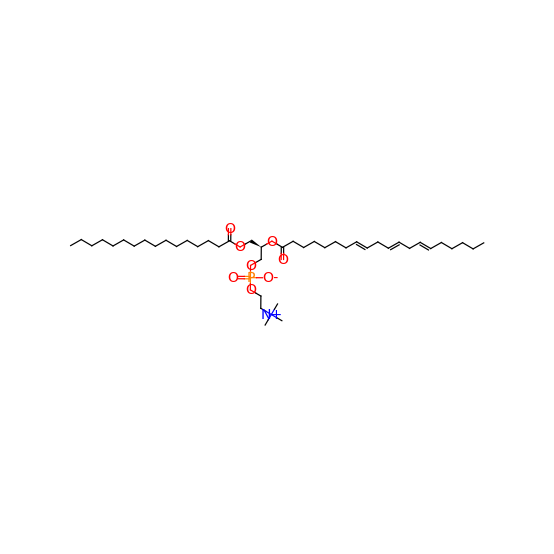

CCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\C/C=C\CCCCC


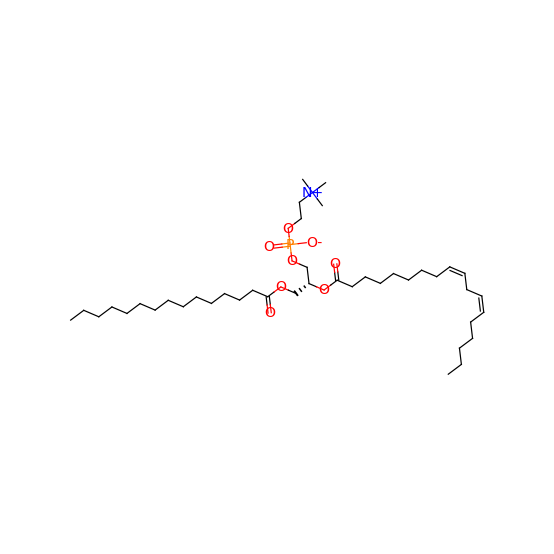

tanimoto: 0.9054054054054054
MS2Query: 0.927
CCCCCCCC/C=C\CCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCC/C=C\C/C=C\C/C=C\C/C=C\CCCCC


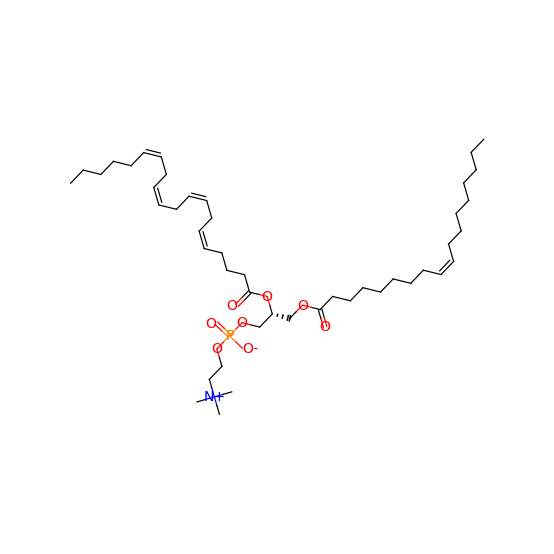

CCCCCCCCCCCCCCCCCCCCCCCC(=O)O[C@H](COC(=O)CCCCCCCCCCCCCCC)COP(=O)([O-])OCC[N+](C)(C)C


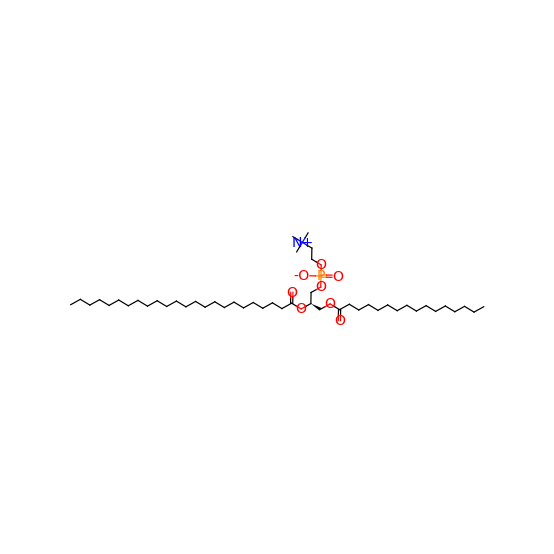

tanimoto: 0.9707207207207207
MS2Query: 0.927
CCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCC/C=C\C/C=C\C/C=C\C/C=C\CCCCC


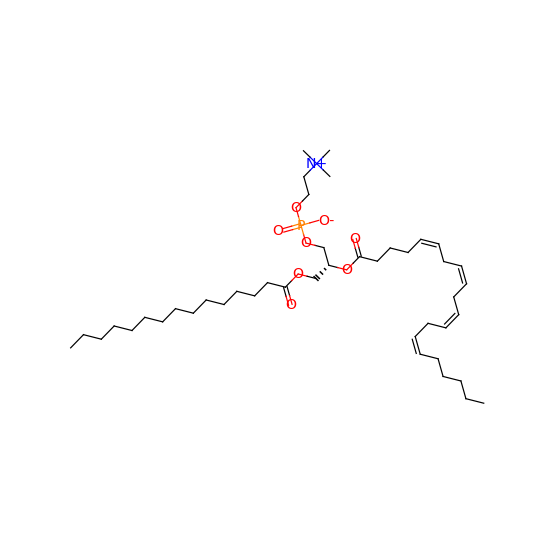

CCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\C/C=C\CCCCC


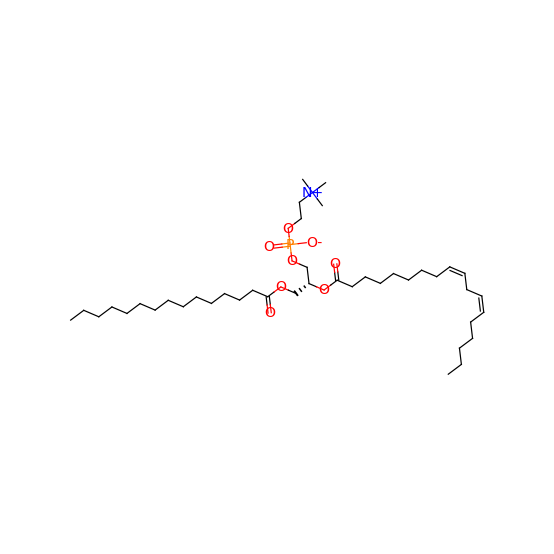

tanimoto: 0.9954022988505747
MS2Query: 0.927
CCCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCC/C=C/C/C=C/C/C=C/CCCCC


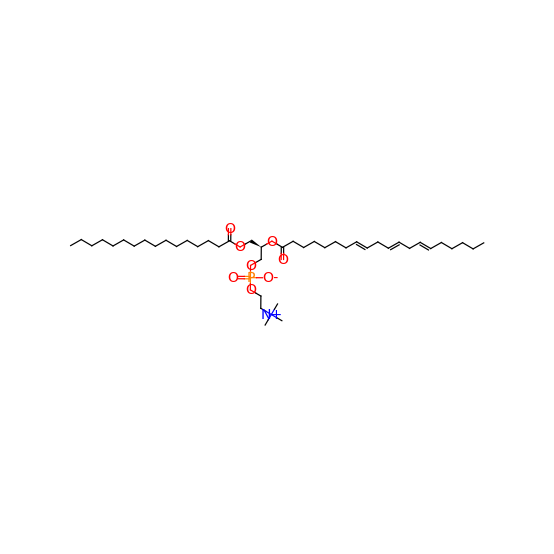

CCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\C/C=C\CCCCC


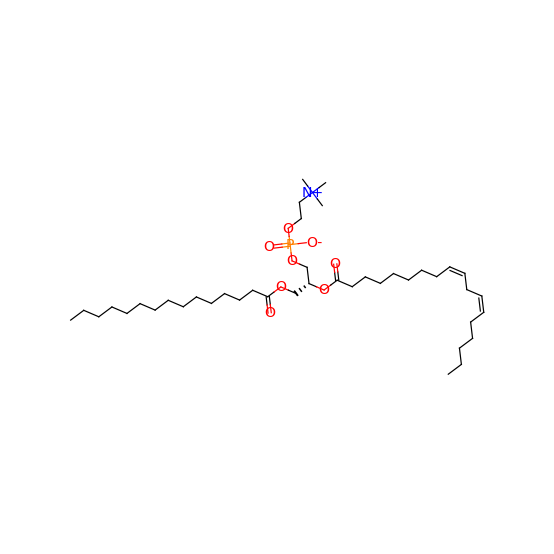

tanimoto: 0.9095022624434389
MS2Query: 0.927
CCCCCCCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCC/C=C\C/C=C\C/C=C\C/C=C\CCCCC


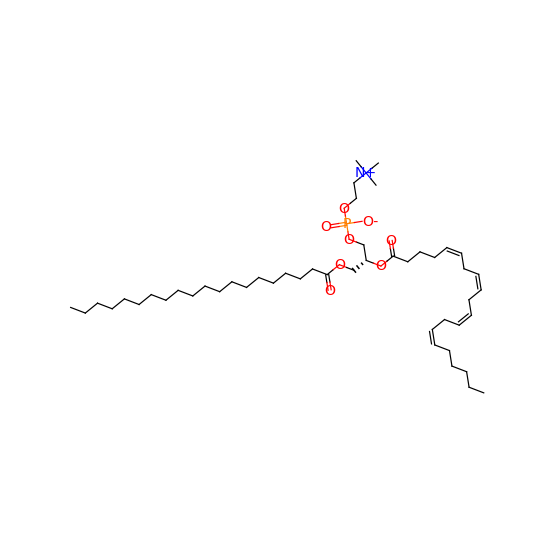

CCCCCCCCCCCCCCCCCCCCCCCC(=O)O[C@H](COC(=O)CCCCCCCCCCCCCCC)COP(=O)([O-])OCC[N+](C)(C)C


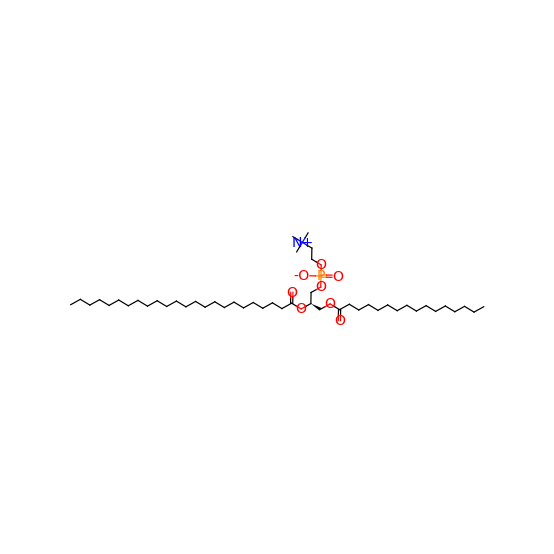

tanimoto: 0.9284064665127021
MS2Query: 0.927
CCCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C/C/C=C/CCCCC


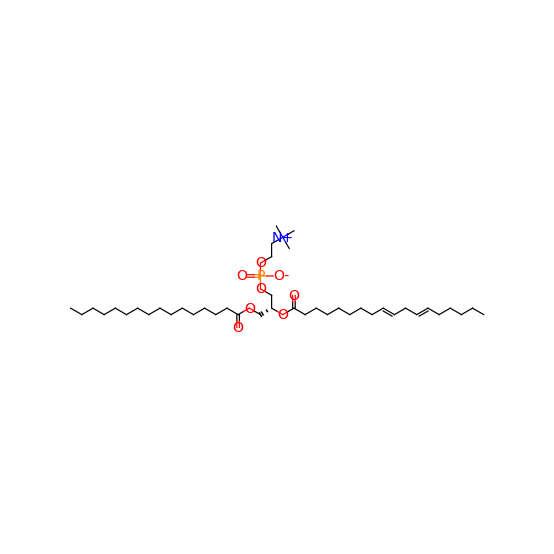

CCCCCCCCCCCCCCCCCCCCCCCC(=O)O[C@H](COC(=O)CCCCCCCCCCCCCCC)COP(=O)([O-])OCC[N+](C)(C)C


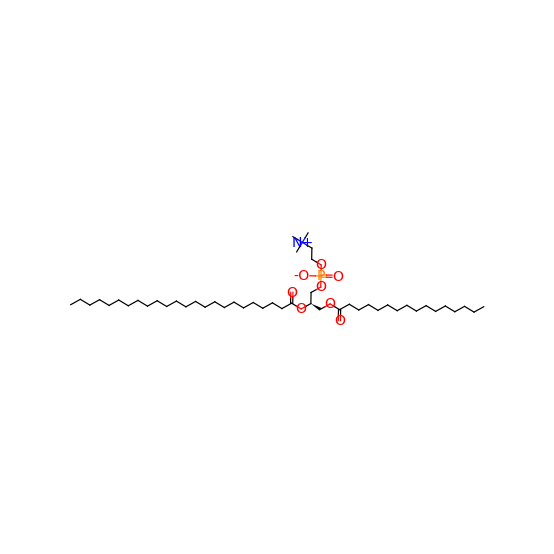

tanimoto: 0.966824644549763
MS2Query: 0.6337
CCCCCCCCCCCCCCCC/C=C\OC[C@H](COP(=O)(O)OCCN)OC(=O)CCCCCCC/C=C\CCCCCCCC


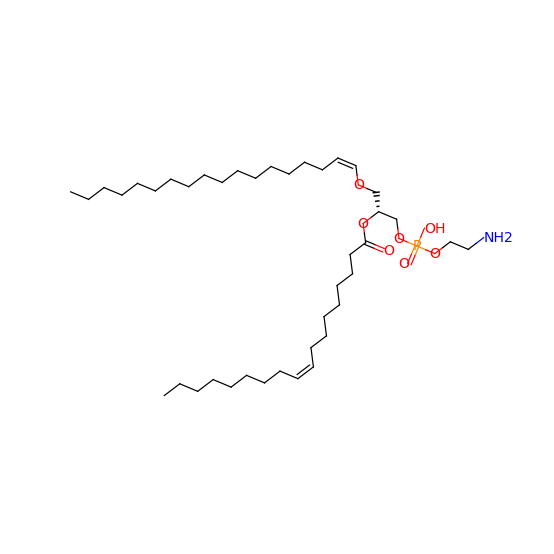

CCCCCCCCCCCCCC/C=C\OC[C@H](COP(=O)(O)OCCN)OC(=O)CCCCCC/C=C\C/C=C\C/C=C\CCCCC


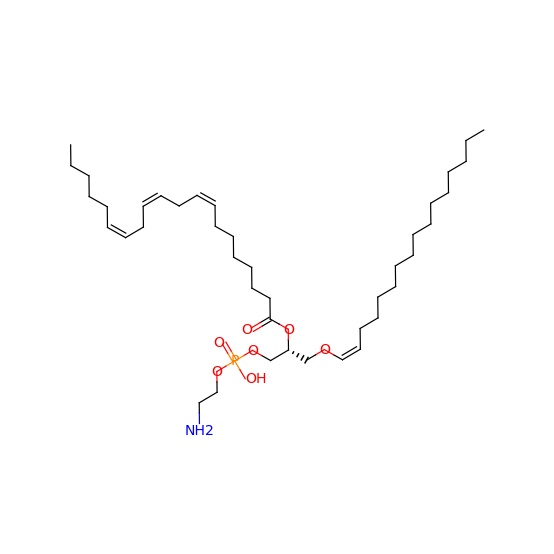

tanimoto: 0.9722863741339491
MS2Query: 0.9135
CCCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\CCCCCCCC


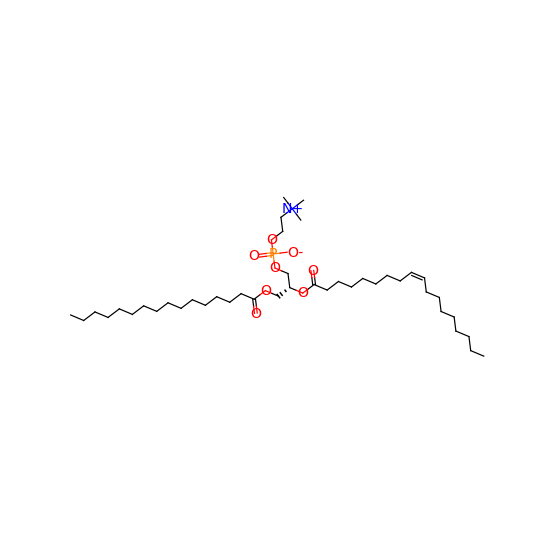

CCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\C/C=C\CCCCC


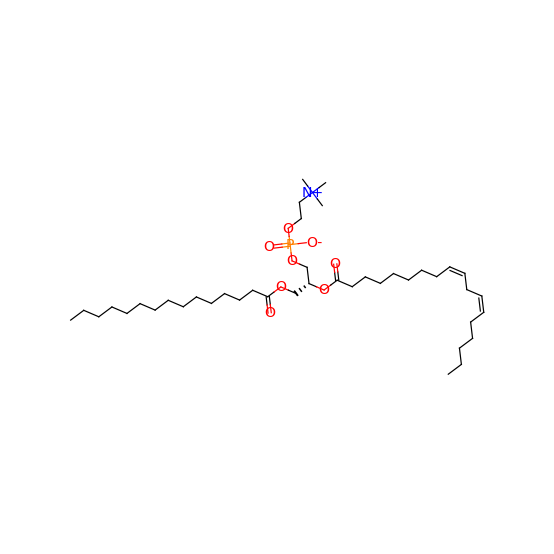

tanimoto: 0.9707207207207207
MS2Query: 0.927
CCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCC/C=C\C/C=C\C/C=C\C/C=C\CCCCC


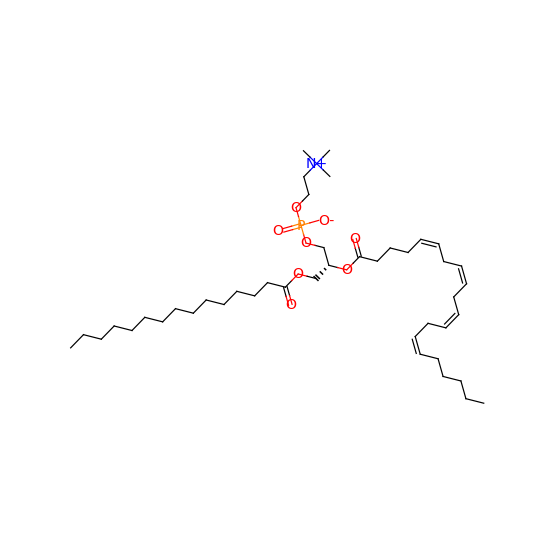

CCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\C/C=C\CCCCC


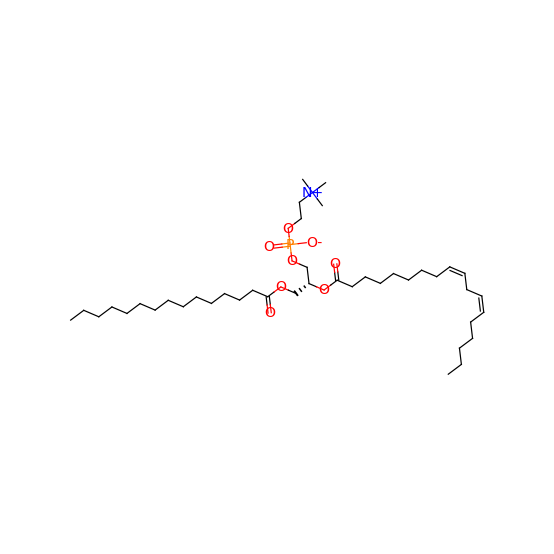

tanimoto: 0.9954022988505747
MS2Query: 0.927
CCCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCC/C=C/C/C=C/C/C=C/CCCCC


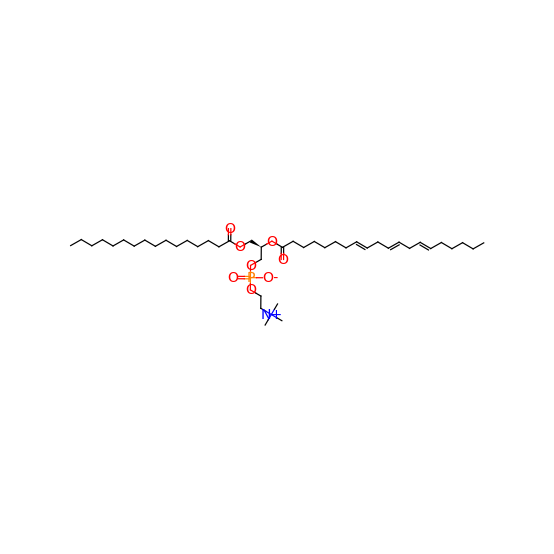

CCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\C/C=C\CCCCC


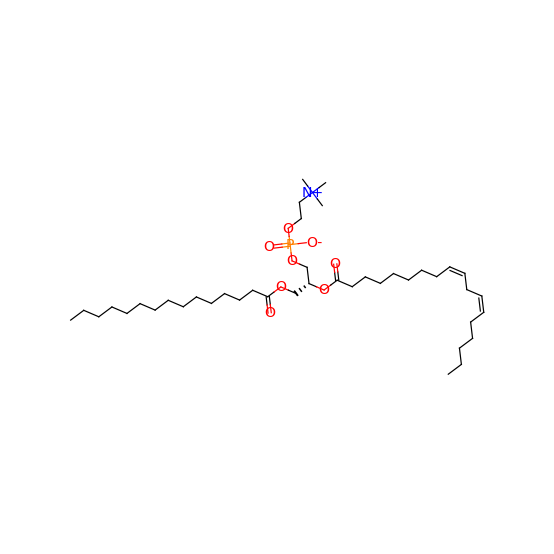

tanimoto: 0.9908466819221968
MS2Query: 0.927
CCCCCCCC/C=C\CCCCCCCC(=O)O[C@H](COC(=O)CCCC/C=C\C/C=C\C/C=C\CCCCC)COP(=O)([O-])OCC[N+](C)(C)C


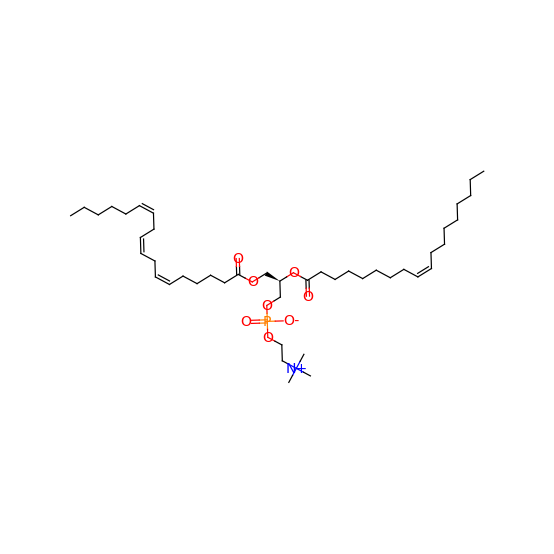

CCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\C/C=C\CCCCC


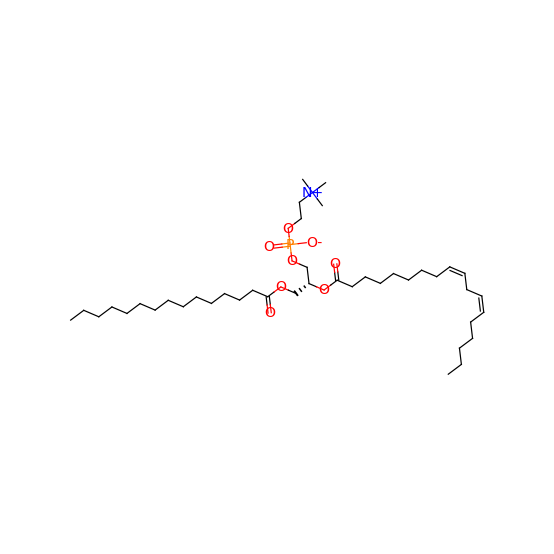

tanimoto: 0.9954022988505747
MS2Query: 0.927
CCCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCC/C=C/C/C=C/C/C=C/CCCCC


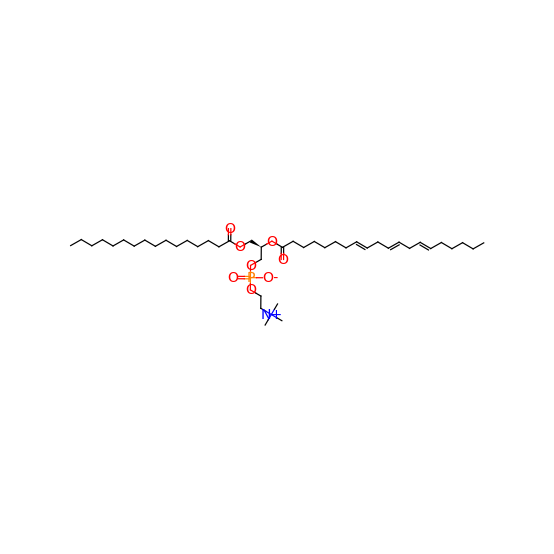

CCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\C/C=C\CCCCC


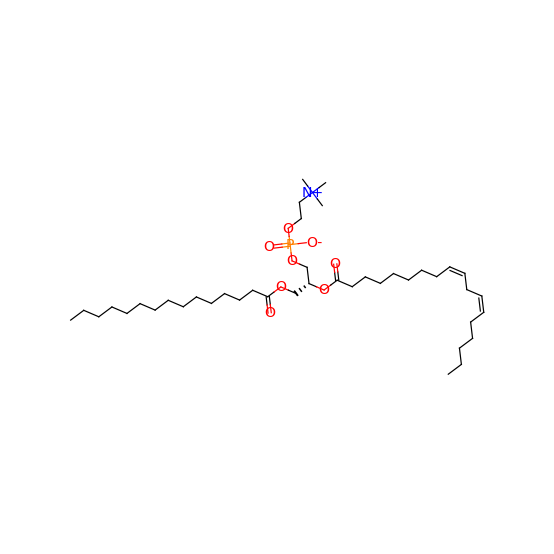

tanimoto: 0.9908466819221968
MS2Query: 0.927
CCCCCCCC/C=C\CCCCCCCC(=O)O[C@H](COC(=O)CCCC/C=C\C/C=C\C/C=C\CCCCC)COP(=O)([O-])OCC[N+](C)(C)C


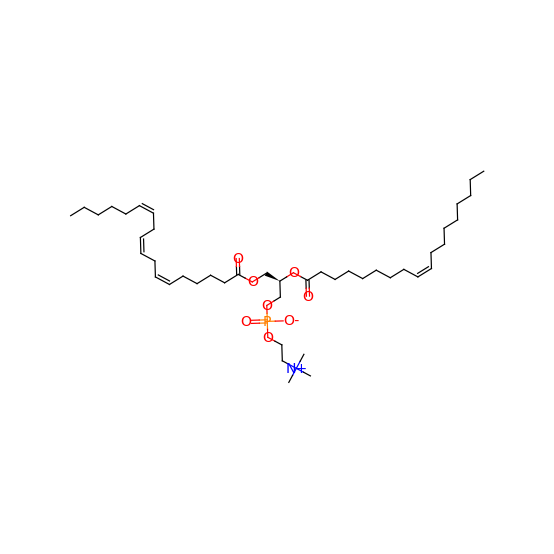

CCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\C/C=C\CCCCC


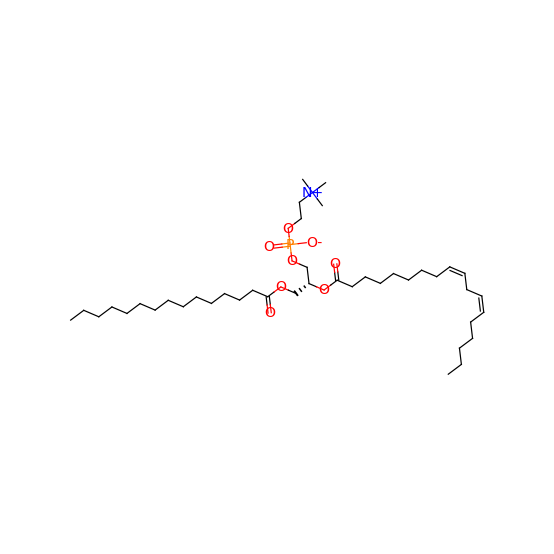

tanimoto: 0.9707207207207207
MS2Query: 0.927
CCCCCCCCCCCCCCCCCC(=O)O[C@H](COC(=O)CCC/C=C\C/C=C\C/C=C\C/C=C\CCCCC)COP(=O)([O-])OCC[N+](C)(C)C


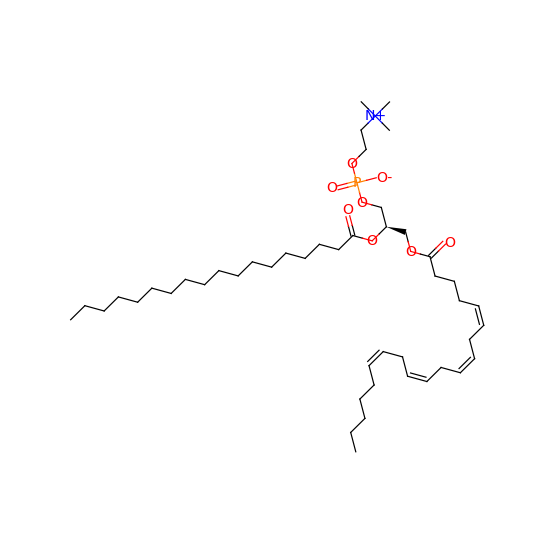

CCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\C/C=C\CCCCC


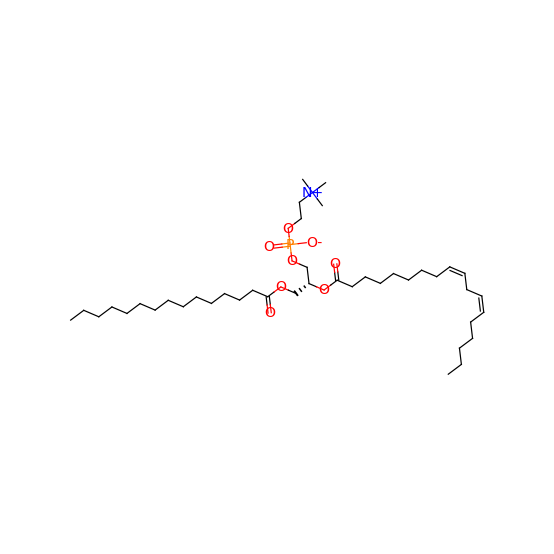

tanimoto: 0.9722863741339491
MS2Query: 0.927
CCCCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\CCCCCCCC


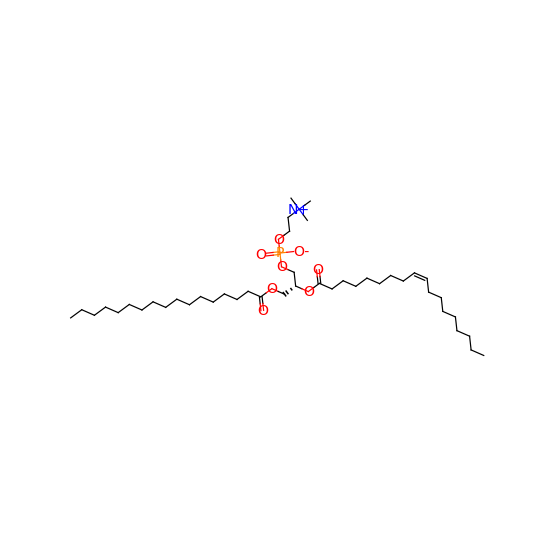

CCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\C/C=C\CCCCC


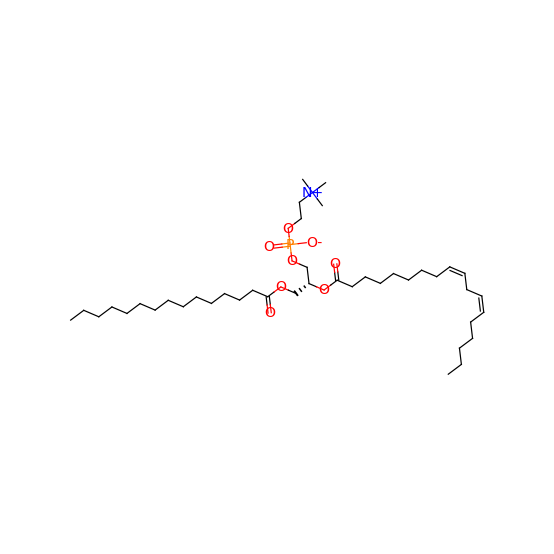

tanimoto: 0.9284064665127021
MS2Query: 0.927
CCCCCCCCCCCCCCC(=O)O[C@H](COC(=O)CCCCCCCCC/C=C\C/C=C\CCCCC)COP(=O)([O-])OCC[N+](C)(C)C


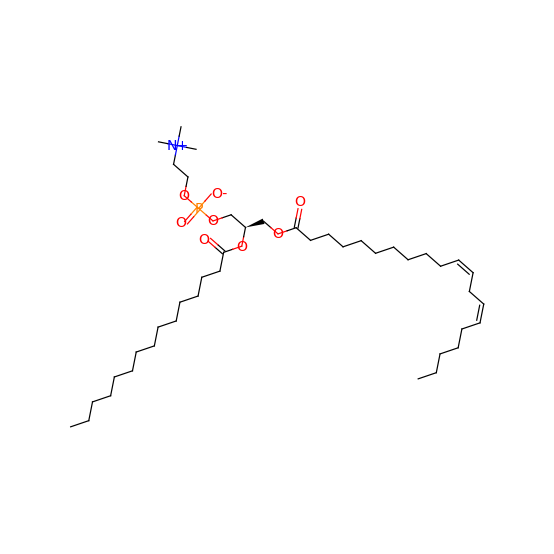

CCCCCCCCCCCCCC(=O)O[C@H](COC(=O)CCCCCCCCCCC)COP(=O)([O-])OCC[N+](C)(C)C


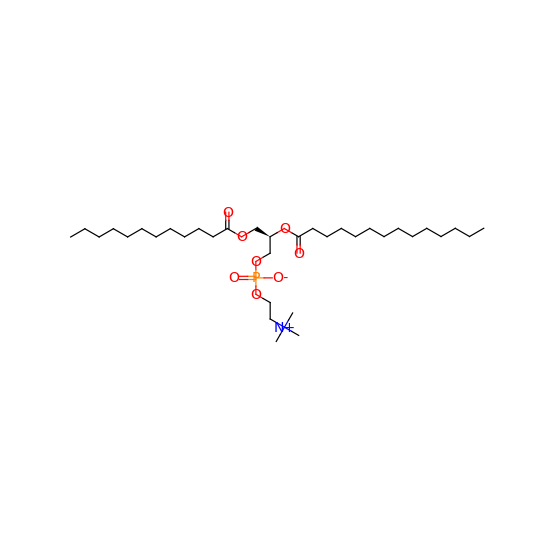

tanimoto: 0.9954022988505747
MS2Query: 0.927
CCCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCC/C=C/C/C=C/C/C=C/CCCCC


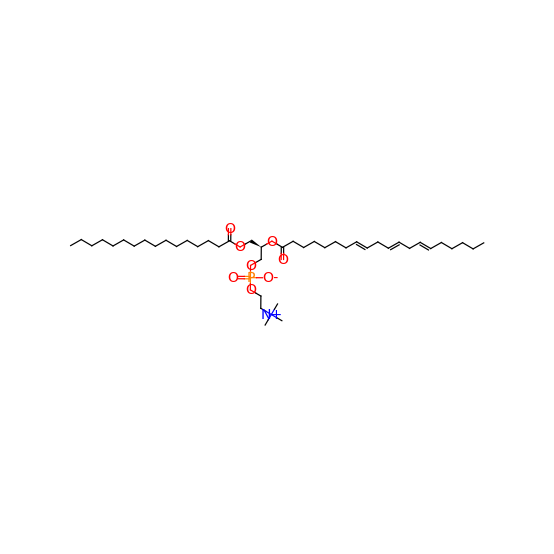

CCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\C/C=C\CCCCC


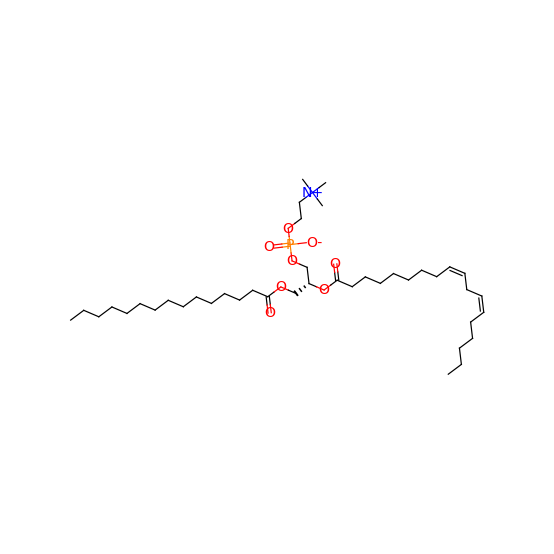

tanimoto: 0.9954022988505747
MS2Query: 0.927
CCCCCC/C=C\CCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCC/C=C\C/C=C\C/C=C\C/C=C\C/C=C\CC


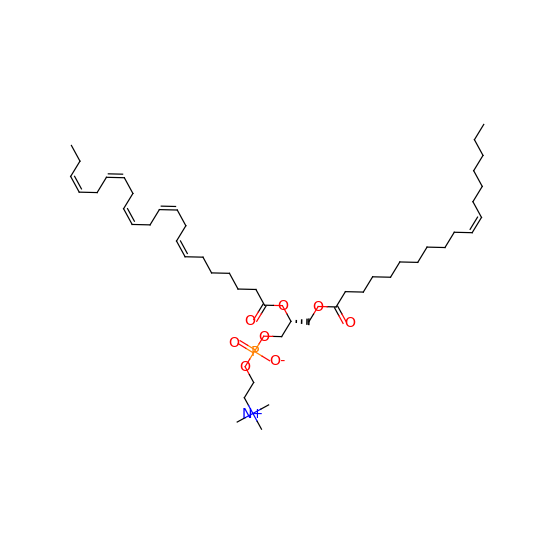

CCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\C/C=C\CCCCC


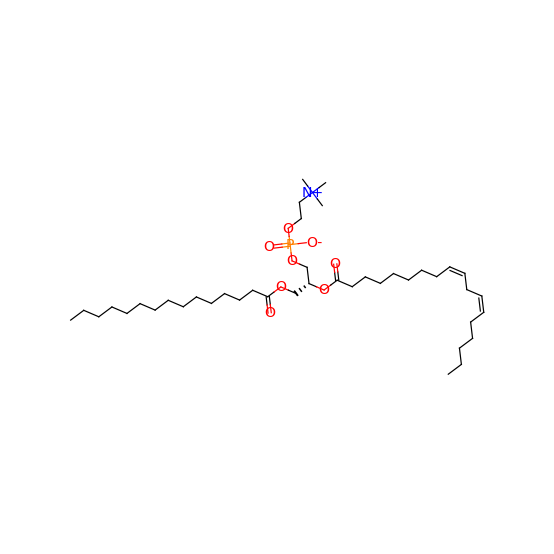

tanimoto: 0.9707207207207207
MS2Query: 0.927
CCCCCCCCCCCCCCCCCC(=O)O[C@H](COC(=O)CCC/C=C\C/C=C\C/C=C\C/C=C\CCCCC)COP(=O)([O-])OCC[N+](C)(C)C


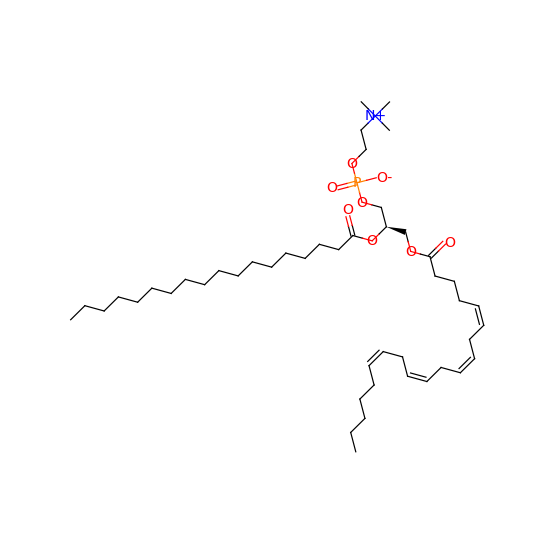

CCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\C/C=C\CCCCC


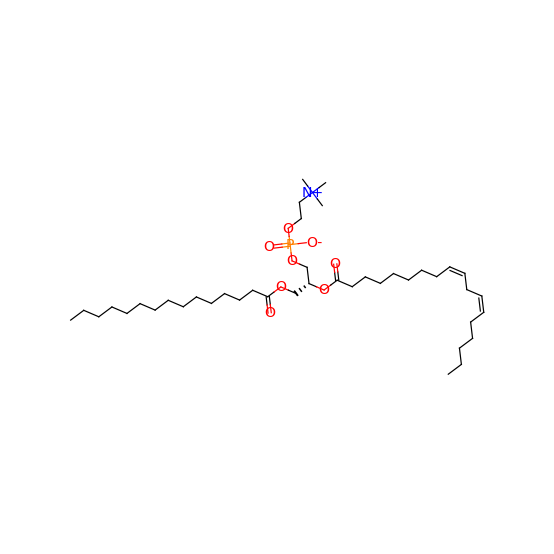

tanimoto: 0.9752252252252253
MS2Query: 0.927
CCCCCCCC/C=C\CCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCC/C=C\C/C=C\C/C=C\C/C=C\CCCCC


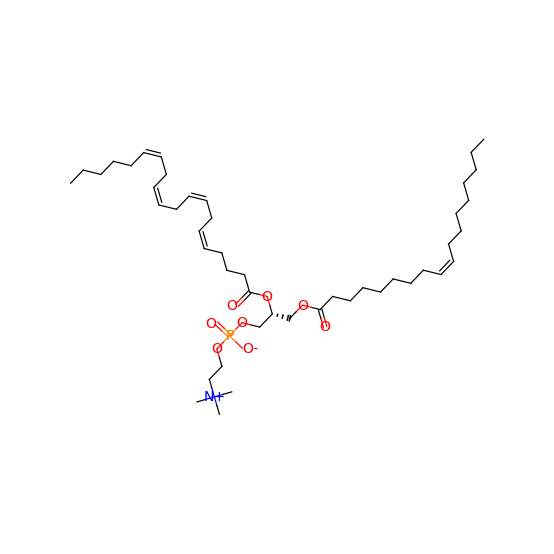

CCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\C/C=C\CCCCC


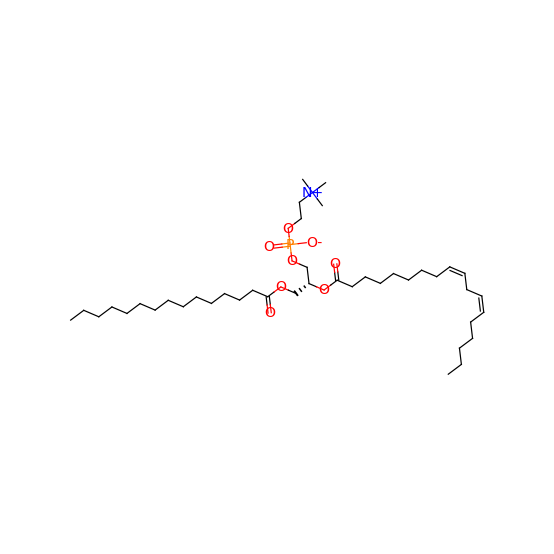

tanimoto: 0.9954022988505747
MS2Query: 0.927
CCCCCC/C=C\CCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCC/C=C\C/C=C\C/C=C\C/C=C\C/C=C\CC


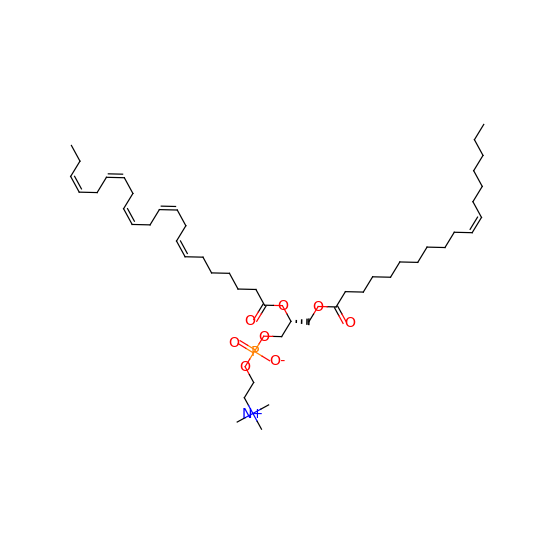

CCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\C/C=C\CCCCC


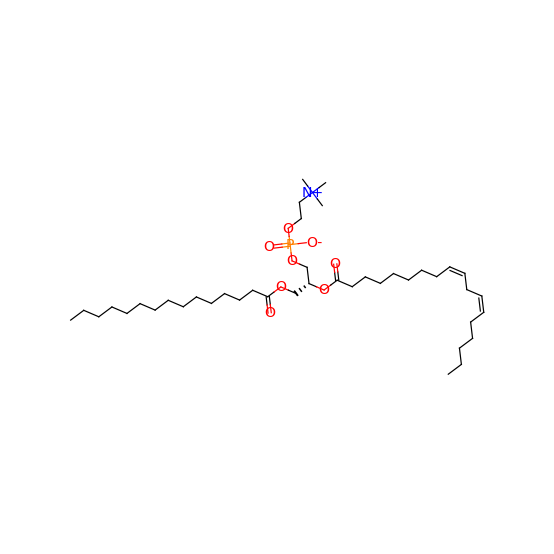

tanimoto: 0.9539473684210527
MS2Query: 0.927
CCCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCC/C=C/C/C=C/C/C=C/CCCCC


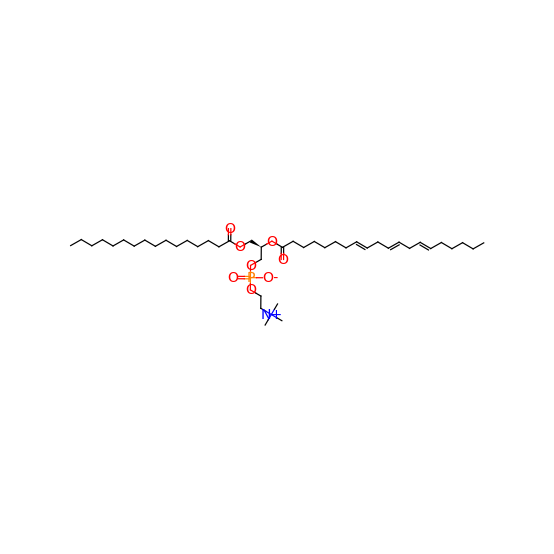

CCCCCCCC/C=C\CCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CC/C=C\C/C=C\C/C=C\C/C=C\C/C=C\C/C=C\CC


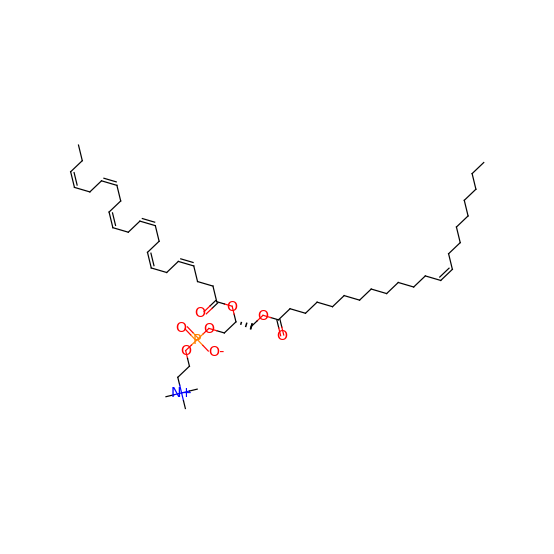

tanimoto: 0.9539473684210527
MS2Query: 0.927
CCCCCC/C=C\CCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCC/C=C\C/C=C\C/C=C\C/C=C\C/C=C\CC


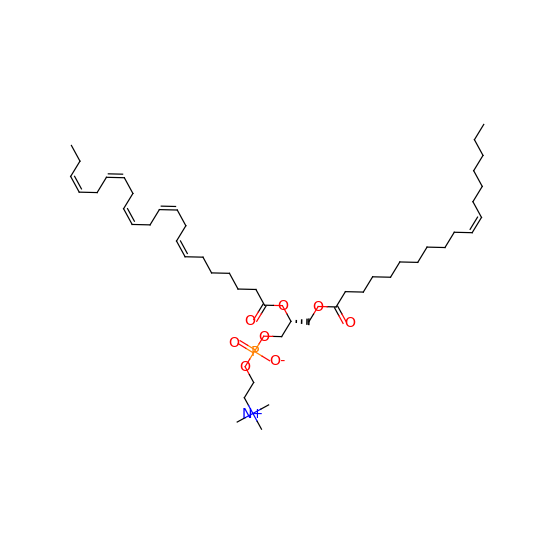

CCCCCCCC/C=C\CCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CC/C=C\C/C=C\C/C=C\C/C=C\C/C=C\C/C=C\CC


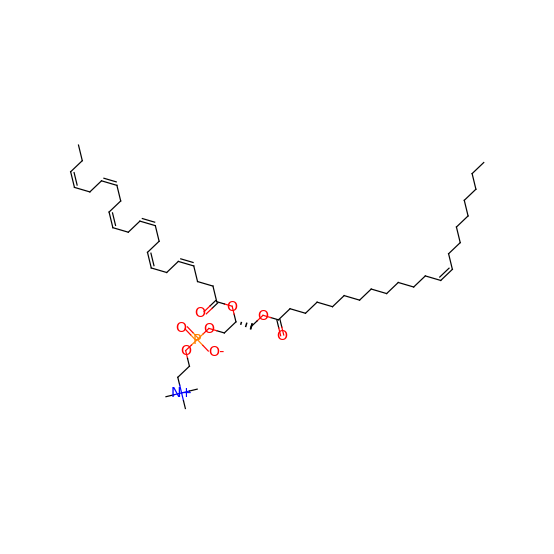

tanimoto: 0.9707207207207207
MS2Query: 0.927
CCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCC/C=C\C/C=C\C/C=C\C/C=C\CCCCC


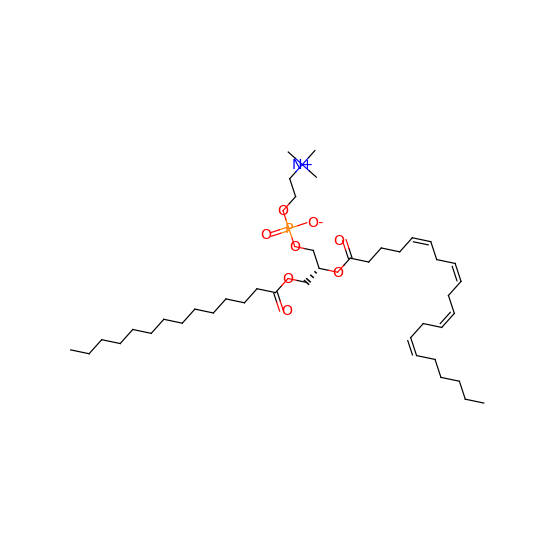

CCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\C/C=C\CCCCC


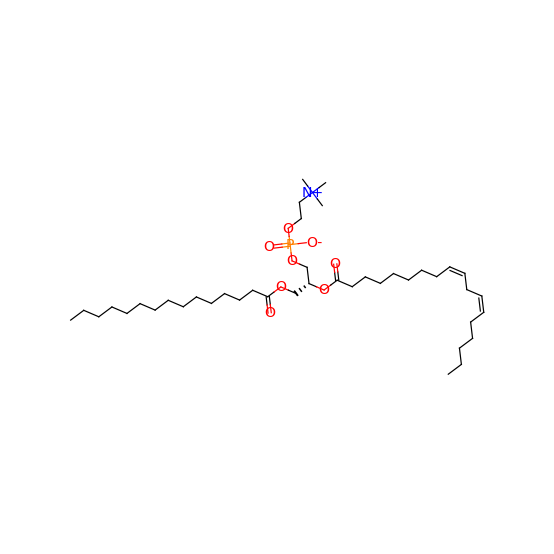

tanimoto: 0.9752252252252253
MS2Query: 0.927
CCCCCC/C=C\CCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCC/C=C\C/C=C\C/C=C\C/C=C\C/C=C\CC


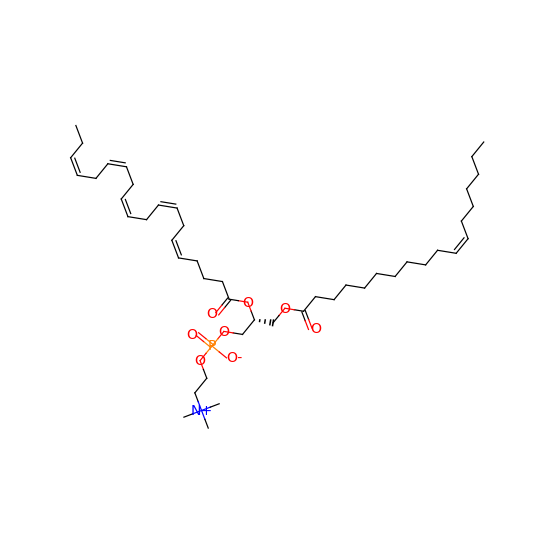

CCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\C/C=C\CCCCC


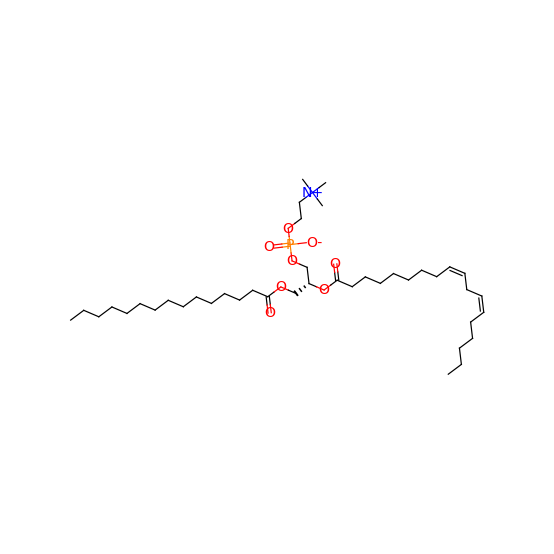

tanimoto: 0.9707207207207207
MS2Query: 0.927
CCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCC/C=C\C/C=C\C/C=C\C/C=C\CCCCC


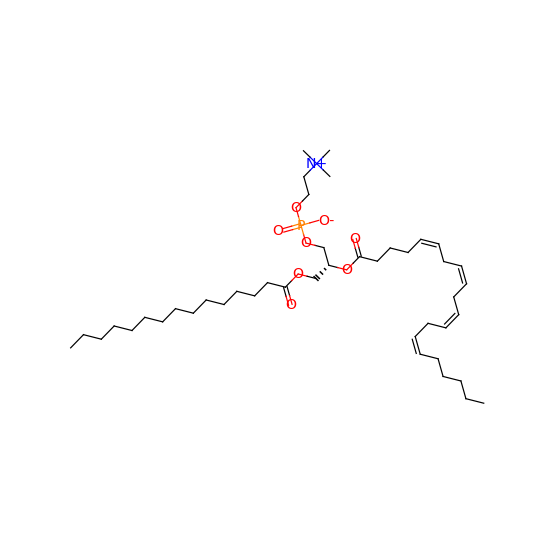

CCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\C/C=C\CCCCC


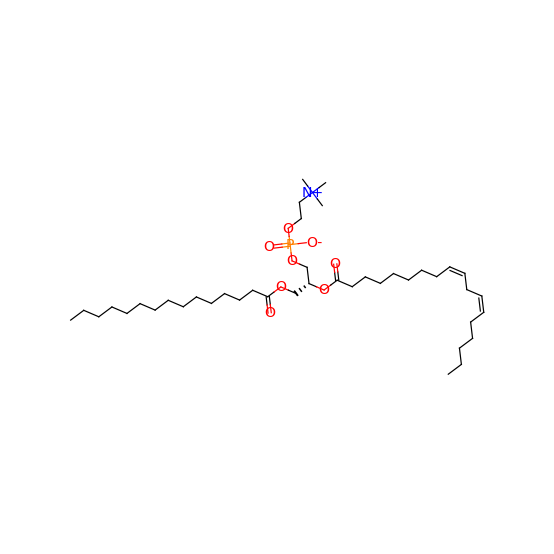

tanimoto: 0.9752252252252253
MS2Query: 0.927
CCCCC/C=C\C/C=C\CCCCCCCCCC(=O)O[C@H](COC(=O)CCC/C=C\C/C=C\C/C=C\C/C=C\C/C=C\CC)COP(=O)([O-])OCC[N+](C)(C)C


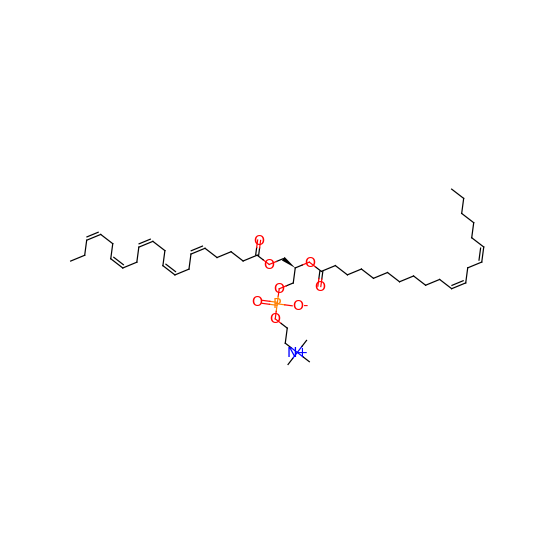

CCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\C/C=C\CCCCC


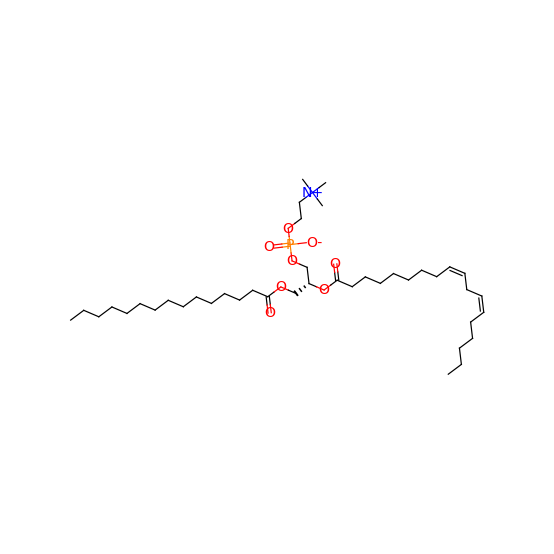

tanimoto: 0.9722863741339491
MS2Query: 0.927
CCCCCCCC/C=C\CCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\CCCCCCCC


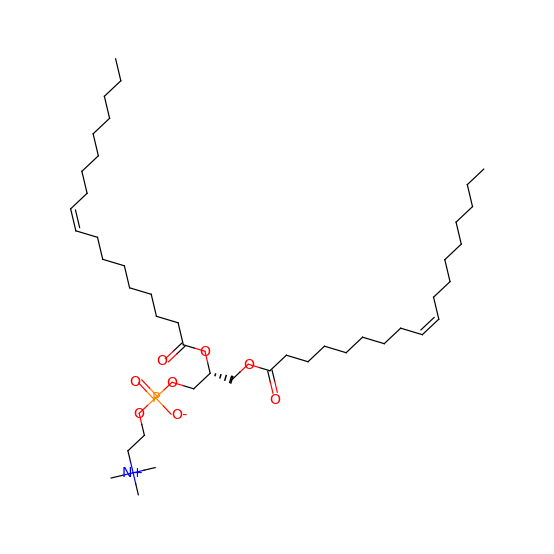

CCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\C/C=C\CCCCC


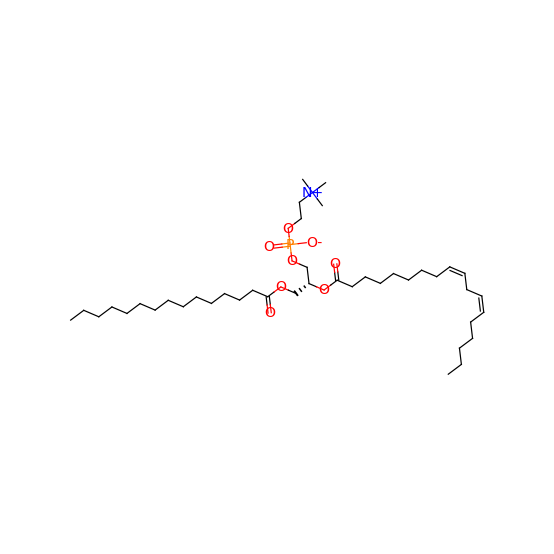

tanimoto: 0.9054054054054054
MS2Query: 0.927
CCCCC/C=C\C/C=C\CCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCC/C=C\C/C=C\C/C=C\C/C=C\CCCCC


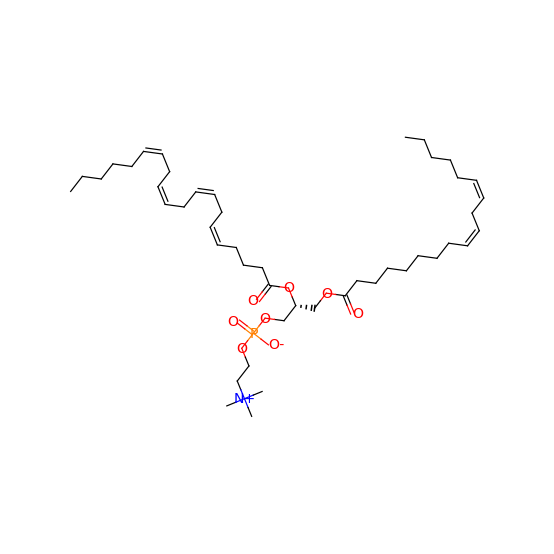

CCCCCCCCCCCCCCCCCCCCCCCC(=O)O[C@H](COC(=O)CCCCCCCCCCCCCCC)COP(=O)([O-])OCC[N+](C)(C)C


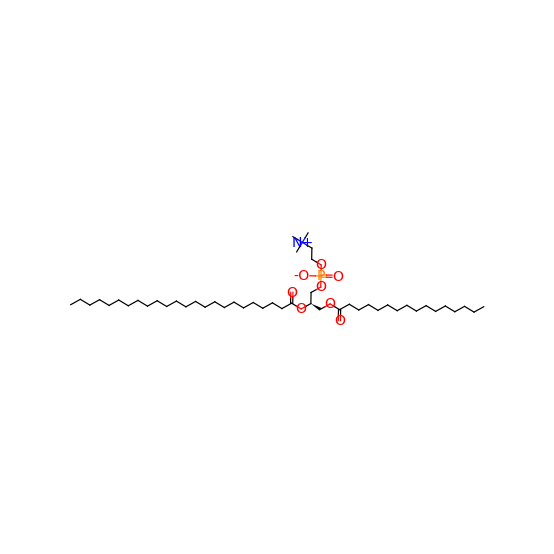

tanimoto: 0.9548693586698337
MS2Query: 0.927
CCCCCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCCCCCC/C=C\CCCCCCCC


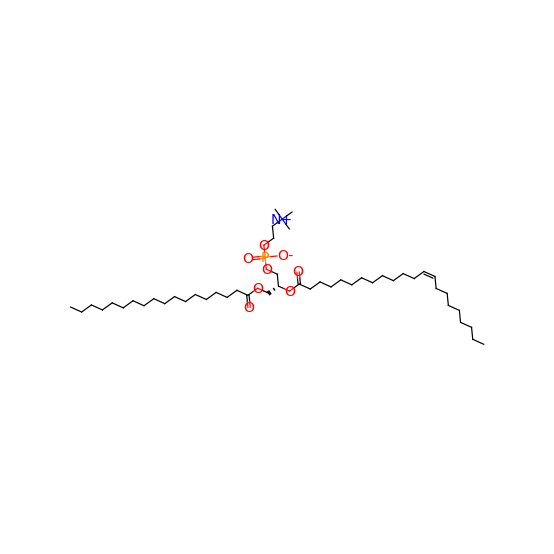

CCCCCCCCCCCCCCCCCCCCCCCC(=O)O[C@H](COC(=O)CCCCCCCCCCCCCCC)COP(=O)([O-])OCC[N+](C)(C)C


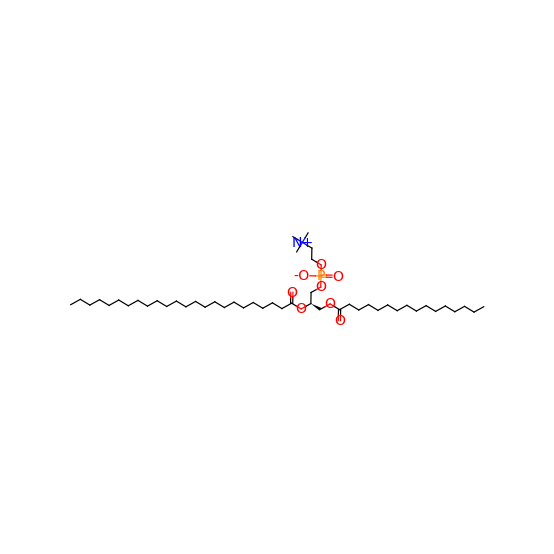

tanimoto: 0.919908466819222
MS2Query: 0.8243
CCCCCCCC/C=C\CCCCCCCC(=O)O[C@H](COC(=O)CCCC/C=C\C/C=C\C/C=C\CCCCC)COP(=O)([O-])OCC[N+](C)(C)C


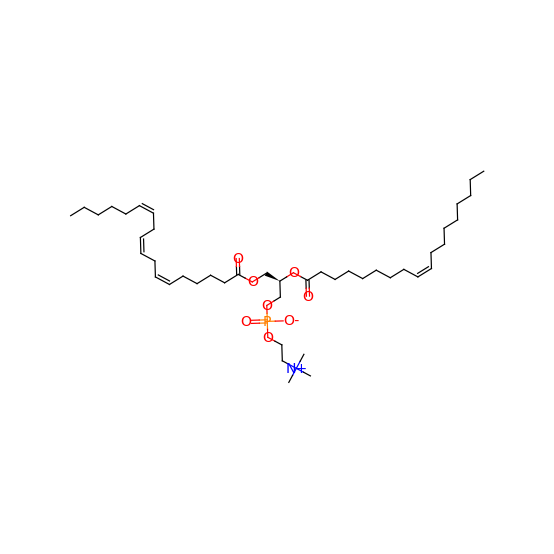

CCCCCCCCCCCCCCCCCCCCCCCC(=O)O[C@H](COC(=O)CCCCCCCCCCCCCCC)COP(=O)([O-])OCC[N+](C)(C)C


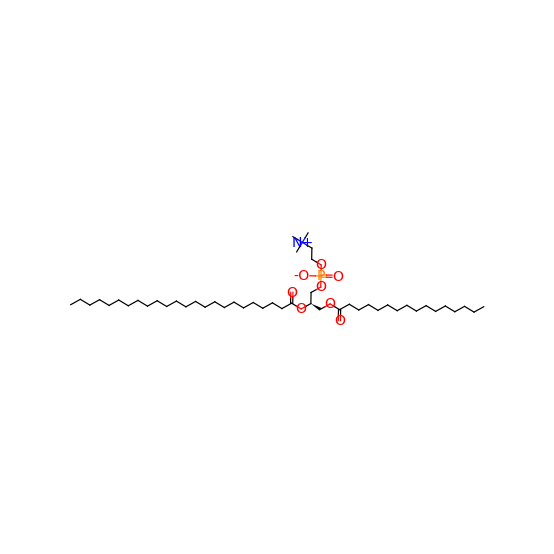

tanimoto: 0.9095022624434389
MS2Query: 0.927
CCCCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCC/C=C\C/C=C\C/C=C\C/C=C\CCCCC


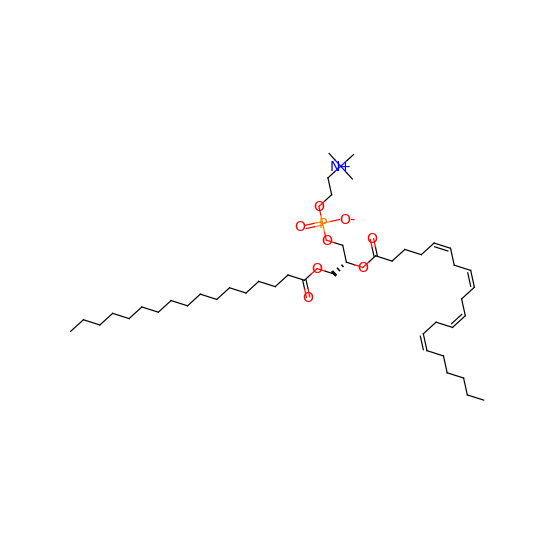

CCCCCCCCCCCCCCCCCCCCCCCC(=O)O[C@H](COC(=O)CCCCCCCCCCCCCCC)COP(=O)([O-])OCC[N+](C)(C)C


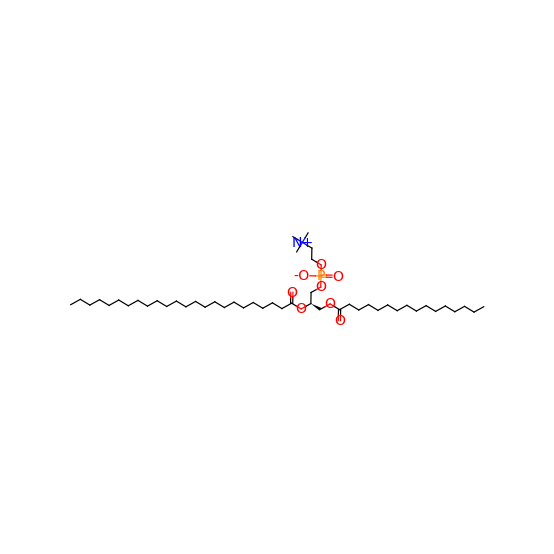

tanimoto: 0.9684684684684685
MS2Query: 0.927
CCCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCC/C=C\C/C=C\C/C=C\C/C=C\C/C=C\CC


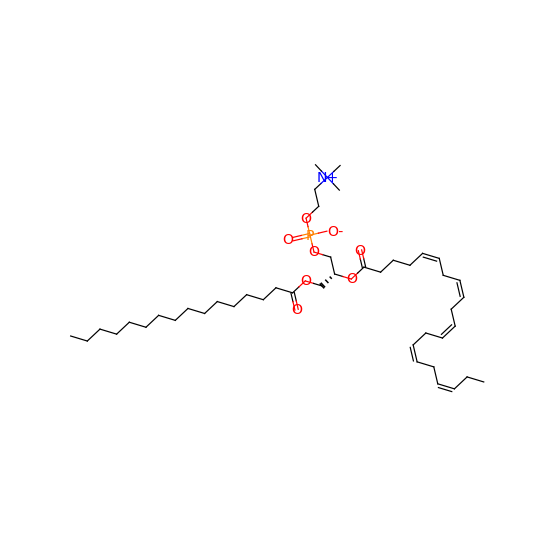

CCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\C/C=C\CCCCC


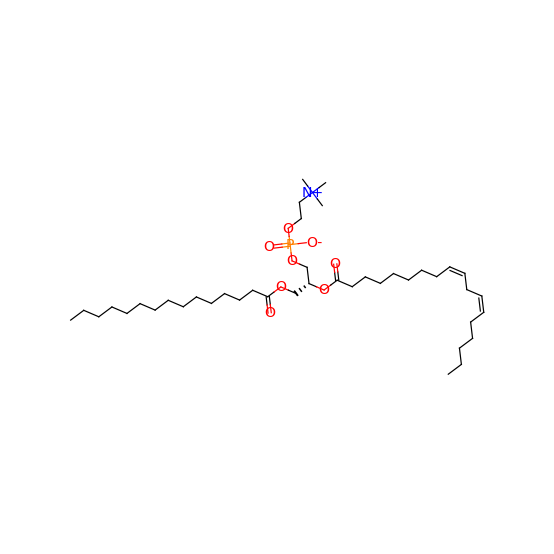

tanimoto: 0.9707207207207207
MS2Query: 0.927
CCCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCC/C=C\C/C=C\C/C=C\C/C=C\CCCCC


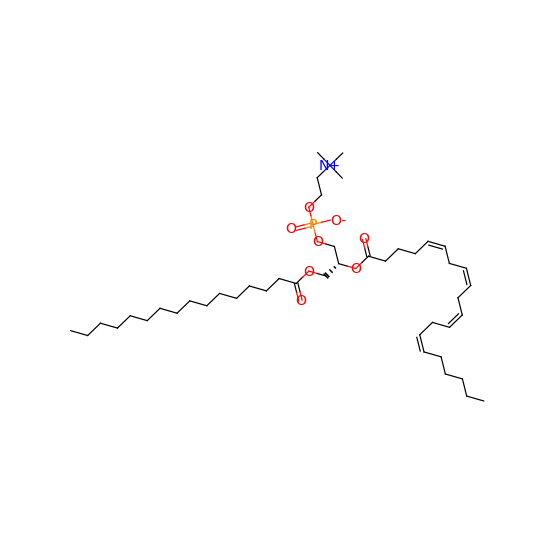

CCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\C/C=C\CCCCC


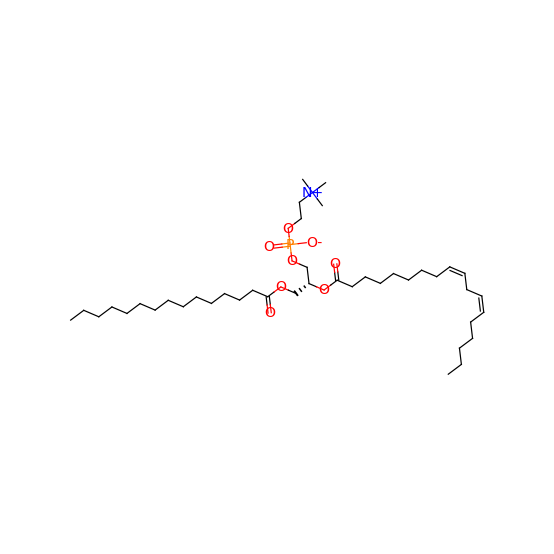

tanimoto: 0.9548693586698337
MS2Query: 0.7918
CCCCCCCCCC/C=C/CCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C/CCCCCCCCCC


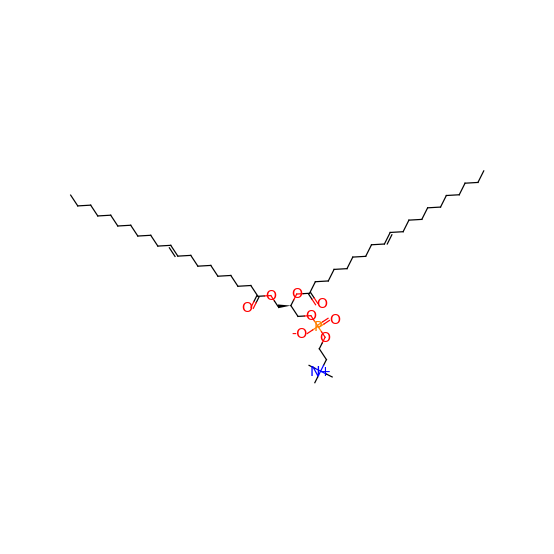

CCCCCCCCCCCCCCCCCCCCCCCC(=O)O[C@H](COC(=O)CCCCCCCCCCCCCCC)COP(=O)([O-])OCC[N+](C)(C)C


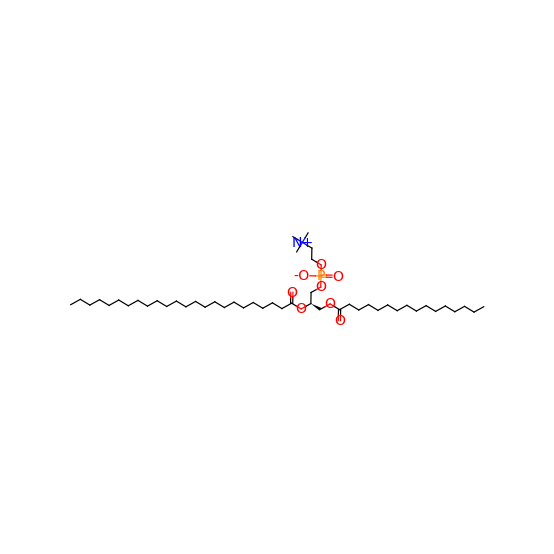

tanimoto: 0.9095022624434389
MS2Query: 0.927
CCCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCC/C=C\C/C=C\C/C=C\C/C=C\CCCCC


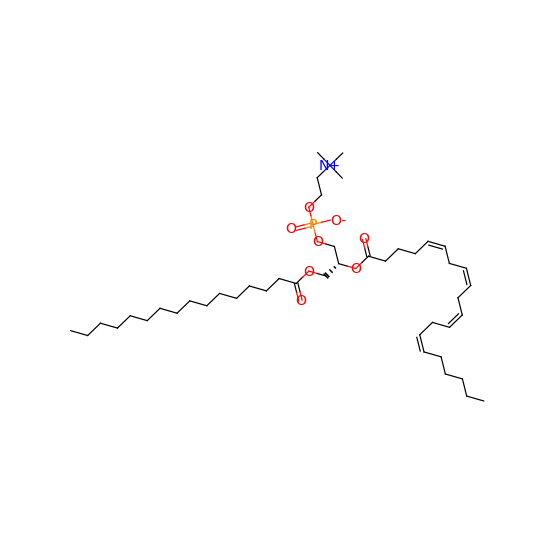

CCCCCCCCCCCCCCCCCCCCCCCC(=O)O[C@H](COC(=O)CCCCCCCCCCCCCCC)COP(=O)([O-])OCC[N+](C)(C)C


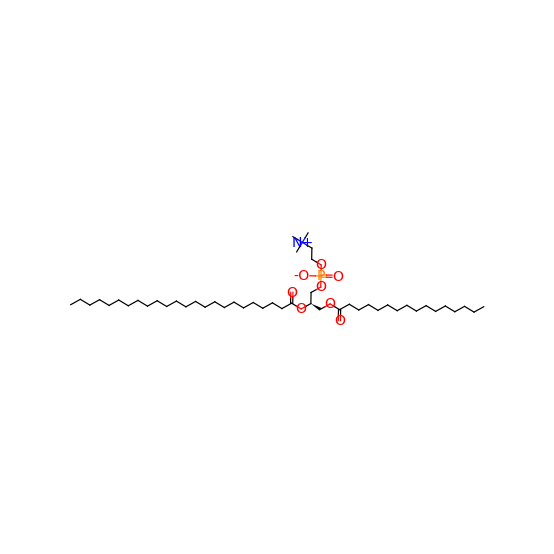

tanimoto: 0.9495614035087719
MS2Query: 0.927
CCCCCC/C=C\CCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CC/C=C\C/C=C\C/C=C\C/C=C\C/C=C\C/C=C\CC


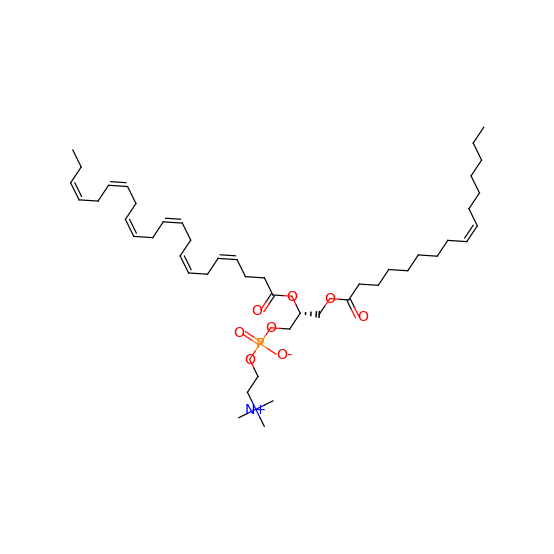

CCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\C/C=C\CCCCC


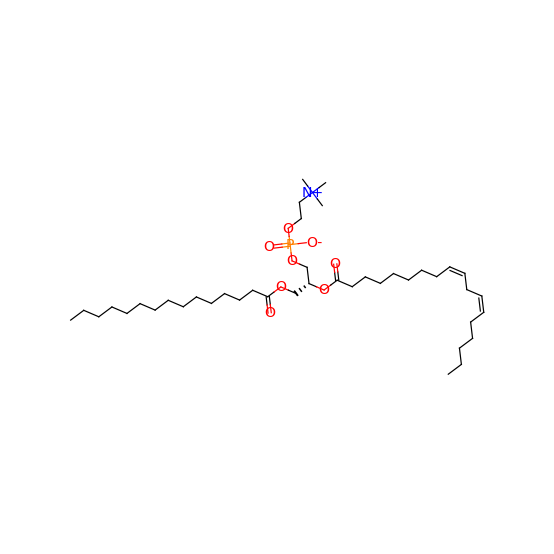

tanimoto: 0.9707207207207207
MS2Query: 0.927
CCCCCCCCCCCCCCCCCC(=O)O[C@H](COC(=O)CCC/C=C\C/C=C\C/C=C\C/C=C\CCCCC)COP(=O)([O-])OCC[N+](C)(C)C


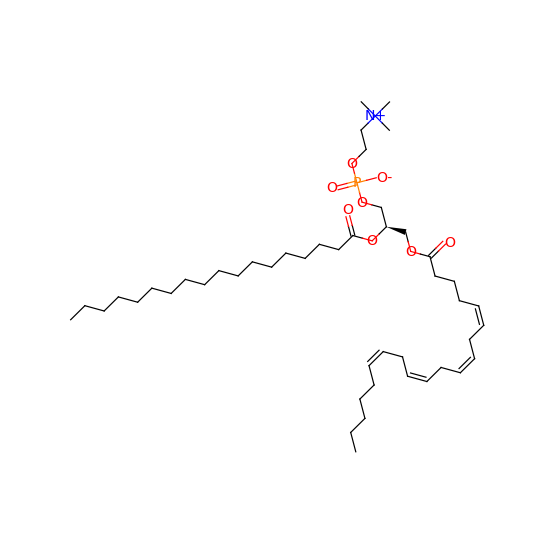

CCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\C/C=C\CCCCC


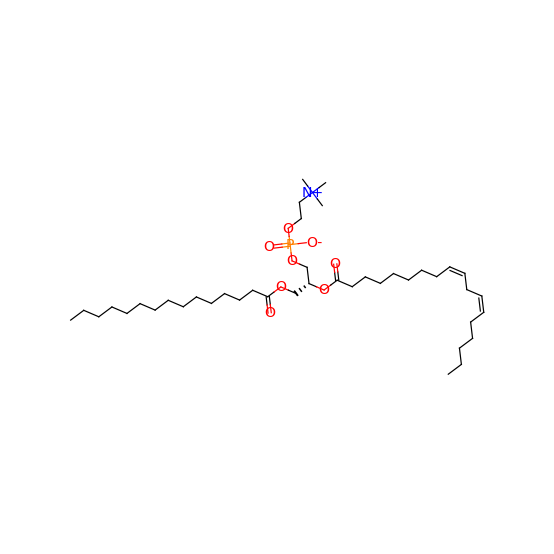

tanimoto: 0.9054054054054054
MS2Query: 0.927
CCCCC/C=C\C/C=C\CCCCCCCCCC(=O)O[C@H](COC(=O)CCC/C=C\C/C=C\C/C=C\C/C=C\C/C=C\CC)COP(=O)([O-])OCC[N+](C)(C)C


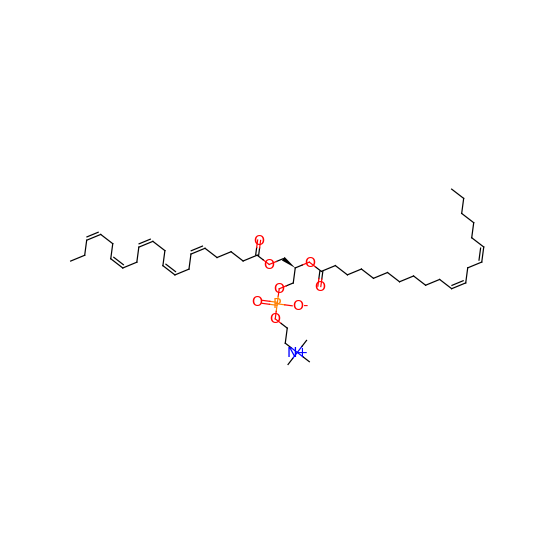

CCCCCCCCCCCCCCCCCCCCCCCC(=O)O[C@H](COC(=O)CCCCCCCCCCCCCCC)COP(=O)([O-])OCC[N+](C)(C)C


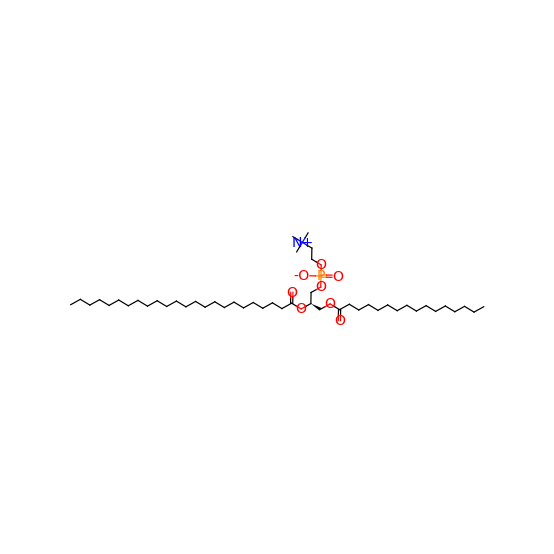

tanimoto: 0.919908466819222
MS2Query: 0.927
CCCCCCCC/C=C\CCCCCCCC(=O)O[C@H](COC(=O)CCCC/C=C\C/C=C\C/C=C\CCCCC)COP(=O)([O-])OCC[N+](C)(C)C


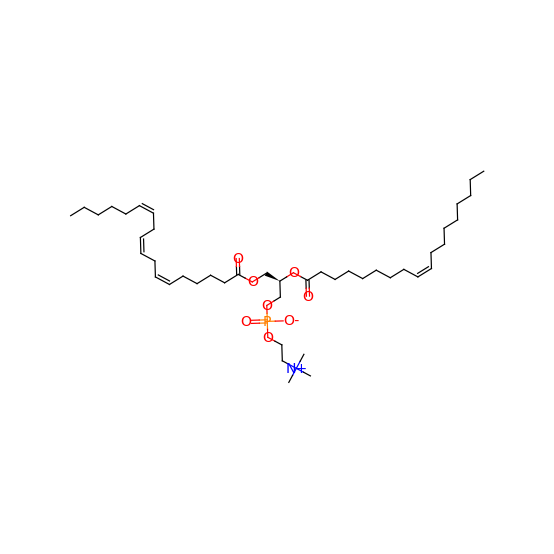

CCCCCCCCCCCCCCCCCCCCCCCC(=O)O[C@H](COC(=O)CCCCCCCCCCCCCCC)COP(=O)([O-])OCC[N+](C)(C)C


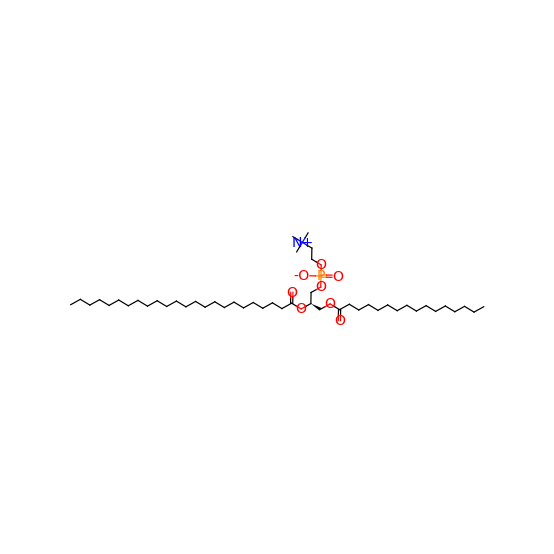

tanimoto: 0.9722863741339491
MS2Query: 0.927
CCCCCC/C=C\CCCCCCCCCCCC(=O)O[C@H](COC(=O)CCCCCCCCC/C=C\CCCCCC)COP(=O)([O-])OCC[N+](C)(C)C


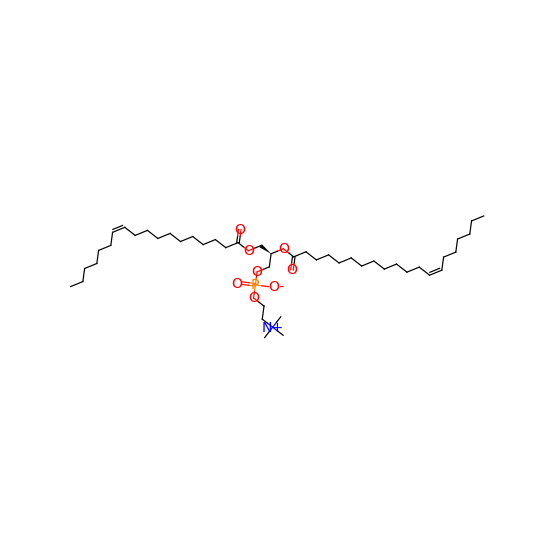

CCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\C/C=C\CCCCC


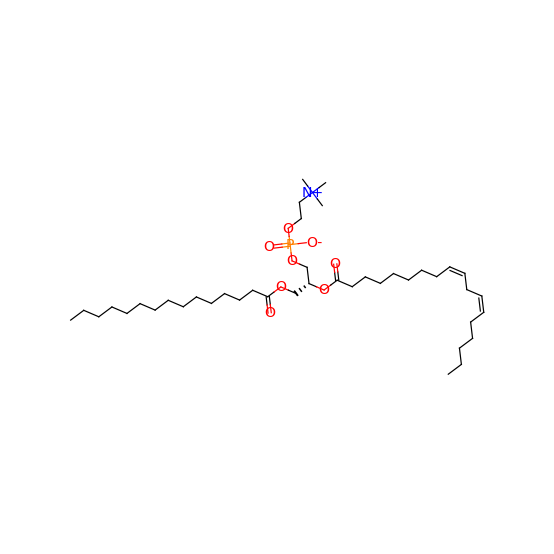

tanimoto: 0.9752252252252253
MS2Query: 0.927
CCCCC/C=C\C/C=C\CCCCCCCCCC(=O)O[C@H](COC(=O)CCC/C=C\C/C=C\C/C=C\C/C=C\C/C=C\CC)COP(=O)([O-])OCC[N+](C)(C)C


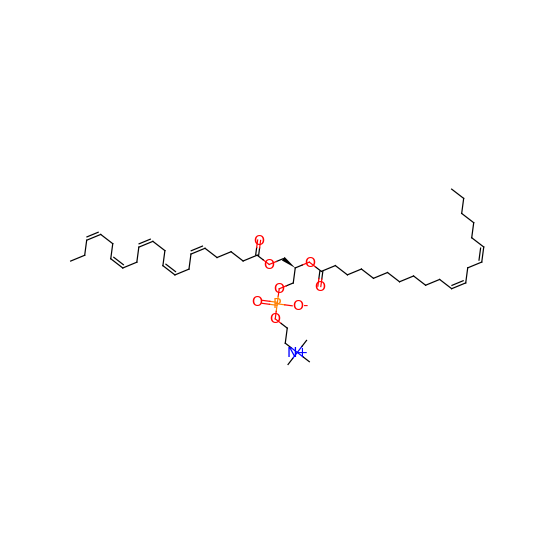

CCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\C/C=C\CCCCC


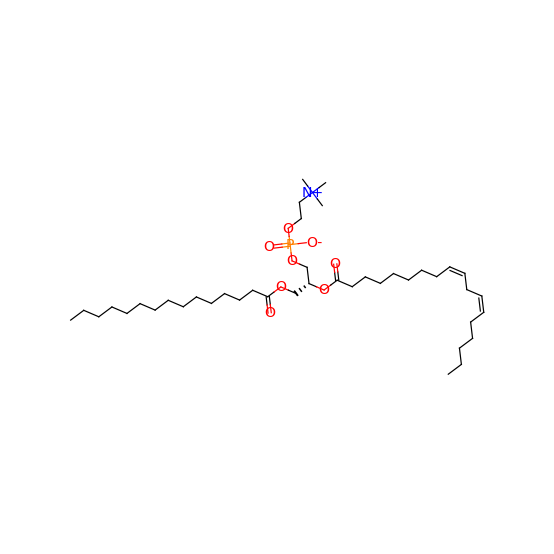

tanimoto: 0.9548693586698337
MS2Query: 0.927
CCCCCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCCCCCC/C=C\CCCCCCCC


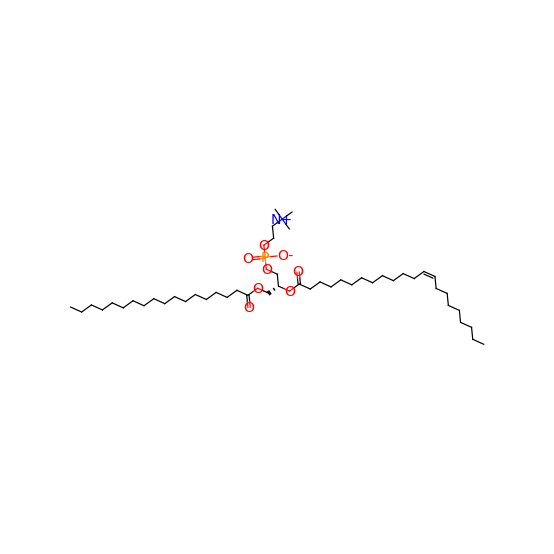

CCCCCCCCCCCCCCCCCCCCCCCC(=O)O[C@H](COC(=O)CCCCCCCCCCCCCCC)COP(=O)([O-])OCC[N+](C)(C)C


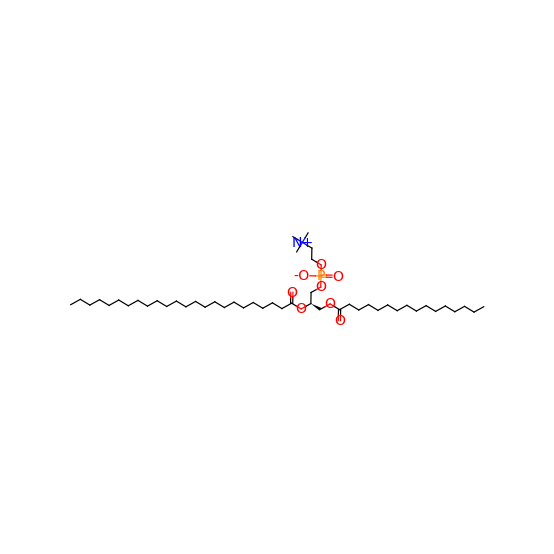

tanimoto: 0.9752252252252253
MS2Query: 0.9267
CCCCC/C=C\C/C=C\CCCCCCCCCC(=O)O[C@H](COC(=O)CCC/C=C\C/C=C\C/C=C\C/C=C\C/C=C\CC)COP(=O)([O-])OCC[N+](C)(C)C


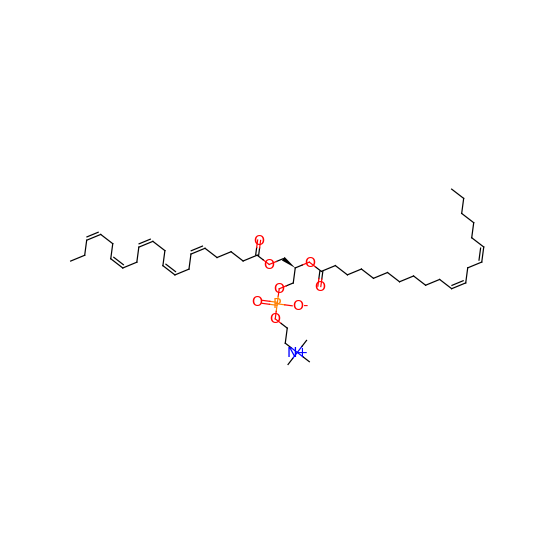

CCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\C/C=C\CCCCC


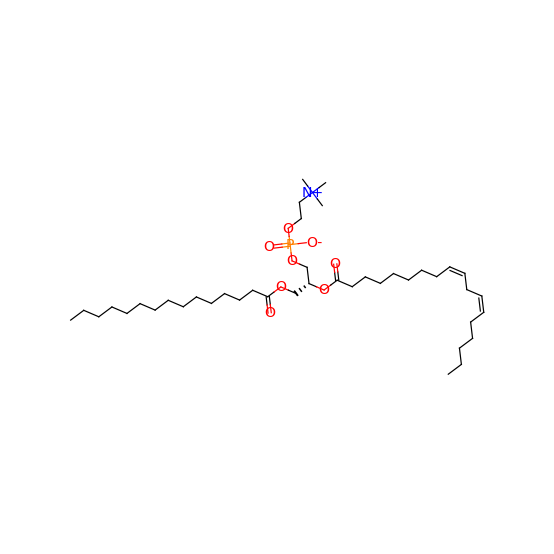

tanimoto: 0.9495614035087719
MS2Query: 0.927
CCCCC/C=C\C/C=C\C/C=C\CCCCCCC(=O)O[C@H](COC(=O)CC/C=C\C/C=C\C/C=C\C/C=C\C/C=C\C/C=C\CC)COP(=O)([O-])OCC[N+](C)(C)C


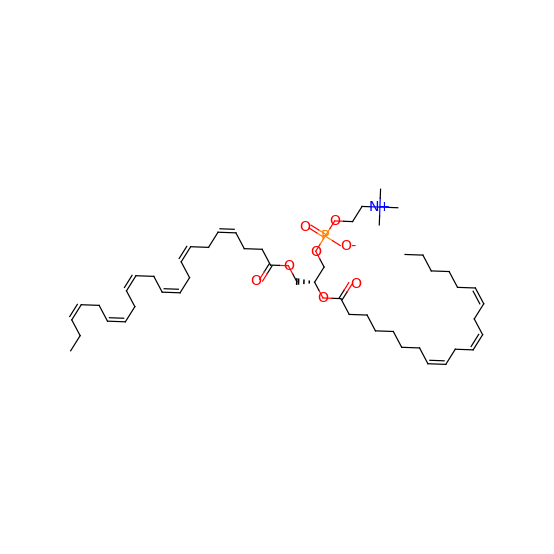

CCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCC/C=C\C/C=C\CCCCC


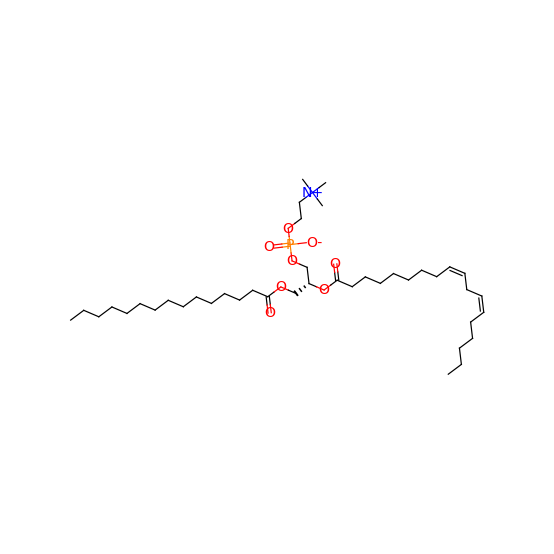

tanimoto: 0.9241379310344827
MS2Query: 0.927
CCCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCC/C=C/C/C=C/C/C=C/CCCCC


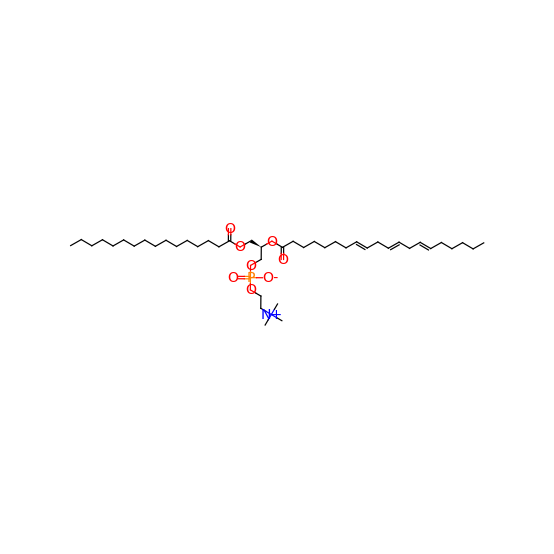

CCCCCCCCCCCCCCCCCCCCCCCC(=O)O[C@H](COC(=O)CCCCCCCCCCCCCCC)COP(=O)([O-])OCC[N+](C)(C)C


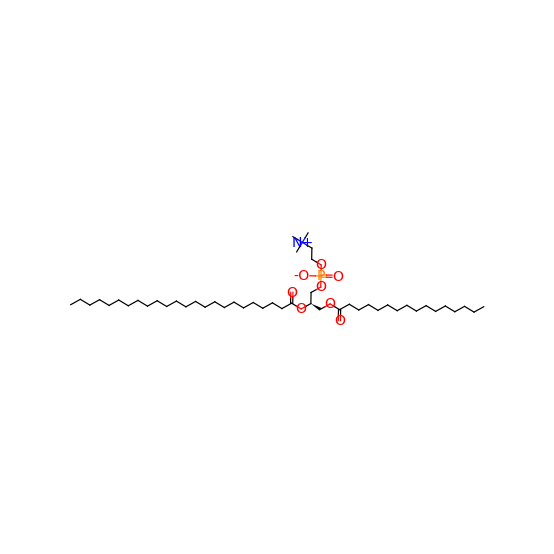

tanimoto: 0.9548693586698337
MS2Query: 0.927
CCCCCCCCCCCCCCCCCC(=O)OC[C@H](COP(=O)([O-])OCC[N+](C)(C)C)OC(=O)CCCCCCCCCCC/C=C\CCCCCCCC


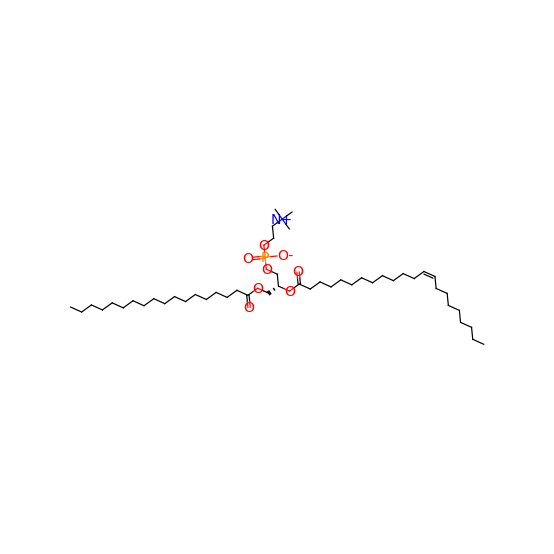

CCCCCCCCCCCCCCCCCCCCCCCC(=O)O[C@H](COC(=O)CCCCCCCCCCCCCCC)COP(=O)([O-])OCC[N+](C)(C)C


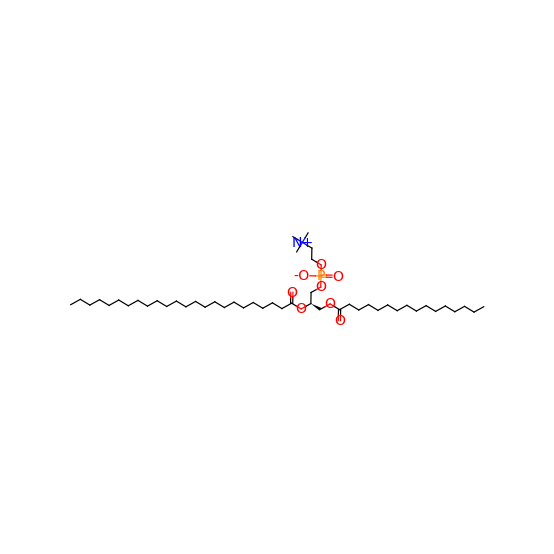

tanimoto: 0.9230177059276367
MS2Query: 0.9036
COc1ccccc1-c1nc(CSc2nc3c(O)nc(C)nc3n2C)c(C)o1


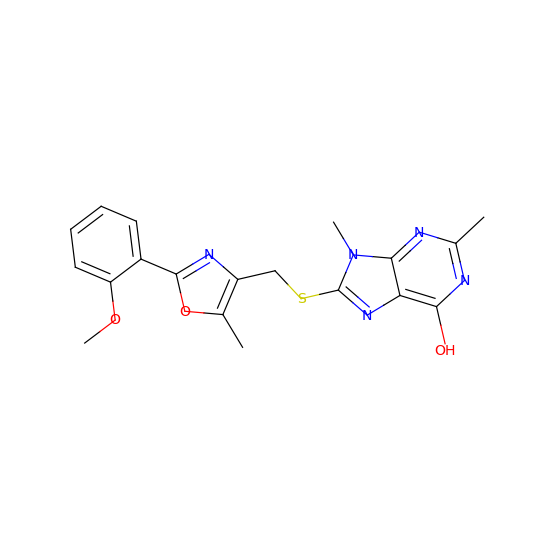

COc1ccc(-c2nc(CSc3nc4c(O)nc(C)nc4n3C)c(C)o2)cc1


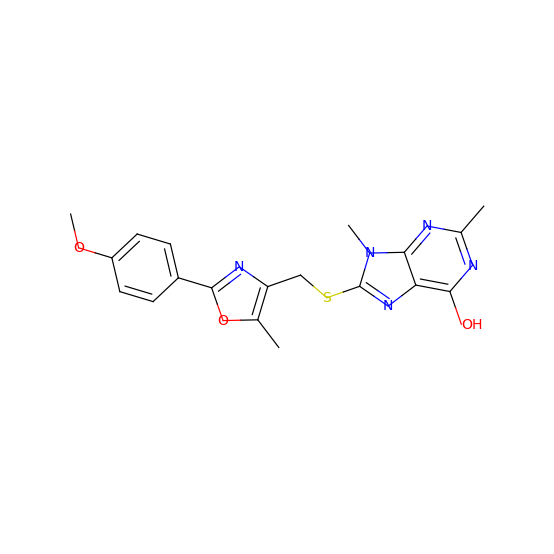

tanimoto: 0.9296235679214403
MS2Query: 0.8541
CCOc1ccc(-c2nc(CSc3nc4c(O)ncnc4n3C)c(C)o2)cc1


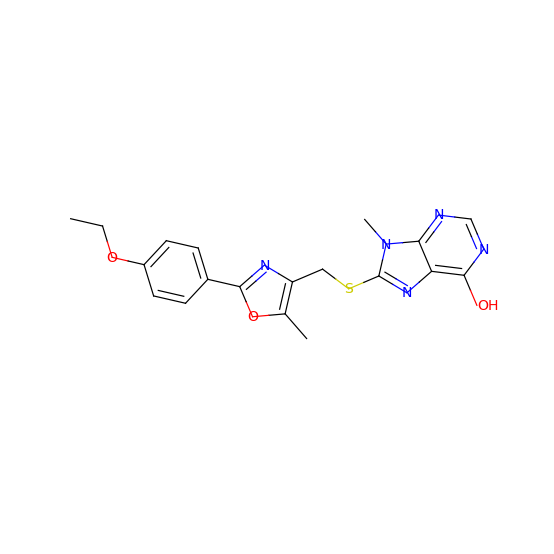

COc1ccc(-c2nc(CSc3nc4c(O)nc(C)nc4n3C)c(C)o2)cc1


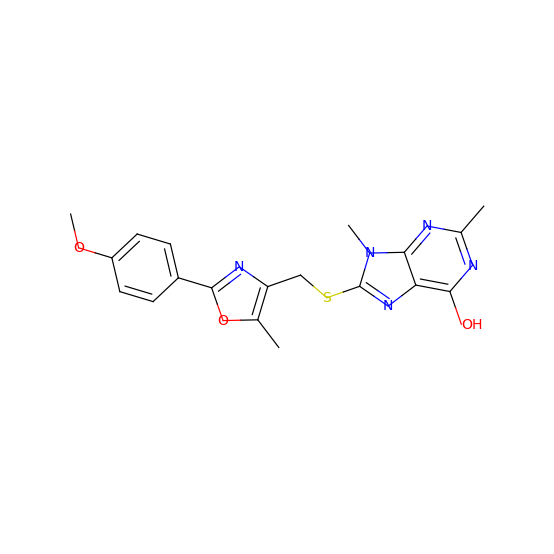

tanimoto: 0.9414093428345209
MS2Query: 0.8609
Cc1nc(O)c2nc(SCc3nc(-c4ccccc4C)oc3C)n(C)c2n1


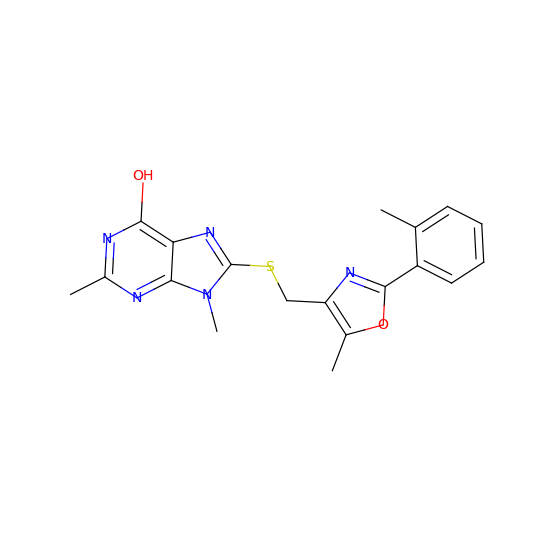

Cc1ccc(-c2nc(CSc3nc4c(O)nc(C)nc4n3C)c(C)o2)cc1


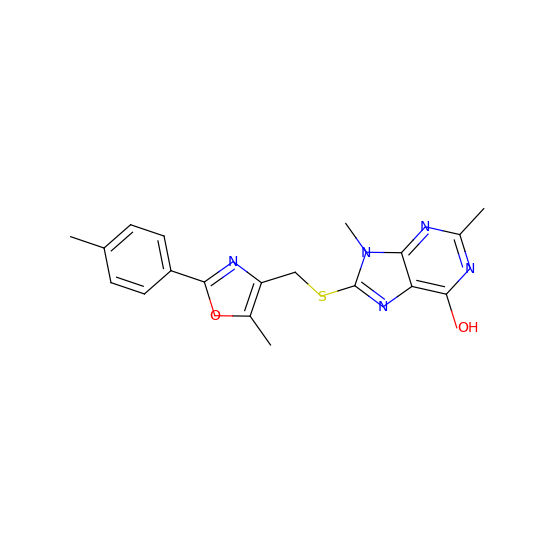

tanimoto: 0.9846625766871165
MS2Query: 0.591
Cc1ccc(-n2c(SCc3nc(-c4ccc(Cl)cc4)oc3C)nc3c(O)ncnc32)cc1


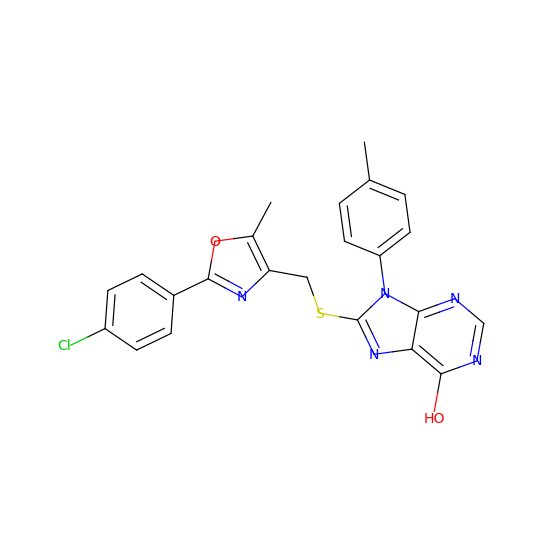

Cc1oc(-c2ccc(Cl)cc2)nc1CSc1nc2c(O)ncnc2n1-c1ccccc1


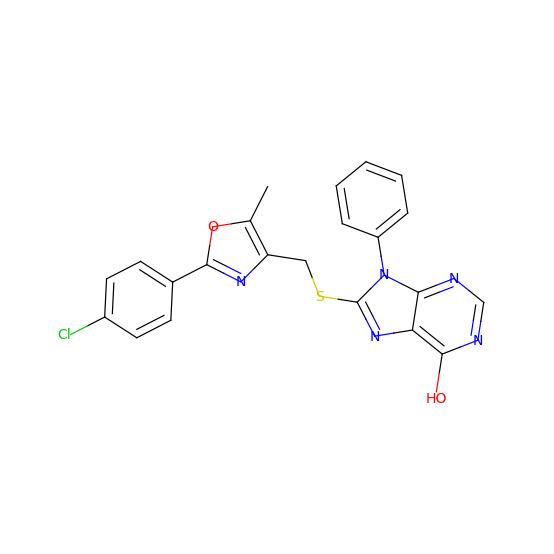

tanimoto: 0.9723320158102767
MS2Query: 0.797
CCCN=C(O)c1cc(=O)n(CC(O)=Nc2ccccc2C)c2ccccc12


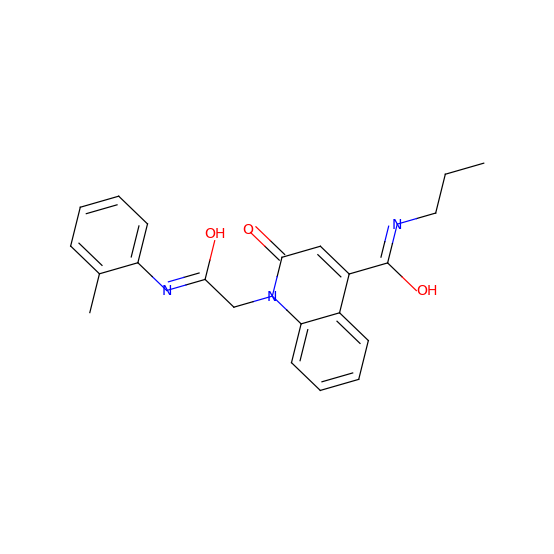

CCCN=C(O)c1cc(=O)n(CC(O)=Nc2c(C)cc(C)cc2C)c2ccccc12


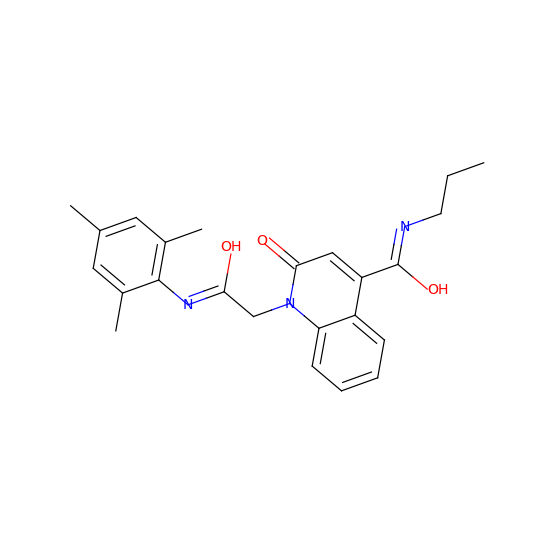

tanimoto: 0.9444911690496215
MS2Query: 0.7171
COCCOC(=O)c1c(C)n(CCOc2ccccc2Cl)c2c1cc(O)c1ccccc12


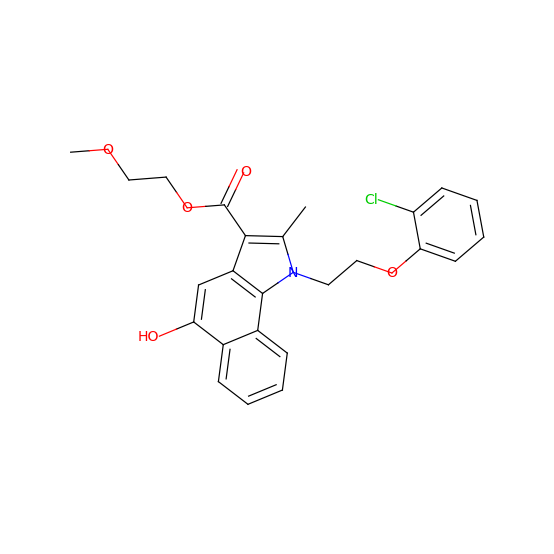

CCCc1ccc(OCCn2c(C)c(C(=O)OCCOC)c3cc(O)c4ccccc4c32)cc1


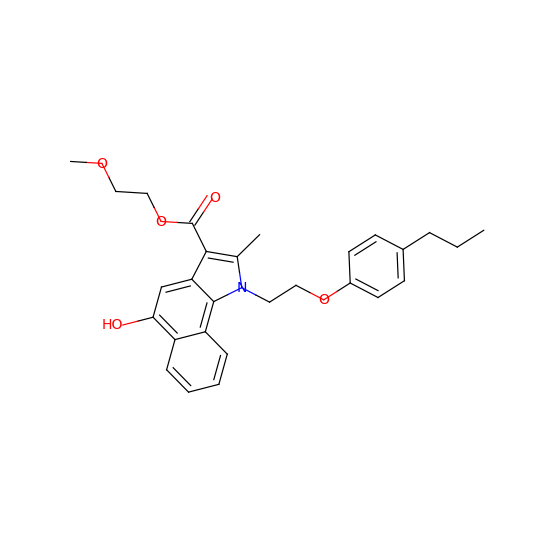

tanimoto: 0.9230177059276367
MS2Query: 0.8547
COc1ccccc1-c1nc(CSc2nc3c(O)nc(C)nc3n2C)c(C)o1


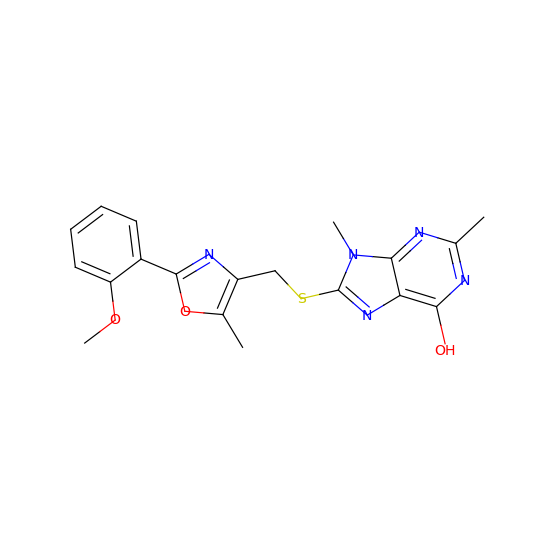

COc1ccc(-c2nc(CSc3nc4c(O)nc(C)nc4n3C)c(C)o2)cc1


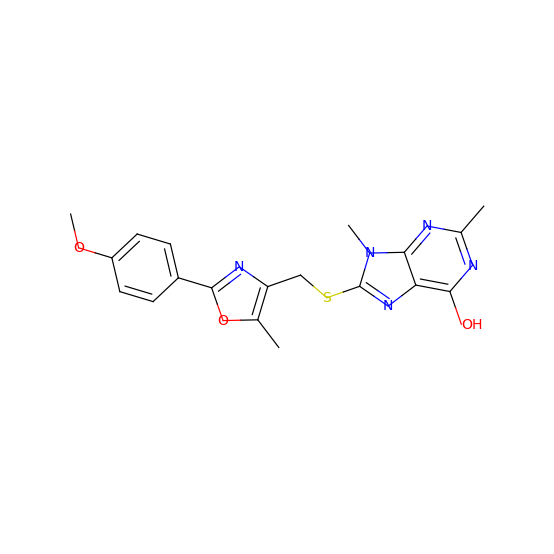

tanimoto: 0.9296235679214403
MS2Query: 0.8541
CCOc1ccc(-c2nc(CSc3nc4c(O)ncnc4n3C)c(C)o2)cc1


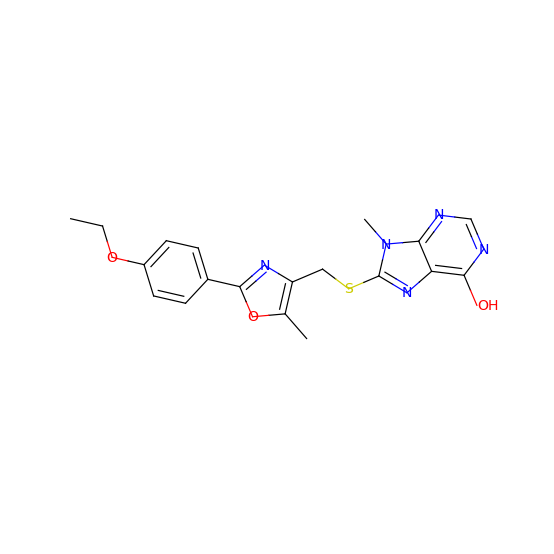

COc1ccc(-c2nc(CSc3nc4c(O)nc(C)nc4n3C)c(C)o2)cc1


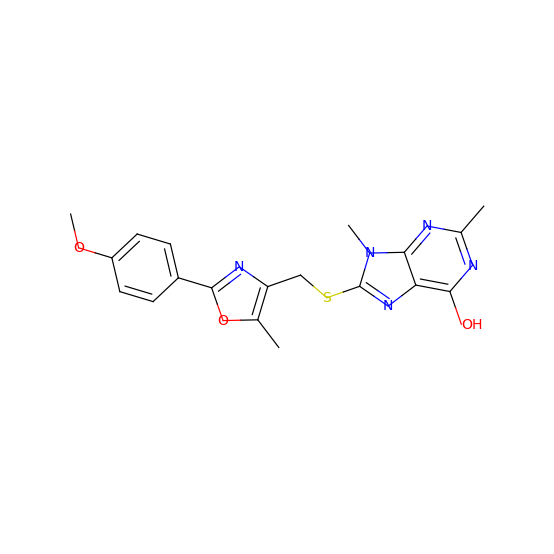

tanimoto: 0.9697959183673469
MS2Query: 0.8487
Cc1cccc(-c2nc(CSc3nc4c(O)nc(C)nc4n3C)c(C)o2)c1


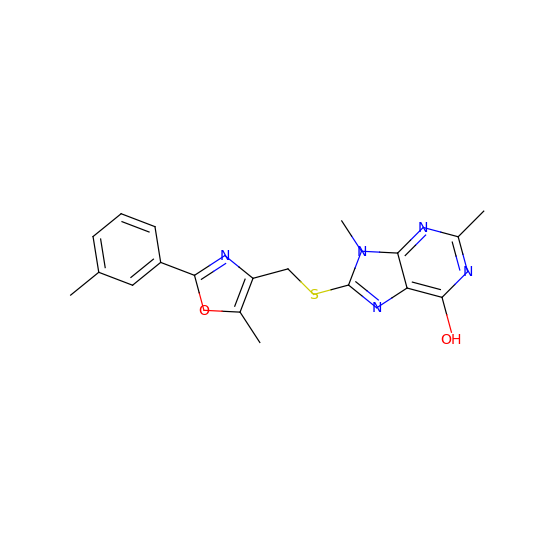

Cc1ccc(-c2nc(CSc3nc4c(O)nc(C)nc4n3C)c(C)o2)cc1


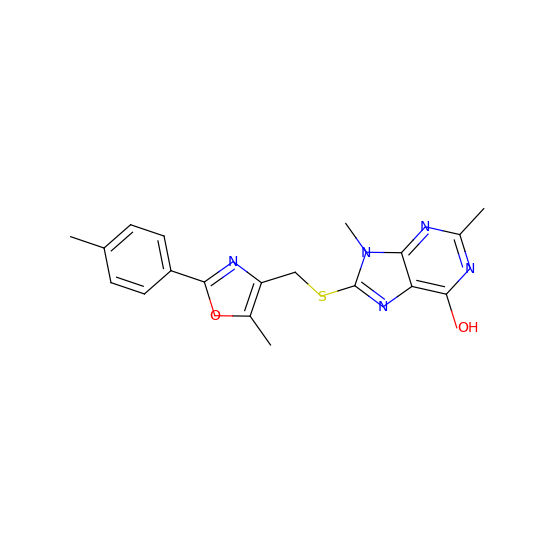

tanimoto: 0.9481981981981982
MS2Query: 0.6333
COc1ccc(-c2nc(CSc3nc4c(O)ncnc4n3-c3ccc(C)cc3)c(C)o2)cc1


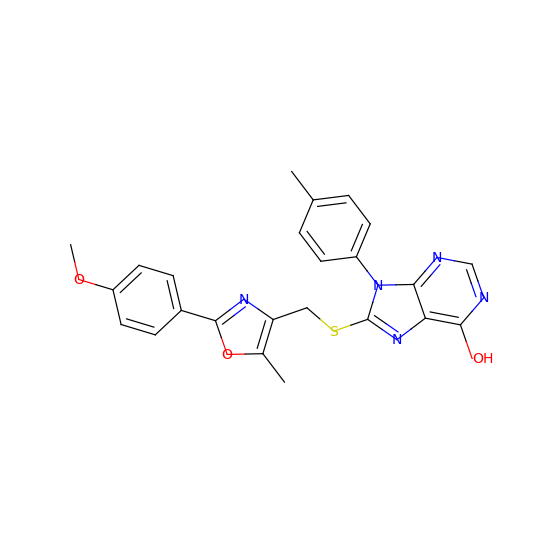

Cc1oc(-c2ccc(Cl)cc2)nc1CSc1nc2c(O)ncnc2n1-c1ccccc1


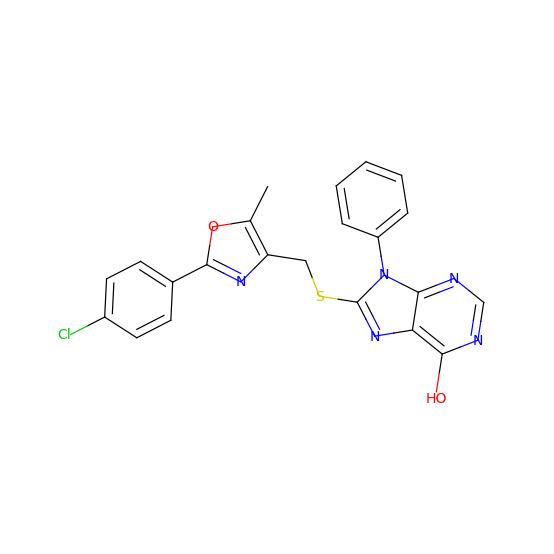

tanimoto: 0.9677914110429447
MS2Query: 0.7543
Cc1ccc(-n2c(SCc3nc(-c4ccccc4)oc3C)nc3c(O)ncnc32)cc1


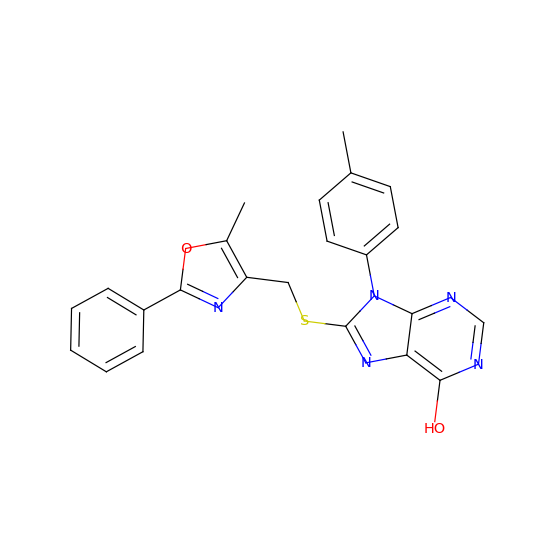

Cc1oc(-c2ccc(Cl)cc2)nc1CSc1nc2c(O)ncnc2n1-c1ccccc1


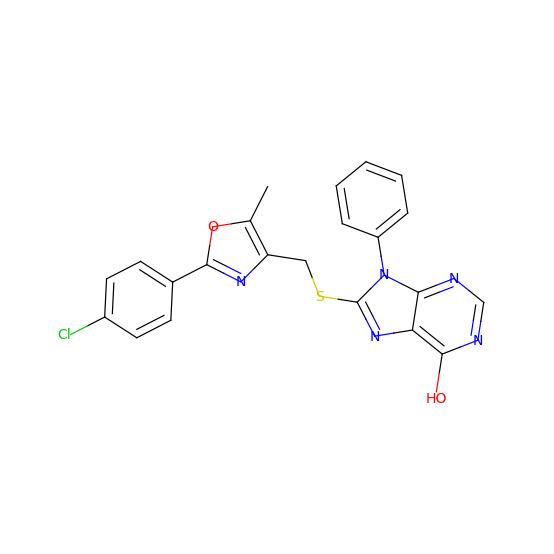

tanimoto: 0.9123314065510597
MS2Query: 0.7875
CCCN=C(O)c1cc(=O)n(CC(O)=Nc2cccc(C)c2)c2ccccc12


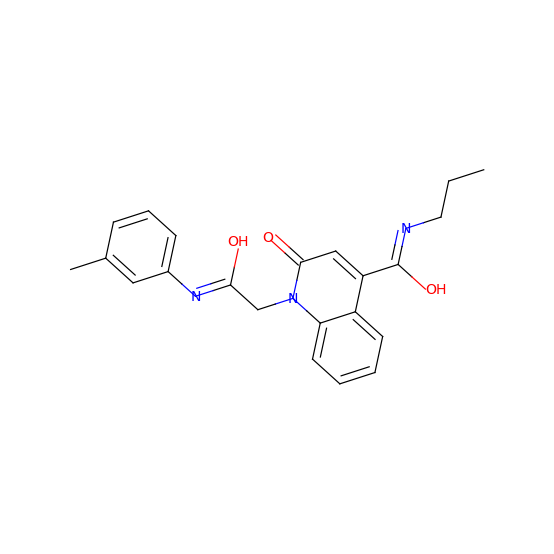

CCCN=C(O)c1cc(=O)n(CC(O)=Nc2c(C)cc(C)cc2C)c2ccccc12


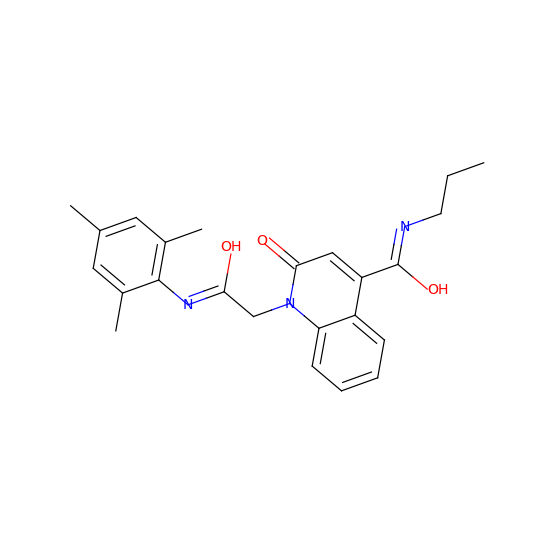

tanimoto: 0.9930313588850174
MS2Query: 0.7171
CCc1ccc(OCCn2c(C)c(C(=O)OCCOC)c3cc(O)c4ccccc4c32)cc1


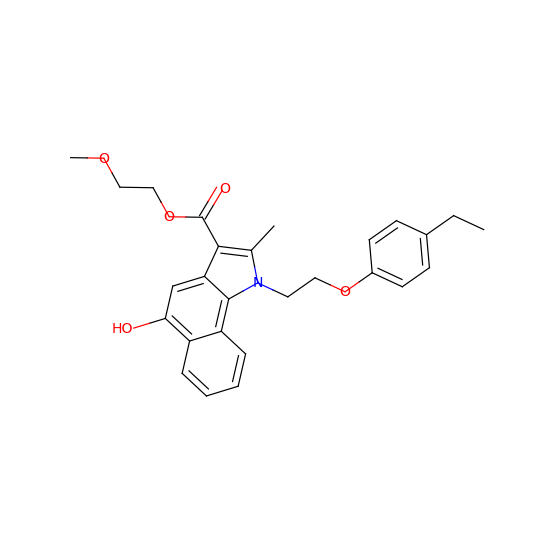

CCCc1ccc(OCCn2c(C)c(C(=O)OCCOC)c3cc(O)c4ccccc4c32)cc1


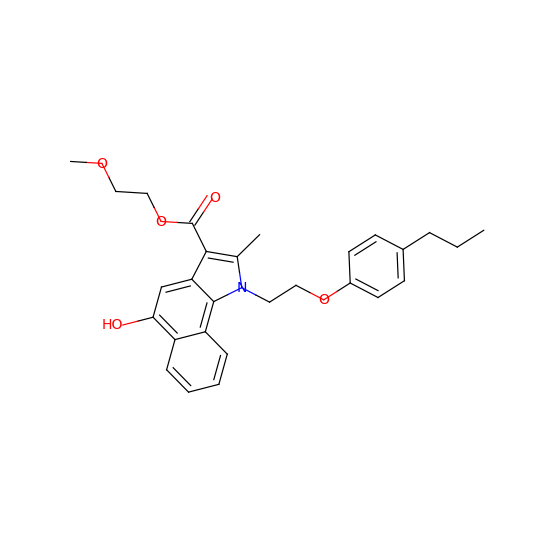

tanimoto: 0.9847036328871893
MS2Query: 0.9052
COc1cc(CCN([C@]2([H])Cc3ccc(Oc4c(OC)ccc5c4)cc3)C)c2cc1Oc6c(O)c(OC)cc7c6[C@](C5)([H])N(C)CC7


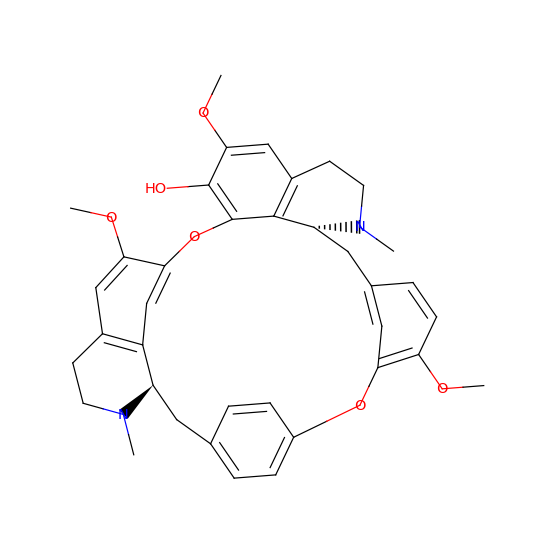

Oc1ccc(C[C@]2([H])c3c(Oc4c(OC)cc5c6c4)c(OC)c(OC)cc3CCN2C)cc1Oc7ccc(C[C@]6([H])N(CC5)C)cc7


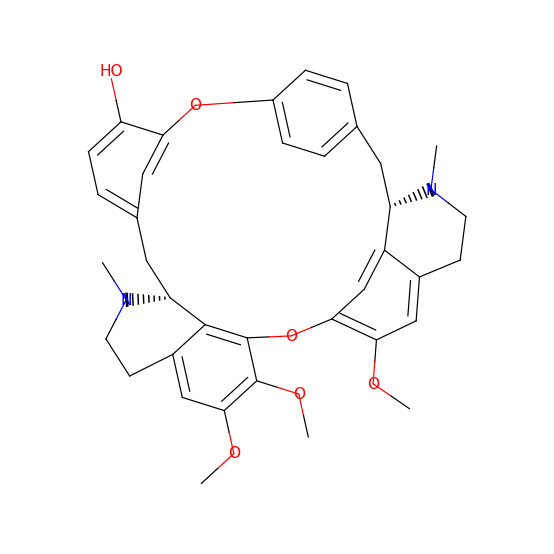

tanimoto: 0.9847036328871893
MS2Query: 0.9219
COc1c2cc(C[C@@]3([H])N(CCc4c3cc(Oc5c6c(CCN([C@@]6([H])Cc7ccc(O2)cc7)C)cc(OC)c5O)c(OC)c4)C)cc1


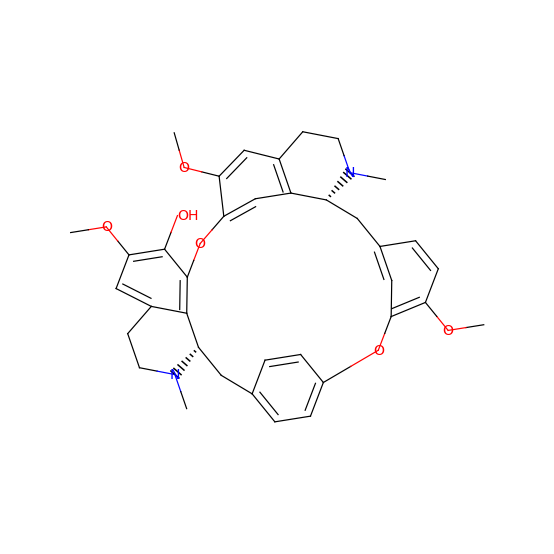

COc1cc(CCN([C@]2([H])Cc3ccc(Oc4c(O)ccc5c4)cc3)C)c2cc1Oc6c(OC)c(OC)cc7c6[C@](C5)([H])N(C)CC7


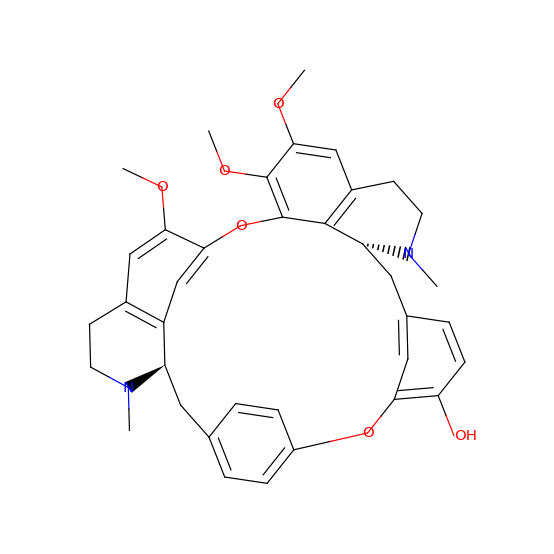

tanimoto: 0.9851337958374629
MS2Query: 0.737
O=C1C2=CC=C(OC3OC(CO)C(O)C(O)C3O)C=C2OC(C4=CC=C(O)C=C4)C1


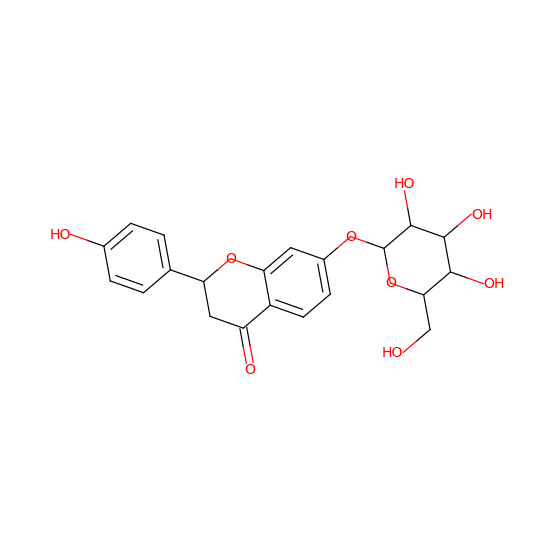

O=C1C2=CC=C(O)C=C2OC(C3=CC=C(OC4OC(CO)C(O)C(O)C4O)C=C3)C1


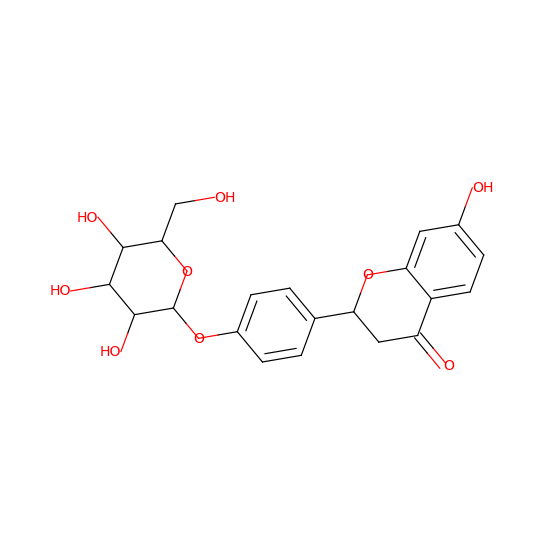

tanimoto: 0.9851337958374629
MS2Query: 0.7414
O=C1C2=CC=C(OC3OC(CO)C(O)C(O)C3O)C=C2OC(C4=CC=C(O)C=C4)C1


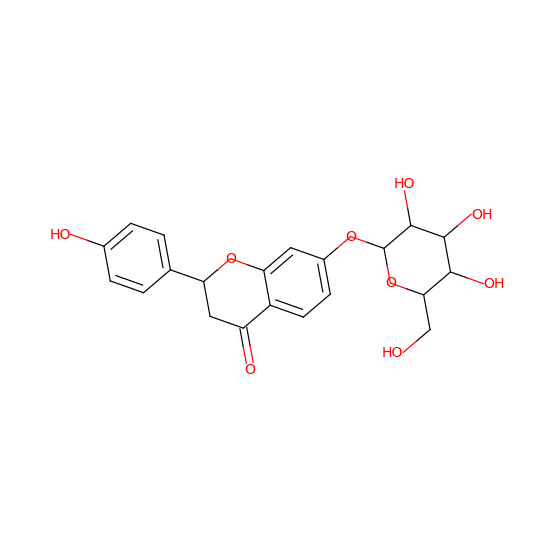

O=C1C2=CC=C(O)C=C2OC(C3=CC=C(OC4OC(CO)C(O)C(O)C4O)C=C3)C1


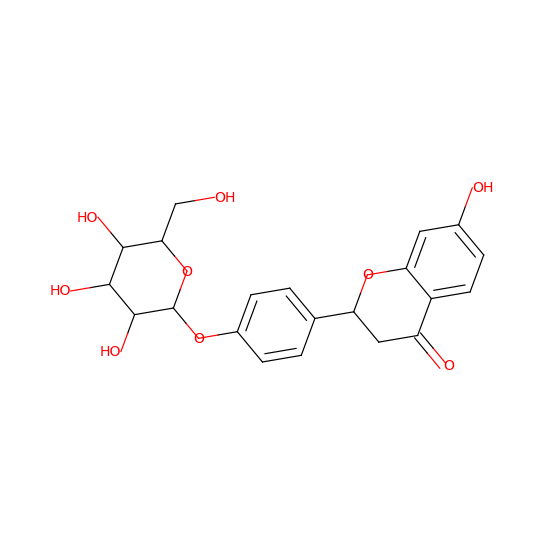

tanimoto: 0.977
MS2Query: 0.8534
O=C1C(=COC2=CC(OC3OC(CO)C(OC)C(O)C3O)=CC=C12)C=4C=CC(O)=CC4


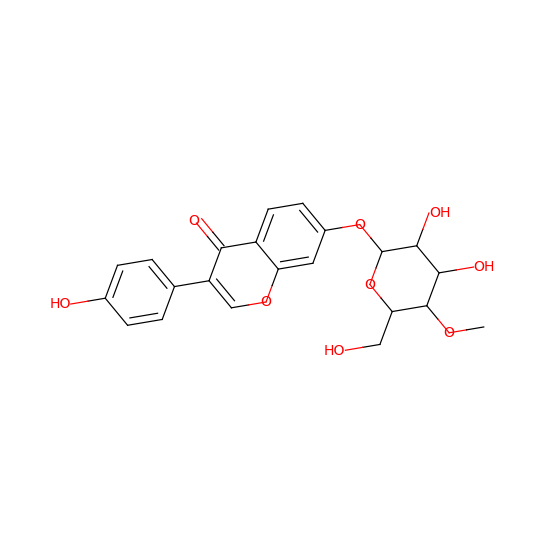

O=C1C(=COC2=CC(OC3OC(CO)C(O)C(O)C3O)=CC=C12)C=4C=CC(OC)=CC4


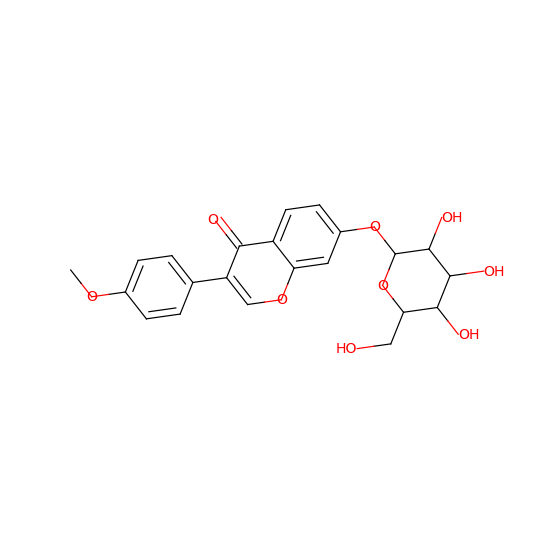

tanimoto: 0.977
MS2Query: 0.8534
O=C1C(=COC2=CC(OC3OC(CO)C(OC)C(O)C3O)=CC=C12)C=4C=CC(O)=CC4


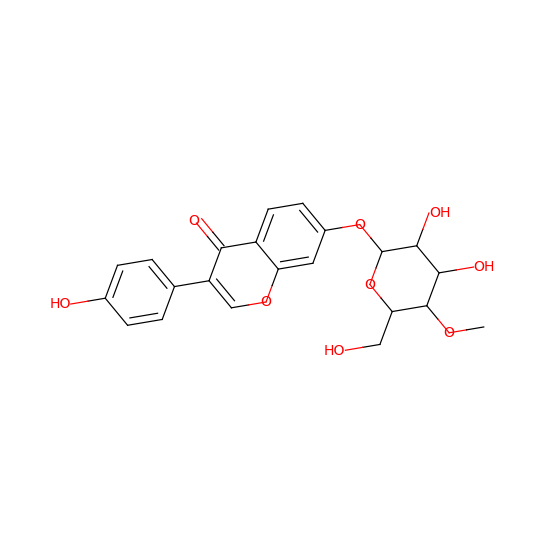

O=C1C(=COC2=CC(OC3OC(CO)C(O)C(O)C3O)=CC=C12)C=4C=CC(OC)=CC4


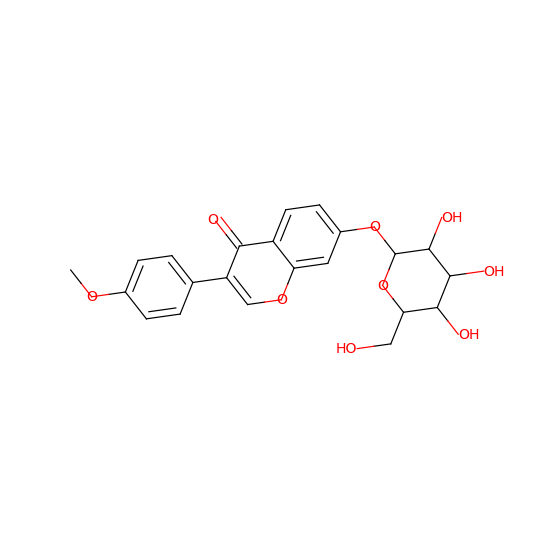

tanimoto: 0.977
MS2Query: 0.7419
O=C1C(=COC2=CC(OC3OC(CO)C(OC)C(O)C3O)=CC=C12)C=4C=CC(O)=CC4


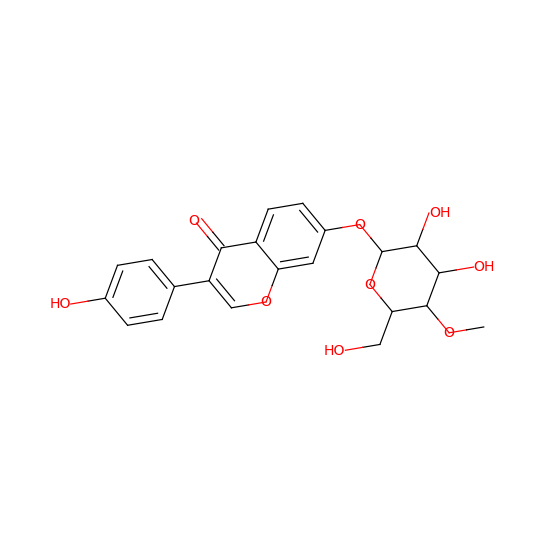

O=C1C(=COC2=CC(OC3OC(CO)C(O)C(O)C3O)=CC=C12)C=4C=CC(OC)=CC4


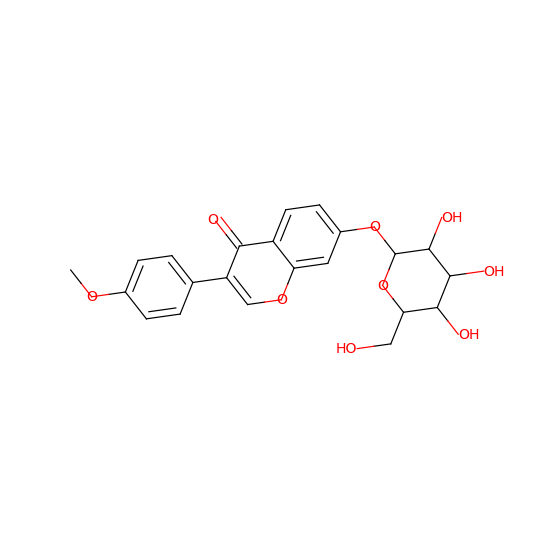

tanimoto: 0.977
MS2Query: 0.8479
O=C1C(=COC2=CC(OC3OC(CO)C(OC)C(O)C3O)=CC=C12)C=4C=CC(O)=CC4


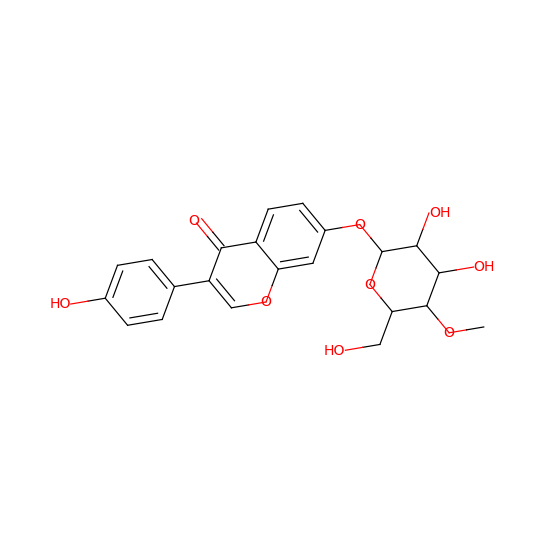

O=C1C(=COC2=CC(OC3OC(CO)C(O)C(O)C3O)=CC=C12)C=4C=CC(OC)=CC4


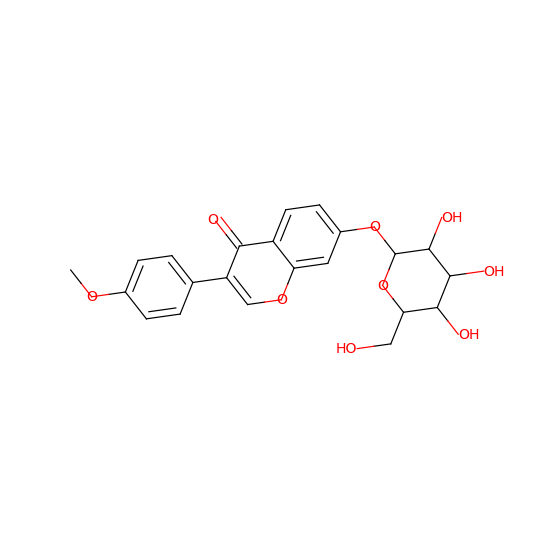

tanimoto: 0.977
MS2Query: 0.7414
O=C1C(=COC2=CC(OC3OC(CO)C(OC)C(O)C3O)=CC=C12)C=4C=CC(O)=CC4


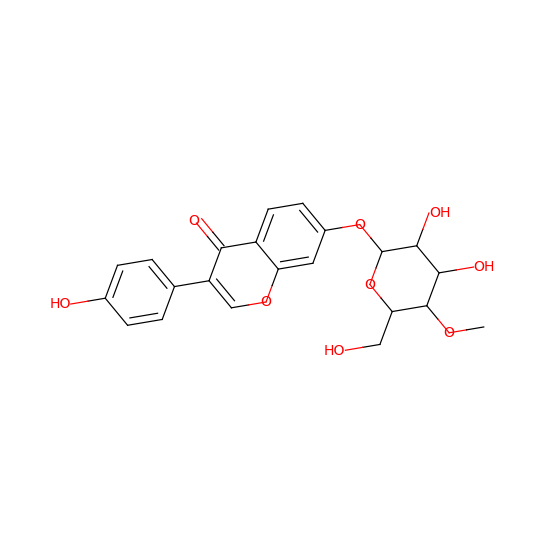

O=C1C(=COC2=CC(OC3OC(CO)C(O)C(O)C3O)=CC=C12)C=4C=CC(OC)=CC4


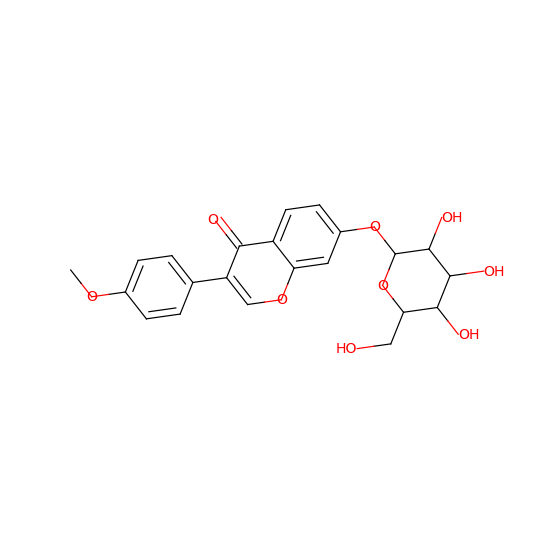

tanimoto: 0.977
MS2Query: 0.7414
O=C1C(=COC2=CC(OC3OC(CO)C(OC)C(O)C3O)=CC=C12)C=4C=CC(O)=CC4


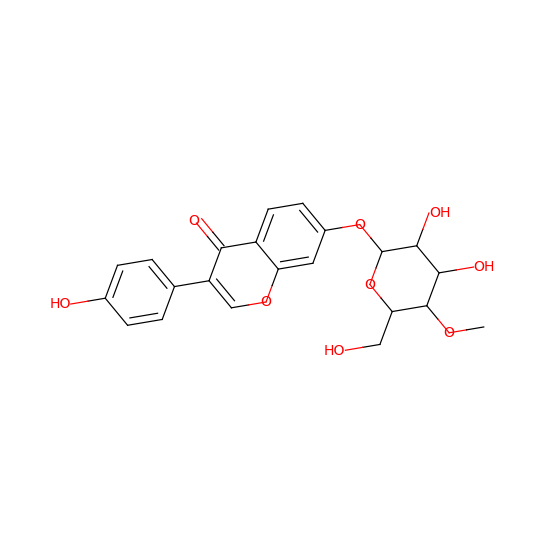

O=C1C(=COC2=CC(OC3OC(CO)C(O)C(O)C3O)=CC=C12)C=4C=CC(OC)=CC4


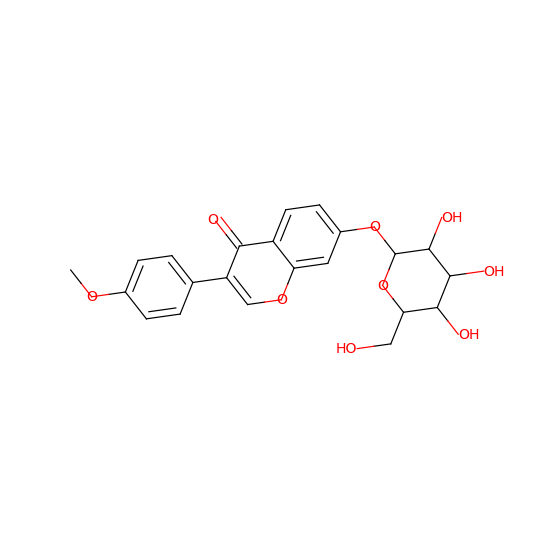

tanimoto: 0.977
MS2Query: 0.7409
O=C1C(=COC2=CC(OC3OC(CO)C(OC)C(O)C3O)=CC=C12)C=4C=CC(O)=CC4


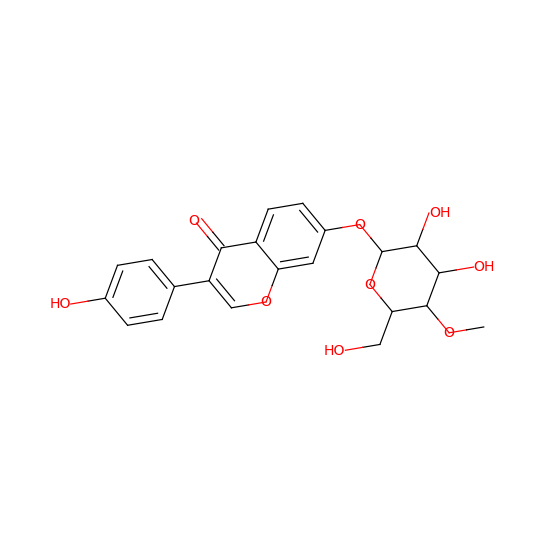

O=C1C(=COC2=CC(OC3OC(CO)C(O)C(O)C3O)=CC=C12)C=4C=CC(OC)=CC4


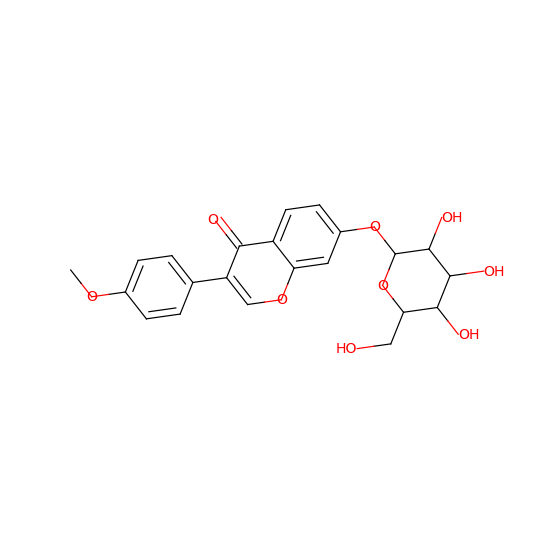

tanimoto: 0.977
MS2Query: 0.7419
O=C1C(=COC2=CC(OC3OC(CO)C(OC)C(O)C3O)=CC=C12)C=4C=CC(O)=CC4


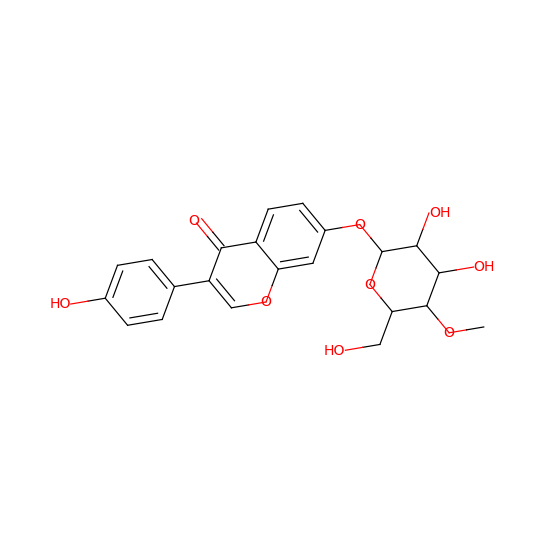

O=C1C(=COC2=CC(OC3OC(CO)C(O)C(O)C3O)=CC=C12)C=4C=CC(OC)=CC4


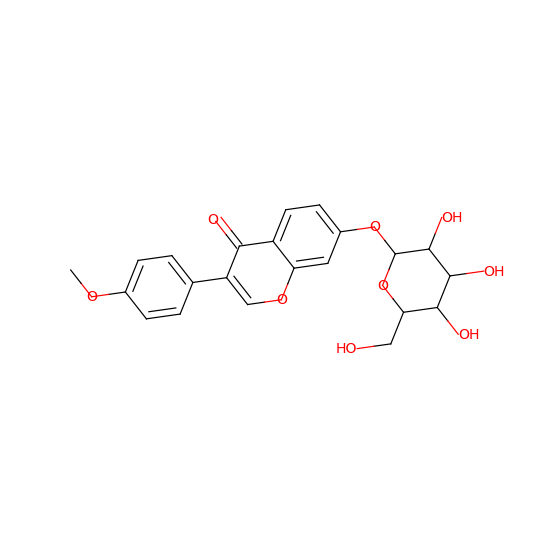

tanimoto: 0.977
MS2Query: 0.7419
O=C1C(=COC2=CC(OC3OC(CO)C(OC)C(O)C3O)=CC=C12)C=4C=CC(O)=CC4


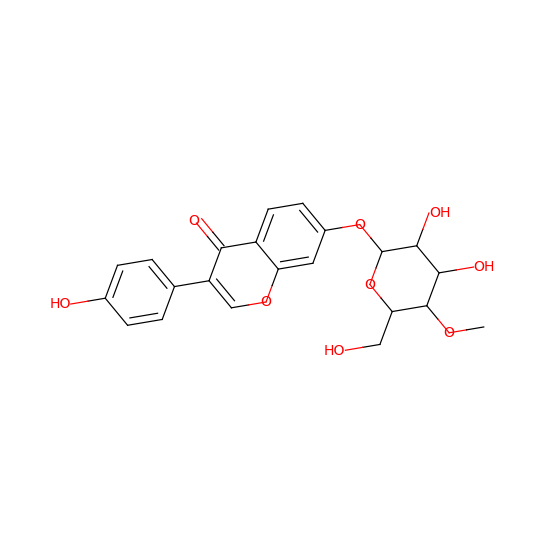

O=C1C(=COC2=CC(OC3OC(CO)C(O)C(O)C3O)=CC=C12)C=4C=CC(OC)=CC4


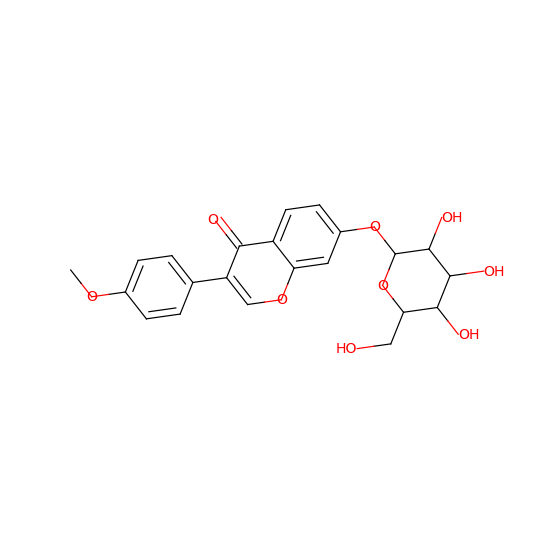

tanimoto: 0.9851337958374629
MS2Query: 0.9365
O=C1C2=CC=C(OC3OC(CO)C(O)C(O)C3O)C=C2OC(C4=CC=C(O)C=C4)C1


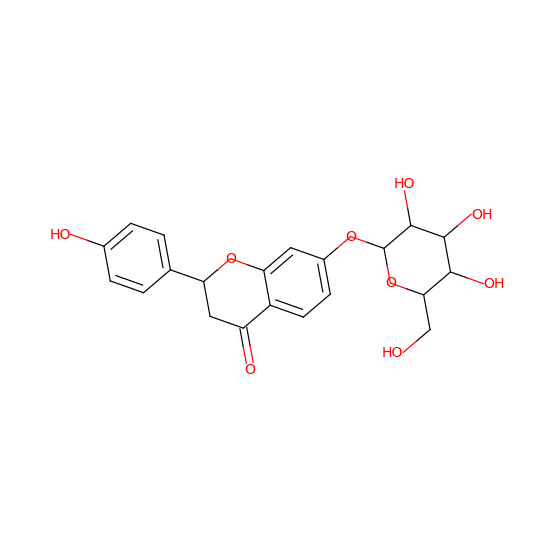

O=C1C2=CC=C(O)C=C2OC(C3=CC=C(OC4OC(CO)C(O)C(O)C4O)C=C3)C1


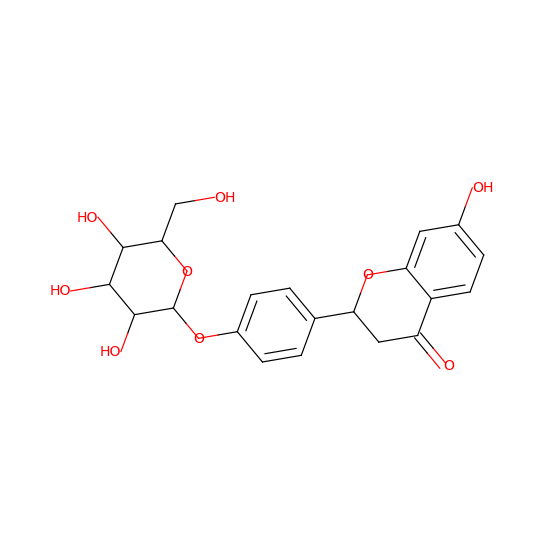

tanimoto: 0.9851337958374629
MS2Query: 0.9133
O=C1C2=CC=C(OC3OC(CO)C(O)C(O)C3O)C=C2OC(C4=CC=C(O)C=C4)C1


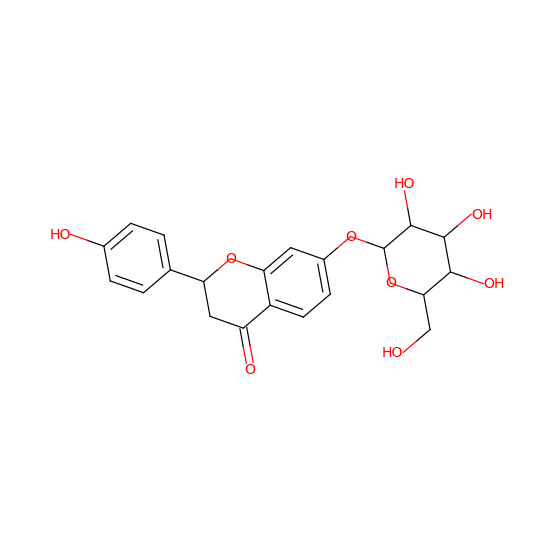

O=C1C2=CC=C(O)C=C2OC(C3=CC=C(OC4OC(CO)C(O)C(O)C4O)C=C3)C1


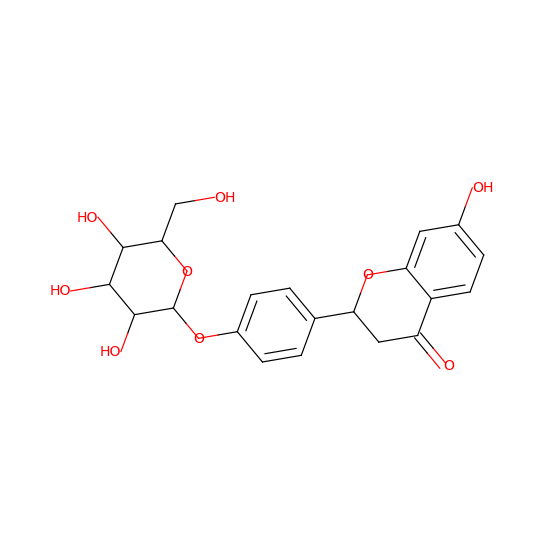

tanimoto: 0.9851337958374629
MS2Query: 0.7379
O=C1C2=CC=C(OC3OC(CO)C(O)C(O)C3O)C=C2OC(C4=CC=C(O)C=C4)C1


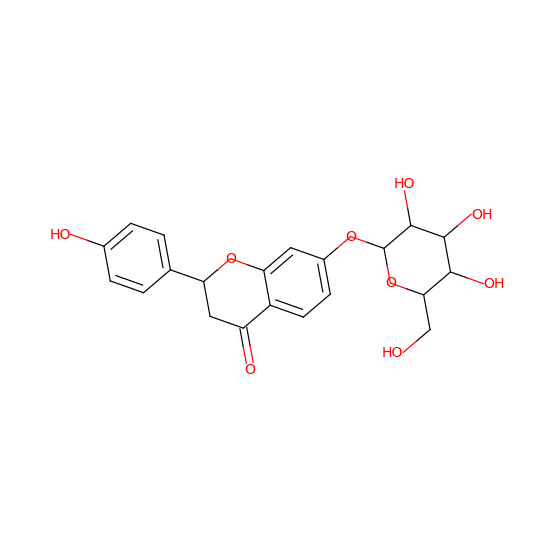

O=C1C2=CC=C(O)C=C2OC(C3=CC=C(OC4OC(CO)C(O)C(O)C4O)C=C3)C1


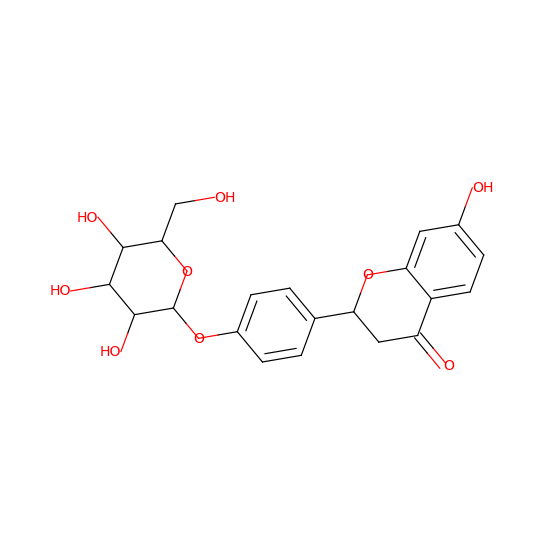

tanimoto: 0.9851337958374629
MS2Query: 0.7379
O=C1C2=CC=C(OC3OC(CO)C(O)C(O)C3O)C=C2OC(C4=CC=C(O)C=C4)C1


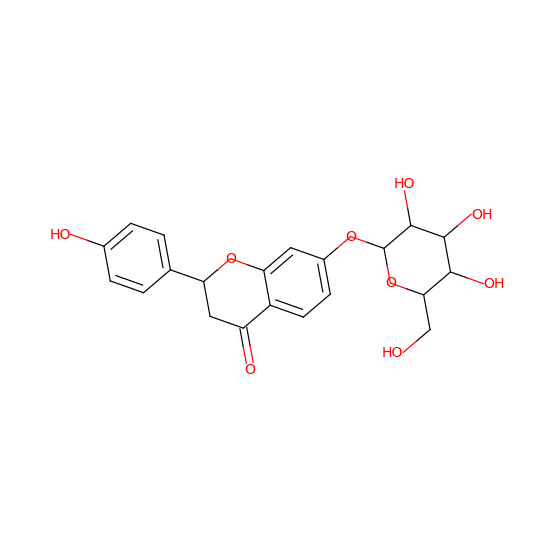

O=C1C2=CC=C(O)C=C2OC(C3=CC=C(OC4OC(CO)C(O)C(O)C4O)C=C3)C1


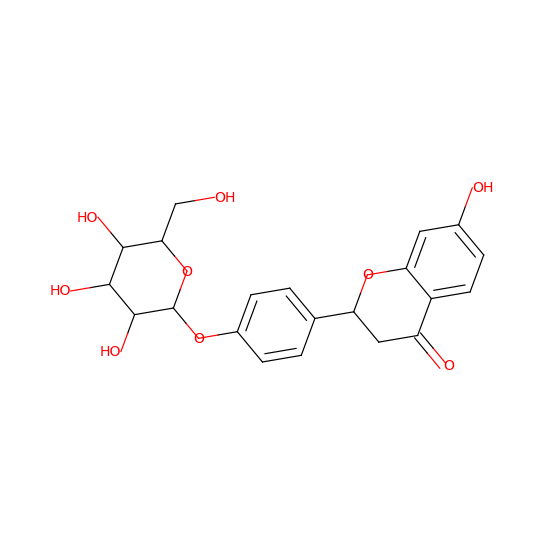

tanimoto: 0.9851337958374629
MS2Query: 0.8634
O=C1C2=CC=C(OC3OC(CO)C(O)C(O)C3O)C=C2OC(C4=CC=C(O)C=C4)C1


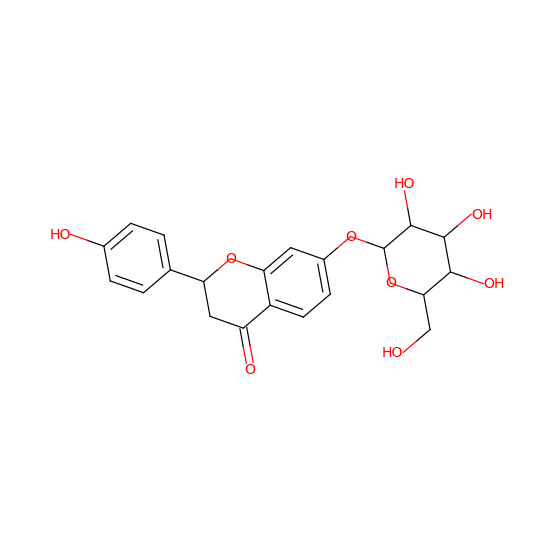

O=C1C2=CC=C(O)C=C2OC(C3=CC=C(OC4OC(CO)C(O)C(O)C4O)C=C3)C1


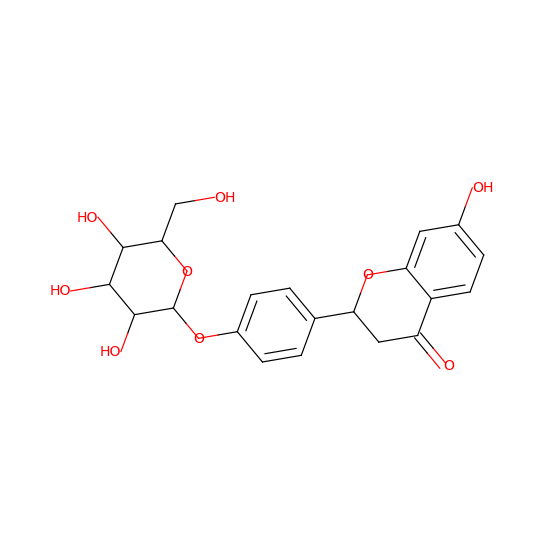

tanimoto: 0.9851337958374629
MS2Query: 0.7419
O=C1CC(c2ccc(O)cc2)Oc2cc(O[C@@H]3O[C@H](CO)[C@@H](O)[C@H](O)[C@H]3O)ccc21


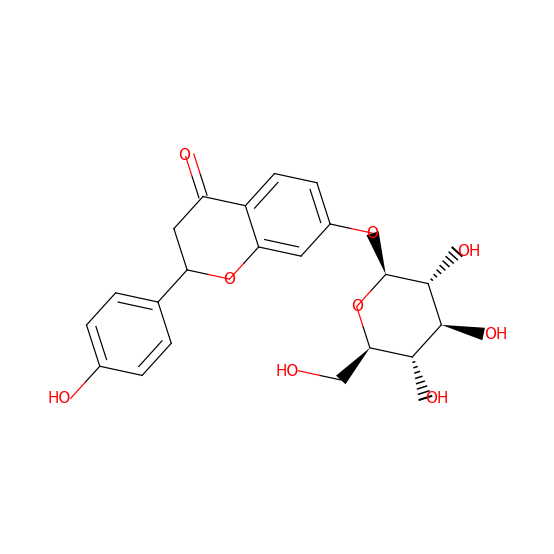

O=C1C2=CC=C(O)C=C2OC(C3=CC=C(OC4OC(CO)C(O)C(O)C4O)C=C3)C1


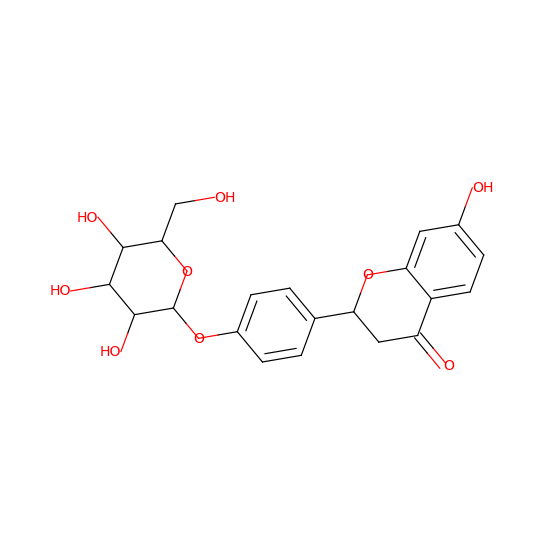

tanimoto: 0.9851337958374629
MS2Query: 0.7419
O=C1CC(c2ccc(O)cc2)Oc2cc(O[C@@H]3O[C@H](CO)[C@@H](O)[C@H](O)[C@H]3O)ccc21


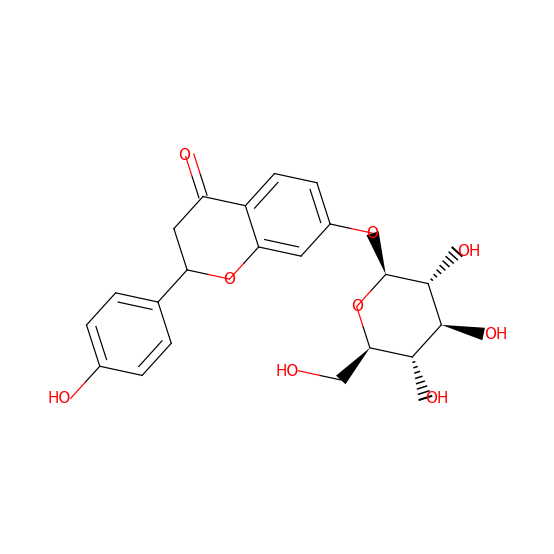

O=C1C2=CC=C(O)C=C2OC(C3=CC=C(OC4OC(CO)C(O)C(O)C4O)C=C3)C1


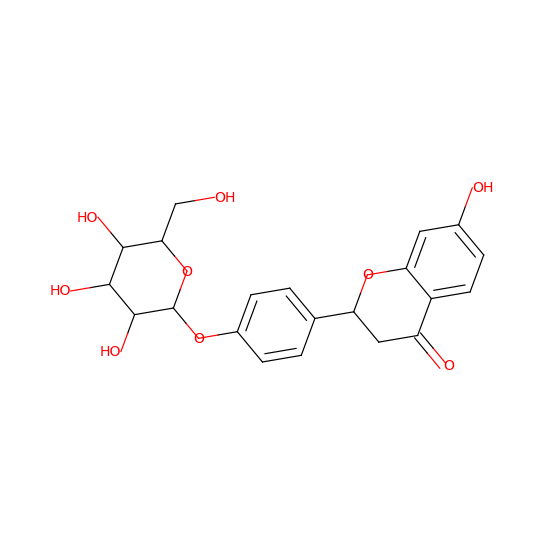

tanimoto: 0.985981308411215
MS2Query: 0.8699
OCC1OC(OC2C(O)C(O)C(OC2OC3CCC4(C)C5CC(O)C6C(CCC6(C)C5(C)CC(O)C4C3(C)C)C(OC7OC(CO)C(O)C(O)C7O)(C)CCC=C(C)C)CO)C(O)C(O)C1O


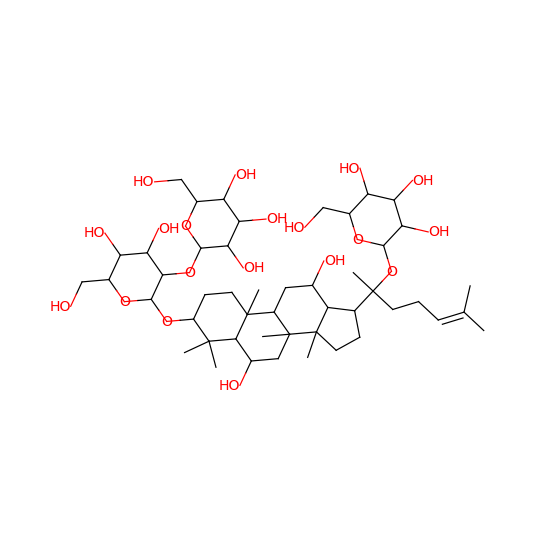

OCC1OC(OC2C(O)C(O)C(OC2OC3C(O)CC4(C)C(CCC5(C)C4CC(O)C6C(CCC65C)C(OC7OC(CO)C(O)C(O)C7O)(C)CCC=C(C)C)C3(C)C)CO)C(O)C(O)C1O


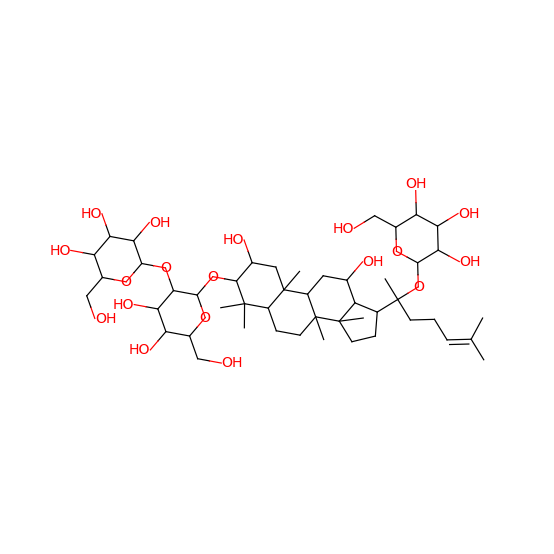

tanimoto: 0.985981308411215
MS2Query: 0.9321
OCC1OC(OC2C(O)C(O)C(OC2OC3CCC4(C)C5CC(O)C6C(CCC6(C)C5(C)CC(O)C4C3(C)C)C(OC7OC(CO)C(O)C(O)C7O)(C)CCC=C(C)C)CO)C(O)C(O)C1O


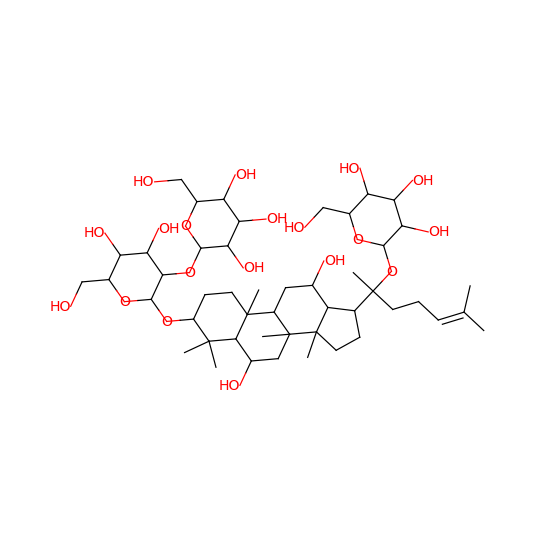

OCC1OC(OC2C(O)C(O)C(OC2OC3C(O)CC4(C)C(CCC5(C)C4CC(O)C6C(CCC65C)C(OC7OC(CO)C(O)C(O)C7O)(C)CCC=C(C)C)C3(C)C)CO)C(O)C(O)C1O


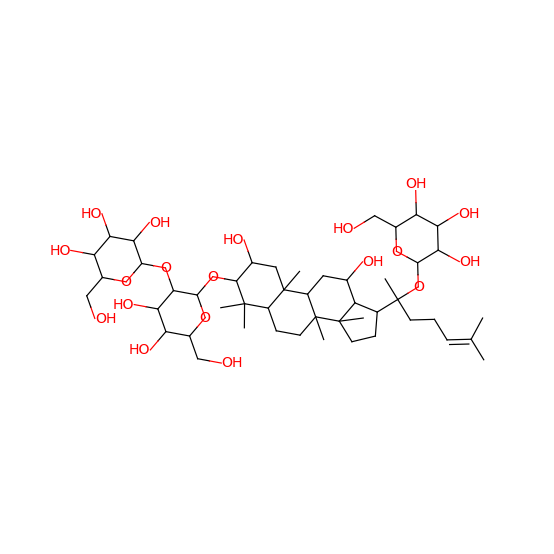

tanimoto: 0.9570917759237187
MS2Query: 0.7906
O=C(OC1OC(CO)C(O)C(O)C1O)C2(C)CCCC3(C)C2CCC45CC(=C)C(OC6OC(CO)C(O)C(O)C6OC7OC(CO)C(O)C(O)C7O)(CCC43)C5


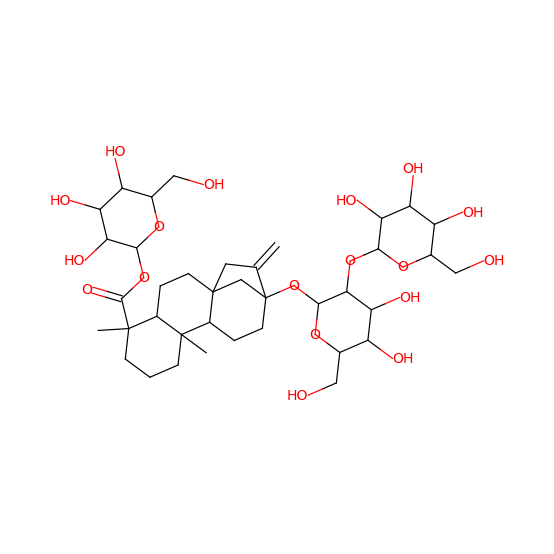

O=C(OC1OC(CO)C(O)C(O)C1O)C2(C)CCCC3(C)C2CCC45CC(=C)C(OC6OC(CO)C(O)C(OC7OC(CO)C(O)C(O)C7O)C6O)(CCC43)C5


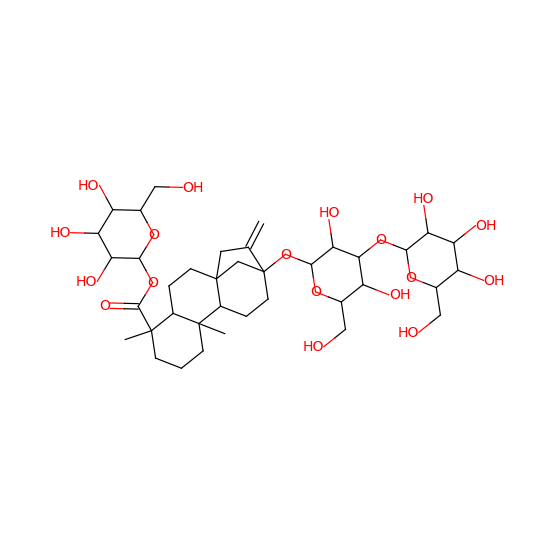

tanimoto: 0.9847036328871893
MS2Query: 0.9729
OC1=C(OC)C=C2C3=C1OC=4C=C5C(=CC4OC)CCN(C)C5CC6=CC=C(OC7=CC(=CC=C7OC)CC3N(C)CC2)C=C6


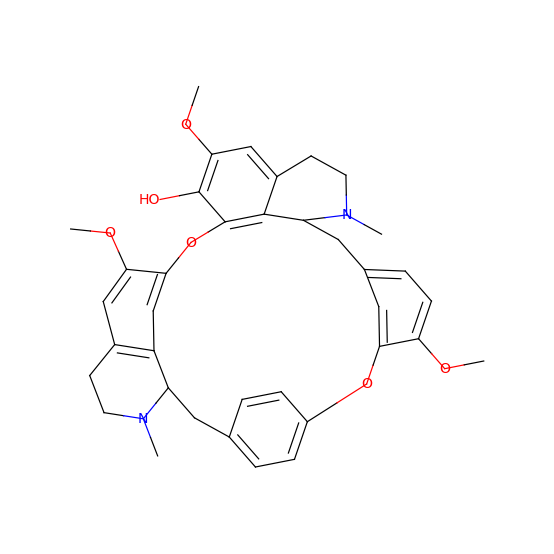

OC1=CC=C2C=C1OC3=CC=C(C=C3)CC4C5=CC(OC=6C(OC)=C(OC)C=C7C6C(N(C)CC7)C2)=C(OC)C=C5CCN4C


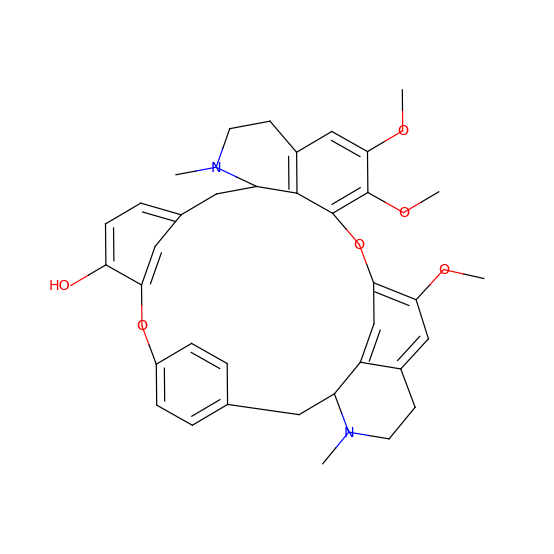

tanimoto: 0.9847036328871893
MS2Query: 0.9733
OC1=C(OC)C=C2C3=C1OC=4C=C5C(=CC4OC)CCN(C)C5CC6=CC=C(OC7=CC(=CC=C7OC)CC3N(C)CC2)C=C6


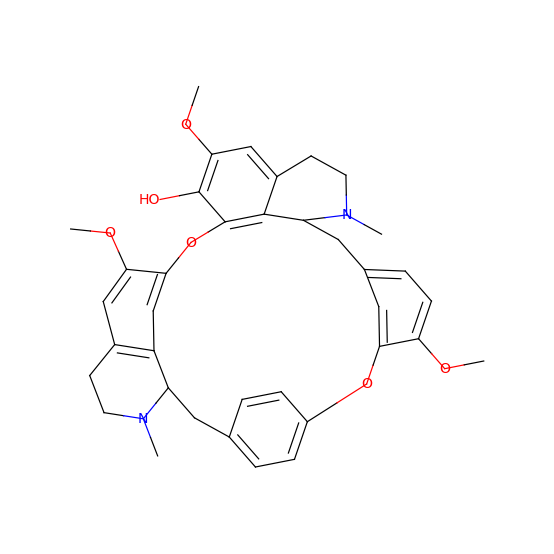

OC1=CC=C2C=C1OC3=CC=C(C=C3)CC4C5=CC(OC=6C(OC)=C(OC)C=C7C6C(N(C)CC7)C2)=C(OC)C=C5CCN4C


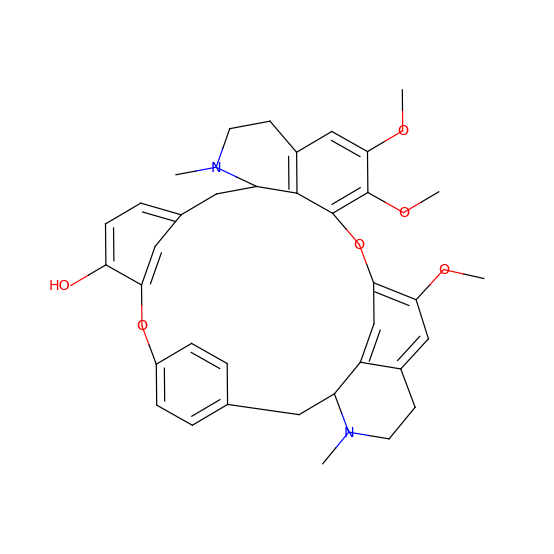

tanimoto: 0.9847036328871893
MS2Query: 0.92
OC1=C(OC)C=C2C3=C1OC=4C=C5C(=CC4OC)CCN(C)C5CC6=CC=C(OC7=CC(=CC=C7OC)CC3N(C)CC2)C=C6


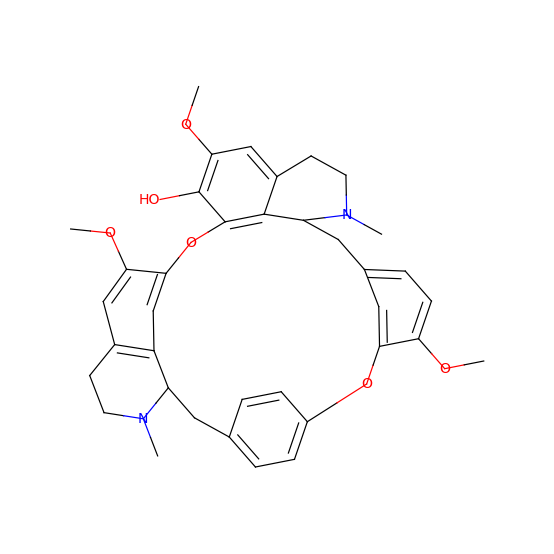

OC1=CC=C2C=C1OC3=CC=C(C=C3)CC4C5=CC(OC=6C(OC)=C(OC)C=C7C6C(N(C)CC7)C2)=C(OC)C=C5CCN4C


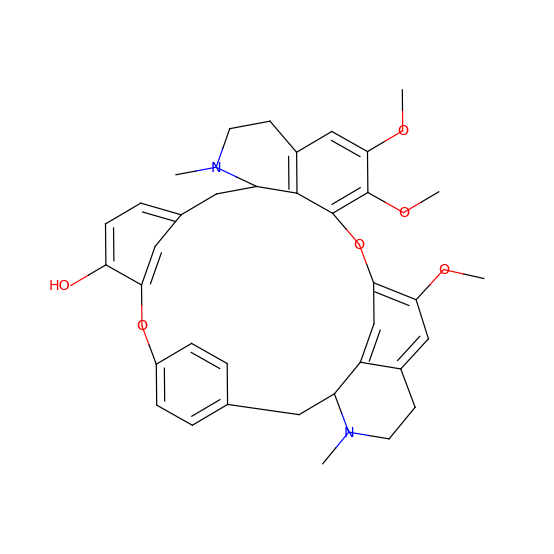

tanimoto: 0.9847036328871893
MS2Query: 0.8708
OC1=C(OC)C=C2C3=C1OC=4C=C5C(=CC4OC)CCN(C)C5CC6=CC=C(OC7=CC(=CC=C7OC)CC3N(C)CC2)C=C6


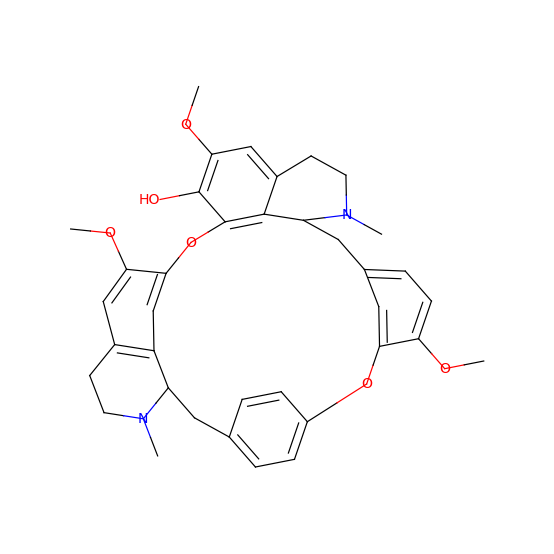

OC1=CC=C2C=C1OC3=CC=C(C=C3)CC4C5=CC(OC=6C(OC)=C(OC)C=C7C6C(N(C)CC7)C2)=C(OC)C=C5CCN4C


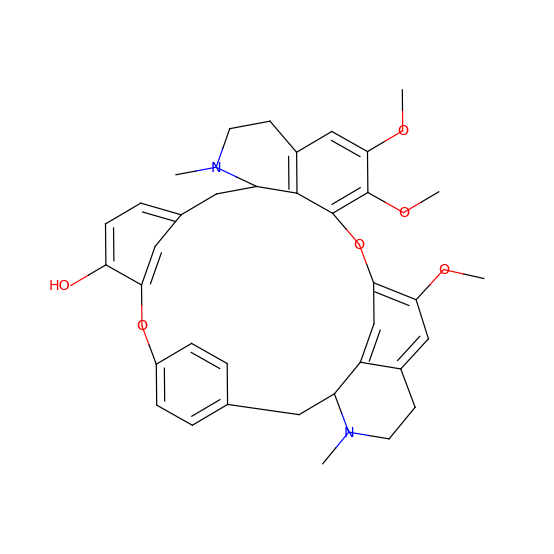

tanimoto: 0.9847036328871893
MS2Query: 0.9321
OC1=C(OC)C=C2C3=C1OC=4C=C5C(=CC4OC)CCN(C)C5CC6=CC=C(OC7=CC(=CC=C7OC)CC3N(C)CC2)C=C6


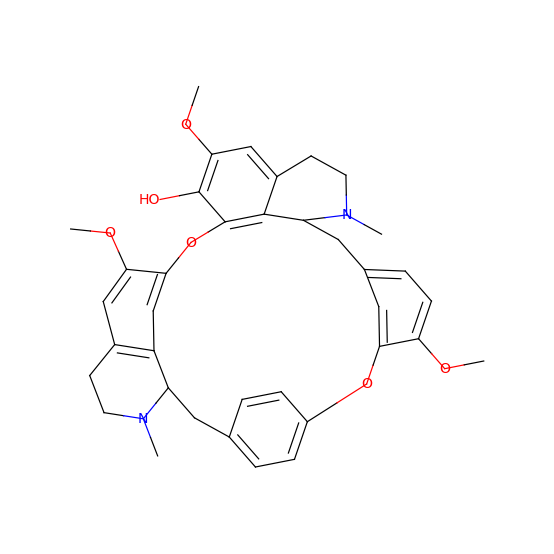

OC1=CC=C2C=C1OC3=CC=C(C=C3)CC4C5=CC(OC=6C(OC)=C(OC)C=C7C6C(N(C)CC7)C2)=C(OC)C=C5CCN4C


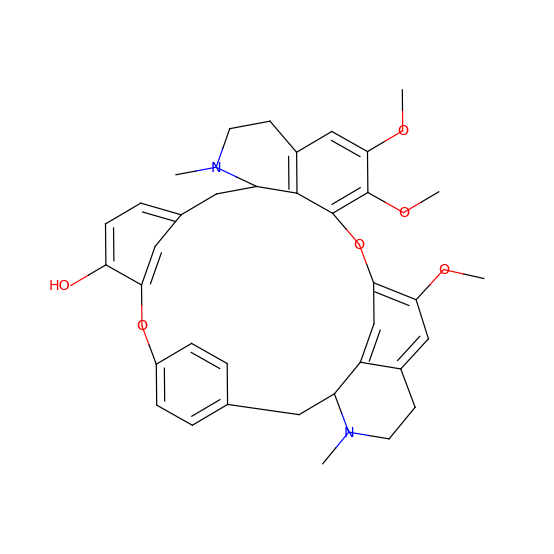

tanimoto: 0.974934036939314
MS2Query: 0.9321
OCC1OC(OCC2OC(OC3CCC4C(=CCC5C4(C)C(O)CC6(C)C(CCC56C)C(C)CCC(OC7OC(CO)C(O)C(O)C7OC8OC(CO)C(O)C(O)C8O)C(O)(C)C)C3(C)C)C(O)C(O)C2O)C(O)C(O)C1O


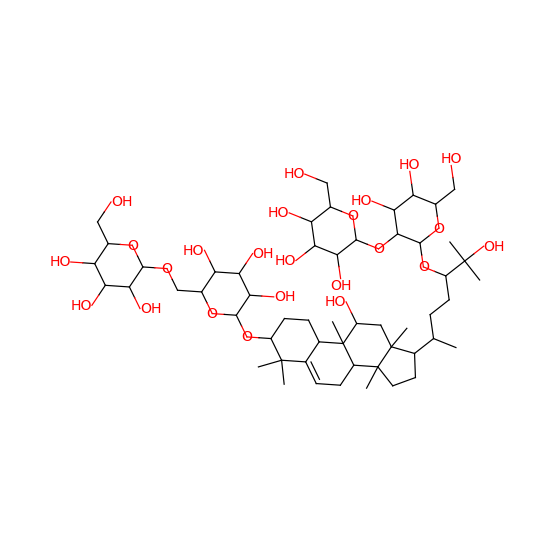

OCC1OC(OCC2OC(OC(CCC(C)C3CCC4(C)C5CC=C6C(CCC(OC7OC(COC8OC(CO)C(O)C(O)C8O)C(O)C(O)C7O)C6(C)C)C5(C)C(O)CC34C)C(O)(C)C)C(O)C(O)C2O)C(O)C(O)C1O


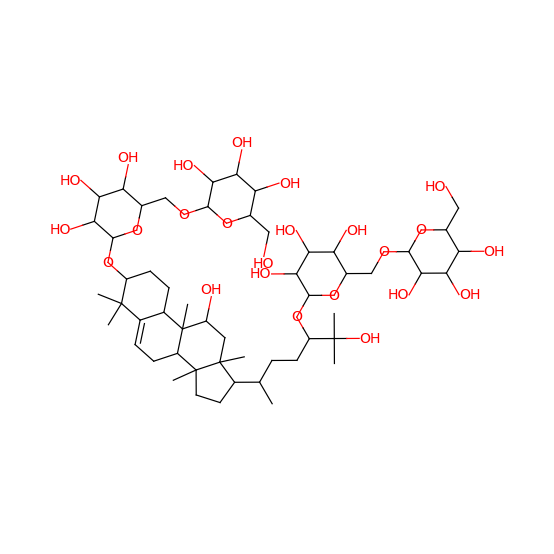

tanimoto: 0.974934036939314
MS2Query: 0.9321
OCC1OC(OCC2OC(OC3CCC4C(=CCC5C4(C)C(O)CC6(C)C(CCC56C)C(C)CCC(OC7OC(CO)C(O)C(O)C7OC8OC(CO)C(O)C(O)C8O)C(O)(C)C)C3(C)C)C(O)C(O)C2O)C(O)C(O)C1O


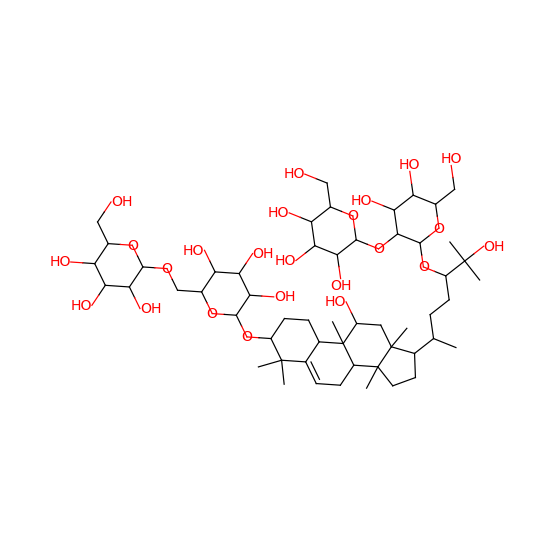

OCC1OC(OCC2OC(OC(CCC(C)C3CCC4(C)C5CC=C6C(CCC(OC7OC(COC8OC(CO)C(O)C(O)C8O)C(O)C(O)C7O)C6(C)C)C5(C)C(O)CC34C)C(O)(C)C)C(O)C(O)C2O)C(O)C(O)C1O


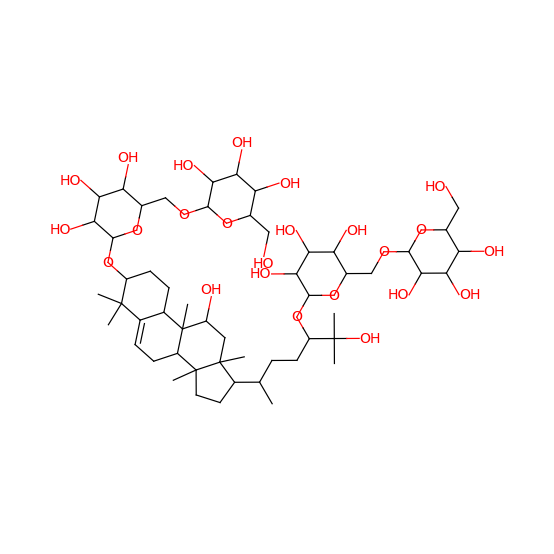

tanimoto: 0.974934036939314
MS2Query: 0.9321
OCC1OC(OCC2OC(OC3CCC4C(=CCC5C4(C)C(O)CC6(C)C(CCC56C)C(C)CCC(OC7OC(CO)C(O)C(O)C7OC8OC(CO)C(O)C(O)C8O)C(O)(C)C)C3(C)C)C(O)C(O)C2O)C(O)C(O)C1O


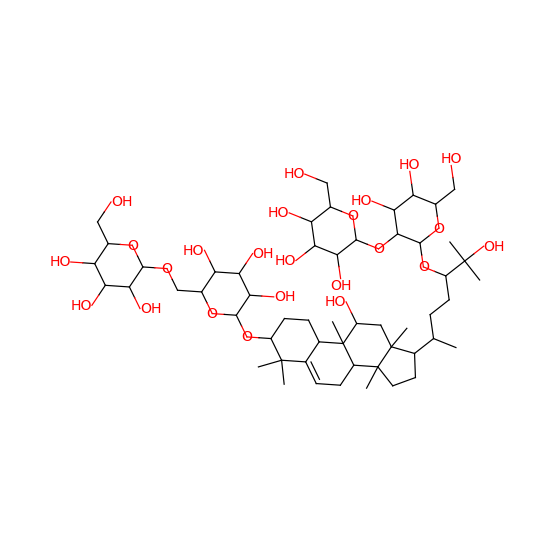

OCC1OC(OCC2OC(OC(CCC(C)C3CCC4(C)C5CC=C6C(CCC(OC7OC(COC8OC(CO)C(O)C(O)C8O)C(O)C(O)C7O)C6(C)C)C5(C)C(O)CC34C)C(O)(C)C)C(O)C(O)C2O)C(O)C(O)C1O


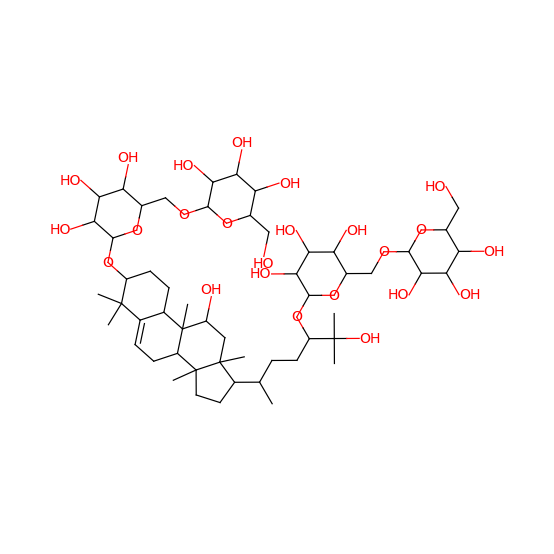

tanimoto: 0.9434447300771208
MS2Query: 0.8512
CC1OC(OC2C(O)C(COC(=O)/C=C/c3ccc(O)c(O)c3)OC(OCCc3ccc(O)c(O)c3)C2O)C(OC2OC(CO)C(O)C(O)C2O)C(O)C1O


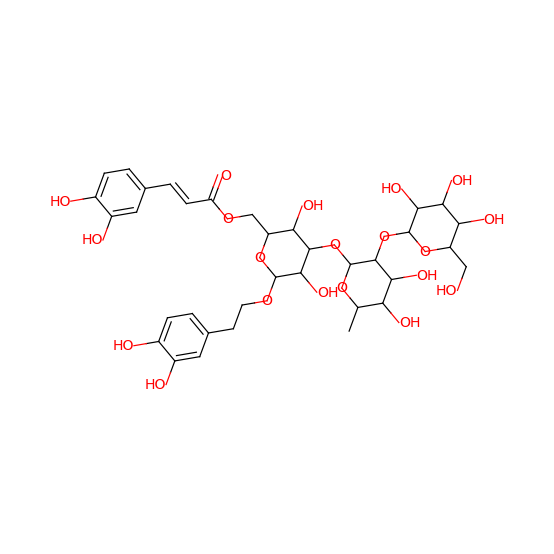

O=C(OC1C(OC(OCCC2=CC=C(O)C(O)=C2)C(O)C1OC3OC(C)C(O)C(O)C3O)COC4OC(CO)C(O)C(O)C4O)C=CC5=CC=C(O)C(O)=C5


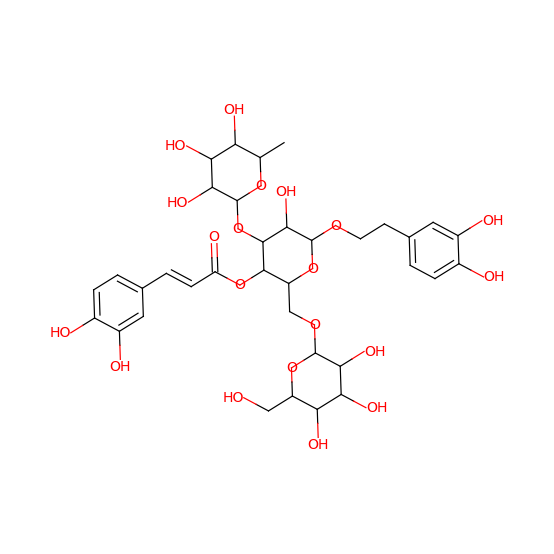

tanimoto: 0.9434447300771208
MS2Query: 0.8305
CC1OC(OC2C(O)C(COC(=O)/C=C/c3ccc(O)c(O)c3)OC(OCCc3ccc(O)c(O)c3)C2O)C(OC2OC(CO)C(O)C(O)C2O)C(O)C1O


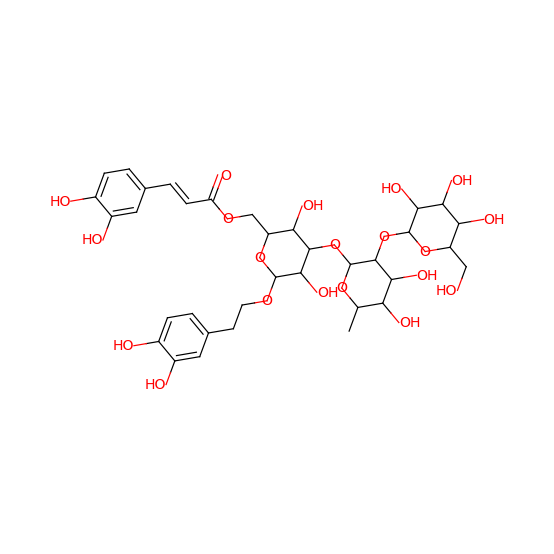

O=C(OC1C(OC(OCCC2=CC=C(O)C(O)=C2)C(O)C1OC3OC(C)C(O)C(O)C3O)COC4OC(CO)C(O)C(O)C4O)C=CC5=CC=C(O)C(O)=C5


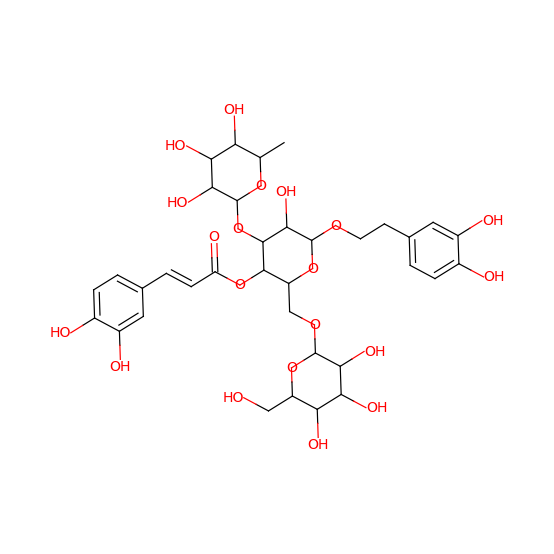

tanimoto: 0.9875195007800313
MS2Query: 0.9731
OCC1OC(OC2C(O)C(O)C(OC2OC3CCC4(C)C(CCC5(C)C4CC(O)C6C(CCC65C)C(OC7OC(CO)C(O)C(O)C7O)(C)CCC=C(C)C)C3(C)C)CO)C(O)C(O)C1O


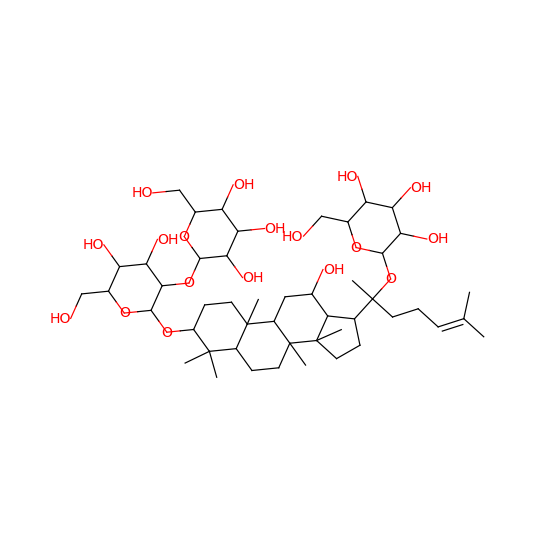

OCC1OC(OC2C(O)C(O)C(OC2OC3C(O)CC4(C)C(CCC5(C)C4CC(O)C6C(CCC65C)C(OC7OC(CO)C(O)C(O)C7O)(C)CCC=C(C)C)C3(C)C)CO)C(O)C(O)C1O


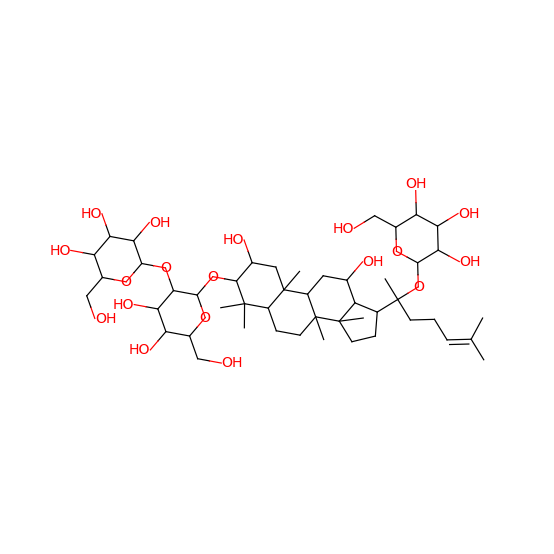

tanimoto: 0.9875195007800313
MS2Query: 0.8693
OCC1OC(OC2C(O)C(O)C(OC2OC3CCC4(C)C(CCC5(C)C4CC(O)C6C(CCC65C)C(OC7OC(CO)C(O)C(O)C7O)(C)CCC=C(C)C)C3(C)C)CO)C(O)C(O)C1O


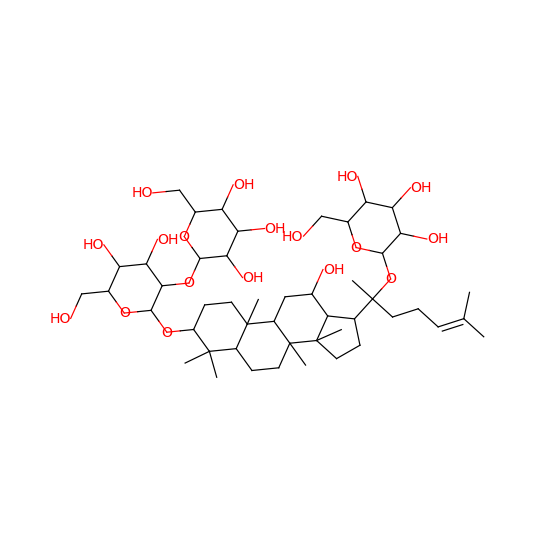

OCC1OC(OC2C(O)C(O)C(OC2OC3C(O)CC4(C)C(CCC5(C)C4CC(O)C6C(CCC65C)C(OC7OC(CO)C(O)C(O)C7O)(C)CCC=C(C)C)C3(C)C)CO)C(O)C(O)C1O


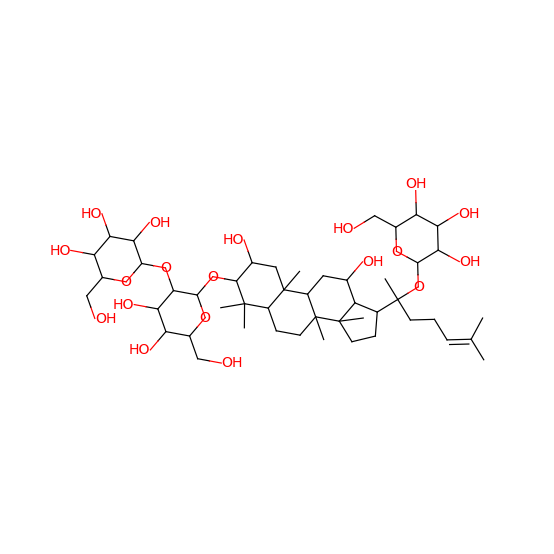

tanimoto: 0.9570917759237187
MS2Query: 0.973
O=C(OC1OC(CO)C(O)C(O)C1O)C2(C)CCCC3(C)C2CCC45CC(=C)C(OC6OC(CO)C(O)C(O)C6OC7OC(CO)C(O)C(O)C7O)(CCC43)C5


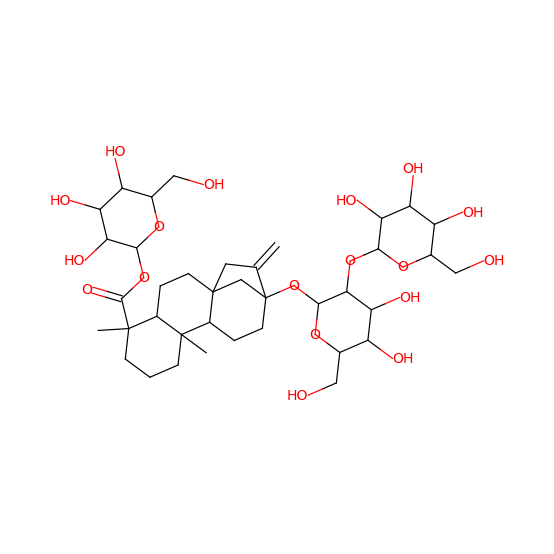

O=C(OC1OC(CO)C(O)C(O)C1O)C2(C)CCCC3(C)C2CCC45CC(=C)C(OC6OC(CO)C(O)C(OC7OC(CO)C(O)C(O)C7O)C6O)(CCC43)C5


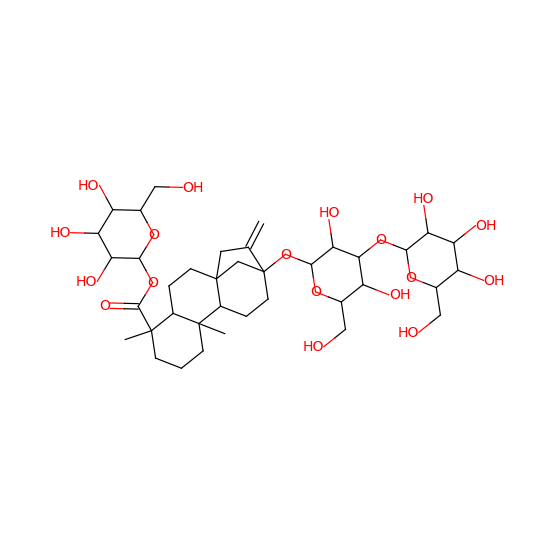

tanimoto: 0.9570917759237187
MS2Query: 0.803
O=C(OC1OC(CO)C(O)C(O)C1O)C2(C)CCCC3(C)C2CCC45CC(=C)C(OC6OC(CO)C(O)C(O)C6OC7OC(CO)C(O)C(O)C7O)(CCC43)C5


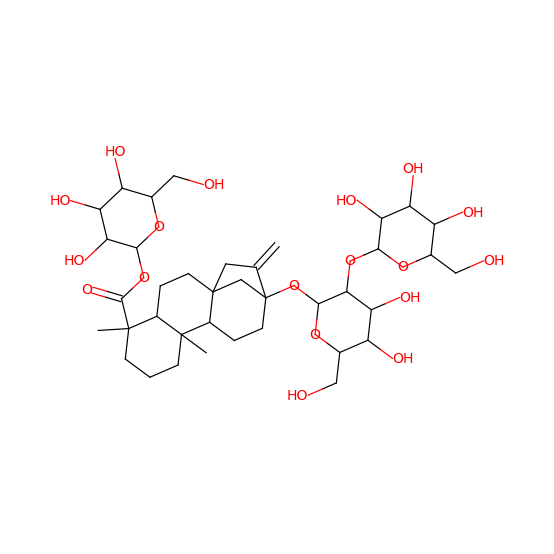

O=C(OC1OC(CO)C(O)C(O)C1O)C2(C)CCCC3(C)C2CCC45CC(=C)C(OC6OC(CO)C(O)C(OC7OC(CO)C(O)C(O)C7O)C6O)(CCC43)C5


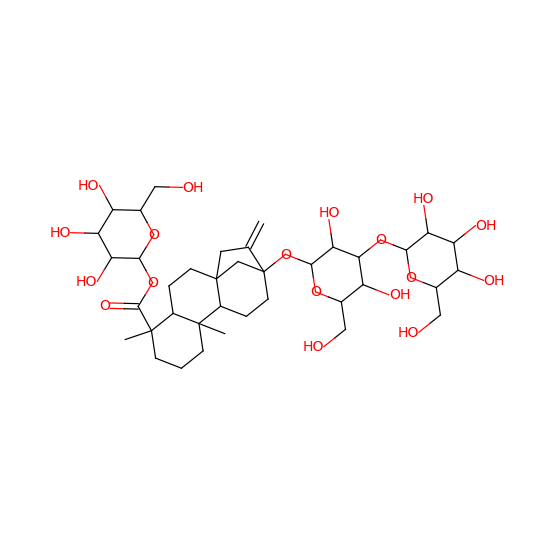

tanimoto: 0.9570917759237187
MS2Query: 0.803
O=C(OC1OC(CO)C(O)C(O)C1O)C2(C)CCCC3(C)C2CCC45CC(=C)C(OC6OC(CO)C(O)C(O)C6OC7OC(CO)C(O)C(O)C7O)(CCC43)C5


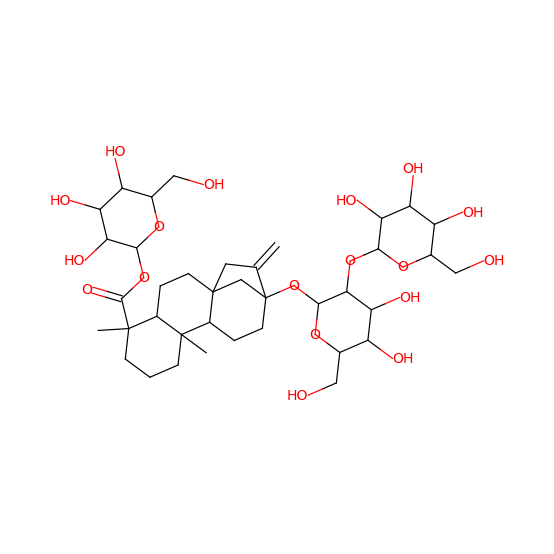

O=C(OC1OC(CO)C(O)C(O)C1O)C2(C)CCCC3(C)C2CCC45CC(=C)C(OC6OC(CO)C(O)C(OC7OC(CO)C(O)C(O)C7O)C6O)(CCC43)C5


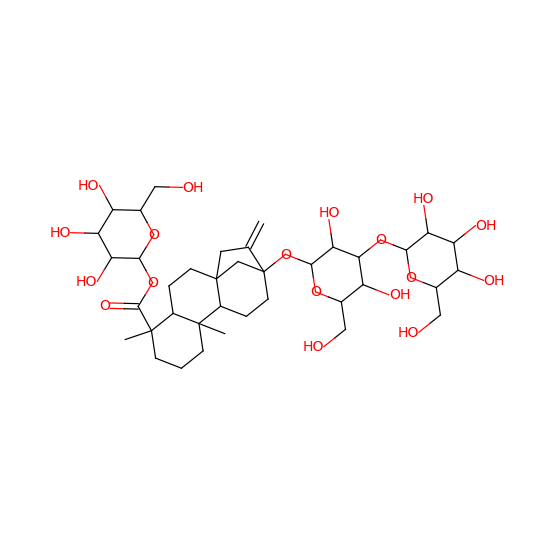

tanimoto: 0.9570917759237187
MS2Query: 0.8181
O=C(OC1OC(CO)C(O)C(O)C1O)C2(C)CCCC3(C)C2CCC45CC(=C)C(OC6OC(CO)C(O)C(O)C6OC7OC(CO)C(O)C(O)C7O)(CCC43)C5


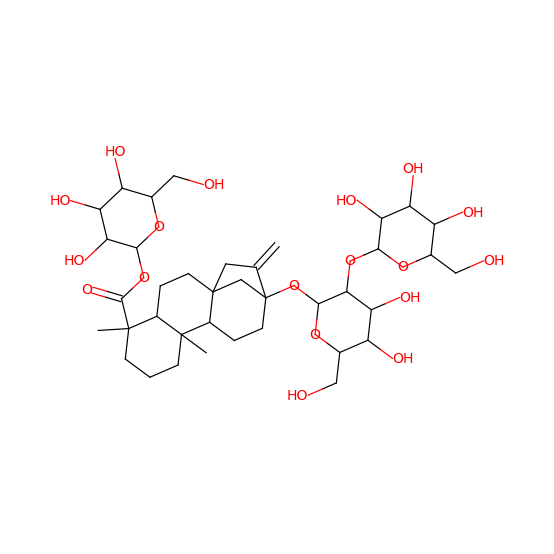

O=C(OC1OC(CO)C(O)C(O)C1O)C2(C)CCCC3(C)C2CCC45CC(=C)C(OC6OC(CO)C(O)C(OC7OC(CO)C(O)C(O)C7O)C6O)(CCC43)C5


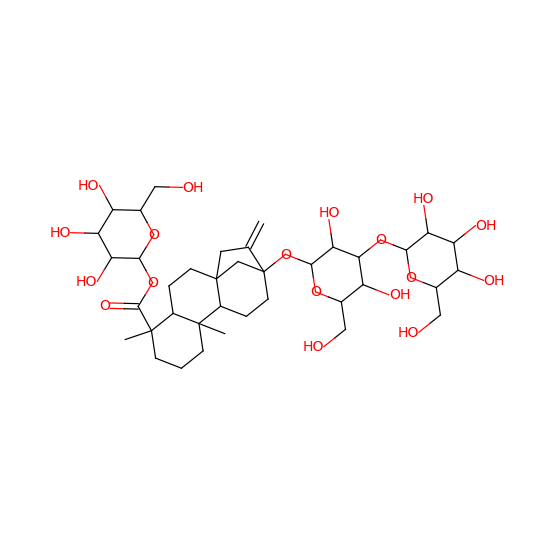

tanimoto: 0.9570917759237187
MS2Query: 0.8181
O=C(OC1OC(CO)C(O)C(O)C1O)C2(C)CCCC3(C)C2CCC45CC(=C)C(OC6OC(CO)C(O)C(O)C6OC7OC(CO)C(O)C(O)C7O)(CCC43)C5


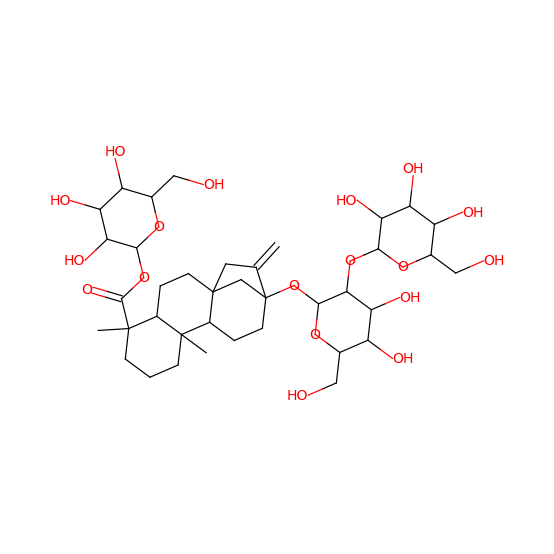

O=C(OC1OC(CO)C(O)C(O)C1O)C2(C)CCCC3(C)C2CCC45CC(=C)C(OC6OC(CO)C(O)C(OC7OC(CO)C(O)C(O)C7O)C6O)(CCC43)C5


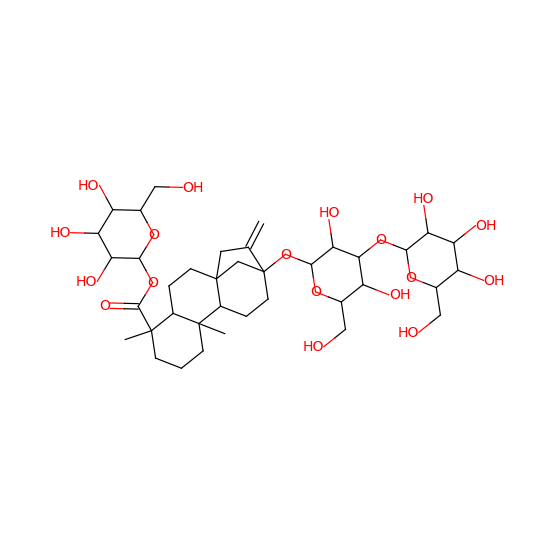

tanimoto: 0.9570917759237187
MS2Query: 0.803
O=C(OC1OC(CO)C(O)C(O)C1O)C2(C)CCCC3(C)C2CCC45CC(=C)C(OC6OC(CO)C(O)C(O)C6OC7OC(CO)C(O)C(O)C7O)(CCC43)C5


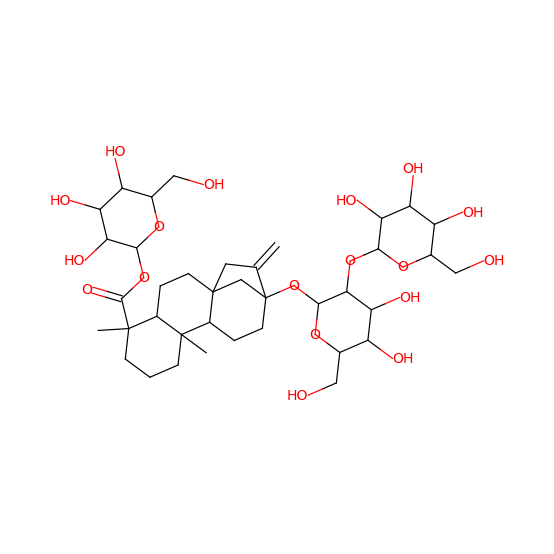

O=C(OC1OC(CO)C(O)C(O)C1O)C2(C)CCCC3(C)C2CCC45CC(=C)C(OC6OC(CO)C(O)C(OC7OC(CO)C(O)C(O)C7O)C6O)(CCC43)C5


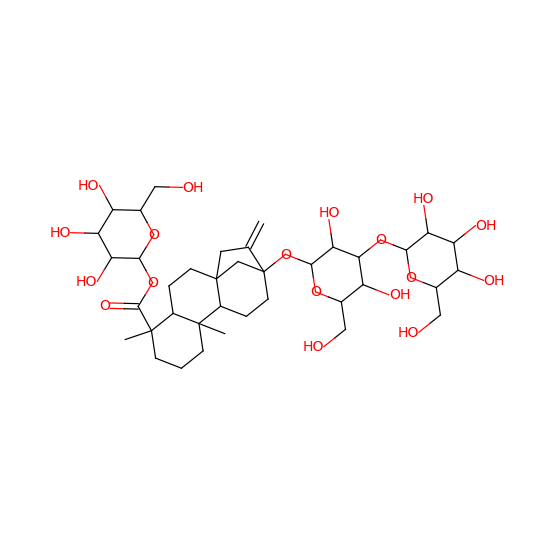

tanimoto: 0.9570917759237187
MS2Query: 0.8181
O=C(OC1OC(CO)C(O)C(O)C1O)C2(C)CCCC3(C)C2CCC45CC(=C)C(OC6OC(CO)C(O)C(O)C6OC7OC(CO)C(O)C(O)C7O)(CCC43)C5


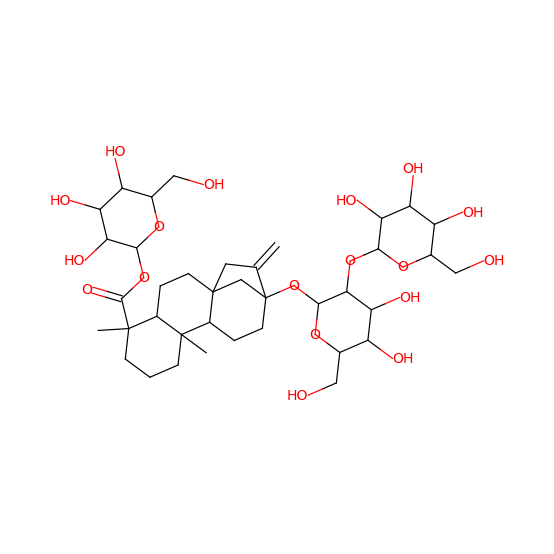

O=C(OC1OC(CO)C(O)C(O)C1O)C2(C)CCCC3(C)C2CCC45CC(=C)C(OC6OC(CO)C(O)C(OC7OC(CO)C(O)C(O)C7O)C6O)(CCC43)C5


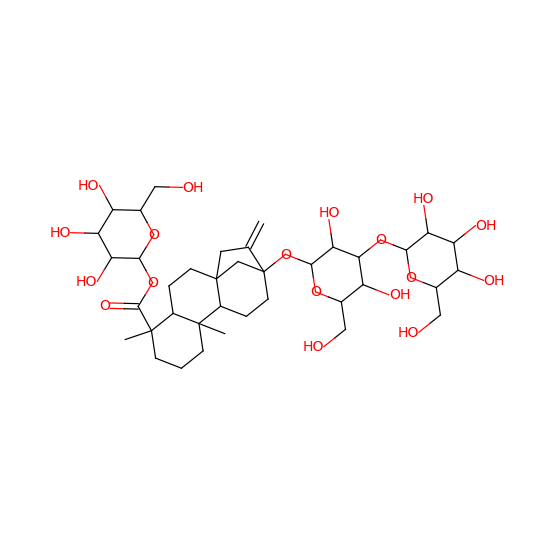

tanimoto: 0.9570917759237187
MS2Query: 0.9676
O=C(OC1OC(CO)C(O)C(O)C1O)C2(C)CCCC3(C)C2CCC45CC(=C)C(OC6OC(CO)C(O)C(O)C6OC7OC(CO)C(O)C(O)C7O)(CCC43)C5


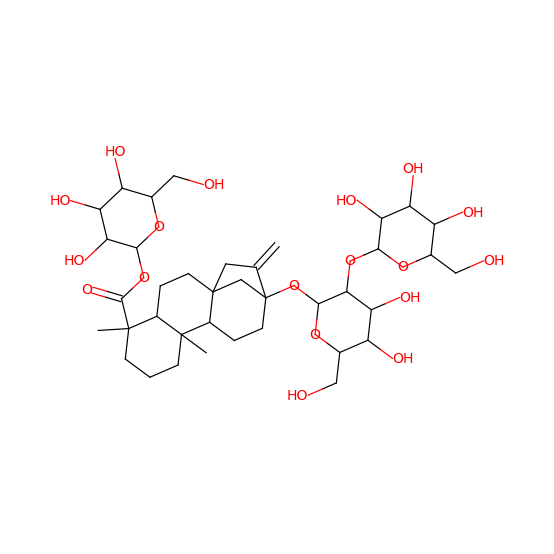

O=C(OC1OC(CO)C(O)C(O)C1O)C2(C)CCCC3(C)C2CCC45CC(=C)C(OC6OC(CO)C(O)C(OC7OC(CO)C(O)C(O)C7O)C6O)(CCC43)C5


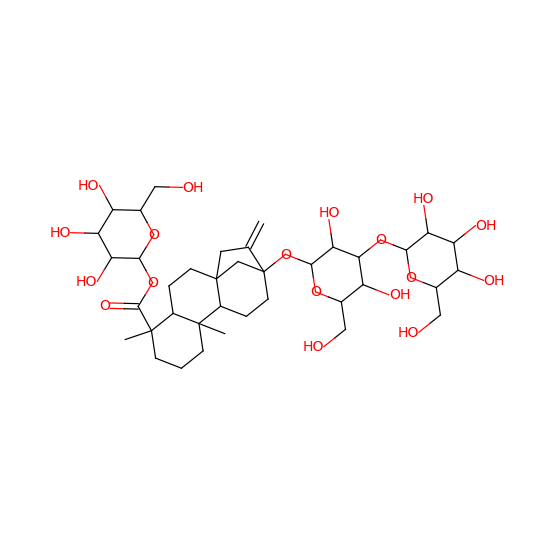

tanimoto: 0.9570917759237187
MS2Query: 0.803
O=C(OC1OC(CO)C(O)C(O)C1O)C2(C)CCCC3(C)C2CCC45CC(=C)C(OC6OC(CO)C(O)C(O)C6OC7OC(CO)C(O)C(O)C7O)(CCC43)C5


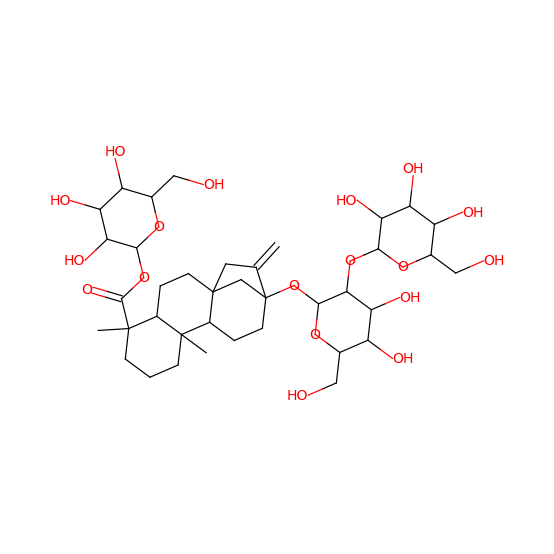

O=C(OC1OC(CO)C(O)C(O)C1O)C2(C)CCCC3(C)C2CCC45CC(=C)C(OC6OC(CO)C(O)C(OC7OC(CO)C(O)C(O)C7O)C6O)(CCC43)C5


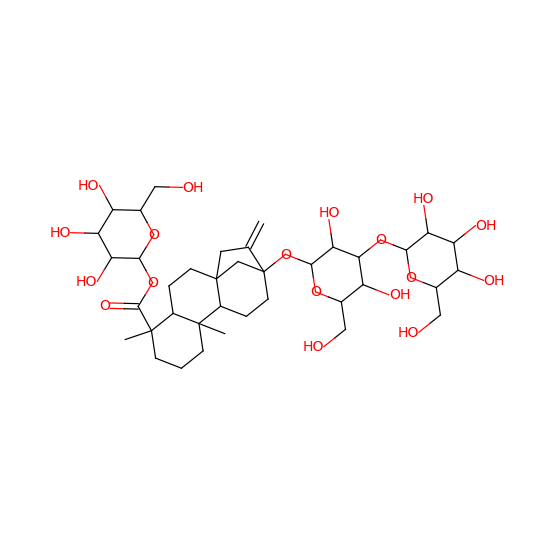

tanimoto: 0.9570917759237187
MS2Query: 0.973
O=C(OC1OC(CO)C(O)C(O)C1O)C2(C)CCCC3(C)C2CCC45CC(=C)C(OC6OC(CO)C(O)C(O)C6OC7OC(CO)C(O)C(O)C7O)(CCC43)C5


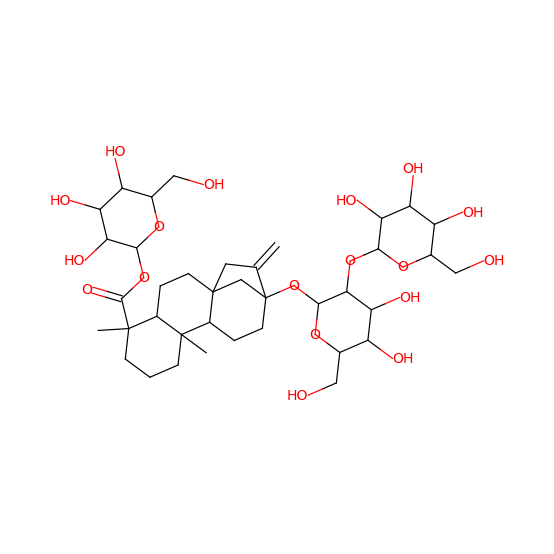

O=C(OC1OC(CO)C(O)C(O)C1O)C2(C)CCCC3(C)C2CCC45CC(=C)C(OC6OC(CO)C(O)C(OC7OC(CO)C(O)C(O)C7O)C6O)(CCC43)C5


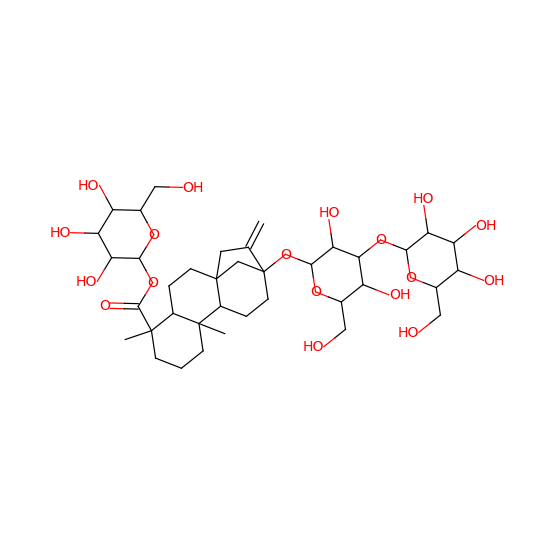

tanimoto: 0.9570917759237187
MS2Query: 0.8347
O=C(OC1OC(CO)C(O)C(O)C1O)C2(C)CCCC3(C)C2CCC45CC(=C)C(OC6OC(CO)C(O)C(O)C6OC7OC(CO)C(O)C(O)C7O)(CCC43)C5


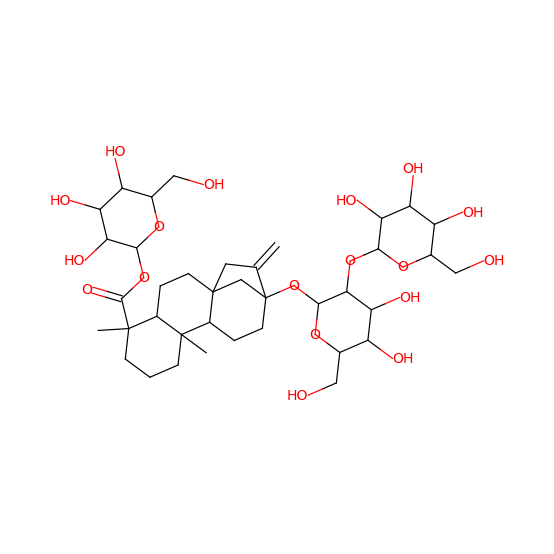

O=C(OC1OC(CO)C(O)C(O)C1O)C2(C)CCCC3(C)C2CCC45CC(=C)C(OC6OC(CO)C(O)C(OC7OC(CO)C(O)C(O)C7O)C6O)(CCC43)C5


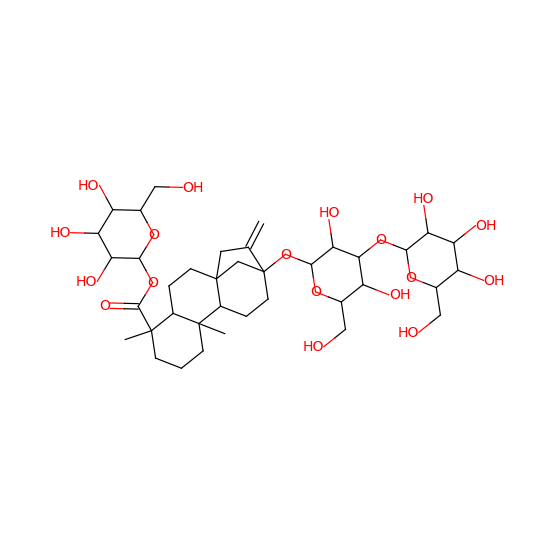

tanimoto: 0.9570917759237187
MS2Query: 0.8181
O=C(OC1OC(CO)C(O)C(O)C1O)C2(C)CCCC3(C)C2CCC45CC(=C)C(OC6OC(CO)C(O)C(O)C6OC7OC(CO)C(O)C(O)C7O)(CCC43)C5


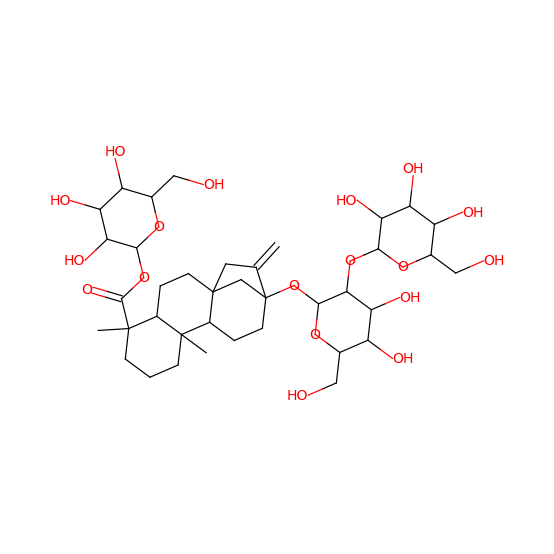

O=C(OC1OC(CO)C(O)C(O)C1O)C2(C)CCCC3(C)C2CCC45CC(=C)C(OC6OC(CO)C(O)C(OC7OC(CO)C(O)C(O)C7O)C6O)(CCC43)C5


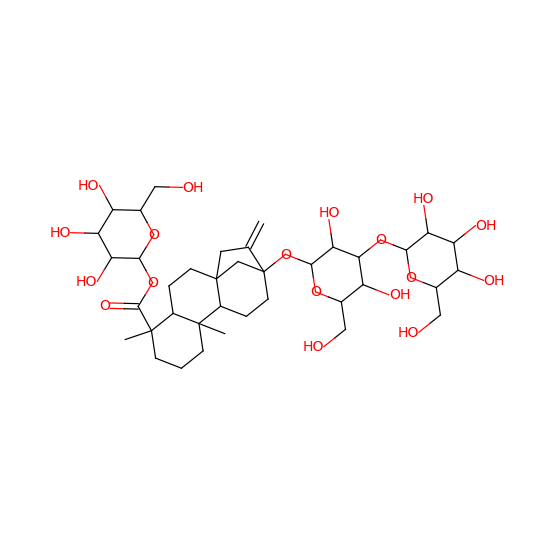

tanimoto: 0.9570917759237187
MS2Query: 0.9221
O=C(OC1OC(CO)C(O)C(O)C1O)C2(C)CCCC3(C)C2CCC45CC(=C)C(OC6OC(CO)C(O)C(O)C6OC7OC(CO)C(O)C(O)C7O)(CCC43)C5


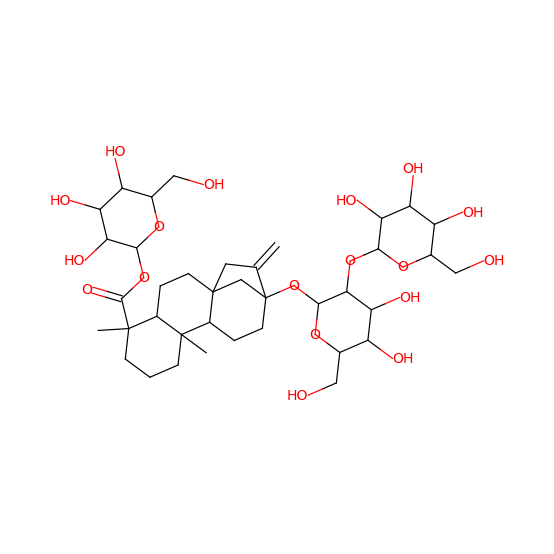

O=C(OC1OC(CO)C(O)C(O)C1O)C2(C)CCCC3(C)C2CCC45CC(=C)C(OC6OC(CO)C(O)C(OC7OC(CO)C(O)C(O)C7O)C6O)(CCC43)C5


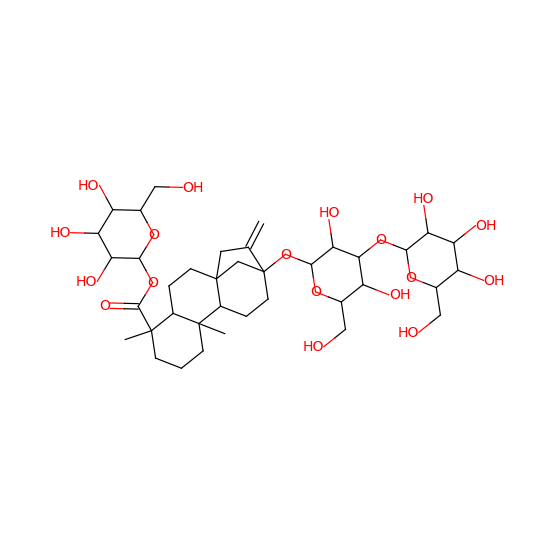

tanimoto: 0.9570917759237187
MS2Query: 0.9721
O=C(OC1OC(CO)C(O)C(O)C1O)C2(C)CCCC3(C)C2CCC45CC(=C)C(OC6OC(CO)C(O)C(O)C6OC7OC(CO)C(O)C(O)C7O)(CCC43)C5


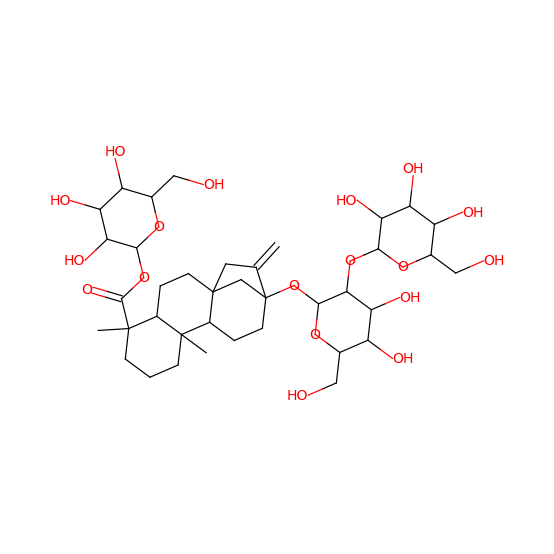

O=C(OC1OC(CO)C(O)C(O)C1O)C2(C)CCCC3(C)C2CCC45CC(=C)C(OC6OC(CO)C(O)C(OC7OC(CO)C(O)C(O)C7O)C6O)(CCC43)C5


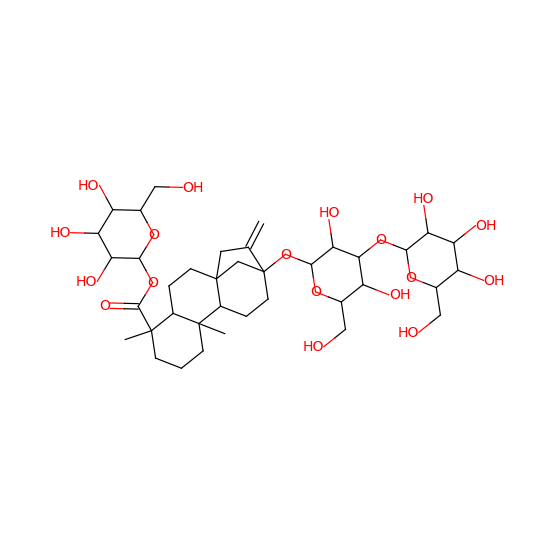

tanimoto: 0.9570917759237187
MS2Query: 0.8201
O=C(OC1OC(CO)C(O)C(O)C1O)C2(C)CCCC3(C)C2CCC45CC(=C)C(OC6OC(CO)C(O)C(O)C6OC7OC(CO)C(O)C(O)C7O)(CCC43)C5


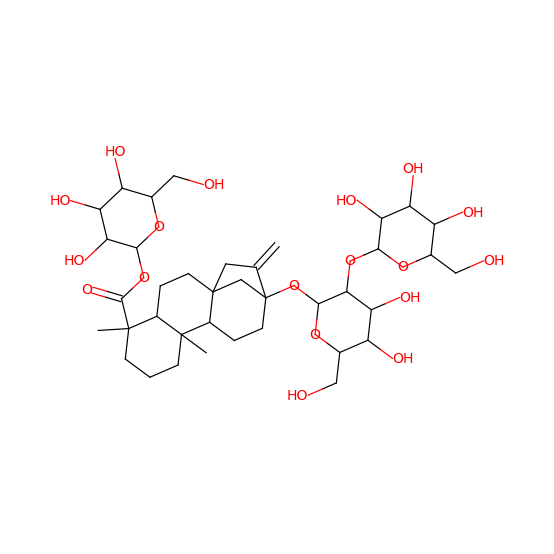

O=C(OC1OC(CO)C(O)C(O)C1O)C2(C)CCCC3(C)C2CCC45CC(=C)C(OC6OC(CO)C(O)C(OC7OC(CO)C(O)C(O)C7O)C6O)(CCC43)C5


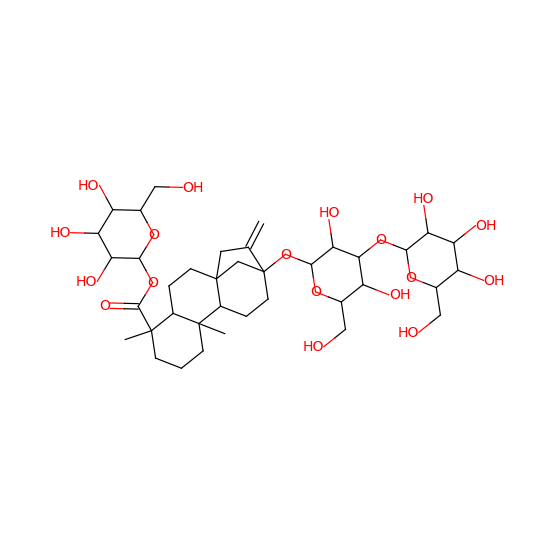

tanimoto: 0.9847036328871893
MS2Query: 0.9392
OC1=C(OC)C=C2C3=C1OC=4C=C5C(=CC4OC)CCN(C)C5CC6=CC=C(OC7=CC(=CC=C7OC)CC3N(C)CC2)C=C6


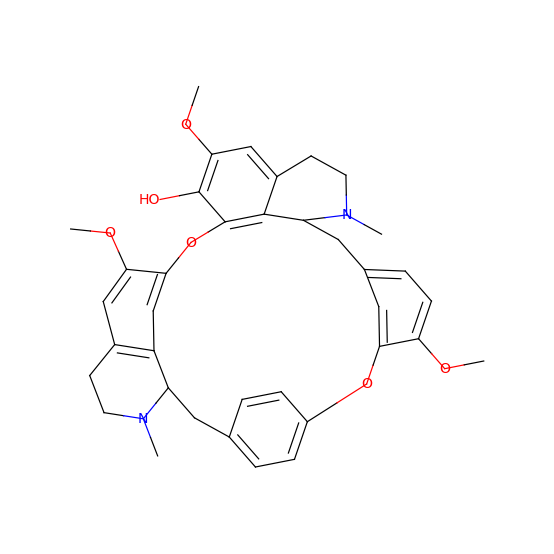

OC1=CC=C2C=C1OC3=CC=C(C=C3)CC4C5=CC(OC=6C(OC)=C(OC)C=C7C6C(N(C)CC7)C2)=C(OC)C=C5CCN4C


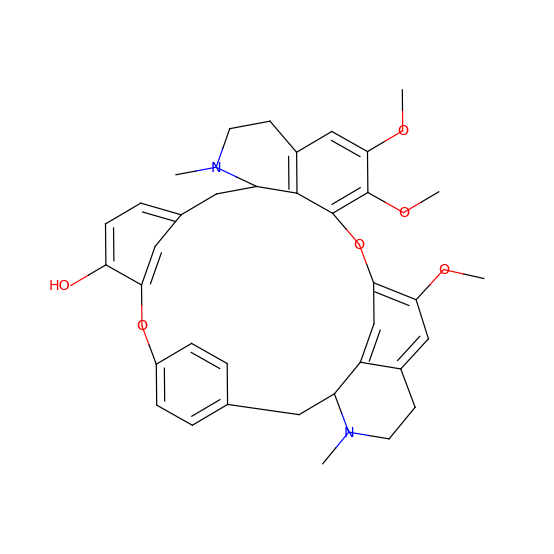

tanimoto: 0.9847036328871893
MS2Query: 0.8864
OC1=C(OC)C=C2C3=C1OC=4C=C5C(=CC4OC)CCN(C)C5CC6=CC=C(OC7=CC(=CC=C7OC)CC3N(C)CC2)C=C6


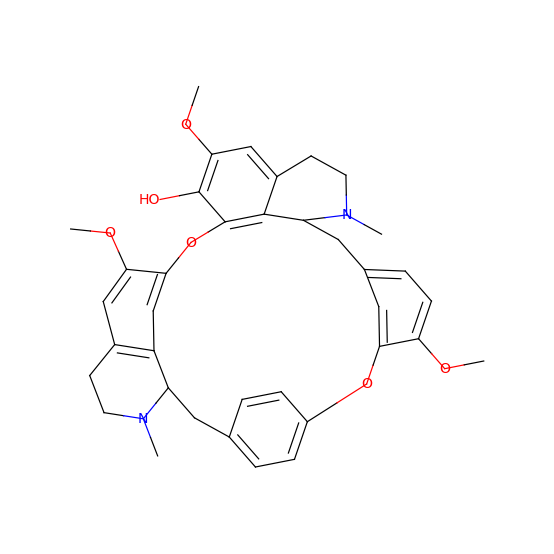

OC1=CC=C2C=C1OC3=CC=C(C=C3)CC4C5=CC(OC=6C(OC)=C(OC)C=C7C6C(N(C)CC7)C2)=C(OC)C=C5CCN4C


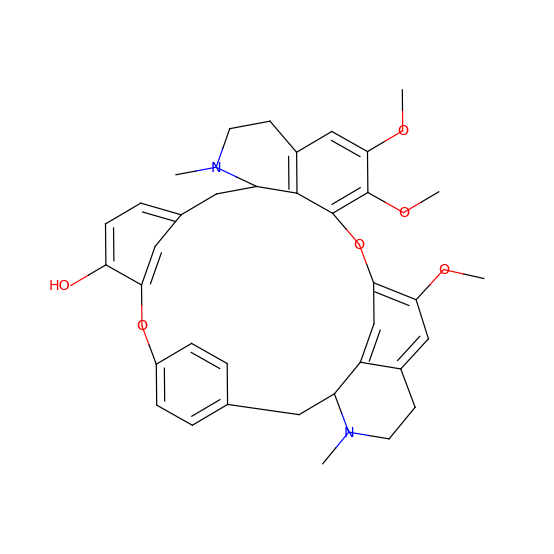

tanimoto: 0.9847036328871893
MS2Query: 0.8864
OC1=C(OC)C=C2C3=C1OC=4C=C5C(=CC4OC)CCN(C)C5CC6=CC=C(OC7=CC(=CC=C7OC)CC3N(C)CC2)C=C6


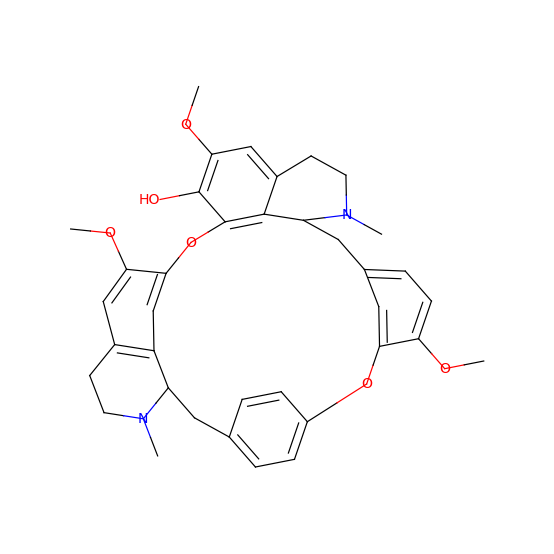

OC1=CC=C2C=C1OC3=CC=C(C=C3)CC4C5=CC(OC=6C(OC)=C(OC)C=C7C6C(N(C)CC7)C2)=C(OC)C=C5CCN4C


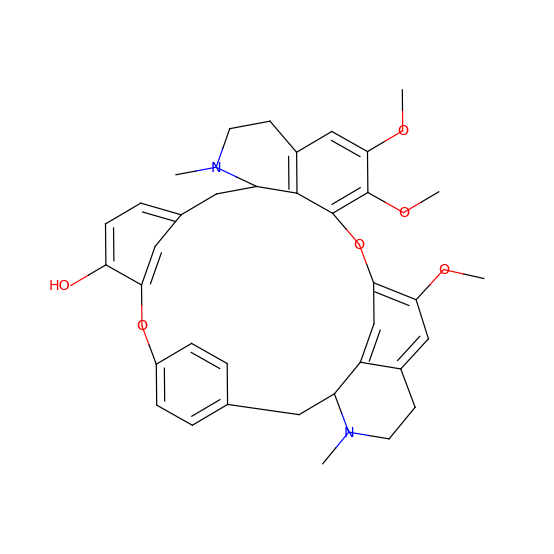

tanimoto: 0.9847036328871893
MS2Query: 0.892
OC1=C(OC)C=C2C3=C1OC=4C=C5C(=CC4OC)CCN(C)C5CC6=CC=C(OC7=CC(=CC=C7OC)CC3N(C)CC2)C=C6


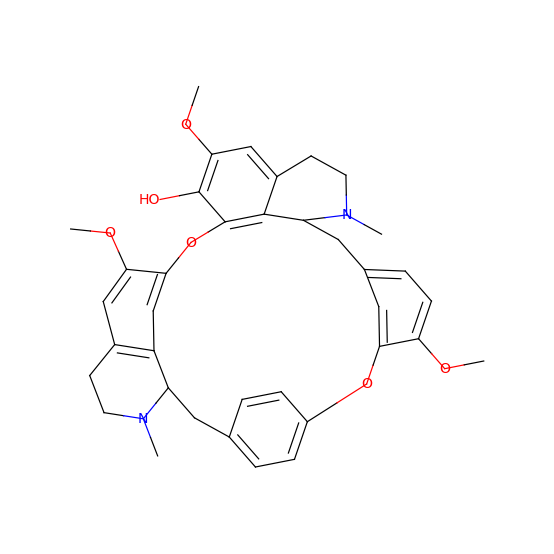

OC1=CC=C2C=C1OC3=CC=C(C=C3)CC4C5=CC(OC=6C(OC)=C(OC)C=C7C6C(N(C)CC7)C2)=C(OC)C=C5CCN4C


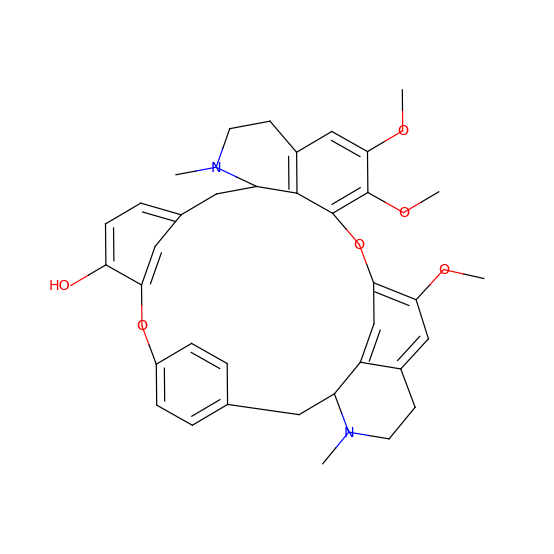

tanimoto: 0.9098939929328622
MS2Query: 0.4887
O=C(O)C(CCC(=C)C(C)C)C1C(O)CC2(C3=CCC4C(C3=CCC12C)(C)CCC(O)C4(C)C)C


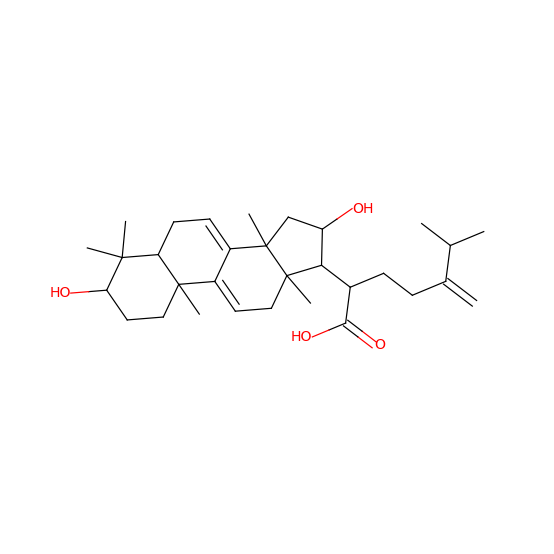

O=C(O)C(CCC(=C)C(C)C)C1C(O)CC2(C3=CCC4C(C(=O)CCC4(C3=CCC12C)C)(C)C)C


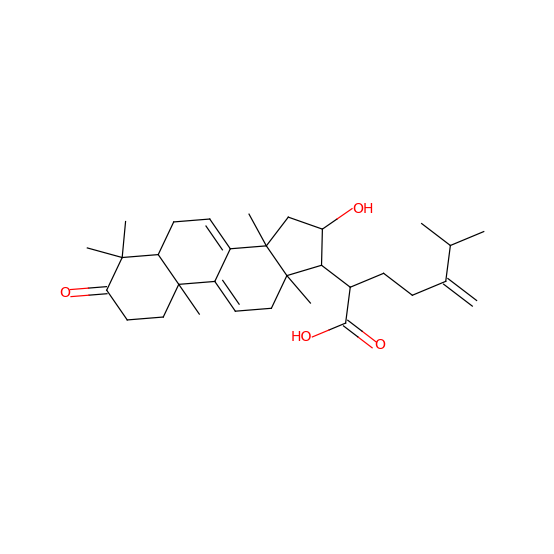

tanimoto: 0.9847036328871893
MS2Query: 0.9019
OC1=C(OC)C=C2C3=C1OC=4C=C5C(=CC4OC)CCN(C)C5CC6=CC=C(OC7=CC(=CC=C7OC)CC3N(C)CC2)C=C6


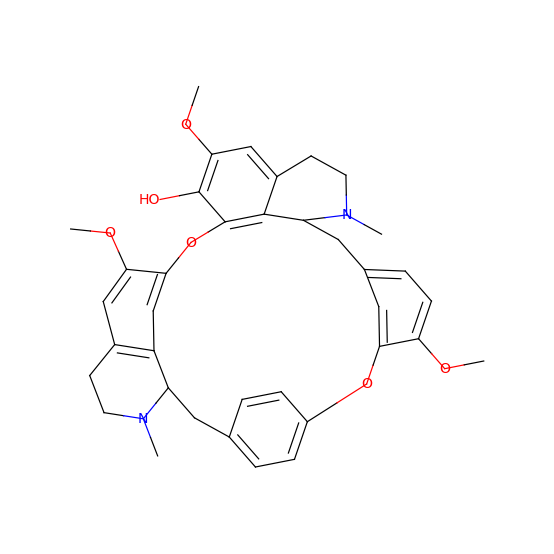

OC1=CC=C2C=C1OC3=CC=C(C=C3)CC4C5=CC(OC=6C(OC)=C(OC)C=C7C6C(N(C)CC7)C2)=C(OC)C=C5CCN4C


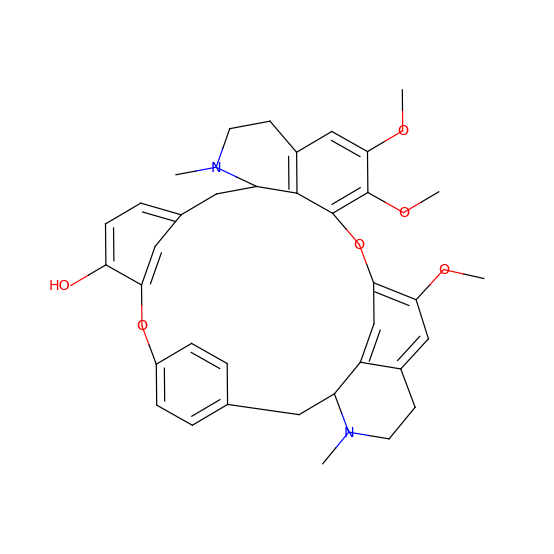

tanimoto: 0.9847036328871893
MS2Query: 0.8849
OC1=C(OC)C=C2C3=C1OC=4C=C5C(=CC4OC)CCN(C)C5CC6=CC=C(OC7=CC(=CC=C7OC)CC3N(C)CC2)C=C6


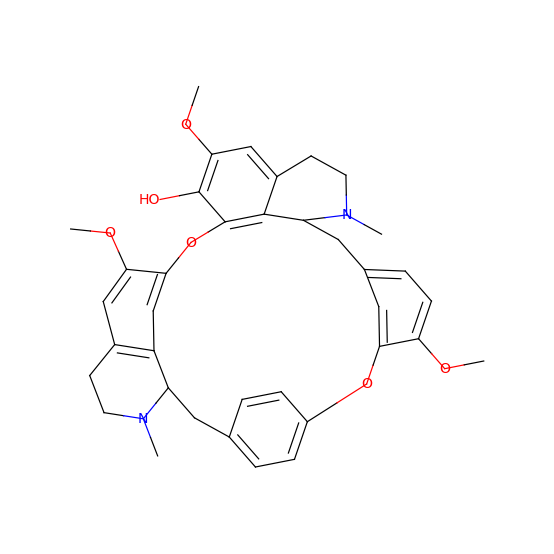

OC1=CC=C2C=C1OC3=CC=C(C=C3)CC4C5=CC(OC=6C(OC)=C(OC)C=C7C6C(N(C)CC7)C2)=C(OC)C=C5CCN4C


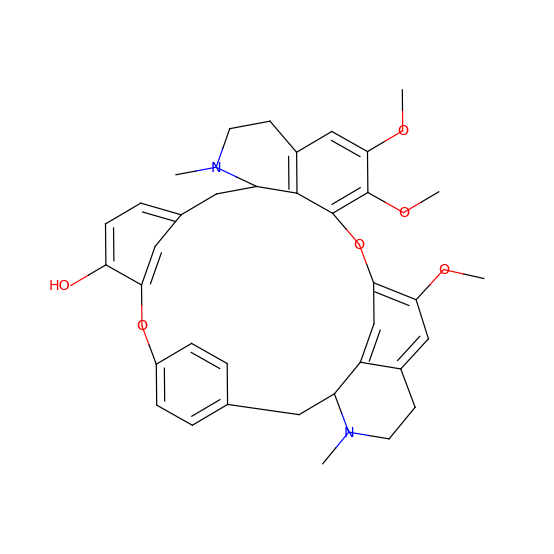

tanimoto: 0.9847036328871893
MS2Query: 0.9262
OC1=C(OC)C=C2C3=C1OC=4C=C5C(=CC4OC)CCN(C)C5CC6=CC=C(OC7=CC(=CC=C7OC)CC3N(C)CC2)C=C6


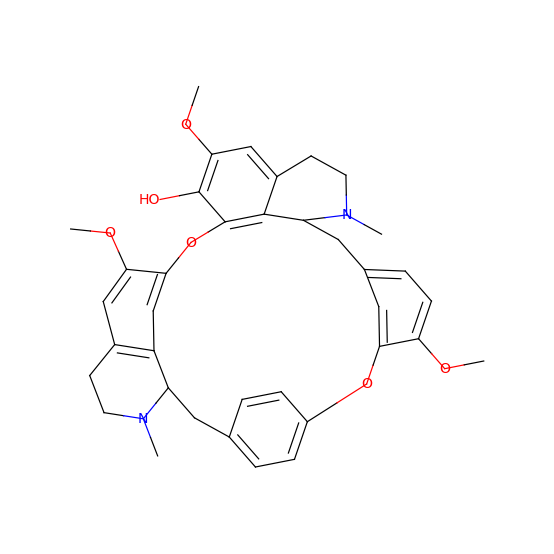

OC1=CC=C2C=C1OC3=CC=C(C=C3)CC4C5=CC(OC=6C(OC)=C(OC)C=C7C6C(N(C)CC7)C2)=C(OC)C=C5CCN4C


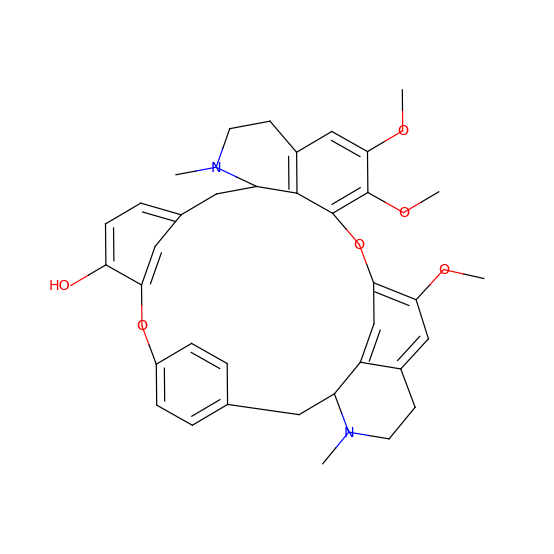

tanimoto: 0.9847036328871893
MS2Query: 0.8907
OC1=C(OC)C=C2C3=C1OC=4C=C5C(=CC4OC)CCN(C)C5CC6=CC=C(OC7=CC(=CC=C7OC)CC3N(C)CC2)C=C6


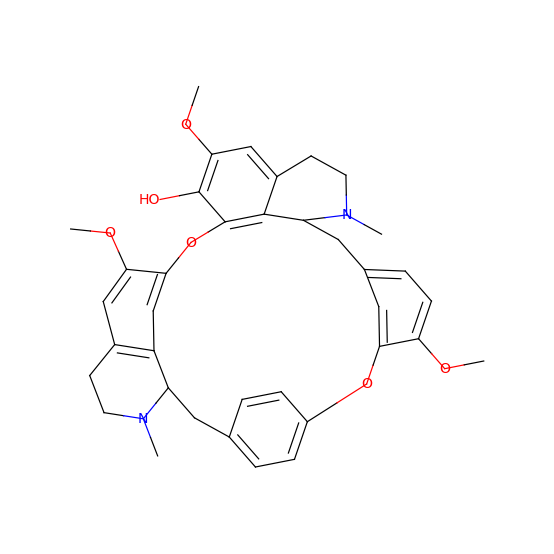

OC1=CC=C2C=C1OC3=CC=C(C=C3)CC4C5=CC(OC=6C(OC)=C(OC)C=C7C6C(N(C)CC7)C2)=C(OC)C=C5CCN4C


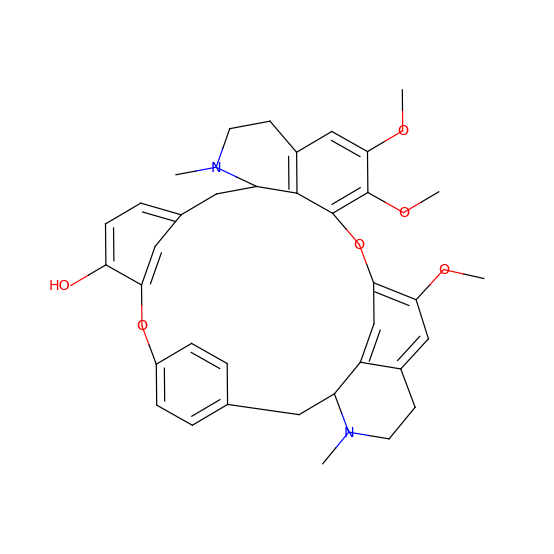

tanimoto: 0.9851337958374629
MS2Query: 0.737
O=C1C2=CC=C(OC3OC(CO)C(O)C(O)C3O)C=C2OC(C4=CC=C(O)C=C4)C1


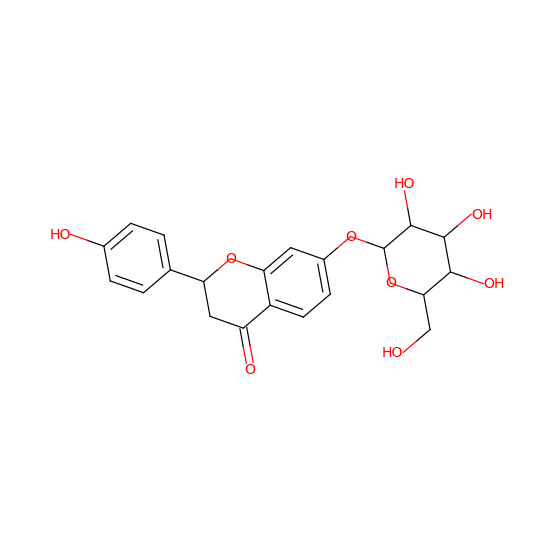

O=C1C2=CC=C(O)C=C2OC(C3=CC=C(OC4OC(CO)C(O)C(O)C4O)C=C3)C1


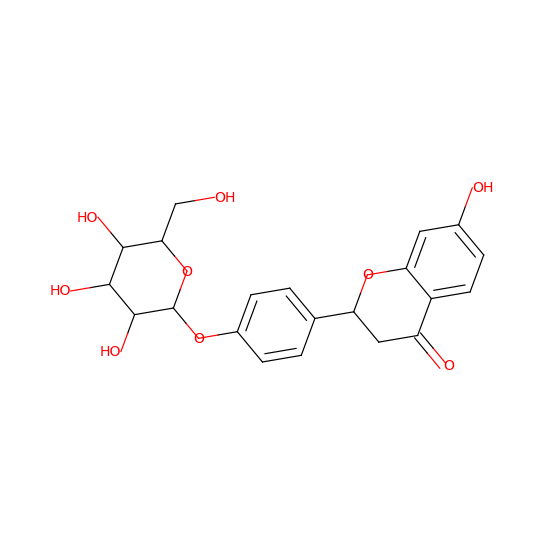

tanimoto: 0.9851337958374629
MS2Query: 0.737
O=C1C2=CC=C(OC3OC(CO)C(O)C(O)C3O)C=C2OC(C4=CC=C(O)C=C4)C1


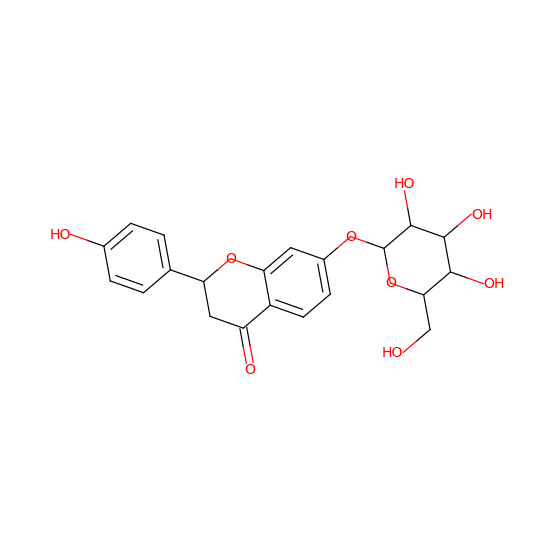

O=C1C2=CC=C(O)C=C2OC(C3=CC=C(OC4OC(CO)C(O)C(O)C4O)C=C3)C1


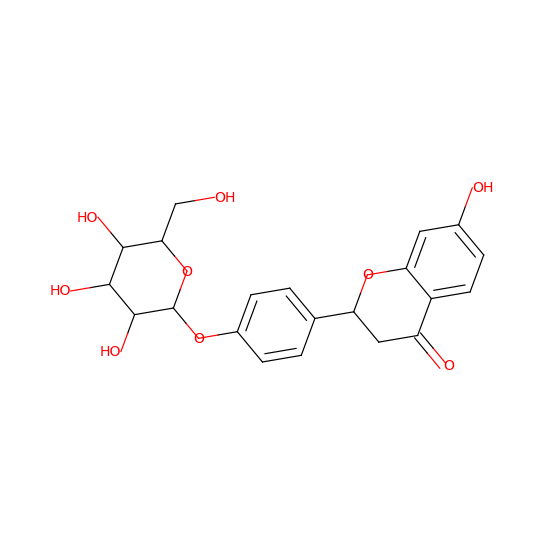

tanimoto: 0.9851337958374629
MS2Query: 0.737
O=C1C2=CC=C(OC3OC(CO)C(O)C(O)C3O)C=C2OC(C4=CC=C(O)C=C4)C1


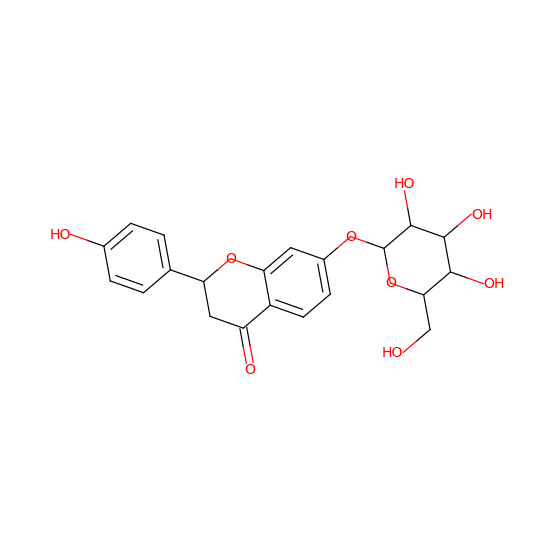

O=C1C2=CC=C(O)C=C2OC(C3=CC=C(OC4OC(CO)C(O)C(O)C4O)C=C3)C1


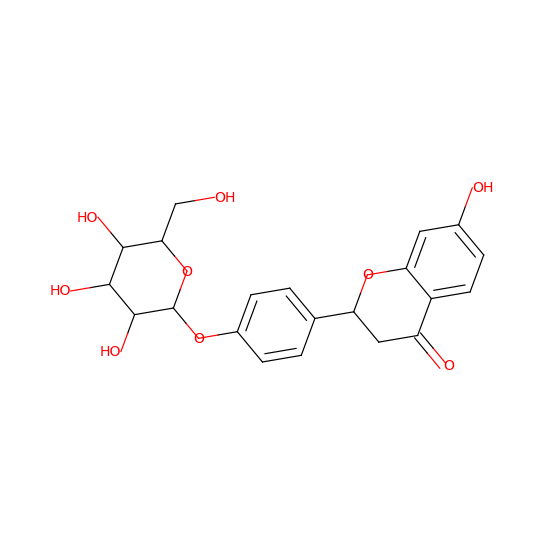

tanimoto: 0.9851337958374629
MS2Query: 0.737
O=C1C2=CC=C(OC3OC(CO)C(O)C(O)C3O)C=C2OC(C4=CC=C(O)C=C4)C1


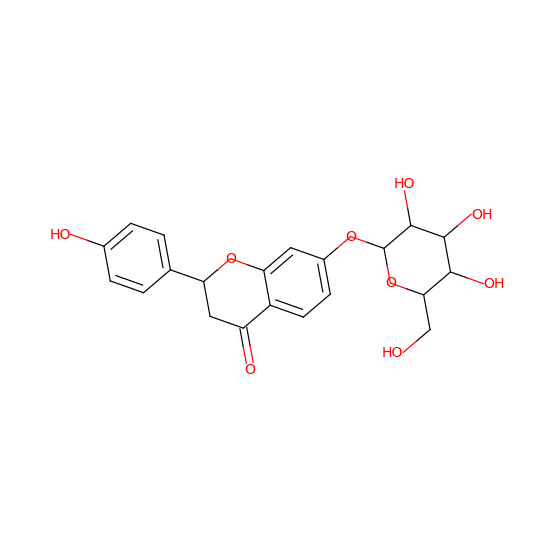

O=C1C2=CC=C(O)C=C2OC(C3=CC=C(OC4OC(CO)C(O)C(O)C4O)C=C3)C1


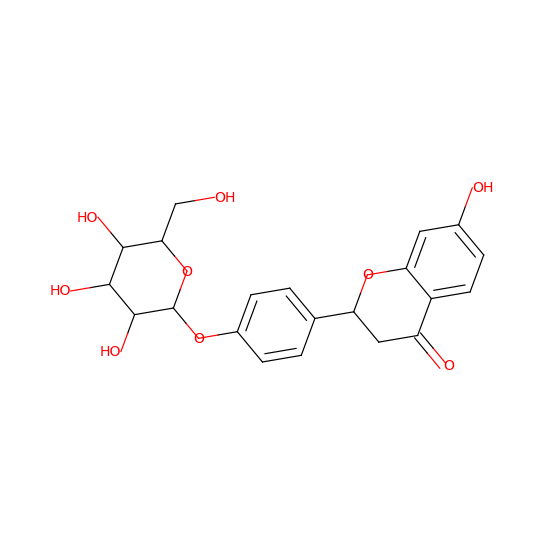

tanimoto: 0.9851337958374629
MS2Query: 0.737
O=C1C2=CC=C(OC3OC(CO)C(O)C(O)C3O)C=C2OC(C4=CC=C(O)C=C4)C1


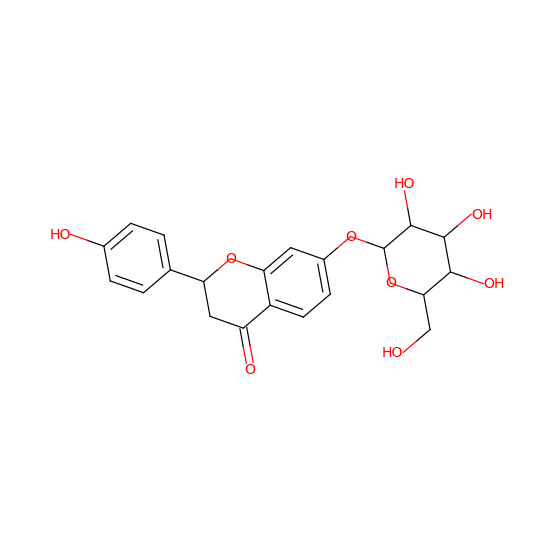

O=C1C2=CC=C(O)C=C2OC(C3=CC=C(OC4OC(CO)C(O)C(O)C4O)C=C3)C1


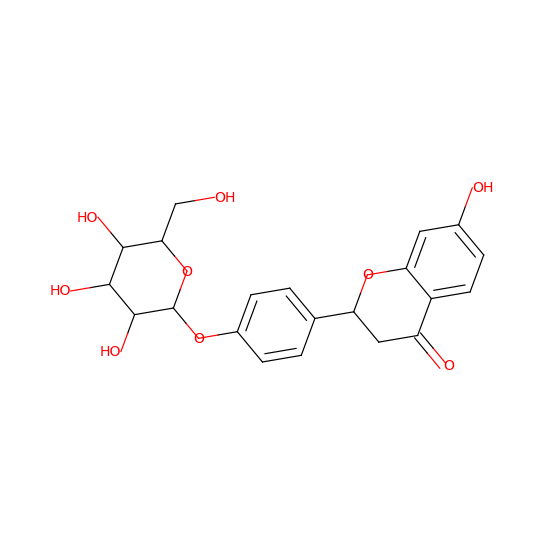

tanimoto: 0.977
MS2Query: 0.7379
O=C1C(=COC2=CC(OC3OC(CO)C(OC)C(O)C3O)=CC=C12)C=4C=CC(O)=CC4


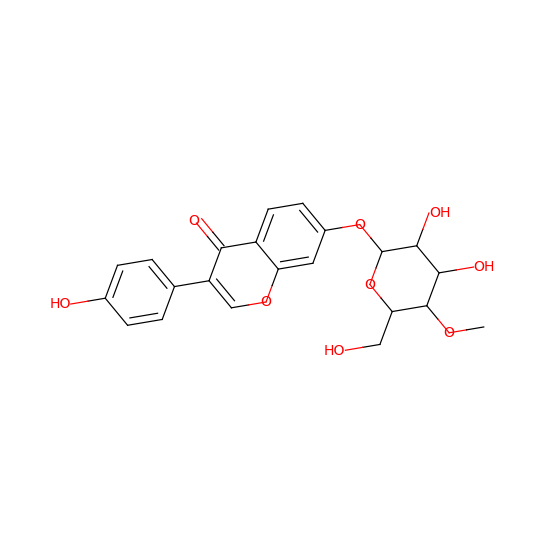

O=C1C(=COC2=CC(OC3OC(CO)C(O)C(O)C3O)=CC=C12)C=4C=CC(OC)=CC4


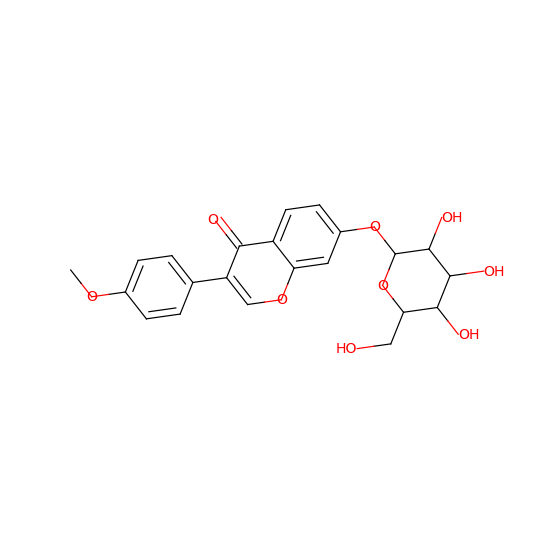

tanimoto: 0.977
MS2Query: 0.7419
O=C1C(=COC2=CC(OC3OC(CO)C(OC)C(O)C3O)=CC=C12)C=4C=CC(O)=CC4


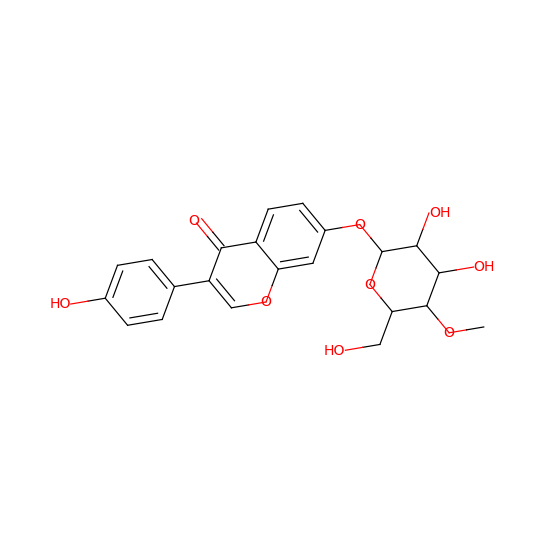

O=C1C(=COC2=CC(OC3OC(CO)C(O)C(O)C3O)=CC=C12)C=4C=CC(OC)=CC4


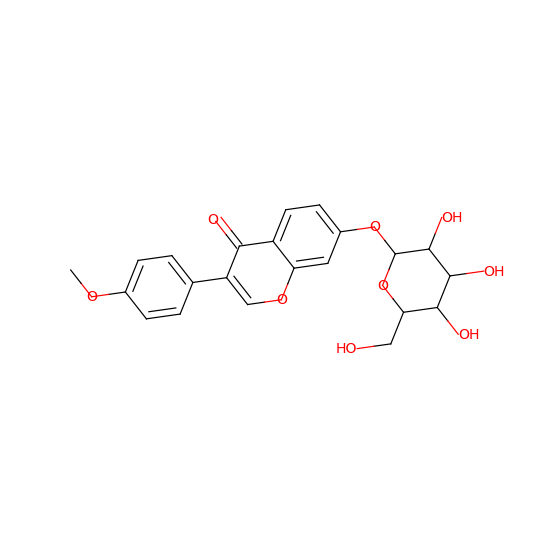

tanimoto: 0.977
MS2Query: 0.7419
O=C1C(=COC2=CC(OC3OC(CO)C(OC)C(O)C3O)=CC=C12)C=4C=CC(O)=CC4


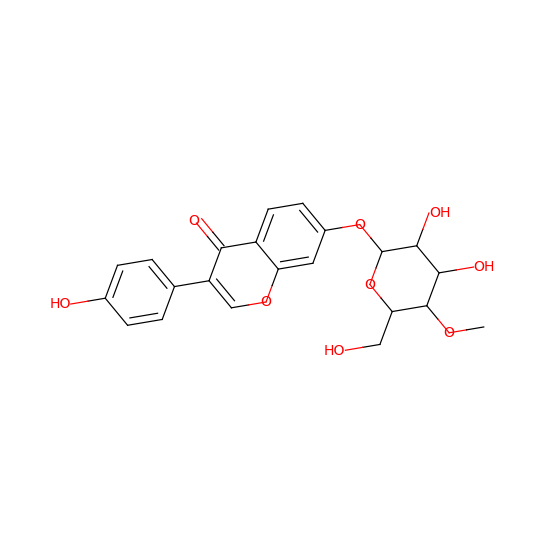

O=C1C(=COC2=CC(OC3OC(CO)C(O)C(O)C3O)=CC=C12)C=4C=CC(OC)=CC4


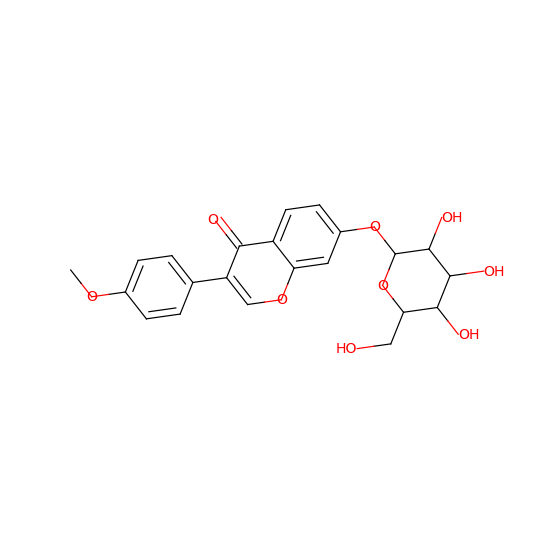

tanimoto: 0.9851337958374629
MS2Query: 0.7419
O=C1C2=CC=C(OC3OC(CO)C(O)C(O)C3O)C=C2OC(C4=CC=C(O)C=C4)C1


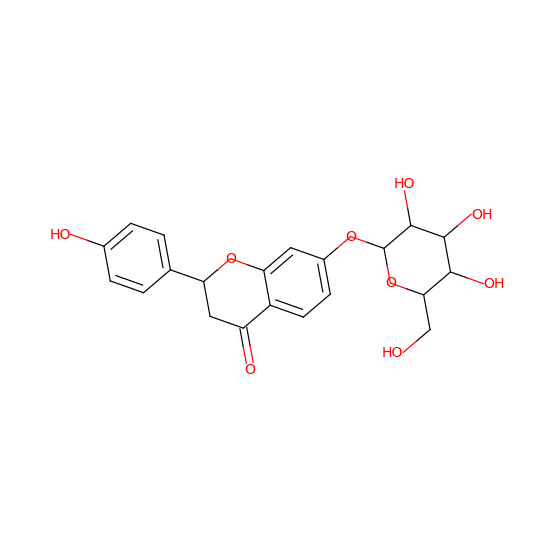

O=C1C2=CC=C(O)C=C2OC(C3=CC=C(OC4OC(CO)C(O)C(O)C4O)C=C3)C1


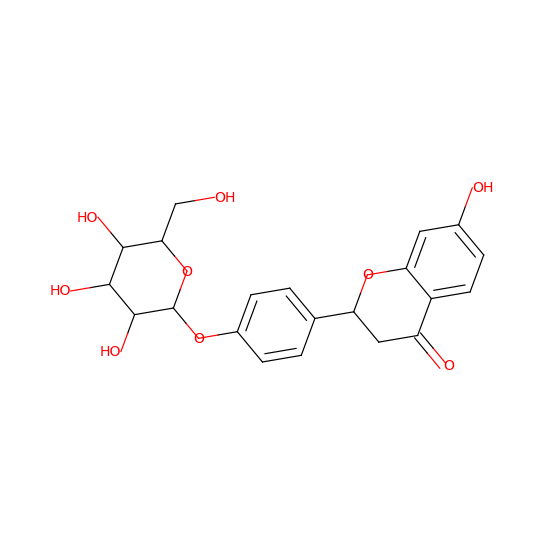

tanimoto: 0.977
MS2Query: 0.7419
O=C1C(=COC2=CC(OC3OC(CO)C(OC)C(O)C3O)=CC=C12)C=4C=CC(O)=CC4


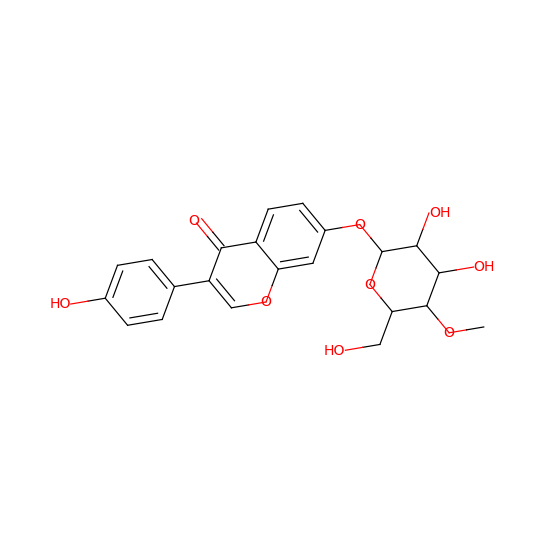

O=C1C(=COC2=CC(OC3OC(CO)C(O)C(O)C3O)=CC=C12)C=4C=CC(OC)=CC4


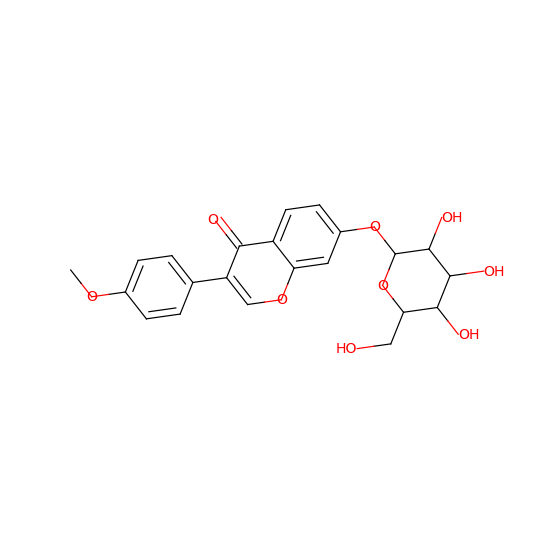

tanimoto: 0.977
MS2Query: 0.7418
O=C1C(=COC2=CC(OC3OC(CO)C(OC)C(O)C3O)=CC=C12)C=4C=CC(O)=CC4


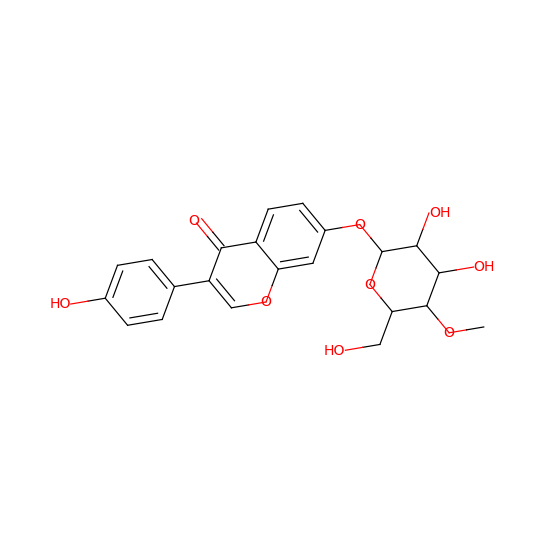

O=C1C(=COC2=CC(OC3OC(CO)C(O)C(O)C3O)=CC=C12)C=4C=CC(OC)=CC4


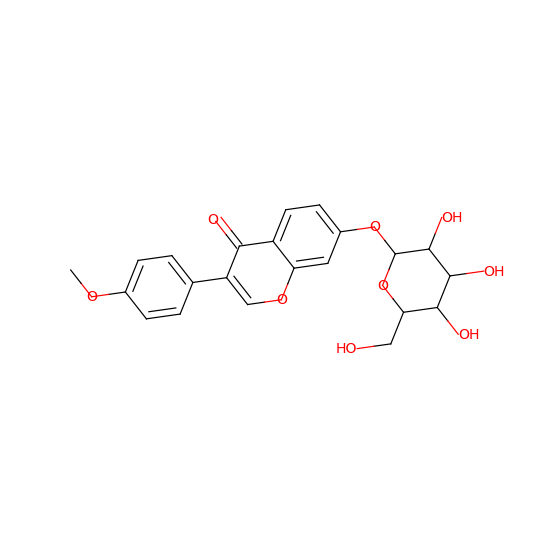

tanimoto: 0.977
MS2Query: 0.737
O=C1C(=COC2=CC(OC3OC(CO)C(OC)C(O)C3O)=CC=C12)C=4C=CC(O)=CC4


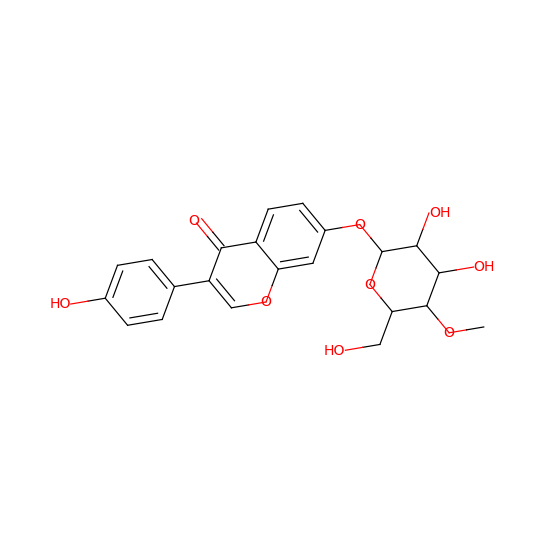

O=C1C(=COC2=CC(OC3OC(CO)C(O)C(O)C3O)=CC=C12)C=4C=CC(OC)=CC4


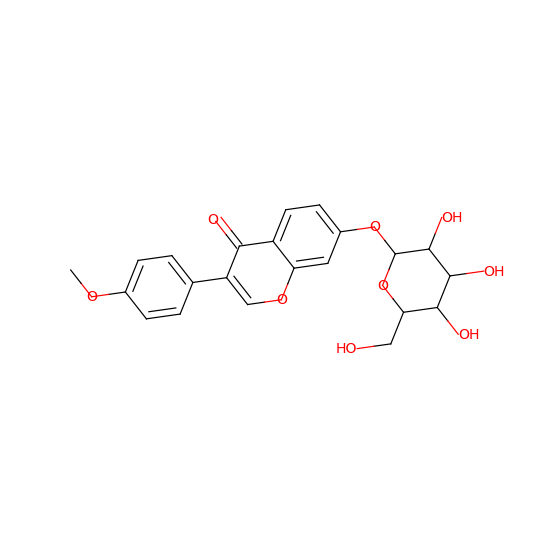

tanimoto: 0.977
MS2Query: 0.737
O=C1C(=COC2=CC(OC3OC(CO)C(OC)C(O)C3O)=CC=C12)C=4C=CC(O)=CC4


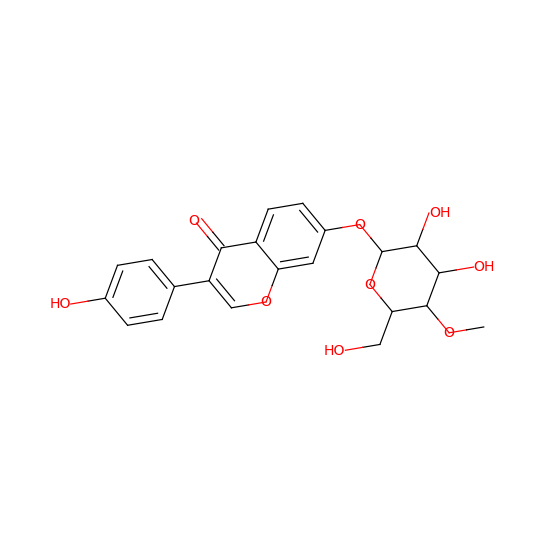

O=C1C(=COC2=CC(OC3OC(CO)C(O)C(O)C3O)=CC=C12)C=4C=CC(OC)=CC4


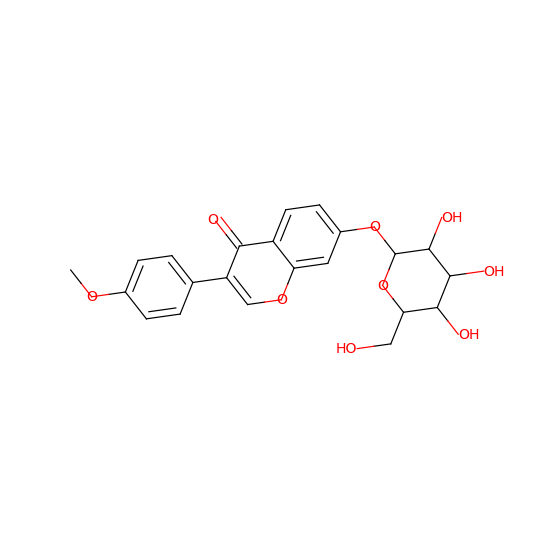

tanimoto: 0.9851337958374629
MS2Query: 0.737
O=C1C2=CC=C(OC3OC(CO)C(O)C(O)C3O)C=C2OC(C4=CC=C(O)C=C4)C1


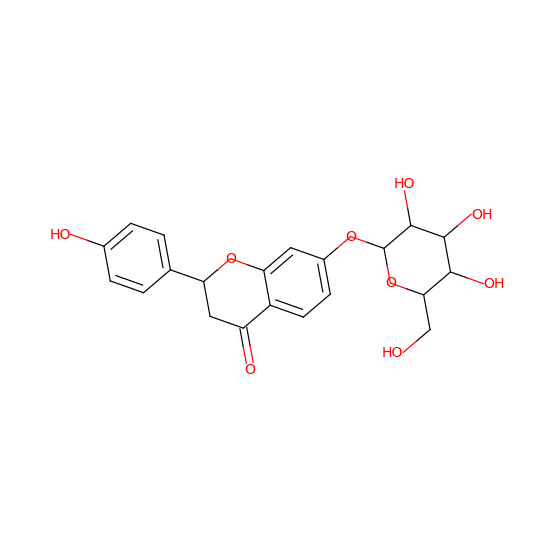

O=C1C2=CC=C(O)C=C2OC(C3=CC=C(OC4OC(CO)C(O)C(O)C4O)C=C3)C1


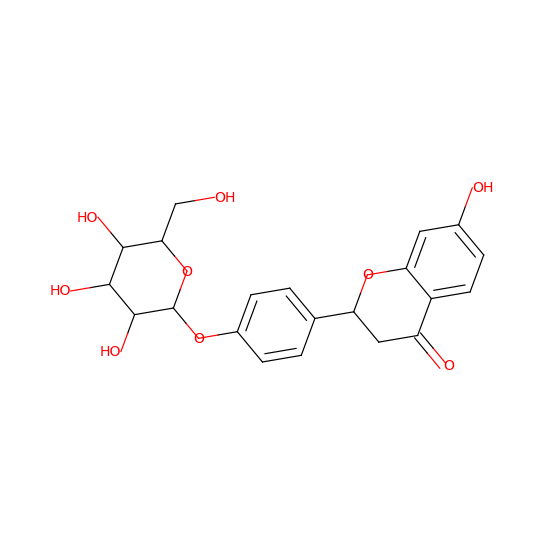

tanimoto: 0.9851337958374629
MS2Query: 0.7428
O=C1CC(c2ccc(O)cc2)Oc2cc(O[C@@H]3O[C@H](CO)[C@@H](O)[C@H](O)[C@H]3O)ccc21


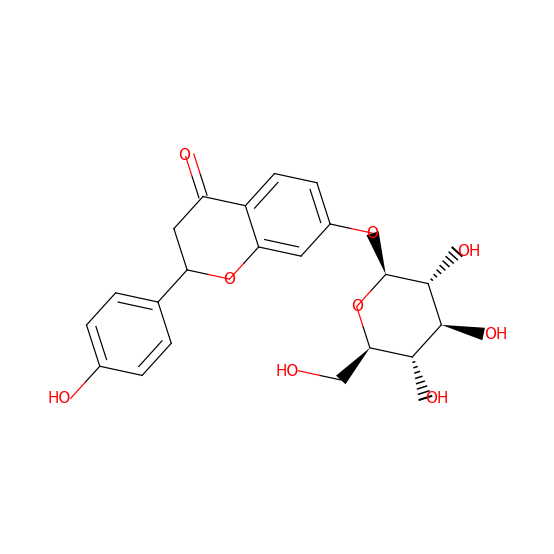

OC[C@H]1O[C@@H](OC2=CC=C(C=C2)[C@@H]2CC(=O)C3=C(O2)C=C(O)C=C3)[C@H](O)[C@@H](O)[C@@H]1O


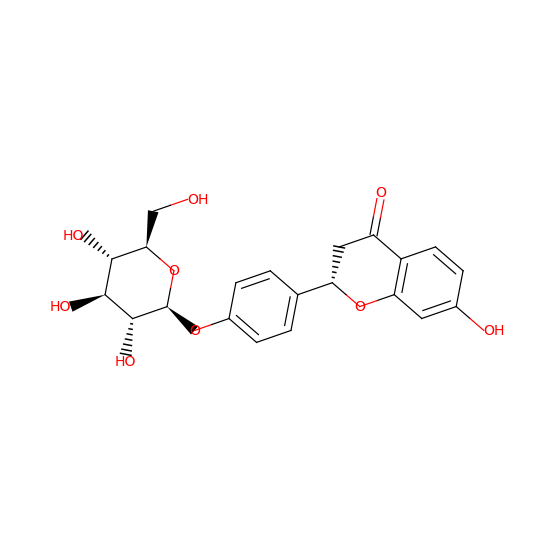

tanimoto: 0.9851337958374629
MS2Query: 0.7419
O=C1CC(c2ccc(O)cc2)Oc2cc(O[C@@H]3O[C@H](CO)[C@@H](O)[C@H](O)[C@H]3O)ccc21


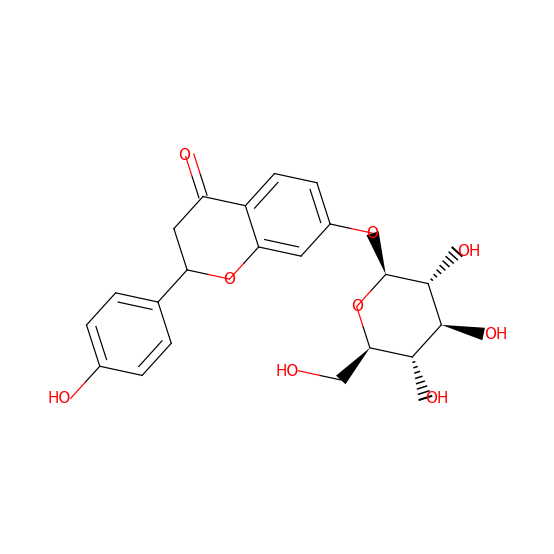

OC[C@H]1O[C@@H](OC2=CC=C(C=C2)[C@@H]2CC(=O)C3=C(O2)C=C(O)C=C3)[C@H](O)[C@@H](O)[C@@H]1O


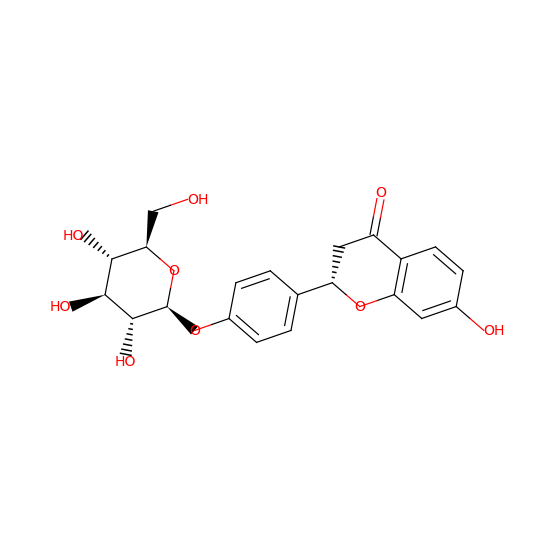

tanimoto: 0.977
MS2Query: 0.8029
O=C1C(=COC2=CC(OC3OC(CO)C(OC)C(O)C3O)=CC=C12)C=4C=CC(O)=CC4


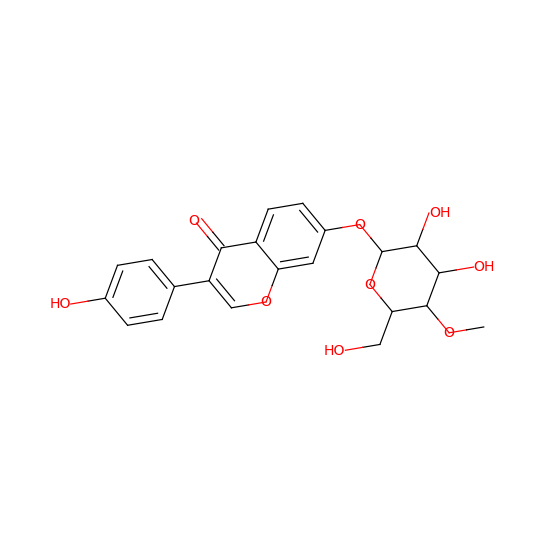

O=C2C(=COC3=CC(OC1OC(CO)C(O)C(O)C1(O))=CC=C23)C4=CC=C(OC)C=C4


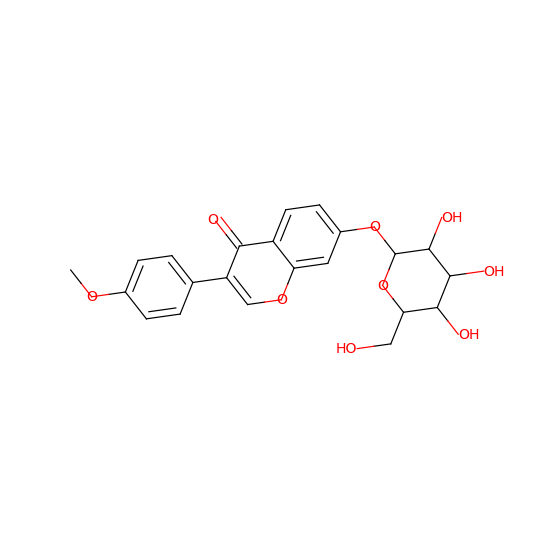

tanimoto: 0.9523809523809523
MS2Query: 0.8674
CC(=O)C1=C2C=CC=CC2=CC2=CC=CC=C12


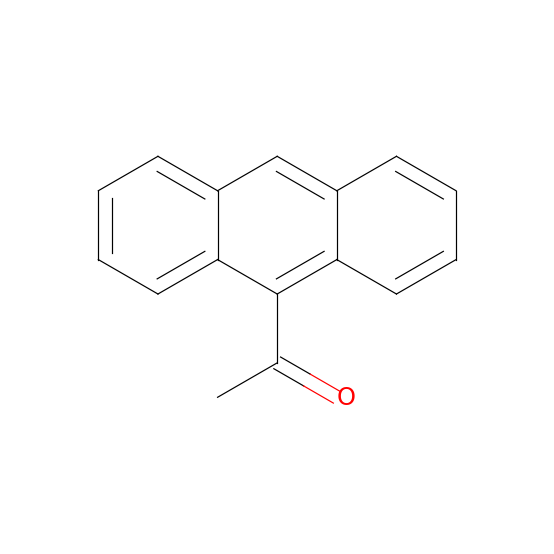

CC(=O)C1=CC2=CC=CC=C2C2=CC=CC=C12


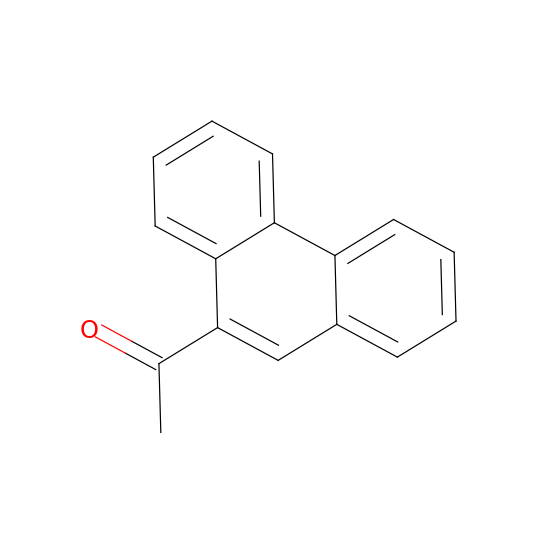

tanimoto: 0.9272844272844273
MS2Query: 0.9282
COC1=C(OC)C=C2C(OC[C@@H]3OC4=C(C=CC5=C4C[C@H](O5)C(C)=C)C(=O)[C@]23O)=C1


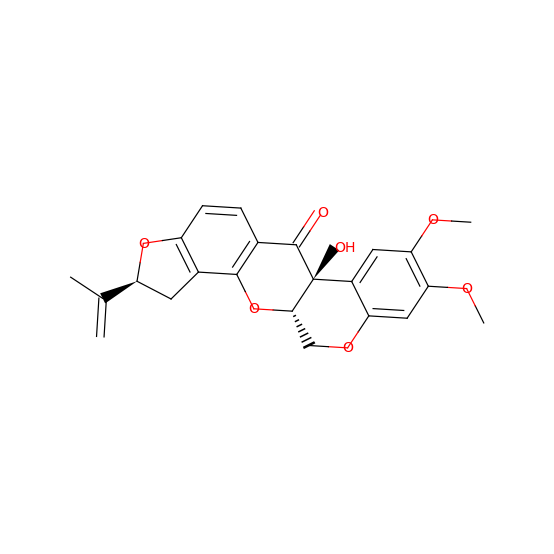

COc1cc2c(cc1OC)[C@]1(O)C(=O)c3ccc4c(c3O[C@@H]1CO2)C=CC(C)(C)O4


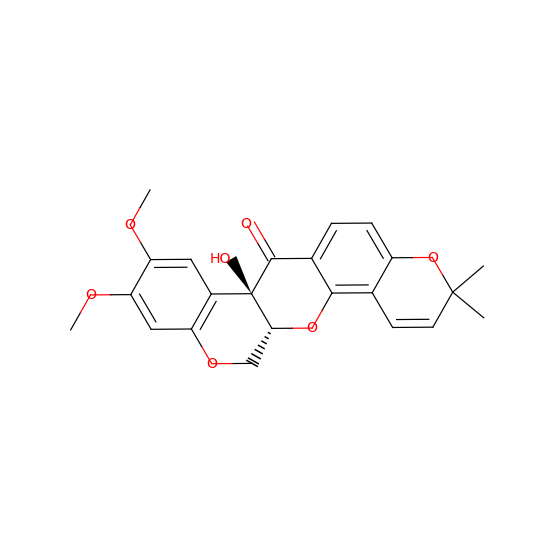

tanimoto: 0.9246134020618557
MS2Query: 0.9279
COC1=CC=C2C(=O)[C@@]3(O)[C@@H](COC4=C3C=C5OCOC5=C4)OC2=C1CC=C(C)C


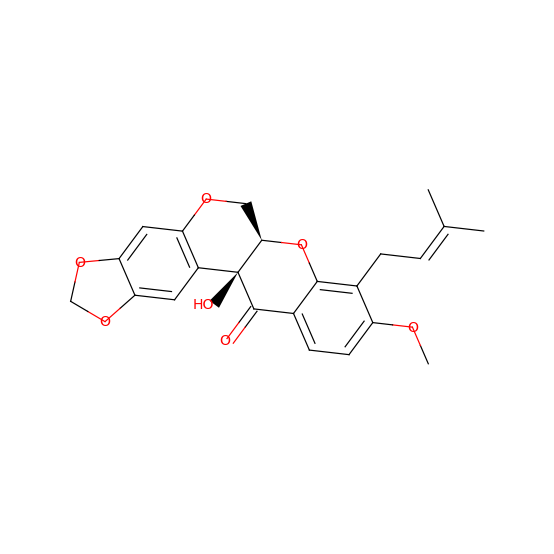

COc1cc2c(cc1OC)[C@]1(O)C(=O)c3ccc4c(c3O[C@@H]1CO2)C=CC(C)(C)O4


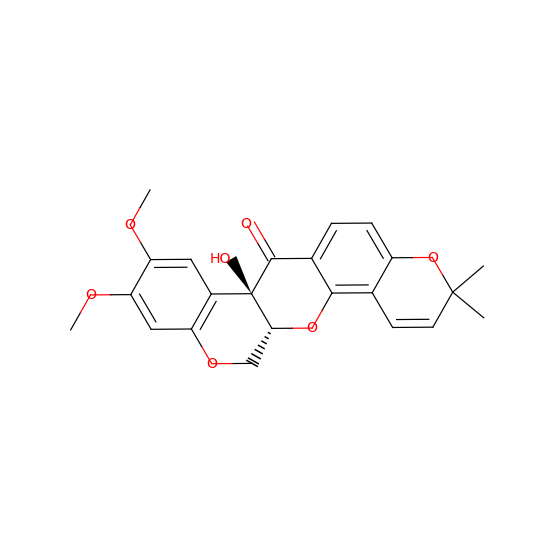

tanimoto: 0.9594985535197685
MS2Query: 0.9401
COc1cc2oc(=O)ccc2cc1C(O)C(OC(=O)C=C(C)C)C(C)(C)O


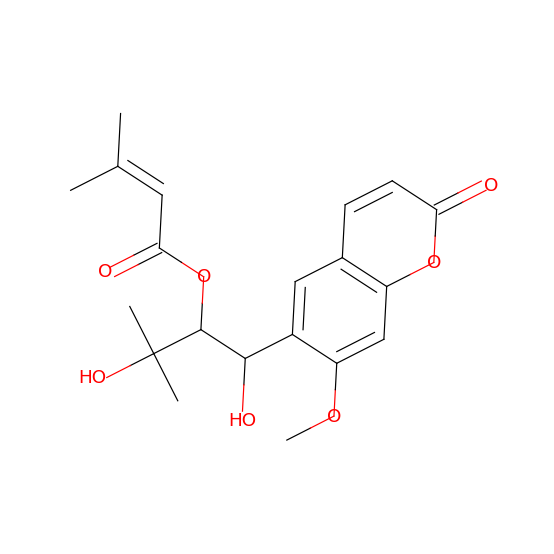

C/C=C(\C)C(=O)OC(C(O)c1cc2ccc(=O)oc2cc1OC)C(C)(C)O


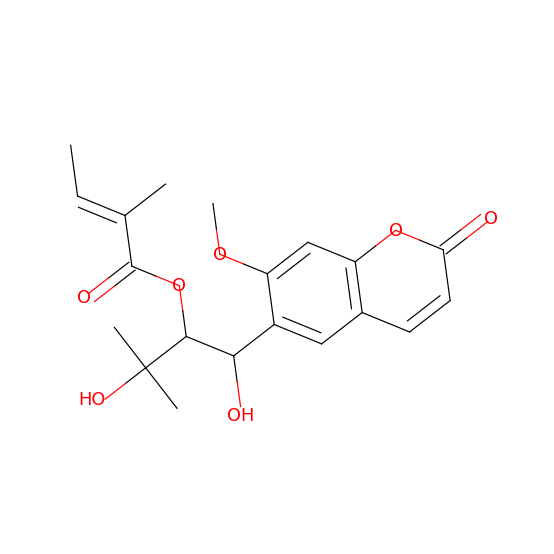

tanimoto: 0.9594985535197685
MS2Query: 0.9401
COc1cc2oc(=O)ccc2cc1C(O)C(OC(=O)C=C(C)C)C(C)(C)O


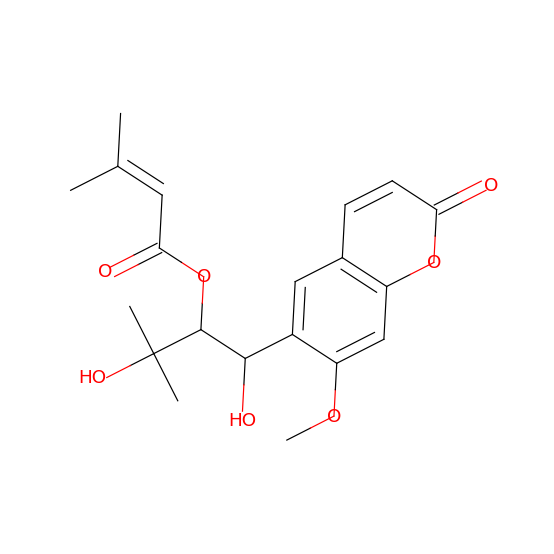

C/C=C(\C)C(=O)OC(C(O)c1cc2ccc(=O)oc2cc1OC)C(C)(C)O


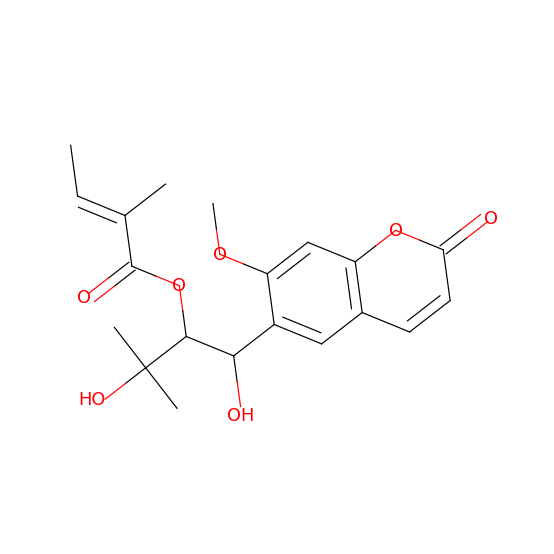

tanimoto: 0.9594985535197685
MS2Query: 0.9379
COc1cc2oc(=O)ccc2cc1C(O)C(OC(=O)C=C(C)C)C(C)(C)O


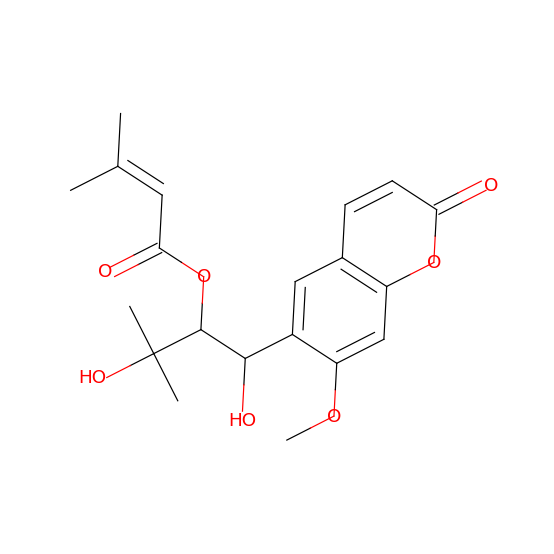

C/C=C(\C)C(=O)OC(C(O)c1cc2ccc(=O)oc2cc1OC)C(C)(C)O


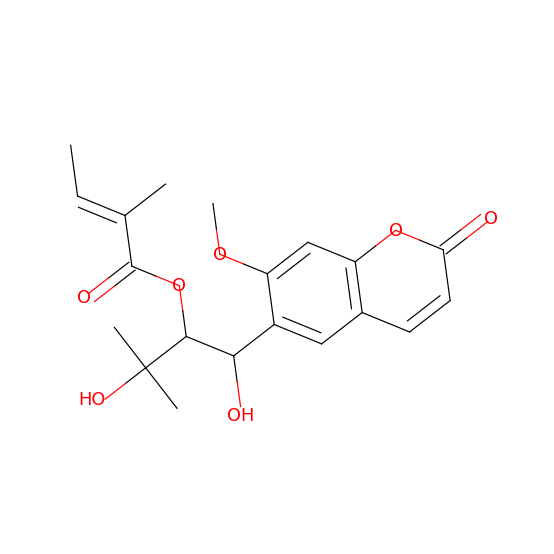

tanimoto: 0.9594985535197685
MS2Query: 0.9388
COc1cc2oc(=O)ccc2cc1C(O)C(OC(=O)C=C(C)C)C(C)(C)O


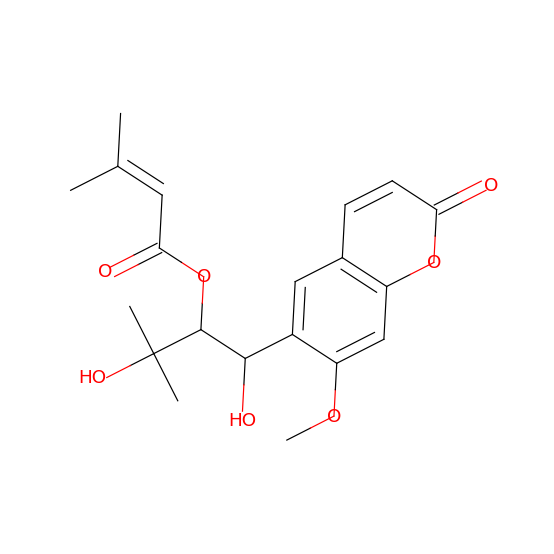

C/C=C(\C)C(=O)OC(C(O)c1cc2ccc(=O)oc2cc1OC)C(C)(C)O


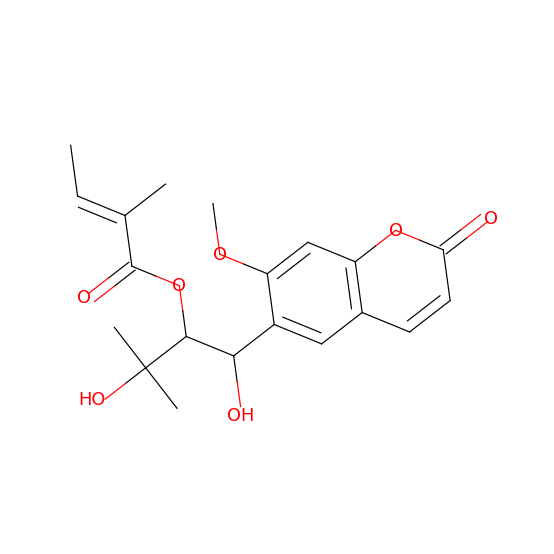

tanimoto: 0.9594985535197685
MS2Query: 0.9388
COc1cc2oc(=O)ccc2cc1C(O)C(OC(=O)C=C(C)C)C(C)(C)O


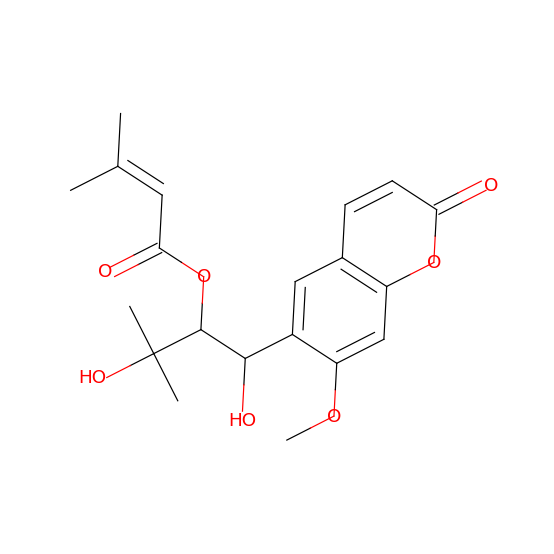

C/C=C(\C)C(=O)OC(C(O)c1cc2ccc(=O)oc2cc1OC)C(C)(C)O


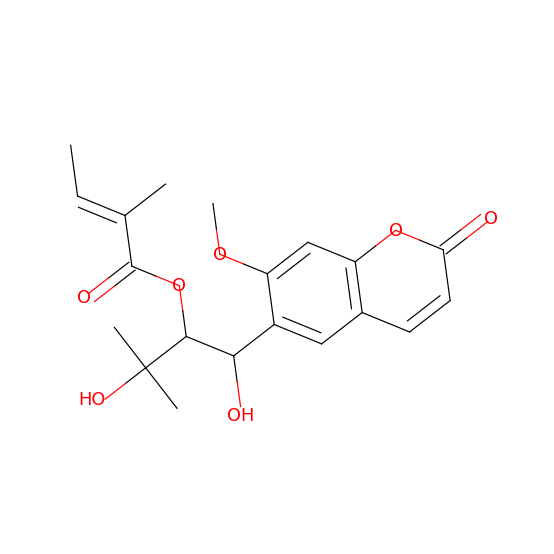

tanimoto: 0.9594985535197685
MS2Query: 0.927
COc1cc2oc(=O)ccc2cc1C(O)C(OC(=O)C=C(C)C)C(C)(C)O


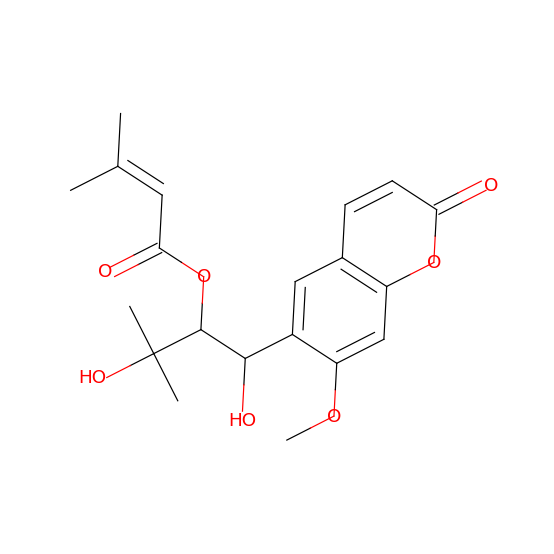

C/C=C(\C)C(=O)OC(C(O)c1cc2ccc(=O)oc2cc1OC)C(C)(C)O


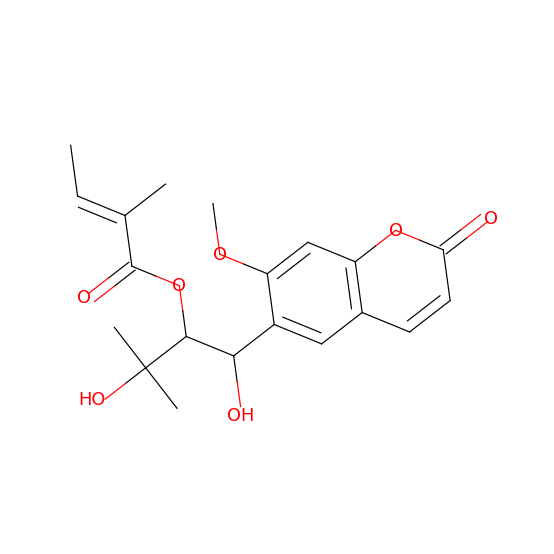

tanimoto: 0.9594985535197685
MS2Query: 0.927
COc1cc2oc(=O)ccc2cc1C(O)C(OC(=O)C=C(C)C)C(C)(C)O


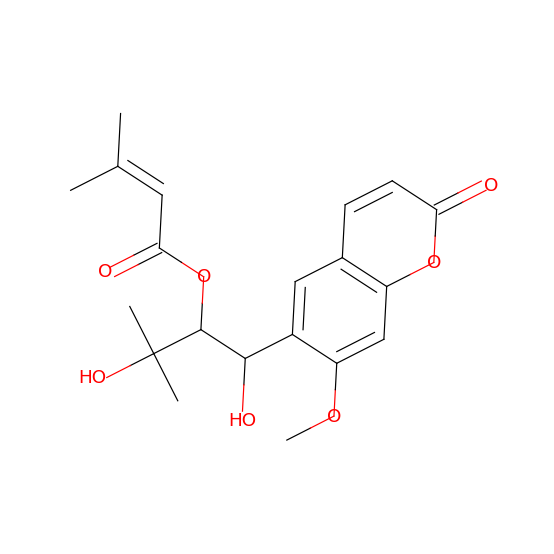

C/C=C(\C)C(=O)OC(C(O)c1cc2ccc(=O)oc2cc1OC)C(C)(C)O


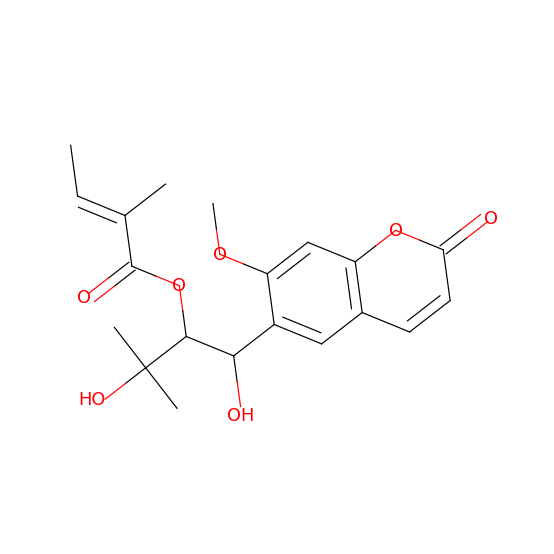

tanimoto: 0.9594985535197685
MS2Query: 0.927
COc1cc2oc(=O)ccc2cc1C(O)C(OC(=O)C=C(C)C)C(C)(C)O


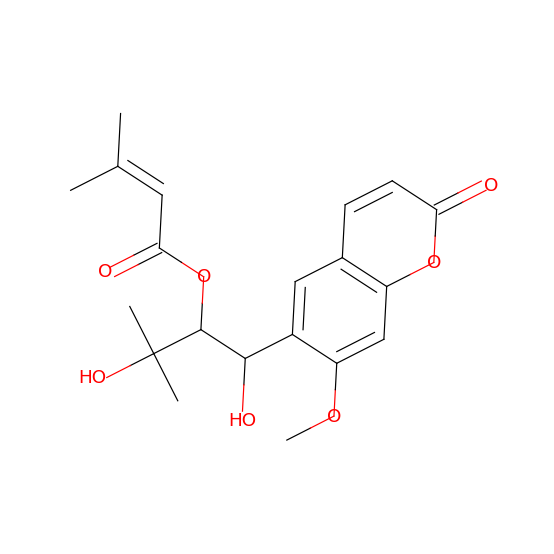

C/C=C(\C)C(=O)OC(C(O)c1cc2ccc(=O)oc2cc1OC)C(C)(C)O


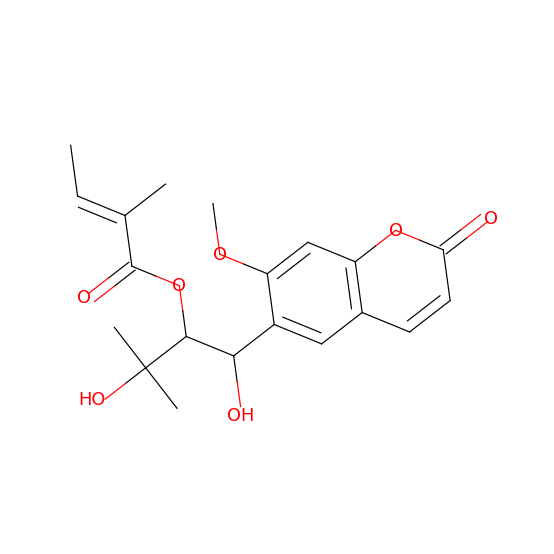

tanimoto: 0.9938962360122076
MS2Query: 0.7823
CC(=O)O[C@H]1[C@H](C)O[C@@H](O[C@@H]2[C@@H]3O[C@]3(CO)[C@H]3[C@H](O[C@@H]4O[C@H](CO)[C@@H](O)[C@H](O)[C@H]4O)OC=C[C@@H]23)[C@H](OC(=O)/C=C/c2ccccc2)[C@@H]1OC(C)=O


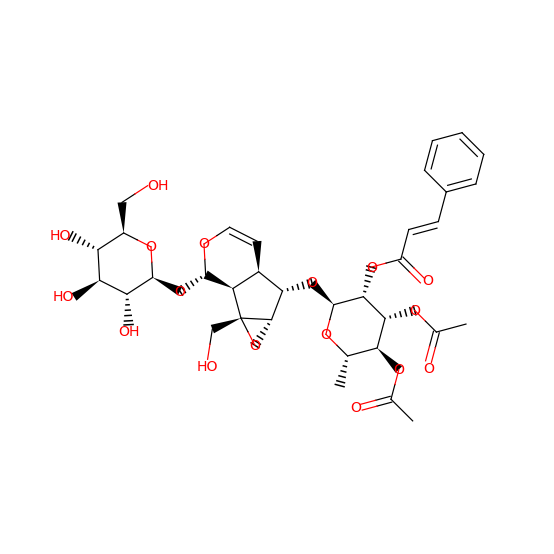

C[C@@H]1O[C@@H](O[C@@H]2[C@@H]3O[C@]3(CO)[C@H]3[C@H](O[C@@H]4O[C@H](CO)[C@@H](O)[C@H](O)[C@H]4O)OC=C[C@@H]23)[C@H](OC(=O)/C=C/c2ccccc2)[C@H](O)[C@H]1O


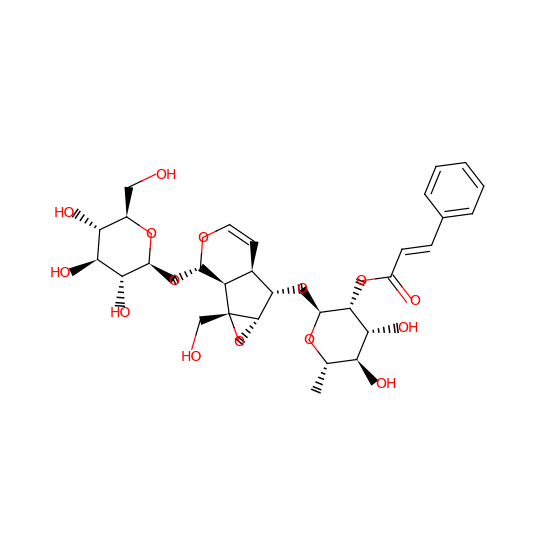

tanimoto: 0.9938962360122076
MS2Query: 0.7823
CC(=O)O[C@H]1[C@H](O[C@@H]2[C@@H]3O[C@]3(CO)[C@H]3[C@H](O[C@@H]4O[C@H](CO)[C@@H](O)[C@H](O)[C@H]4O)OC=C[C@@H]23)O[C@@H](C)[C@H](OC(=O)/C=C/c2ccccc2)[C@H]1OC(C)=O


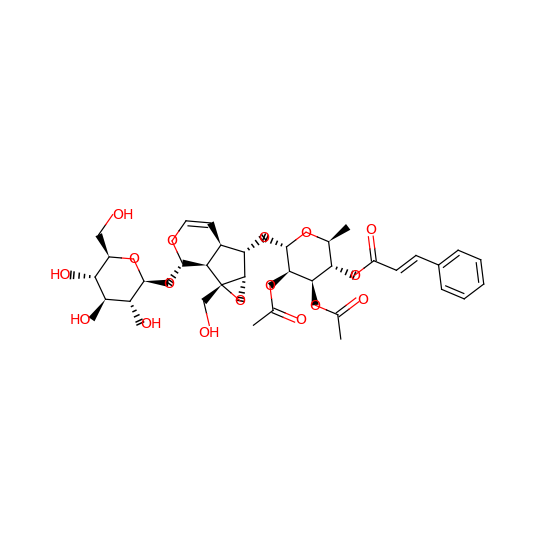

C[C@@H]1O[C@@H](O[C@@H]2[C@@H]3O[C@]3(CO)[C@H]3[C@H](O[C@@H]4O[C@H](CO)[C@@H](O)[C@H](O)[C@H]4O)OC=C[C@@H]23)[C@H](OC(=O)/C=C/c2ccccc2)[C@H](O)[C@H]1O


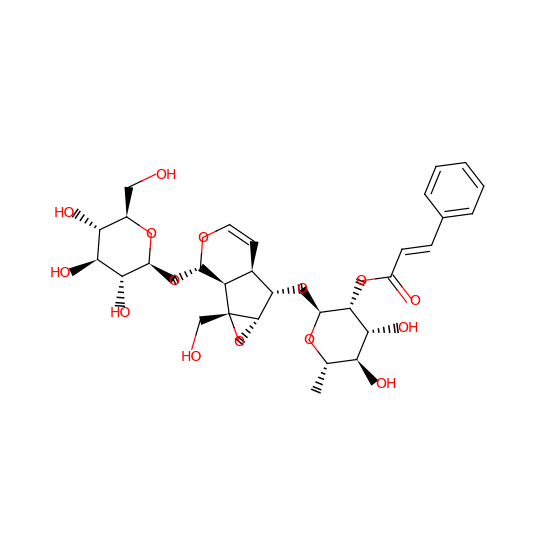

tanimoto: 0.9938962360122076
MS2Query: 0.7823
CC(=O)O[C@H]1[C@H](O[C@@H]2[C@@H]3O[C@]3(CO)[C@H]3[C@H](O[C@@H]4O[C@H](CO)[C@@H](O)[C@H](O)[C@H]4O)OC=C[C@@H]23)O[C@@H](C)[C@H](OC(=O)/C=C/c2ccccc2)[C@H]1OC(C)=O


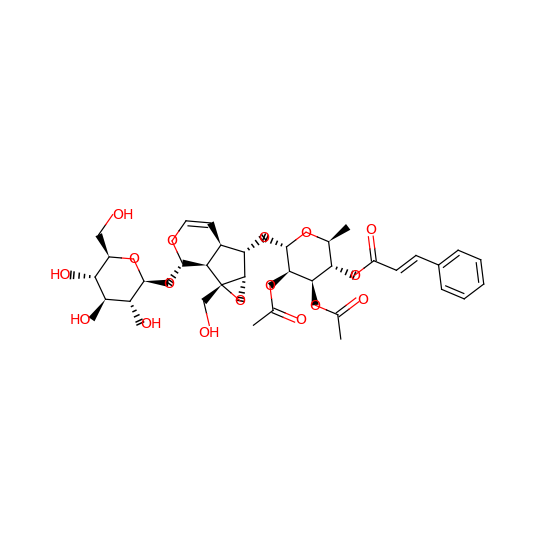

C[C@@H]1O[C@@H](O[C@@H]2[C@@H]3O[C@]3(CO)[C@H]3[C@H](O[C@@H]4O[C@H](CO)[C@@H](O)[C@H](O)[C@H]4O)OC=C[C@@H]23)[C@H](OC(=O)/C=C/c2ccccc2)[C@H](O)[C@H]1O


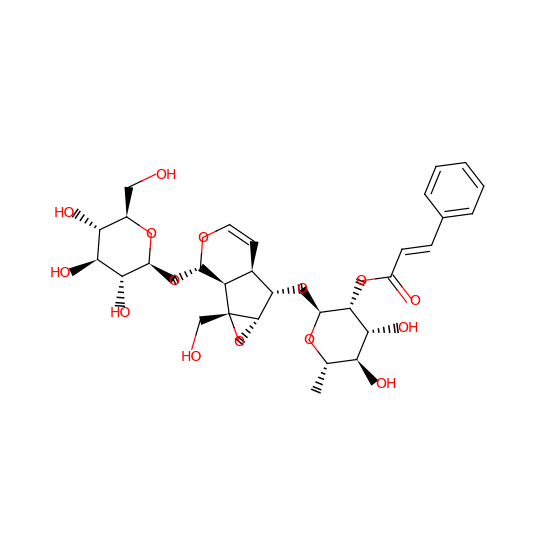

tanimoto: 0.9781491002570694
MS2Query: 0.9321
C[C@@H]1O[C@@H](O[C@@H]2[C@@H](O)[C@H](OCCc3ccc(O)c(O)c3)O[C@H](CO)[C@H]2OC(=O)/C=C/c2ccc(O)c(O)c2)[C@H](O[C@@H]2O[C@H](CO)[C@@H](O)[C@H](O)[C@H]2O)[C@H](O)[C@H]1O


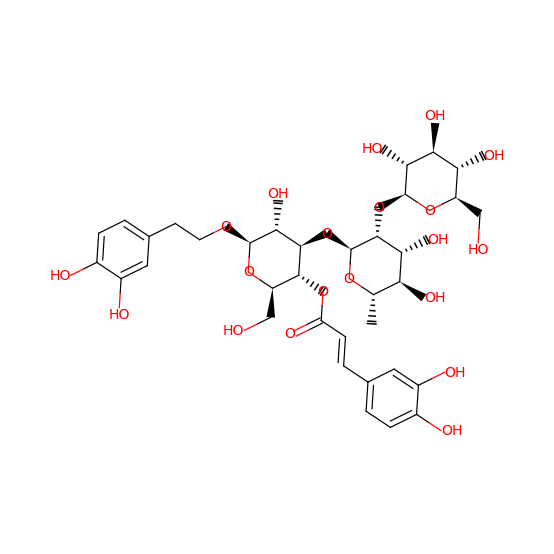

C[C@@H]1O[C@@H](O[C@@H]2[C@@H](O)[C@H](OCCc3ccc(O)c(O)c3)O[C@H](CO[C@@H]3O[C@H](CO)[C@@H](O)[C@H](O)[C@H]3O)[C@H]2OC(=O)/C=C/c2ccc(O)c(O)c2)[C@H](O)[C@H](O)[C@H]1O


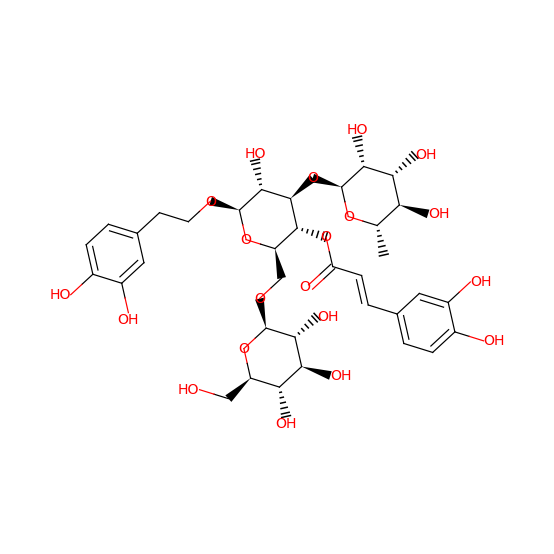

tanimoto: 0.9781491002570694
MS2Query: 0.9321
C[C@@H]1O[C@@H](O[C@@H]2[C@@H](O)[C@H](OCCc3ccc(O)c(O)c3)O[C@H](CO)[C@H]2OC(=O)/C=C/c2ccc(O)c(O)c2)[C@H](O[C@@H]2O[C@H](CO)[C@@H](O)[C@H](O)[C@H]2O)[C@H](O)[C@H]1O


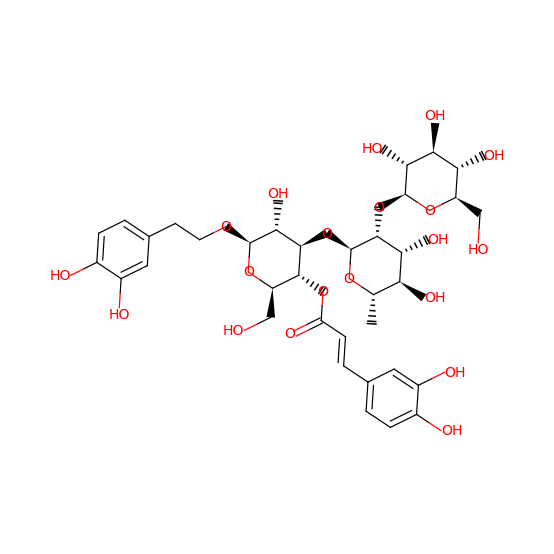

C[C@@H]1O[C@@H](O[C@@H]2[C@@H](O)[C@H](OCCc3ccc(O)c(O)c3)O[C@H](CO[C@@H]3O[C@H](CO)[C@@H](O)[C@H](O)[C@H]3O)[C@H]2OC(=O)/C=C/c2ccc(O)c(O)c2)[C@H](O)[C@H](O)[C@H]1O


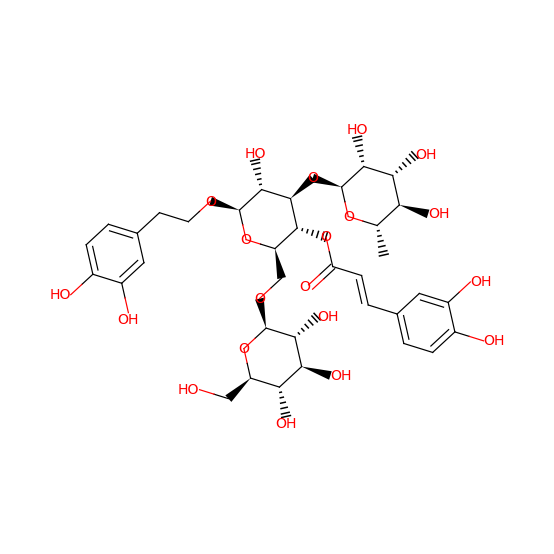

tanimoto: 0.9781491002570694
MS2Query: 0.9321
C[C@@H]1O[C@@H](O[C@@H]2[C@@H](O)[C@H](OCCc3ccc(O)c(O)c3)O[C@H](CO)[C@H]2OC(=O)/C=C/c2ccc(O)c(O)c2)[C@H](O[C@@H]2O[C@H](CO)[C@@H](O)[C@H](O)[C@H]2O)[C@H](O)[C@H]1O


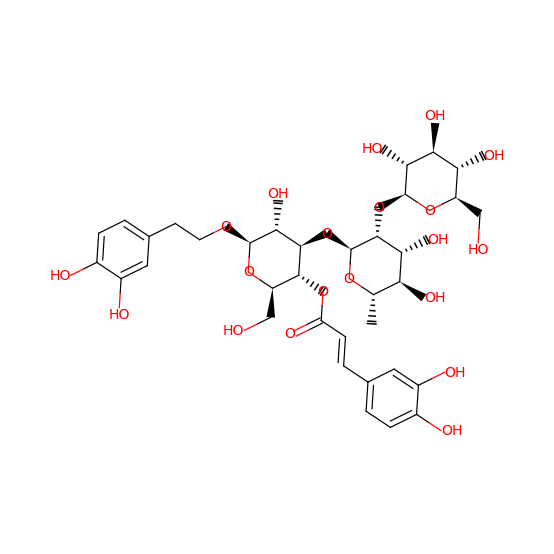

C[C@@H]1O[C@@H](O[C@@H]2[C@@H](O)[C@H](OCCc3ccc(O)c(O)c3)O[C@H](CO[C@@H]3O[C@H](CO)[C@@H](O)[C@H](O)[C@H]3O)[C@H]2OC(=O)/C=C/c2ccc(O)c(O)c2)[C@H](O)[C@H](O)[C@H]1O


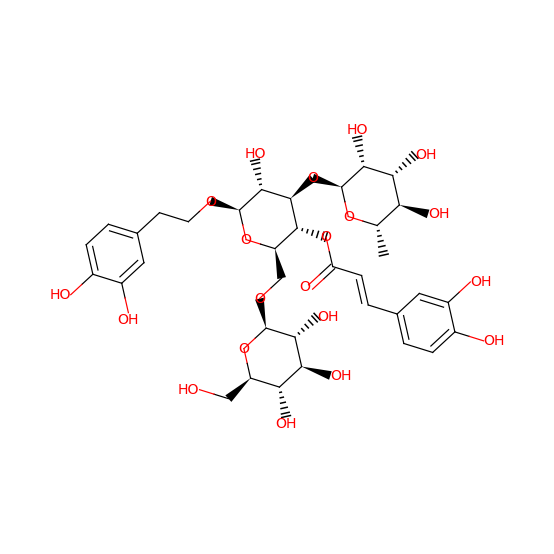

tanimoto: 0.9781491002570694
MS2Query: 0.9321
C[C@@H]1O[C@@H](O[C@@H]2[C@@H](O)[C@H](OCCc3ccc(O)c(O)c3)O[C@H](CO)[C@H]2OC(=O)/C=C/c2ccc(O)c(O)c2)[C@H](O[C@@H]2O[C@H](CO)[C@@H](O)[C@H](O)[C@H]2O)[C@H](O)[C@H]1O


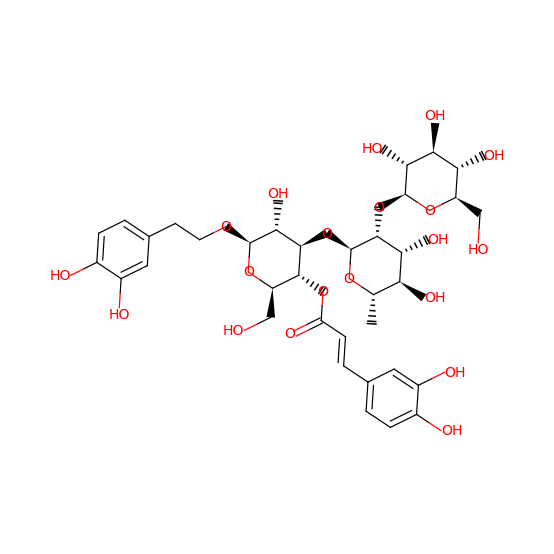

C[C@@H]1O[C@@H](O[C@@H]2[C@@H](O)[C@H](OCCc3ccc(O)c(O)c3)O[C@H](CO[C@@H]3O[C@H](CO)[C@@H](O)[C@H](O)[C@H]3O)[C@H]2OC(=O)/C=C/c2ccc(O)c(O)c2)[C@H](O)[C@H](O)[C@H]1O


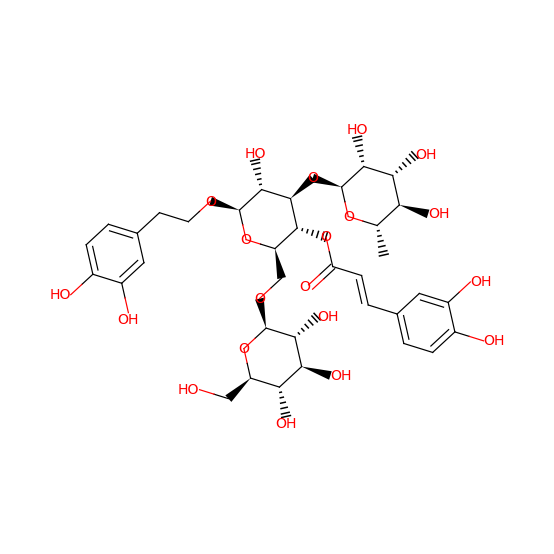

tanimoto: 0.9781491002570694
MS2Query: 0.9321
C[C@@H]1O[C@@H](O[C@@H]2[C@@H](O)[C@H](OCCc3ccc(O)c(O)c3)O[C@H](CO)[C@H]2OC(=O)/C=C/c2ccc(O)c(O)c2)[C@H](O[C@@H]2O[C@H](CO)[C@@H](O)[C@H](O)[C@H]2O)[C@H](O)[C@H]1O


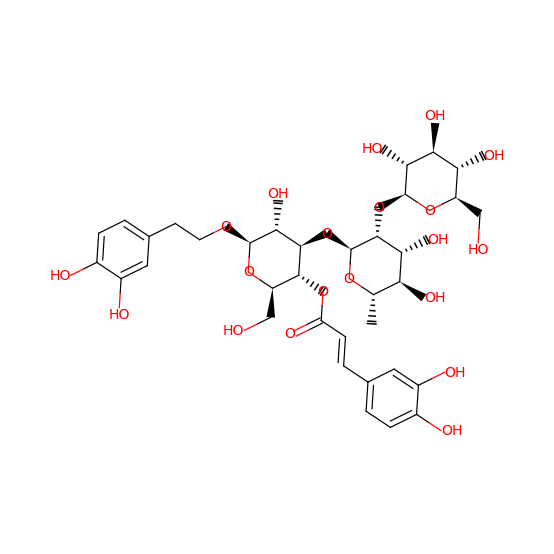

C[C@@H]1O[C@@H](O[C@@H]2[C@@H](O)[C@H](OCCc3ccc(O)c(O)c3)O[C@H](CO[C@@H]3O[C@H](CO)[C@@H](O)[C@H](O)[C@H]3O)[C@H]2OC(=O)/C=C/c2ccc(O)c(O)c2)[C@H](O)[C@H](O)[C@H]1O


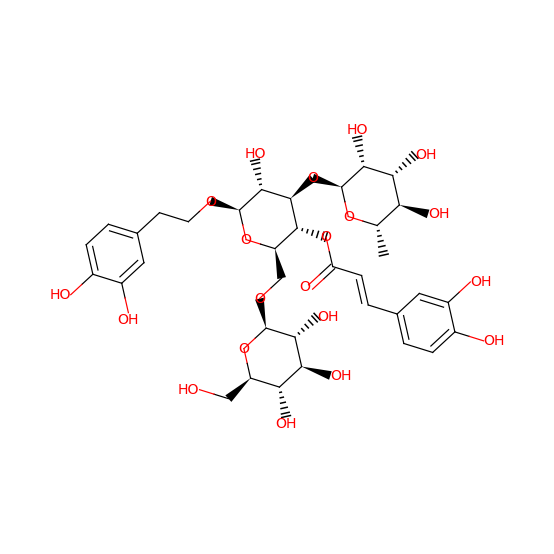

tanimoto: 0.9781491002570694
MS2Query: 0.9321
C[C@@H]1O[C@@H](O[C@@H]2[C@@H](O)[C@H](OCCc3ccc(O)c(O)c3)O[C@H](CO)[C@H]2OC(=O)/C=C/c2ccc(O)c(O)c2)[C@H](O[C@@H]2O[C@H](CO)[C@@H](O)[C@H](O)[C@H]2O)[C@H](O)[C@H]1O


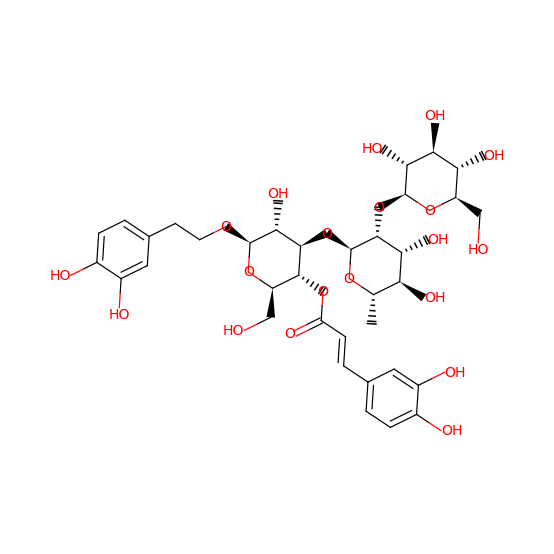

C[C@@H]1O[C@@H](O[C@@H]2[C@@H](O)[C@H](OCCc3ccc(O)c(O)c3)O[C@H](CO[C@@H]3O[C@H](CO)[C@@H](O)[C@H](O)[C@H]3O)[C@H]2OC(=O)/C=C/c2ccc(O)c(O)c2)[C@H](O)[C@H](O)[C@H]1O


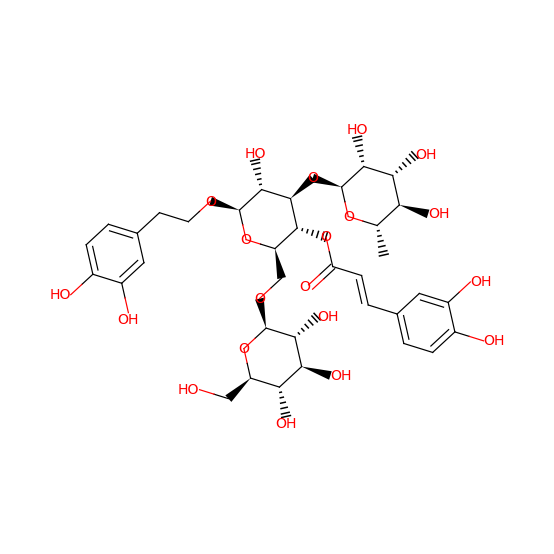

tanimoto: 0.9390977443609022
MS2Query: 0.9008
C[C@@H]1O[C@@H](OC[C@H]2O[C@@H](Oc3c(-c4ccc(O)cc4)oc4cc(O)cc(O)c4c3=O)[C@H](O)[C@@H](O)[C@H]2O)[C@H](O)[C@H](O[C@@H]2O[C@@H](C)[C@H](O)[C@@H](O)[C@H]2O)[C@H]1O


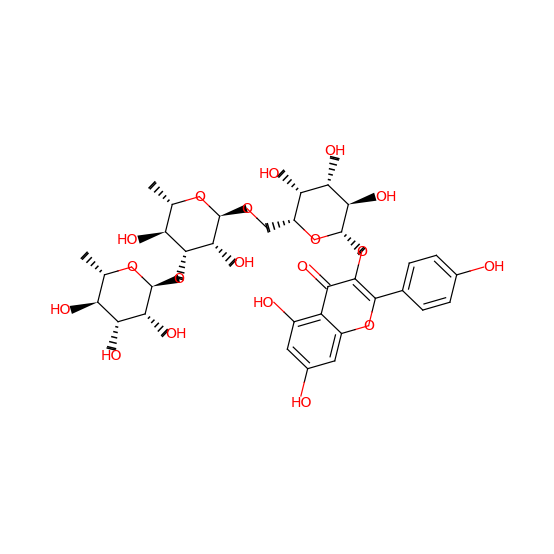

CC1OC(Oc2cc(O)c3c(=O)c(OC4OCC(O)C(O)C4O)c(-c4ccc(O)cc4)oc3c2)C(O)C(O)C1O


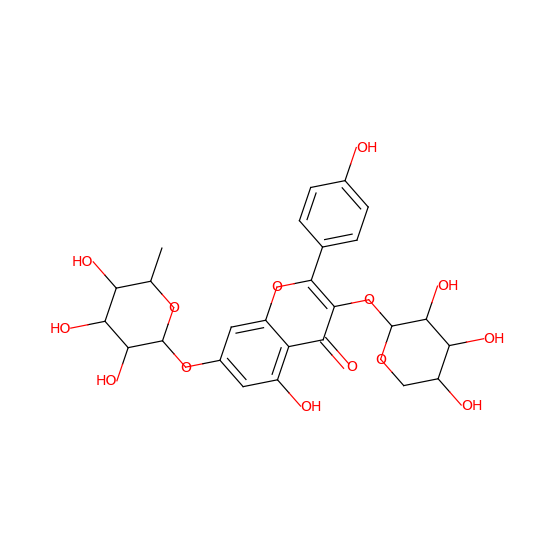

tanimoto: 0.9390977443609022
MS2Query: 0.8745
C[C@@H]1O[C@@H](O[C@@H]2[C@@H](O)[C@H](C)O[C@@H](OC[C@H]3O[C@@H](OC4=C(OC5=CC(O)=CC(O)=C5C4=O)C4=CC=C(O)C=C4)[C@H](O)[C@@H](O)[C@H]3O)[C@@H]2O)[C@H](O)[C@H](O)[C@H]1O


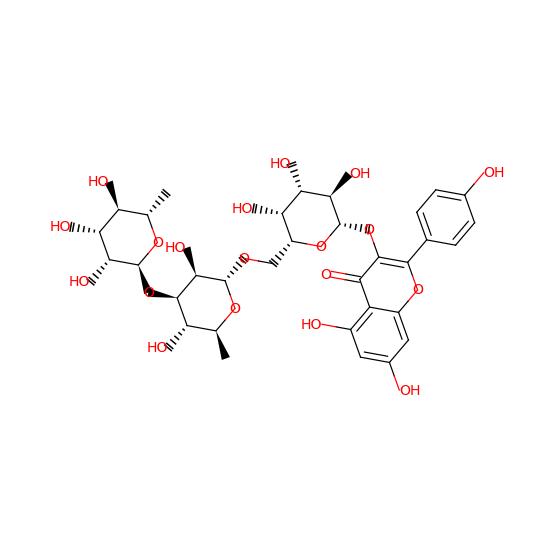

CC1OC(Oc2cc(O)c3c(=O)c(OC4OCC(O)C(O)C4O)c(-c4ccc(O)cc4)oc3c2)C(O)C(O)C1O


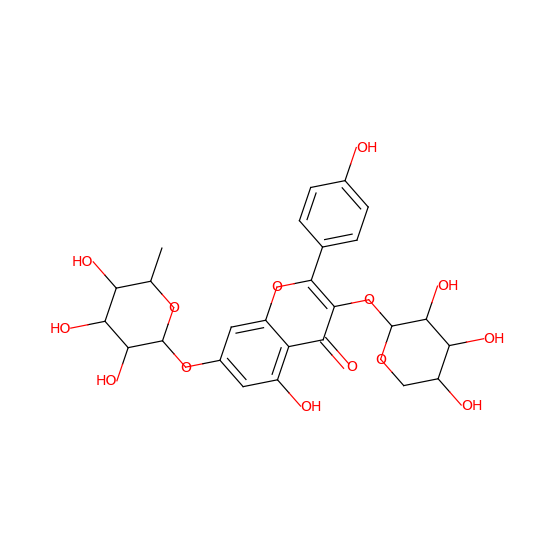

tanimoto: 0.9137577002053389
MS2Query: 0.6941
C[C@@H]1O[C@@H](O[C@@H]2[C@@H](O)[C@@H](O)CO[C@@H]2OC(=O)[C@]23CCC(C)(C)CC2C2=CCC4[C@@]5(C)C[C@H](O)[C@H](O[C@@H]6O[C@H](C(=O)O)[C@@H](O)[C@H](O)[C@H]6O)[C@@](C)(C(=O)O)C5CC[C@@]4(C)[C@]2(C)CC3)[C@H](O)[C@H](O)[C@H]1O[C@@H]1OC[C@@H](O)[C@H](O)[C@H]1O


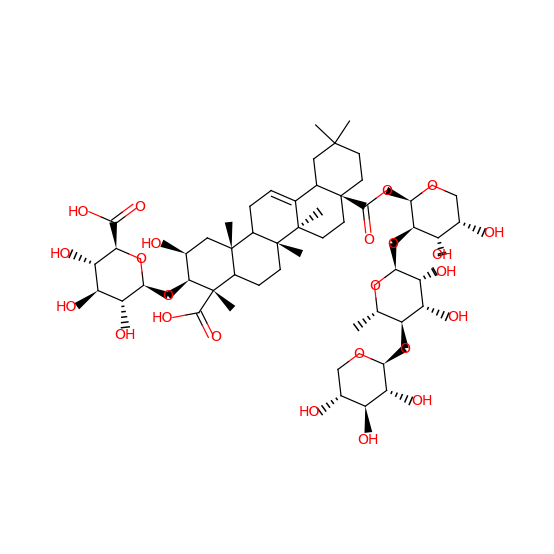

CC(=O)O[C@H]1C[C@@]2(C)C(CC[C@]3(C)C2CC=C2[C@@H]4CC(C)(C)CC[C@]4(C(=O)O[C@@H]4O[C@H](CO[C@@H]5O[C@H](CO)[C@@H](O[C@@H]6O[C@H](C)[C@@H](O)[C@H](O)[C@H]6O)[C@H](O)[C@H]5O)[C@@H](O)[C@H](O)[C@H]4O[C@@H]4O[C@H](CO)[C@@H](O)[C@H](O)[C@H]4O)CC[C@]23C)[C@](C)(C(=O)O)[C@H]1O


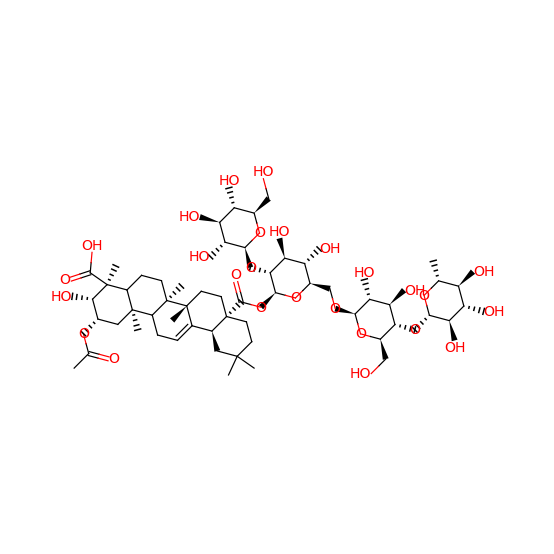

tanimoto: 0.9347368421052632
MS2Query: 0.7155
C[C@H]1O[C@@H](OC(=O)C23CCC(C)(C)CC2C/4=C/CC5C6(C)CC(O)C(O[C@@H]7O[C@H](CO)[C@@H](O)[C@H](O)[C@H]7O)C(C)(C6CCC5(C)C4(CO)CC3)C(O)=O)[C@H](O[C@@H]8O[C@@H](C)[C@H](O[C@@H]9OC[C@@H](O)[C@H](O)[C@H]9O)[C@@H](O)[C@H]8O)[C@@H](O)[C@H]1O


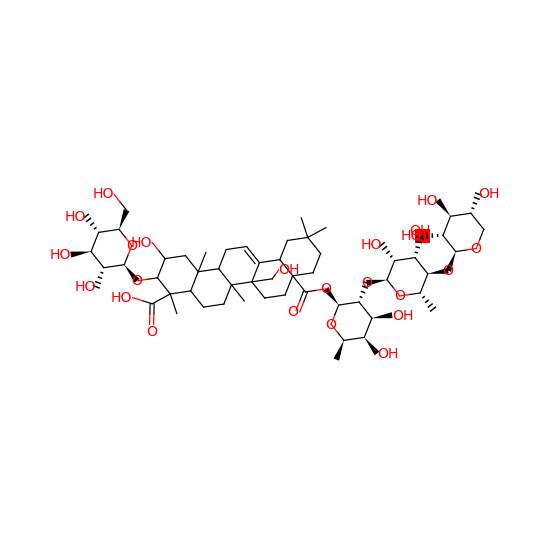

CC(=O)O[C@H]1C[C@@]2(C)C(CC[C@]3(C)C2CC=C2[C@@H]4CC(C)(C)CC[C@]4(C(=O)O[C@@H]4O[C@H](CO[C@@H]5O[C@H](CO)[C@@H](O[C@@H]6O[C@H](C)[C@@H](O)[C@H](O)[C@H]6O)[C@H](O)[C@H]5O)[C@@H](O)[C@H](O)[C@H]4O[C@@H]4O[C@H](CO)[C@@H](O)[C@H](O)[C@H]4O)CC[C@]23C)[C@](C)(C(=O)O)[C@H]1O


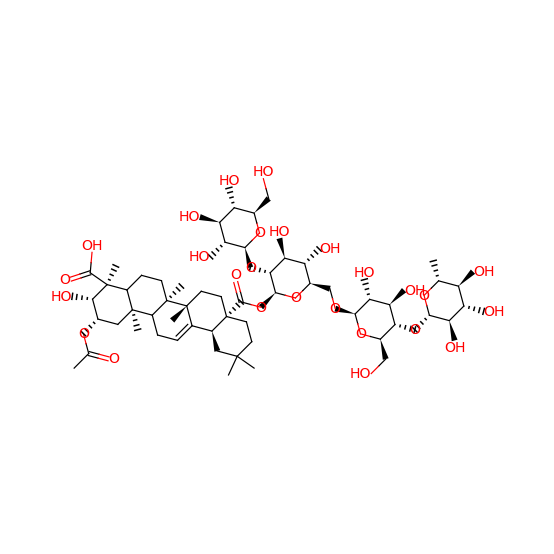

tanimoto: 0.9272844272844273
MS2Query: 0.7419
COC1=C(OC)C=C2C(OC[C@@H]3OC4=C(C=CC5=C4C[C@H](O5)C(C)=C)C(=O)[C@]23O)=C1


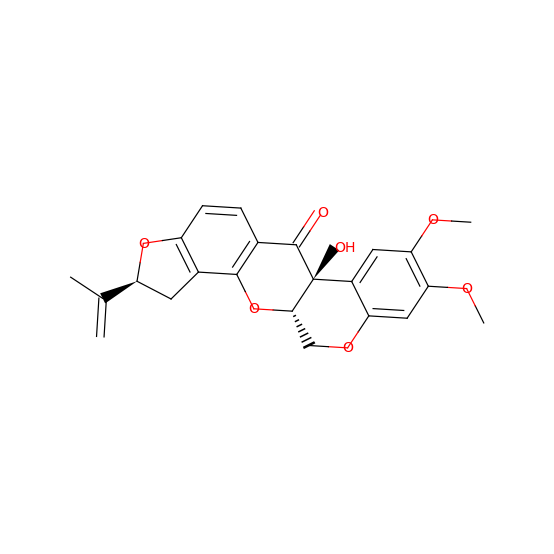

CC1(C=CC2=C(O1)C=CC3=C2O[C@@H]4COC5=CC(=C(C=C5[C@@]4(C3=O)O)OC)OC)C


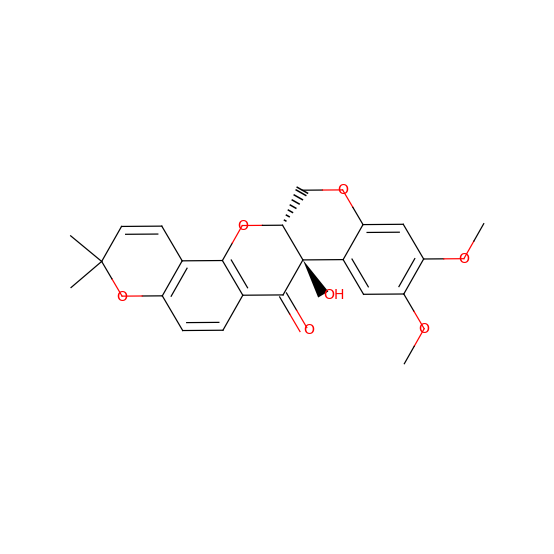

tanimoto: 0.9272844272844273
MS2Query: 0.8666
COC1=C(OC)C=C2C(OC[C@@H]3OC4=C(C=CC5=C4C[C@H](O5)C(C)=C)C(=O)[C@]23O)=C1


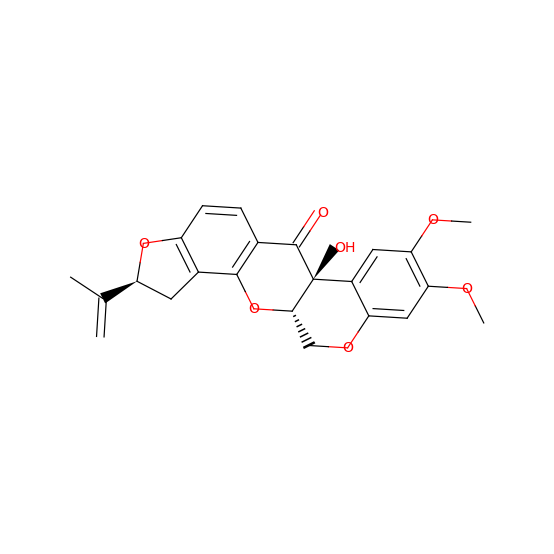

CC1(C=CC2=C(O1)C=CC3=C2O[C@@H]4COC5=CC(=C(C=C5[C@@]4(C3=O)O)OC)OC)C


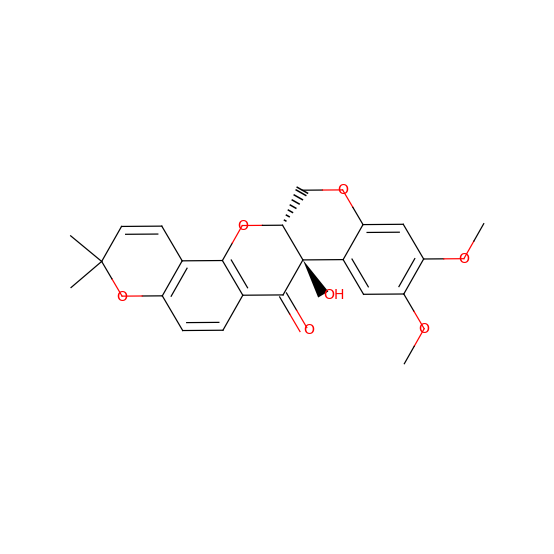

tanimoto: 0.9272844272844273
MS2Query: 0.9279
COC1=C(OC)C=C2C(OC[C@@H]3OC4=C(C=CC5=C4C[C@H](O5)C(C)=C)C(=O)[C@]23O)=C1


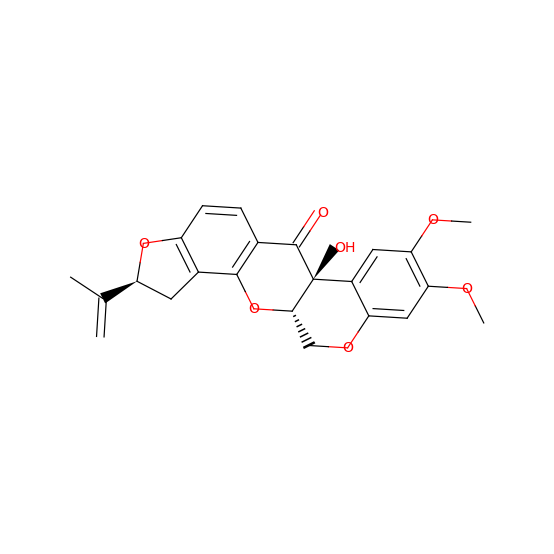

CC1(C=CC2=C(O1)C=CC3=C2O[C@@H]4COC5=CC(=C(C=C5[C@@]4(C3=O)O)OC)OC)C


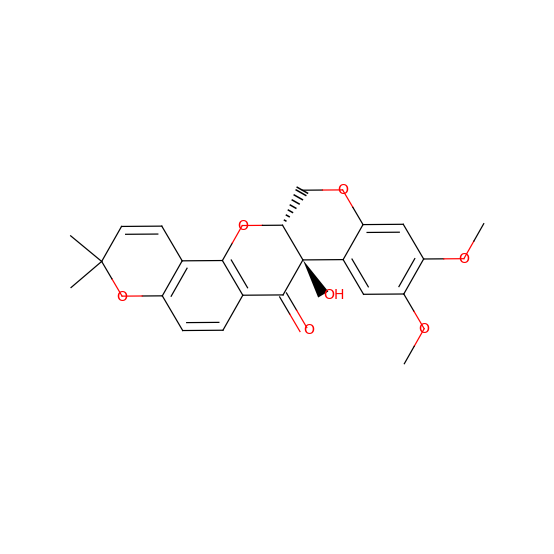

tanimoto: 0.9781491002570694
MS2Query: 0.9441
C[C@@H]1O[C@@H](O[C@@H]2[C@@H](O)[C@H](OCCc3ccc(O)c(O)c3)O[C@H](CO)[C@H]2OC(=O)/C=C/c2ccc(O)c(O)c2)[C@H](O[C@@H]2O[C@H](CO)[C@@H](O)[C@H](O)[C@H]2O)[C@H](O)[C@H]1O


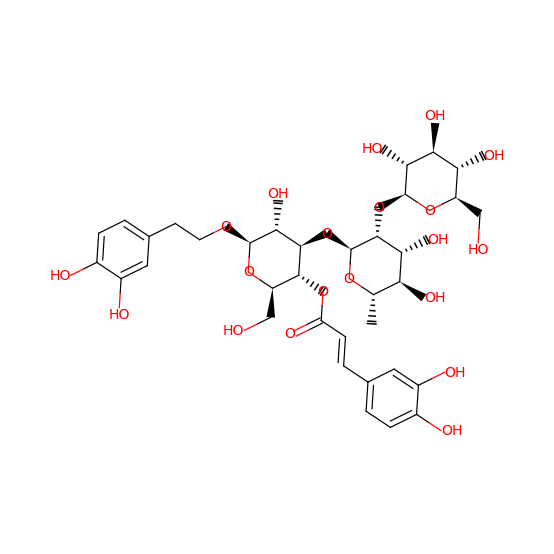

C[C@@H]1O[C@@H](O[C@@H]2[C@@H](O)[C@H](OCCc3ccc(O)c(O)c3)O[C@H](CO[C@@H]3O[C@H](CO)[C@@H](O)[C@H](O)[C@H]3O)[C@H]2OC(=O)/C=C/c2ccc(O)c(O)c2)[C@H](O)[C@H](O)[C@H]1O


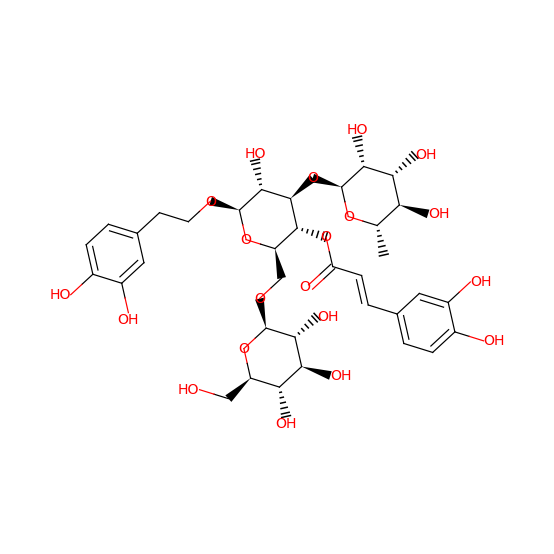

tanimoto: 0.9781491002570694
MS2Query: 0.9318
C[C@@H]1O[C@@H](O[C@@H]2[C@@H](O)[C@H](OCCc3ccc(O)c(O)c3)O[C@H](CO)[C@H]2OC(=O)/C=C/c2ccc(O)c(O)c2)[C@H](O[C@@H]2O[C@H](CO)[C@@H](O)[C@H](O)[C@H]2O)[C@H](O)[C@H]1O


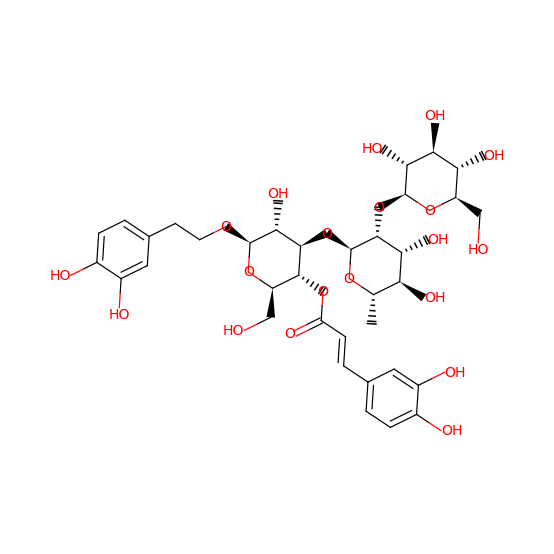

C[C@@H]1O[C@@H](O[C@@H]2[C@@H](O)[C@H](OCCc3ccc(O)c(O)c3)O[C@H](CO[C@@H]3O[C@H](CO)[C@@H](O)[C@H](O)[C@H]3O)[C@H]2OC(=O)/C=C/c2ccc(O)c(O)c2)[C@H](O)[C@H](O)[C@H]1O


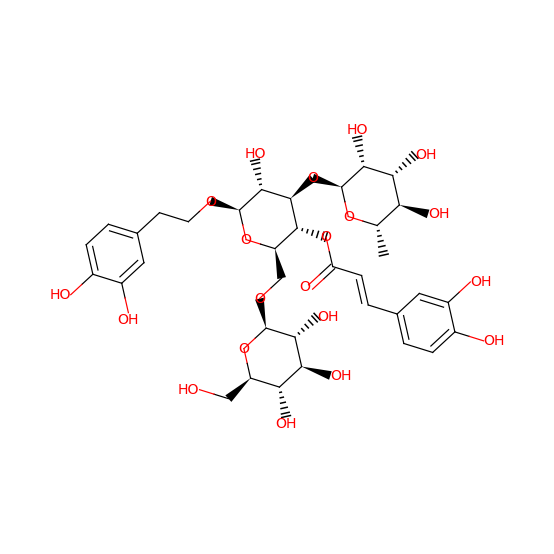

tanimoto: 0.9781491002570694
MS2Query: 0.9242
C[C@@H]1O[C@@H](O[C@@H]2[C@@H](O)[C@H](OCCc3ccc(O)c(O)c3)O[C@H](CO)[C@H]2OC(=O)/C=C/c2ccc(O)c(O)c2)[C@H](O[C@@H]2O[C@H](CO)[C@@H](O)[C@H](O)[C@H]2O)[C@H](O)[C@H]1O


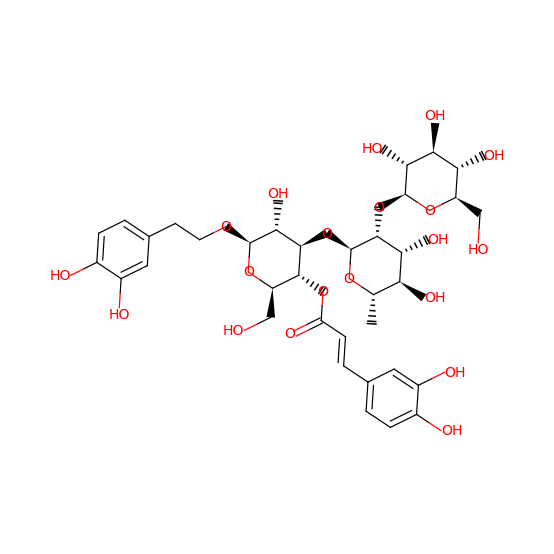

C[C@@H]1O[C@@H](O[C@@H]2[C@@H](O)[C@H](OCCc3ccc(O)c(O)c3)O[C@H](CO[C@@H]3O[C@H](CO)[C@@H](O)[C@H](O)[C@H]3O)[C@H]2OC(=O)/C=C/c2ccc(O)c(O)c2)[C@H](O)[C@H](O)[C@H]1O


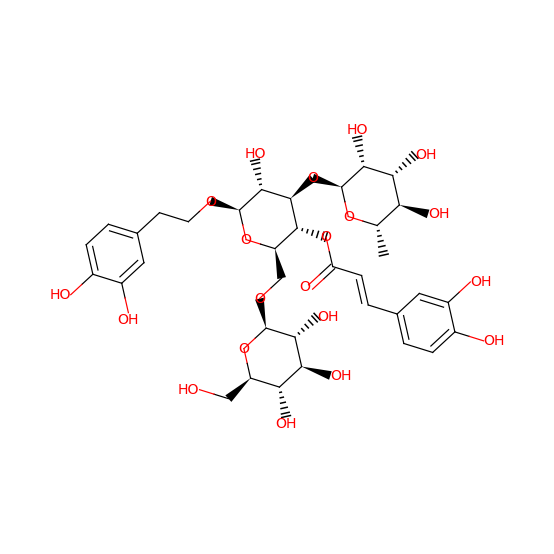

tanimoto: 0.9851337958374629
MS2Query: 0.7419
O=C1CC(c2ccc(O)cc2)Oc2cc(O[C@@H]3O[C@H](CO)[C@@H](O)[C@H](O)[C@H]3O)ccc21


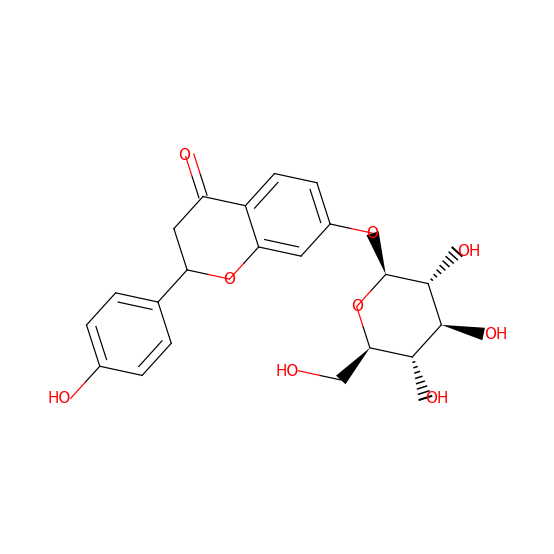

O=C1CC(c2ccc(O[C@@H]3O[C@H](CO)[C@@H](O)[C@H](O)[C@H]3O)cc2)Oc2cc(O)ccc21


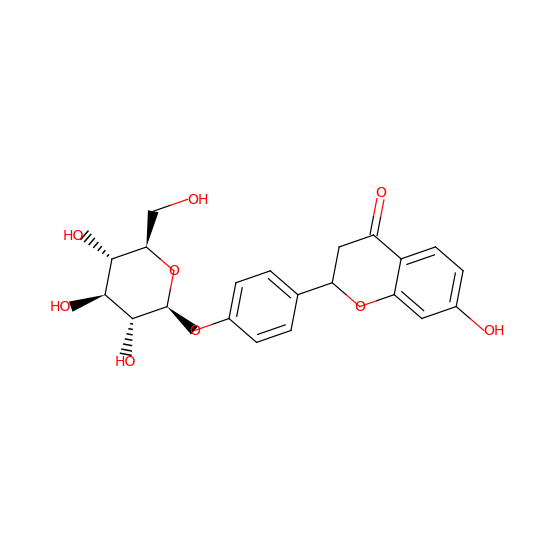

tanimoto: 0.9851337958374629
MS2Query: 0.7419
O=C1CC(c2ccc(O)cc2)Oc2cc(O[C@@H]3O[C@H](CO)[C@@H](O)[C@H](O)[C@H]3O)ccc21


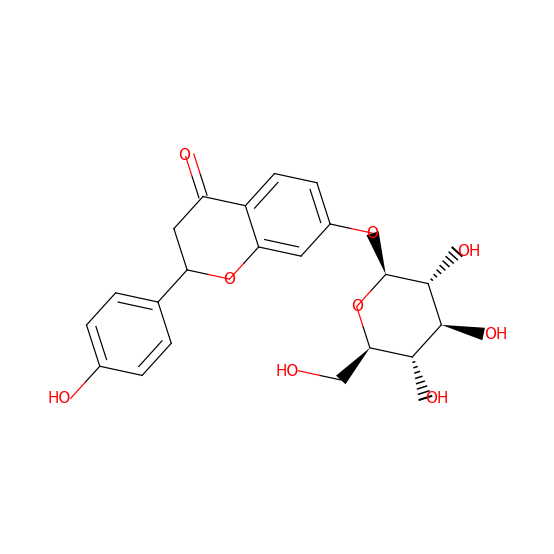

O=C1CC(c2ccc(O[C@@H]3O[C@H](CO)[C@@H](O)[C@H](O)[C@H]3O)cc2)Oc2cc(O)ccc21


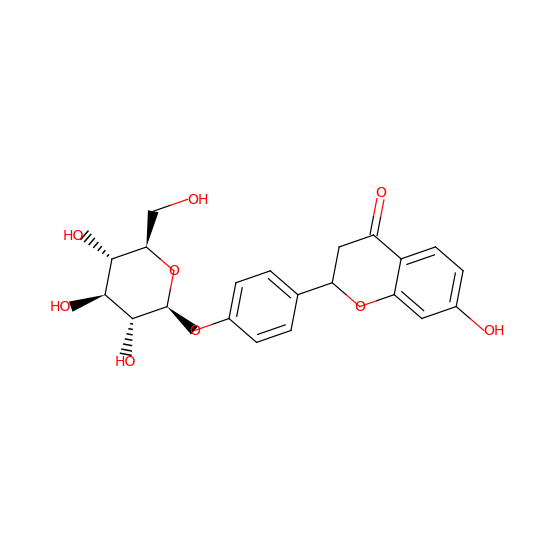

tanimoto: 0.9809523809523809
MS2Query: 0.5284
CS(=O)CCCCCCCN=C=S


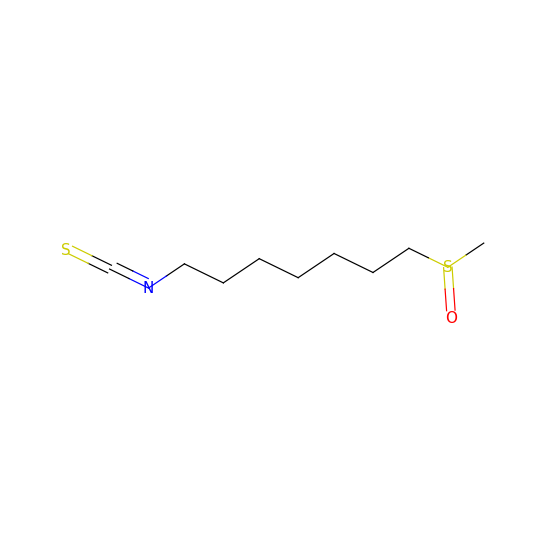

CS(=O)CCCCCCCCN=C=S


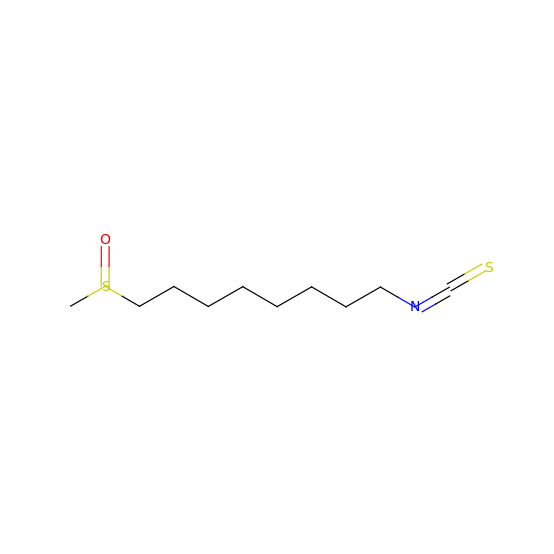

tanimoto: 0.9412568306010929
MS2Query: 0.5292
CN1C2=C(C(=O)N(C1=O)C)NC=N2


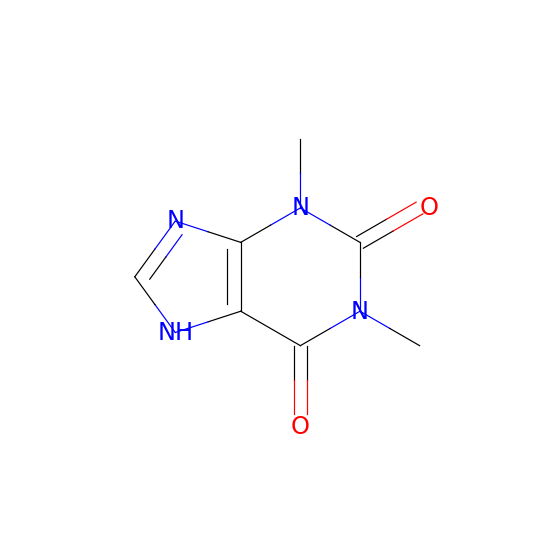

CN1C2=C(C(=O)N(C1=O)C)NC(=O)N2


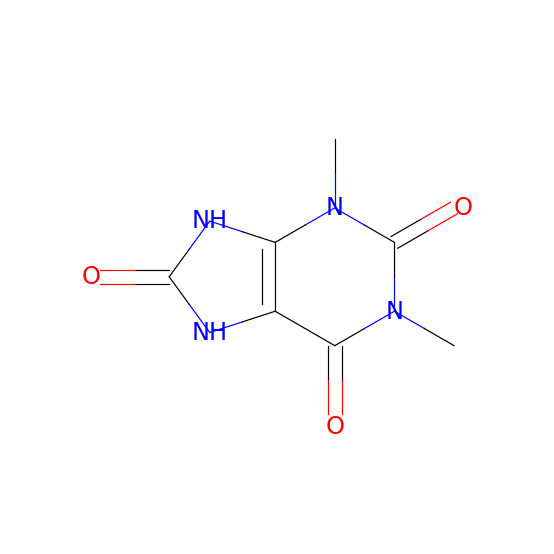

tanimoto: 0.9523809523809523
MS2Query: 0.8674
CC(=O)C1=C2C=CC=CC2=CC2=CC=CC=C12


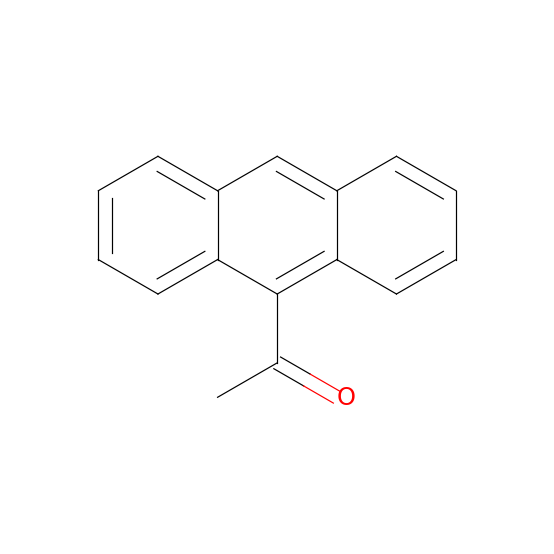

CC(=O)C1=CC2=CC=CC=C2C2=CC=CC=C12


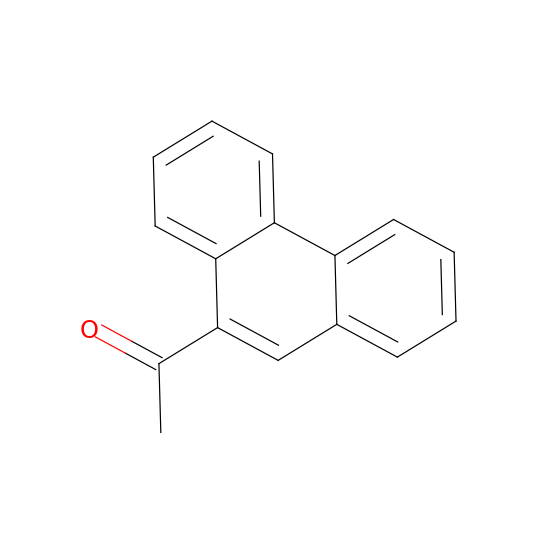

In [26]:
from ms2query.query_from_sqlite_database import get_spectra_from_sqlite

for result in results_ms2query_250:
    spectrum_id_found_analogue = result [0]
    ms2query_score = result[1]
    tanimoto_score = result[2]
    test_spectrum = result [3]
    if tanimoto_score >= 0.9 and tanimoto_score < 1:
        smiles_analogue = get_spectra_from_sqlite(sqlite_file_location, [spectrum_id_found_analogue])[0].get("smiles")
        smiles_test_spectrum = test_spectrum.get("smiles")
        print("tanimoto: " + str(tanimoto_score))
        print("MS2Query: " + str(ms2query_score))
        print(smiles_analogue)
        plot_molecule(smiles_analogue)
        print(smiles_test_spectrum)
        plot_molecule(smiles_test_spectrum)